In [2]:
from file_storage import FileStorage
from urllib.parse import urlparse
from urllib.parse import urldefrag

from urllib.parse import urljoin
from urllib.request import urlopen
from bs4 import BeautifulSoup
import time
from tqdm import tqdm
import numpy as np
import collections
import csv
import matplotlib.pyplot as plt
import random

In [3]:
page_rank = {}
with open('res.txt', "r") as f:
    for line in f:
        key, value = line.strip().split('\t')
        page_rank[key] = float(value)

In [5]:
len(page_rank), page_rank['https://simple.wikipedia.org/wiki/Main_Page']

(142683, 1.0)

In [6]:
cur_keys = set(page_rank.keys())
len(cur_keys)

142683

In [7]:
graph = {key: set() for key in cur_keys}

In [10]:
import multiprocessing.pool as pool

In [11]:
thr_pool = pool.ThreadPool(10)

In [12]:
def build_gr(keys):
    fs = FileStorage('storage', readonly=True)
    for key in tqdm(keys):
        doc = fs.read(key)
        parser = BeautifulSoup(doc)
        for link in parser.findAll('a'):
            next_url = urljoin(key, link.get('href'))
            next_url = urldefrag(next_url).url
            parsed_next = urlparse(next_url)
            if (next_url in cur_keys) and (next_url not in graph[key]):
                graph[key].add(next_url)

In [13]:
one_part_size = len(cur_keys) // 10
list_keys = list(cur_keys)
splitted_keys = []
for i in range(10):
    if i != 9:
        splitted_keys.append(list_keys[i * one_part_size : (i + 1) * one_part_size])
    else:
        splitted_keys.append(list_keys[i * one_part_size :])

In [14]:
len(splitted_keys)

10

In [15]:
sum_len = 0
for kk in splitted_keys:
    sum_len += len(kk)
sum_len

142683

In [16]:
res_future = thr_pool.map_async(build_gr, splitted_keys)

  0%|          | 0/14268 [00:00<?, ?it/s]




  0%|          | 0/14268 [00:00<?, ?it/s]

  0%|          | 0/14268 [00:00<?, ?it/s]


  0%|          | 0/14268 [00:00<?, ?it/s]



  0%|          | 0/14268 [00:00<?, ?it/s]





  0%|          | 0/14268 [00:00<?, ?it/s]






  0%|          | 0/14271 [00:00<?, ?it/s]







  0%|          | 0/14268 [00:00<?, ?it/s]








  0%|          | 1/14268 [00:00<45:02,  5.28it/s]




  0%|          | 1/14268 [00:00<1:13:52,  3.22it/s]



  0%|          | 1/14268 [00:00<1:15:30,  3.15it/s]







  0%|          | 1/14268 [00:00<1:10:45,  3.36it/s]


  0%|          | 1/14268 [00:00<1:27:14,  2.73it/s]








  0%|          | 1/14268 [00:00<1:18:21,  3.03it/s]

  0%|          | 1/14268 [00:00<1:37:03,  2.45it/s]





  0%|          | 2/14268 [00:00<1:03:09,  3.76it/s]




  0%|          | 2/14268 [00:00<1:19:12,  3.00it/s]


  0%|          | 2/14268 [00:00<1:24:47,  2.80it/s]








  0%|          | 2/14268 [00:00<1:12:14,  3.29it/s]



  0%|      

  0%|          | 24/14268 [00:12<2:06:23,  1.88it/s]




  0%|          | 26/14268 [00:12<2:02:00,  1.95it/s]



  0%|          | 26/14268 [00:12<1:53:39,  2.09it/s]





  0%|          | 24/14268 [00:12<2:24:57,  1.64it/s]

  0%|          | 27/14268 [00:12<1:48:38,  2.18it/s]






  0%|          | 24/14271 [00:12<1:56:34,  2.04it/s]








  0%|          | 25/14268 [00:12<1:55:07,  2.06it/s]




  0%|          | 28/14268 [00:13<1:45:38,  2.25it/s]


  0%|          | 25/14268 [00:13<2:01:22,  1.96it/s]



  0%|          | 27/14268 [00:13<1:52:06,  2.12it/s]







  0%|          | 27/14268 [00:13<2:03:29,  1.92it/s]





  0%|          | 27/14268 [00:13<2:05:40,  1.89it/s]






  0%|          | 25/14268 [00:13<2:20:25,  1.69it/s]

  0%|          | 28/14268 [00:13<1:55:08,  2.06it/s]








  0%|          | 29/14268 [00:13<1:55:37,  2.05it/s]


  0%|          | 26/14268 [00:13<2:06:30,  1.88it/s]







  0%|          | 28/14268 [00:13<1:56:40,  2.03it/s]



  0%|          | 28/1426

  0%|          | 50/14268 [00:25<2:08:25,  1.85it/s]







  0%|          | 53/14268 [00:25<2:01:35,  1.95it/s]

  0%|          | 49/14268 [00:25<2:48:29,  1.41it/s]




  0%|          | 50/14268 [00:25<2:10:36,  1.81it/s]






  0%|          | 49/14271 [00:25<1:57:40,  2.01it/s]


  0%|          | 52/14268 [00:25<1:53:45,  2.08it/s]





  0%|          | 53/14268 [00:25<1:44:06,  2.28it/s]








  0%|          | 51/14268 [00:25<2:01:54,  1.94it/s]







  0%|          | 54/14268 [00:25<1:49:15,  2.17it/s]



  0%|          | 49/14268 [00:25<1:59:21,  1.99it/s]

  0%|          | 50/14268 [00:26<2:24:32,  1.64it/s]


  0%|          | 53/14268 [00:26<1:44:36,  2.26it/s]





  0%|          | 54/14268 [00:26<1:38:51,  2.40it/s]




  0%|          | 51/14268 [00:26<2:03:49,  1.91it/s]






  0%|          | 50/14271 [00:26<1:56:57,  2.03it/s]







  0%|          | 52/14268 [00:26<1:49:30,  2.16it/s]








  0%|          | 50/14268 [00:26<1:51:33,  2.12it/s]

  0%|          | 51/14

In [19]:
res_future.ready()

  4%|▍         | 642/14268 [05:35<1:59:56,  1.89it/s]

False






  5%|▍         | 644/14268 [05:35<1:46:36,  2.13it/s]



  5%|▍         | 665/14268 [05:35<1:46:24,  2.13it/s]


  5%|▍         | 647/14268 [05:35<2:01:59,  1.86it/s]

  4%|▍         | 641/14268 [05:36<1:59:03,  1.91it/s]






  5%|▍         | 650/14271 [05:36<1:37:07,  2.34it/s]




  5%|▍         | 662/14268 [05:36<1:31:38,  2.47it/s]








  5%|▍         | 643/14268 [05:36<1:51:25,  2.04it/s]





  5%|▍         | 645/14268 [05:36<1:54:54,  1.98it/s]


  5%|▍         | 648/14268 [05:36<1:58:44,  1.91it/s]



  5%|▍         | 656/14268 [05:36<1:53:45,  1.99it/s]







  5%|▍         | 657/14268 [05:36<2:12:19,  1.71it/s]

  4%|▍         | 642/14268 [05:36<2:03:34,  1.84it/s]






  5%|▍         | 651/14271 [05:36<1:47:20,  2.11it/s]




  5%|▍         | 667/14268 [05:36<1:42:11,  2.22it/s]








  5%|▍         | 644/14268 [05:36<2:02:41,  1.85it/s]



  5%|▍         | 657/14268 [05:36<1:47:37,  2.11it/s]







  5%|▍         | 658/14268 [05:36<1:59:17,  1.90it/s]

  5%|▍

  5%|▍         | 680/14268 [05:48<1:51:14,  2.04it/s]

  5%|▍         | 665/14268 [05:48<1:53:45,  1.99it/s]




  5%|▍         | 687/14268 [05:48<1:56:41,  1.94it/s]








  5%|▍         | 669/14268 [05:48<1:59:57,  1.89it/s]


  5%|▍         | 668/14268 [05:48<2:47:09,  1.36it/s]



  5%|▍         | 669/14268 [05:49<1:53:09,  2.00it/s]






  5%|▍         | 677/14271 [05:49<1:47:46,  2.10it/s]





  5%|▍         | 682/14268 [05:49<1:55:53,  1.95it/s]







  5%|▍         | 681/14268 [05:49<1:51:52,  2.02it/s]

  5%|▍         | 666/14268 [05:49<1:57:27,  1.93it/s]




  5%|▍         | 688/14268 [05:49<1:56:22,  1.94it/s]



  5%|▍         | 683/14268 [05:49<1:42:20,  2.21it/s]








  5%|▍         | 692/14268 [05:49<1:52:15,  2.02it/s]


  5%|▍         | 669/14268 [05:49<2:46:06,  1.36it/s]





  5%|▍         | 670/14268 [05:49<2:04:12,  1.82it/s]






  5%|▍         | 678/14271 [05:49<1:59:16,  1.90it/s]







  5%|▍         | 682/14268 [05:49<1:59:51,  1.89it/s]




  5%|▍

  5%|▍         | 680/14268 [05:55<2:10:48,  1.73it/s]






  5%|▍         | 680/14268 [05:55<2:02:23,  1.85it/s]



  5%|▍         | 695/14268 [05:55<1:52:42,  2.01it/s]

  5%|▍         | 678/14268 [05:55<1:48:34,  2.09it/s]





  5%|▍         | 695/14268 [05:55<1:49:18,  2.07it/s]







  5%|▍         | 693/14268 [05:55<2:04:40,  1.81it/s]




  5%|▍         | 699/14268 [05:55<2:14:24,  1.68it/s]








  5%|▍         | 681/14268 [05:55<2:59:05,  1.26it/s]






  5%|▍         | 681/14268 [05:55<1:57:26,  1.93it/s]



  5%|▍         | 696/14268 [05:55<1:52:46,  2.01it/s]

  5%|▍         | 679/14268 [05:55<1:47:33,  2.11it/s]





  5%|▍         | 696/14268 [05:55<1:46:06,  2.13it/s]


  5%|▍         | 681/14268 [05:56<2:25:43,  1.55it/s]




  5%|▍         | 700/14268 [05:56<2:02:23,  1.85it/s]







  5%|▍         | 707/14268 [05:56<1:38:10,  2.30it/s]






  5%|▍         | 682/14268 [05:56<1:45:49,  2.14it/s]








  5%|▍         | 682/14268 [05:56<2:39:13,  1.42it/s]




  

  5%|▌         | 720/14268 [06:07<1:53:17,  1.99it/s]







  5%|▍         | 705/14268 [06:07<1:48:20,  2.09it/s]






  5%|▌         | 714/14271 [06:07<2:45:48,  1.36it/s]


  5%|▍         | 704/14268 [06:07<1:57:33,  1.92it/s]




  5%|▌         | 725/14268 [06:07<1:44:26,  2.16it/s]








  5%|▍         | 705/14268 [06:07<2:05:43,  1.80it/s]

  5%|▍         | 704/14268 [06:07<1:47:27,  2.10it/s]





  5%|▌         | 720/14268 [06:07<1:42:44,  2.20it/s]







  5%|▌         | 731/14268 [06:08<1:49:48,  2.05it/s]



  5%|▍         | 706/14268 [06:08<1:41:39,  2.22it/s]






  5%|▌         | 715/14271 [06:08<2:18:43,  1.63it/s]








  5%|▍         | 706/14268 [06:08<1:48:36,  2.08it/s]

  5%|▍         | 705/14268 [06:08<1:32:41,  2.44it/s]




  5%|▌         | 726/14268 [06:08<1:44:17,  2.16it/s]


  5%|▍         | 707/14268 [06:08<1:32:14,  2.45it/s]



  5%|▌         | 732/14268 [06:08<1:54:01,  1.98it/s]





  5%|▌         | 721/14268 [06:08<1:52:16,  2.01it/s]







  5

  5%|▌         | 754/14268 [06:20<1:52:40,  2.00it/s]





  5%|▌         | 744/14268 [06:20<1:54:02,  1.98it/s]


  5%|▌         | 726/14268 [06:20<2:48:27,  1.34it/s]



  5%|▌         | 744/14268 [06:20<2:15:16,  1.67it/s]






  5%|▌         | 739/14271 [06:20<2:10:20,  1.73it/s]








  5%|▌         | 732/14268 [06:20<2:20:20,  1.61it/s]




  5%|▌         | 752/14268 [06:20<1:55:32,  1.95it/s]







  5%|▌         | 743/14268 [06:20<2:20:16,  1.61it/s]

  5%|▌         | 731/14268 [06:20<1:55:39,  1.95it/s]





  5%|▌         | 745/14268 [06:21<1:52:00,  2.01it/s]


  5%|▌         | 727/14268 [06:21<2:25:21,  1.55it/s]



  5%|▌         | 745/14268 [06:21<2:01:07,  1.86it/s]








  5%|▌         | 733/14268 [06:21<2:01:12,  1.86it/s]




  5%|▌         | 755/14268 [06:21<2:09:09,  1.74it/s]







  5%|▌         | 744/14268 [06:21<2:17:21,  1.64it/s]

  5%|▌         | 729/14268 [06:21<2:07:03,  1.78it/s]




  5%|▌         | 754/14268 [06:21<1:33:38,  2.41it/s]


  5%|▌    

  5%|▌         | 769/14268 [06:33<2:01:19,  1.85it/s]








  5%|▌         | 757/14268 [06:33<2:08:02,  1.76it/s]





  5%|▌         | 768/14268 [06:33<1:47:23,  2.10it/s]




  5%|▌         | 776/14268 [06:34<1:47:20,  2.09it/s]







  5%|▌         | 780/14268 [06:34<2:25:20,  1.55it/s]






  5%|▌         | 764/14271 [06:34<2:06:10,  1.78it/s]



  5%|▌         | 756/14268 [06:34<2:03:07,  1.83it/s]


  5%|▌         | 751/14268 [06:34<2:24:35,  1.56it/s]








  5%|▌         | 758/14268 [06:34<2:04:52,  1.80it/s]




  5%|▌         | 777/14268 [06:34<1:45:04,  2.14it/s]







  5%|▌         | 769/14268 [06:34<1:57:28,  1.92it/s]

  5%|▌         | 753/14268 [06:34<2:17:58,  1.63it/s]





  5%|▌         | 781/14268 [06:34<2:11:21,  1.71it/s]



  5%|▌         | 771/14268 [06:34<1:46:26,  2.11it/s]


  5%|▌         | 752/14268 [06:34<2:03:53,  1.82it/s]






  5%|▌         | 757/14268 [06:34<1:56:59,  1.92it/s]

  5%|▌         | 754/14268 [06:34<1:58:23,  1.90it/s]








  

  5%|▌         | 781/14268 [06:47<1:37:02,  2.32it/s]







  6%|▌         | 793/14268 [06:47<1:53:23,  1.98it/s]




  6%|▌         | 805/14268 [06:47<1:38:35,  2.28it/s]



  6%|▌         | 794/14268 [06:47<1:53:41,  1.98it/s]








  5%|▌         | 783/14268 [06:47<1:37:59,  2.29it/s]





  6%|▌         | 793/14268 [06:47<1:39:06,  2.27it/s]






  6%|▌         | 788/14271 [06:47<1:59:58,  1.87it/s]

  5%|▌         | 782/14268 [06:47<1:34:29,  2.38it/s]







  6%|▌         | 794/14268 [06:47<1:46:37,  2.11it/s]




  6%|▌         | 802/14268 [06:47<1:34:53,  2.36it/s]



  6%|▌         | 795/14268 [06:47<1:53:55,  1.97it/s]





  6%|▌         | 806/14268 [06:47<1:51:23,  2.01it/s]








  5%|▌         | 784/14268 [06:47<1:49:59,  2.04it/s]


  5%|▌         | 777/14268 [06:47<2:56:33,  1.27it/s]







  5%|▌         | 783/14268 [06:48<1:52:04,  2.01it/s]






  6%|▌         | 789/14271 [06:48<2:18:03,  1.63it/s]

  5%|▌         | 777/14268 [06:48<2:08:26,  1.75it/s]




 

  6%|▌         | 832/14268 [07:00<1:48:09,  2.07it/s]






  6%|▌         | 812/14271 [07:00<2:06:37,  1.77it/s]

  6%|▌         | 799/14268 [07:00<2:02:41,  1.83it/s]


  6%|▌         | 801/14268 [07:01<1:52:18,  2.00it/s]



  6%|▌         | 820/14268 [07:01<1:54:28,  1.96it/s]




  6%|▌         | 826/14268 [07:01<1:44:40,  2.14it/s]







  6%|▌         | 818/14268 [07:01<1:50:32,  2.03it/s]








  6%|▌         | 806/14268 [07:01<1:49:13,  2.05it/s]





  6%|▌         | 820/14268 [07:01<1:45:36,  2.12it/s]

  6%|▌         | 833/14268 [07:01<1:47:34,  2.08it/s]






  6%|▌         | 813/14271 [07:01<1:56:52,  1.92it/s]




  6%|▌         | 827/14268 [07:01<1:32:53,  2.41it/s]







  6%|▌         | 819/14268 [07:01<1:43:32,  2.16it/s]





  6%|▌         | 821/14268 [07:01<1:36:49,  2.31it/s]


  6%|▌         | 802/14268 [07:01<2:02:49,  1.83it/s]



  6%|▌         | 807/14268 [07:01<1:57:32,  1.91it/s]

  6%|▌         | 801/14268 [07:01<1:52:33,  1.99it/s]




  6%|▌       

  6%|▌         | 832/14268 [07:13<1:43:03,  2.17it/s]







  6%|▌         | 844/14268 [07:13<1:59:44,  1.87it/s]


  6%|▌         | 824/14268 [07:14<1:40:12,  2.24it/s]

  6%|▌         | 825/14268 [07:14<1:38:27,  2.28it/s]




  6%|▌         | 830/14268 [07:14<1:52:32,  1.99it/s]





  6%|▌         | 843/14268 [07:14<1:55:28,  1.94it/s]








  6%|▌         | 833/14268 [07:14<1:35:53,  2.33it/s]



  6%|▌         | 846/14268 [07:14<1:44:11,  2.15it/s]






  6%|▌         | 838/14271 [07:14<1:49:02,  2.05it/s]







  6%|▌         | 845/14268 [07:14<1:55:02,  1.94it/s]




  6%|▌         | 858/14268 [07:14<2:06:16,  1.77it/s]

  6%|▌         | 831/14268 [07:14<1:52:56,  1.98it/s]





  6%|▌         | 844/14268 [07:14<1:55:53,  1.93it/s]


  6%|▌         | 825/14268 [07:14<2:03:05,  1.82it/s]



  6%|▌         | 847/14268 [07:14<1:51:26,  2.01it/s]








  6%|▌         | 834/14268 [07:14<1:49:45,  2.04it/s]







  6%|▌         | 846/14268 [07:14<1:58:03,  1.89it/s]




  6%|

  6%|▌         | 858/14268 [07:26<1:54:56,  1.94it/s]





  6%|▌         | 868/14268 [07:26<2:03:34,  1.81it/s]



  6%|▌         | 871/14268 [07:26<2:02:01,  1.83it/s]


  6%|▌         | 845/14268 [07:26<2:30:25,  1.49it/s]






  6%|▌         | 862/14271 [07:26<2:07:24,  1.75it/s]







  6%|▌         | 886/14268 [07:27<1:43:27,  2.16it/s]




  6%|▌         | 876/14268 [07:27<2:23:59,  1.55it/s]





  6%|▌         | 869/14268 [07:27<1:45:04,  2.13it/s]

  6%|▌         | 851/14268 [07:27<2:07:12,  1.76it/s]








  6%|▌         | 859/14268 [07:27<2:06:09,  1.77it/s]



  6%|▌         | 872/14268 [07:27<1:59:04,  1.87it/s]






  6%|▌         | 863/14271 [07:27<2:03:04,  1.82it/s]


  6%|▌         | 887/14268 [07:27<1:47:01,  2.08it/s]







  6%|▌         | 870/14268 [07:27<2:18:15,  1.62it/s]





  6%|▌         | 870/14268 [07:27<1:57:52,  1.89it/s]



  6%|▌         | 873/14268 [07:27<1:52:09,  1.99it/s]




  6%|▌         | 877/14268 [07:27<2:32:07,  1.47it/s]








  6

  6%|▋         | 897/14268 [07:40<1:53:41,  1.96it/s]








  6%|▌         | 881/14268 [07:40<2:40:42,  1.39it/s]





  6%|▋         | 894/14268 [07:40<2:07:55,  1.74it/s]







  6%|▋         | 894/14268 [07:40<2:01:59,  1.83it/s]

  6%|▌         | 874/14268 [07:40<2:10:39,  1.71it/s]


  6%|▌         | 869/14268 [07:40<2:07:21,  1.75it/s]






  6%|▌         | 882/14268 [07:40<2:02:43,  1.82it/s]







  6%|▋         | 895/14268 [07:40<1:47:44,  2.07it/s]





  6%|▋         | 895/14268 [07:40<1:58:27,  1.88it/s]




  6%|▋         | 901/14268 [07:41<2:03:27,  1.80it/s]



  6%|▋         | 898/14268 [07:41<1:54:33,  1.95it/s]

  6%|▋         | 913/14268 [07:41<2:09:15,  1.72it/s]


  6%|▌         | 870/14268 [07:41<2:03:50,  1.80it/s]






  6%|▌         | 883/14268 [07:41<2:00:09,  1.86it/s]




  6%|▋         | 914/14268 [07:41<1:54:41,  1.94it/s]



  6%|▋         | 899/14268 [07:41<1:50:15,  2.02it/s]







  6%|▋         | 896/14268 [07:41<1:54:15,  1.95it/s]





  6%|▋

  6%|▋         | 927/14268 [07:47<1:35:20,  2.33it/s]





  6%|▋         | 907/14268 [07:47<1:53:31,  1.96it/s]

  6%|▋         | 894/14268 [07:47<1:55:07,  1.94it/s]


  6%|▌         | 881/14268 [07:47<1:55:51,  1.93it/s]








  6%|▋         | 892/14268 [07:47<1:57:34,  1.90it/s]



  6%|▋         | 910/14268 [07:47<1:55:54,  1.92it/s]




  6%|▋         | 913/14268 [07:47<1:52:42,  1.97it/s]







  6%|▋         | 909/14268 [07:47<1:39:31,  2.24it/s]





  6%|▋         | 895/14268 [07:47<1:44:35,  2.13it/s]



  6%|▋         | 911/14268 [07:47<1:40:56,  2.21it/s]

  6%|▌         | 887/14268 [07:47<1:51:32,  2.00it/s]








  6%|▋         | 893/14268 [07:47<1:52:31,  1.98it/s]




  6%|▋         | 914/14268 [07:47<1:45:27,  2.11it/s]


  6%|▌         | 882/14268 [07:47<1:57:14,  1.90it/s]






  6%|▋         | 901/14271 [07:47<2:08:45,  1.73it/s]







  6%|▋         | 896/14268 [07:48<1:46:50,  2.09it/s]


  6%|▌         | 883/14268 [07:48<1:57:59,  1.89it/s]





  6%|▋   

  6%|▋         | 927/14271 [08:00<1:57:03,  1.90it/s]








  6%|▋         | 916/14268 [08:00<2:04:09,  1.79it/s]







  6%|▋         | 919/14268 [08:00<1:49:32,  2.03it/s]


  6%|▋         | 906/14268 [08:00<2:31:02,  1.47it/s]

  6%|▋         | 910/14268 [08:00<2:26:02,  1.52it/s]





  7%|▋         | 931/14268 [08:00<2:18:23,  1.61it/s]



  7%|▋         | 935/14268 [08:00<1:50:57,  2.00it/s]






  7%|▋         | 955/14268 [08:00<1:49:14,  2.03it/s]




  7%|▋         | 938/14268 [08:00<2:25:56,  1.52it/s]







  7%|▋         | 934/14268 [08:00<2:08:48,  1.73it/s]








  6%|▋         | 917/14268 [08:00<2:00:12,  1.85it/s]


  6%|▋         | 920/14268 [08:01<1:49:55,  2.02it/s]





  7%|▋         | 932/14268 [08:01<2:04:44,  1.78it/s]



  7%|▋         | 936/14268 [08:01<1:46:39,  2.08it/s]

  7%|▋         | 956/14268 [08:01<1:49:01,  2.03it/s]






  7%|▋         | 929/14271 [08:01<1:52:21,  1.98it/s]


  6%|▋         | 908/14268 [08:01<1:59:25,  1.86it/s]




  7%|▋  

  7%|▋         | 956/14268 [08:12<1:48:51,  2.04it/s]

  7%|▋         | 932/14268 [08:12<2:39:44,  1.39it/s]




  7%|▋         | 961/14268 [08:12<1:49:55,  2.02it/s]






  7%|▋         | 954/14271 [08:12<1:30:52,  2.44it/s]


  7%|▋         | 979/14268 [08:12<1:37:27,  2.27it/s]



  7%|▋         | 946/14268 [08:13<1:39:07,  2.24it/s]








  7%|▋         | 941/14268 [08:13<1:48:13,  2.05it/s]





  7%|▋         | 957/14268 [08:13<1:47:26,  2.06it/s]







  7%|▋         | 958/14268 [08:13<2:02:45,  1.81it/s]






  7%|▋         | 955/14271 [08:13<1:24:51,  2.62it/s]




  7%|▋         | 962/14268 [08:13<1:41:12,  2.19it/s]

  7%|▋         | 933/14268 [08:13<2:19:38,  1.59it/s]


  7%|▋         | 929/14268 [08:13<2:05:44,  1.77it/s]



  7%|▋         | 947/14268 [08:13<1:40:48,  2.20it/s]





  7%|▋         | 958/14268 [08:13<1:40:27,  2.21it/s]

  7%|▋         | 934/14268 [08:13<2:00:10,  1.85it/s]








  7%|▋         | 942/14268 [08:13<1:49:36,  2.03it/s]







  7%|▋   

  7%|▋         | 987/14268 [08:25<1:36:38,  2.29it/s]







  7%|▋         | 1004/14268 [08:25<1:28:38,  2.49it/s][A


  7%|▋         | 952/14268 [08:25<1:37:16,  2.28it/s]








  7%|▋         | 966/14268 [08:25<1:42:47,  2.16it/s]






  7%|▋         | 967/14268 [08:25<2:07:52,  1.73it/s]

  7%|▋         | 957/14268 [08:25<2:00:02,  1.85it/s]




  7%|▋         | 988/14268 [08:26<1:31:32,  2.42it/s]







  7%|▋         | 983/14268 [08:26<1:44:56,  2.11it/s]



  7%|▋         | 988/14268 [08:26<1:49:29,  2.02it/s]








  7%|▋         | 967/14268 [08:26<1:37:57,  2.26it/s]


  7%|▋         | 953/14268 [08:26<1:52:30,  1.97it/s]

  7%|▋         | 968/14268 [08:26<2:03:44,  1.79it/s]






  7%|▋         | 981/14271 [08:26<1:49:23,  2.02it/s]




  7%|▋         | 989/14268 [08:26<1:39:19,  2.23it/s]







  7%|▋         | 984/14268 [08:26<1:44:49,  2.11it/s]





  7%|▋         | 981/14268 [08:26<2:44:01,  1.35it/s]



  7%|▋         | 989/14268 [08:26<2:04:19,  1.78it/s]







  7%|▋         | 989/14268 [08:38<2:13:48,  1.65it/s]






  7%|▋         | 1004/14271 [08:38<1:46:11,  2.08it/s]

  7%|▋         | 983/14268 [08:38<1:33:59,  2.36it/s]


  7%|▋         | 979/14268 [08:38<1:38:19,  2.25it/s]




  7%|▋         | 1029/14268 [08:39<1:32:38,  2.38it/s][A



  7%|▋         | 1013/14268 [08:39<1:52:26,  1.96it/s]








  7%|▋         | 990/14268 [08:39<1:56:42,  1.90it/s]





  7%|▋         | 1004/14268 [08:39<1:46:47,  2.07it/s]







  7%|▋         | 1007/14268 [08:39<1:49:35,  2.02it/s]






  7%|▋         | 1005/14271 [08:39<1:40:48,  2.19it/s]

  7%|▋         | 984/14268 [08:39<1:32:54,  2.38it/s]


  7%|▋         | 980/14268 [08:39<1:39:18,  2.23it/s]




  7%|▋         | 995/14268 [08:39<1:42:14,  2.16it/s]



  7%|▋         | 1014/14268 [08:39<1:41:58,  2.17it/s]








  7%|▋         | 1030/14268 [08:39<1:45:53,  2.08it/s][A

  7%|▋         | 985/14268 [08:39<1:38:30,  2.25it/s]





  7%|▋         | 1005/14268 [08:39<1:56:04,  1.90it/s]





  7%|▋         | 1013/14268 [08:51<1:51:36,  1.98it/s]







  7%|▋         | 1031/14268 [08:51<1:41:38,  2.17it/s]



  7%|▋         | 1037/14268 [08:51<1:44:43,  2.11it/s]




  7%|▋         | 1018/14268 [08:51<1:51:57,  1.97it/s]






  7%|▋         | 1029/14271 [08:51<1:33:50,  2.35it/s]


  7%|▋         | 1003/14268 [08:51<1:52:39,  1.96it/s]





  7%|▋         | 1029/14268 [08:51<2:04:47,  1.77it/s]








  7%|▋         | 1014/14268 [08:51<1:51:39,  1.98it/s]



  7%|▋         | 1053/14268 [08:52<2:11:28,  1.68it/s]

  7%|▋         | 1008/14268 [08:52<1:53:17,  1.95it/s]




  7%|▋         | 1039/14268 [08:52<2:01:22,  1.82it/s]







  7%|▋         | 1019/14268 [08:52<1:57:23,  1.88it/s]





  7%|▋         | 1030/14268 [08:52<1:48:58,  2.02it/s]






  7%|▋         | 1030/14271 [08:52<1:42:40,  2.15it/s]


  7%|▋         | 1004/14268 [08:52<1:55:44,  1.91it/s]








  7%|▋         | 1054/14268 [08:52<1:58:14,  1.86it/s]




  7%|▋         | 1040/14268 [08:52<1:49:08,  

  7%|▋         | 1052/14271 [09:04<1:45:59,  2.08it/s]

  7%|▋         | 1030/14268 [09:04<2:06:55,  1.74it/s]








  7%|▋         | 1038/14268 [09:04<1:54:23,  1.93it/s]



  8%|▊         | 1079/14268 [09:04<1:42:11,  2.15it/s]







  7%|▋         | 1055/14268 [09:04<1:51:27,  1.98it/s]




  7%|▋         | 1064/14268 [09:04<1:48:23,  2.03it/s]


  7%|▋         | 1027/14268 [09:04<1:46:03,  2.08it/s]





  7%|▋         | 1043/14268 [09:04<2:07:53,  1.72it/s]






  7%|▋         | 1053/14271 [09:04<1:54:00,  1.93it/s]








  7%|▋         | 1039/14268 [09:04<1:56:17,  1.90it/s]

  8%|▊         | 1080/14268 [09:05<1:46:24,  2.07it/s]



  7%|▋         | 1063/14268 [09:05<1:53:27,  1.94it/s]





  7%|▋         | 1056/14268 [09:05<1:39:50,  2.21it/s]


  7%|▋         | 1044/14268 [09:05<1:54:07,  1.93it/s]




  7%|▋         | 1065/14268 [09:05<2:03:09,  1.79it/s]






  7%|▋         | 1054/14271 [09:05<1:46:24,  2.07it/s]







  7%|▋         | 1056/14268 [09:05<2:12:05,  1.6

  8%|▊         | 1108/14268 [09:17<1:50:00,  1.99it/s]


  7%|▋         | 1050/14268 [09:17<2:09:26,  1.70it/s]






  8%|▊         | 1076/14271 [09:17<2:08:40,  1.71it/s]








  7%|▋         | 1063/14268 [09:17<2:03:31,  1.78it/s]







  8%|▊         | 1079/14268 [09:17<1:52:27,  1.95it/s]





  7%|▋         | 1066/14268 [09:18<2:11:24,  1.67it/s]



  8%|▊         | 1087/14268 [09:18<2:04:47,  1.76it/s]




  8%|▊         | 1109/14268 [09:18<1:50:05,  1.99it/s]


  7%|▋         | 1051/14268 [09:18<2:02:45,  1.79it/s]






  8%|▊         | 1077/14271 [09:18<2:01:24,  1.81it/s]

  7%|▋         | 1056/14268 [09:18<2:13:30,  1.65it/s]








  7%|▋         | 1064/14268 [09:18<1:58:32,  1.86it/s]







  8%|▊         | 1080/14268 [09:18<1:46:11,  2.07it/s]





  7%|▋         | 1067/14268 [09:18<2:02:13,  1.80it/s]



  8%|▊         | 1088/14268 [09:18<1:56:30,  1.89it/s]


  7%|▋         | 1052/14268 [09:18<1:47:28,  2.05it/s]

  7%|▋         | 1057/14268 [09:18<1:53:30,  1.94i

  8%|▊         | 1112/14268 [09:30<2:01:20,  1.81it/s]





  8%|▊         | 1090/14268 [09:30<1:44:17,  2.11it/s]






  8%|▊         | 1102/14271 [09:30<1:46:48,  2.06it/s]



  8%|▊         | 1110/14268 [09:31<1:59:14,  1.84it/s]


  8%|▊         | 1074/14268 [09:31<1:59:49,  1.84it/s]








  8%|▊         | 1087/14268 [09:31<2:01:51,  1.80it/s]

  8%|▊         | 1136/14268 [09:31<1:47:00,  2.05it/s]





  8%|▊         | 1107/14268 [09:31<1:45:08,  2.09it/s]







  8%|▊         | 1104/14268 [09:31<2:03:15,  1.78it/s]



  8%|▊         | 1091/14268 [09:31<1:38:07,  2.24it/s]

  8%|▊         | 1083/14268 [09:31<1:27:18,  2.52it/s]






  8%|▊         | 1103/14271 [09:31<1:53:19,  1.94it/s]








  8%|▊         | 1088/14268 [09:31<1:59:58,  1.83it/s]







  8%|▊         | 1105/14268 [09:31<1:50:56,  1.98it/s]



  8%|▊         | 1112/14268 [09:31<1:35:23,  2.30it/s]





  8%|▊         | 1092/14268 [09:31<1:40:35,  2.18it/s]


  8%|▊         | 1137/14268 [09:31<2:05:10,  1.7

  8%|▊         | 1160/14268 [09:44<1:39:27,  2.20it/s]

  8%|▊         | 1105/14268 [09:44<1:53:14,  1.94it/s]


  8%|▊         | 1097/14268 [09:44<1:59:06,  1.84it/s]






  8%|▊         | 1127/14271 [09:44<1:35:27,  2.30it/s]





  8%|▊         | 1132/14268 [09:44<1:46:29,  2.06it/s]



  8%|▊         | 1136/14268 [09:44<1:47:10,  2.04it/s]







  8%|▊         | 1117/14268 [09:44<1:51:13,  1.97it/s]




  8%|▊         | 1135/14268 [09:44<2:17:07,  1.60it/s]








  8%|▊         | 1161/14268 [09:44<1:33:12,  2.34it/s]

  8%|▊         | 1106/14268 [09:44<1:49:05,  2.01it/s]






  8%|▊         | 1118/14268 [09:44<1:43:07,  2.13it/s]



  8%|▊         | 1162/14268 [09:44<1:37:48,  2.23it/s]








  8%|▊         | 1112/14268 [09:44<2:04:00,  1.77it/s]





  8%|▊         | 1133/14268 [09:45<2:05:59,  1.74it/s]




  8%|▊         | 1136/14268 [09:45<2:20:37,  1.56it/s]







  8%|▊         | 1129/14268 [09:45<2:15:47,  1.61it/s]

  8%|▊         | 1107/14268 [09:45<1:51:43,  1.96

  8%|▊         | 1156/14268 [09:57<2:16:48,  1.60it/s]







  8%|▊         | 1153/14268 [09:57<2:04:04,  1.76it/s]


  8%|▊         | 1121/14268 [09:58<2:17:29,  1.59it/s]



  8%|▊         | 1159/14268 [09:58<2:24:13,  1.51it/s]




  8%|▊         | 1159/14268 [09:58<2:17:00,  1.59it/s]






  8%|▊         | 1151/14271 [09:58<2:15:48,  1.61it/s]








  8%|▊         | 1187/14268 [09:58<2:11:32,  1.66it/s]

  8%|▊         | 1132/14268 [09:58<2:05:20,  1.75it/s]


  8%|▊         | 1122/14268 [09:58<2:06:14,  1.74it/s]



  8%|▊         | 1160/14268 [09:58<2:11:22,  1.66it/s]





  8%|▊         | 1157/14268 [09:58<2:12:56,  1.64it/s]







  8%|▊         | 1154/14268 [09:58<2:15:52,  1.61it/s]








  8%|▊         | 1141/14268 [09:58<2:28:29,  1.47it/s]






  8%|▊         | 1152/14271 [09:58<2:21:05,  1.55it/s]

  8%|▊         | 1188/14268 [09:58<2:11:41,  1.66it/s]




  8%|▊         | 1160/14268 [09:59<2:35:58,  1.40it/s]







  8%|▊         | 1155/14268 [09:59<1:56:05,  1

  8%|▊         | 1180/14268 [10:11<1:52:13,  1.94it/s]


  8%|▊         | 1146/14268 [10:11<1:45:16,  2.08it/s]






  8%|▊         | 1175/14271 [10:11<1:45:45,  2.06it/s]








  8%|▊         | 1212/14268 [10:11<1:51:59,  1.94it/s]




  8%|▊         | 1184/14268 [10:11<2:12:44,  1.64it/s]







  8%|▊         | 1179/14268 [10:11<1:53:47,  1.92it/s]



  8%|▊         | 1182/14268 [10:11<2:38:08,  1.38it/s]

  8%|▊         | 1156/14268 [10:11<1:50:35,  1.98it/s]


  8%|▊         | 1147/14268 [10:11<1:39:50,  2.19it/s]






  8%|▊         | 1176/14271 [10:11<1:51:35,  1.96it/s]








  8%|▊         | 1162/14268 [10:11<1:57:51,  1.85it/s]







  8%|▊         | 1166/14268 [10:11<1:54:48,  1.90it/s]





  9%|▊         | 1213/14268 [10:11<2:01:58,  1.78it/s]



  8%|▊         | 1183/14268 [10:11<2:26:00,  1.49it/s]

  8%|▊         | 1157/14268 [10:11<1:52:48,  1.94it/s]




  8%|▊         | 1185/14268 [10:12<2:23:04,  1.52it/s]


  8%|▊         | 1167/14268 [10:12<1:45:36,  2.07it

  8%|▊         | 1199/14271 [10:23<1:57:26,  1.86it/s]

  8%|▊         | 1191/14268 [10:23<1:49:40,  1.99it/s]



  8%|▊         | 1205/14268 [10:23<2:06:06,  1.73it/s]







  8%|▊         | 1205/14268 [10:23<1:47:11,  2.03it/s]




  8%|▊         | 1207/14268 [10:24<2:12:04,  1.65it/s]








  9%|▊         | 1239/14268 [10:24<1:52:13,  1.94it/s]


  8%|▊         | 1170/14268 [10:24<2:14:53,  1.62it/s]

  8%|▊         | 1182/14268 [10:24<1:56:49,  1.87it/s]





  8%|▊         | 1192/14268 [10:24<1:47:54,  2.02it/s]



  8%|▊         | 1206/14268 [10:24<1:59:47,  1.82it/s]







  8%|▊         | 1206/14268 [10:24<1:41:32,  2.14it/s]




  8%|▊         | 1208/14268 [10:24<1:56:29,  1.87it/s]






  8%|▊         | 1200/14271 [10:24<2:07:13,  1.71it/s]


  8%|▊         | 1171/14268 [10:24<2:00:12,  1.82it/s]

  8%|▊         | 1193/14268 [10:24<1:39:17,  2.19it/s]








  8%|▊         | 1186/14268 [10:24<1:53:32,  1.92it/s]







  8%|▊         | 1207/14268 [10:24<1:35:54,  2.27it

  8%|▊         | 1206/14268 [10:36<2:18:47,  1.57it/s]






  9%|▊         | 1214/14268 [10:36<2:08:01,  1.70it/s]








  8%|▊         | 1209/14268 [10:36<2:08:36,  1.69it/s]




  9%|▊         | 1233/14268 [10:36<1:59:52,  1.81it/s]







  9%|▊         | 1230/14268 [10:36<2:15:23,  1.61it/s]



  9%|▊         | 1229/14268 [10:37<2:00:08,  1.81it/s]


  8%|▊         | 1195/14268 [10:37<1:43:57,  2.10it/s]





  9%|▊         | 1230/14268 [10:37<1:52:55,  1.92it/s]






  9%|▊         | 1215/14268 [10:37<1:52:16,  1.94it/s]








  8%|▊         | 1210/14268 [10:37<1:50:37,  1.97it/s]

  9%|▉         | 1266/14268 [10:37<2:11:24,  1.65it/s]




  9%|▊         | 1234/14268 [10:37<1:50:23,  1.97it/s]







  9%|▊         | 1231/14268 [10:37<1:59:03,  1.83it/s]



  9%|▊         | 1230/14268 [10:37<1:53:57,  1.91it/s]





  9%|▊         | 1231/14268 [10:37<1:44:26,  2.08it/s]


  9%|▉         | 1267/14268 [10:37<1:54:05,  1.90it/s]






  9%|▊         | 1226/14271 [10:37<1:48:36,

  9%|▉         | 1292/14268 [10:50<1:59:19,  1.81it/s]







  9%|▉         | 1253/14268 [10:50<2:12:32,  1.64it/s]




  9%|▉         | 1257/14268 [10:50<2:47:16,  1.30it/s]








  9%|▊         | 1233/14268 [10:50<2:26:00,  1.49it/s]






  9%|▉         | 1249/14271 [10:50<2:21:32,  1.53it/s]


  9%|▊         | 1221/14268 [10:50<2:04:58,  1.74it/s]





  9%|▉         | 1256/14268 [10:50<1:49:12,  1.99it/s]







  9%|▉         | 1254/14268 [10:50<1:54:48,  1.89it/s]



  9%|▉         | 1254/14268 [10:50<2:17:15,  1.58it/s]

  9%|▊         | 1230/14268 [10:50<2:01:53,  1.78it/s]




  9%|▊         | 1239/14268 [10:50<2:11:36,  1.65it/s]






  9%|▉         | 1250/14271 [10:50<2:12:02,  1.64it/s]


  9%|▊         | 1222/14268 [10:50<2:03:24,  1.76it/s]








  9%|▊         | 1234/14268 [10:50<2:25:01,  1.50it/s]





  9%|▉         | 1257/14268 [10:50<1:49:50,  1.97it/s]

  9%|▊         | 1231/14268 [10:51<1:58:23,  1.84it/s]



  9%|▊         | 1240/14268 [10:51<2:05:32,  1.7

  9%|▉         | 1263/14268 [11:03<2:08:28,  1.69it/s]




  9%|▉         | 1281/14268 [11:03<1:59:10,  1.82it/s]







  9%|▉         | 1278/14268 [11:03<2:20:06,  1.55it/s]

  9%|▉         | 1253/14268 [11:03<2:05:51,  1.72it/s]



  9%|▉         | 1278/14268 [11:03<2:07:35,  1.70it/s]






  9%|▉         | 1275/14271 [11:03<1:57:14,  1.85it/s]


  9%|▉         | 1264/14268 [11:03<2:02:56,  1.76it/s]





  9%|▉         | 1319/14268 [11:04<2:06:04,  1.71it/s]




  9%|▉         | 1282/14268 [11:04<2:04:05,  1.74it/s]







  9%|▉         | 1279/14268 [11:04<2:15:14,  1.60it/s]


  9%|▊         | 1245/14268 [11:04<2:11:15,  1.65it/s]








  9%|▉         | 1258/14268 [11:04<2:27:42,  1.47it/s]



  9%|▉         | 1279/14268 [11:04<2:08:35,  1.68it/s]






  9%|▉         | 1276/14271 [11:04<1:54:26,  1.89it/s]

  9%|▉         | 1320/14268 [11:04<1:56:23,  1.85it/s]




  9%|▉         | 1283/14268 [11:04<1:53:08,  1.91it/s]





  9%|▉         | 1282/14268 [11:04<2:25:42,  1.49it/

  9%|▉         | 1281/14268 [11:16<1:30:26,  2.39it/s]



  9%|▉         | 1301/14268 [11:16<1:47:23,  2.01it/s]






  9%|▉         | 1344/14268 [11:16<1:48:56,  1.98it/s]





  9%|▉         | 1288/14268 [11:16<1:55:36,  1.87it/s]







  9%|▉         | 1303/14268 [11:16<1:48:27,  1.99it/s]

  9%|▉         | 1278/14268 [11:16<1:37:30,  2.22it/s]




  9%|▉         | 1307/14268 [11:16<1:43:15,  2.09it/s]








  9%|▉         | 1282/14268 [11:16<1:36:10,  2.25it/s]


  9%|▉         | 1269/14268 [11:16<2:09:56,  1.67it/s]






  9%|▉         | 1301/14271 [11:16<1:56:11,  1.86it/s]



  9%|▉         | 1302/14268 [11:17<1:59:40,  1.81it/s]







  9%|▉         | 1304/14268 [11:17<1:44:24,  2.07it/s]





  9%|▉         | 1306/14268 [11:17<1:46:54,  2.02it/s]




  9%|▉         | 1308/14268 [11:17<1:46:41,  2.02it/s]

  9%|▉         | 1279/14268 [11:17<1:45:16,  2.06it/s]


  9%|▉         | 1289/14268 [11:17<2:09:14,  1.67it/s]



  9%|▉         | 1345/14268 [11:17<2:15:05,  1.59it/s

  9%|▉         | 1329/14268 [11:29<1:50:06,  1.96it/s]



  9%|▉         | 1325/14268 [11:29<2:03:15,  1.75it/s]





 10%|▉         | 1368/14268 [11:29<2:12:55,  1.62it/s]








  9%|▉         | 1304/14268 [11:29<1:57:49,  1.83it/s]


  9%|▉         | 1292/14268 [11:29<2:07:42,  1.69it/s]




  9%|▉         | 1331/14268 [11:29<2:06:38,  1.70it/s]



  9%|▉         | 1326/14268 [11:29<1:46:43,  2.02it/s]

  9%|▉         | 1313/14268 [11:30<2:09:27,  1.67it/s]






  9%|▉         | 1326/14271 [11:30<2:09:03,  1.67it/s]





  9%|▉         | 1330/14268 [11:30<2:13:27,  1.62it/s]







 10%|▉         | 1369/14268 [11:30<2:10:43,  1.64it/s]


  9%|▉         | 1293/14268 [11:30<2:04:52,  1.73it/s]








  9%|▉         | 1305/14268 [11:30<2:06:11,  1.71it/s]

  9%|▉         | 1304/14268 [11:30<1:59:40,  1.81it/s]




  9%|▉         | 1332/14268 [11:30<2:15:01,  1.60it/s]



  9%|▉         | 1327/14268 [11:30<1:57:15,  1.84it/s]





  9%|▉         | 1314/14268 [11:30<2:11:18,  1.64it/s

  9%|▉         | 1328/14268 [11:41<1:33:27,  2.31it/s]


  9%|▉         | 1316/14268 [11:41<1:38:15,  2.20it/s]






  9%|▉         | 1336/14268 [11:42<1:41:55,  2.11it/s]



  9%|▉         | 1349/14268 [11:42<1:40:21,  2.15it/s]







 10%|▉         | 1394/14268 [11:42<1:22:36,  2.60it/s]





  9%|▉         | 1354/14268 [11:42<1:35:52,  2.24it/s]

  9%|▉         | 1329/14268 [11:42<1:27:04,  2.48it/s]




 10%|▉         | 1356/14268 [11:42<1:40:50,  2.13it/s]


  9%|▉         | 1317/14268 [11:42<1:32:52,  2.32it/s]






  9%|▉         | 1352/14271 [11:42<1:30:48,  2.37it/s]








  9%|▉         | 1337/14268 [11:42<1:45:51,  2.04it/s]







  9%|▉         | 1354/14268 [11:42<1:41:36,  2.12it/s]





  9%|▉         | 1355/14268 [11:42<1:40:02,  2.15it/s]

 10%|▉         | 1395/14268 [11:42<1:34:43,  2.27it/s]




 10%|▉         | 1357/14268 [11:42<1:42:04,  2.11it/s]



  9%|▉         | 1350/14268 [11:42<1:57:04,  1.84it/s]








  9%|▉         | 1330/14268 [11:42<1:45:54,  2.0

  9%|▉         | 1353/14268 [11:55<1:54:48,  1.87it/s]






 10%|▉         | 1377/14271 [11:55<1:45:53,  2.03it/s]

 10%|▉         | 1422/14268 [11:55<1:44:41,  2.05it/s]





 10%|▉         | 1378/14268 [11:55<1:40:27,  2.14it/s]


  9%|▉         | 1341/14268 [11:55<2:11:38,  1.64it/s]



 10%|▉         | 1372/14268 [11:55<2:13:40,  1.61it/s]








 10%|▉         | 1361/14268 [11:55<1:57:24,  1.83it/s]







 10%|▉         | 1378/14268 [11:55<2:08:39,  1.67it/s]






 10%|▉         | 1378/14271 [11:55<1:47:55,  1.99it/s]

 10%|▉         | 1423/14268 [11:55<1:47:44,  1.99it/s]




 10%|▉         | 1379/14268 [11:55<2:12:57,  1.62it/s]


  9%|▉         | 1342/14268 [11:55<1:56:23,  1.85it/s]






 10%|▉         | 1379/14271 [11:55<1:35:27,  2.25it/s]



 10%|▉         | 1373/14268 [11:56<2:07:34,  1.68it/s]








 10%|▉         | 1362/14268 [11:56<1:54:32,  1.88it/s]





 10%|▉         | 1379/14268 [11:56<2:06:10,  1.70it/s]







 10%|▉         | 1424/14268 [11:56<1:47:00,  2

 10%|▉         | 1379/14268 [12:08<1:58:42,  1.81it/s]


 10%|▉         | 1366/14268 [12:08<1:50:03,  1.95it/s]




 10%|▉         | 1401/14268 [12:09<1:56:02,  1.85it/s]



 10%|█         | 1445/14268 [12:09<2:08:50,  1.66it/s]







 10%|▉         | 1384/14268 [12:09<1:39:13,  2.16it/s]






 10%|▉         | 1403/14271 [12:09<1:55:16,  1.86it/s]





 10%|▉         | 1404/14268 [12:09<1:44:03,  2.06it/s]


 10%|▉         | 1367/14268 [12:09<1:41:25,  2.12it/s]








 10%|█         | 1446/14268 [12:09<2:00:49,  1.77it/s]



 10%|▉         | 1399/14268 [12:09<1:55:31,  1.86it/s]




 10%|▉         | 1402/14268 [12:09<2:04:33,  1.72it/s]







 10%|▉         | 1401/14268 [12:09<2:03:45,  1.73it/s]

 10%|▉         | 1385/14268 [12:09<1:52:21,  1.91it/s]






 10%|▉         | 1404/14271 [12:09<2:01:05,  1.77it/s]


 10%|▉         | 1368/14268 [12:09<1:45:58,  2.03it/s]





 10%|▉         | 1405/14268 [12:09<1:53:31,  1.89it/s]



 10%|▉         | 1400/14268 [12:09<1:42:54,  2.08it/

 10%|▉         | 1411/14268 [12:15<1:53:02,  1.90it/s]








 10%|▉         | 1392/14268 [12:15<1:45:20,  2.04it/s]


 10%|▉         | 1379/14268 [12:15<1:54:17,  1.88it/s]




 10%|▉         | 1412/14268 [12:15<2:08:57,  1.66it/s]

 10%|█         | 1458/14268 [12:15<2:03:29,  1.73it/s]






 10%|▉         | 1414/14271 [12:15<2:20:12,  1.53it/s]





 10%|▉         | 1417/14268 [12:15<1:57:08,  1.83it/s]







 10%|▉         | 1412/14268 [12:15<1:46:26,  2.01it/s]



 10%|▉         | 1412/14268 [12:15<1:46:59,  2.00it/s]




 10%|▉         | 1413/14268 [12:15<1:56:27,  1.84it/s]


 10%|▉         | 1380/14268 [12:15<1:52:02,  1.92it/s]








 10%|▉         | 1393/14268 [12:15<1:48:10,  1.98it/s]

 10%|█         | 1459/14268 [12:16<2:05:34,  1.70it/s]






 10%|▉         | 1415/14271 [12:16<2:16:24,  1.57it/s]







 10%|▉         | 1413/14268 [12:16<1:44:00,  2.06it/s]





 10%|▉         | 1418/14268 [12:16<1:56:26,  1.84it/s]



 10%|▉         | 1413/14268 [12:16<1:47:35,  1.9

 10%|█         | 1437/14268 [12:28<1:47:23,  1.99it/s]






 10%|█         | 1482/14268 [12:28<1:52:56,  1.89it/s]



 10%|█         | 1437/14268 [12:28<1:52:05,  1.91it/s]





 10%|█         | 1441/14268 [12:28<2:28:28,  1.44it/s]







 10%|█         | 1437/14268 [12:28<1:49:05,  1.96it/s]

 10%|▉         | 1412/14268 [12:28<1:45:57,  2.02it/s]


 10%|▉         | 1404/14268 [12:28<1:55:48,  1.85it/s]








 10%|█         | 1483/14268 [12:28<1:43:12,  2.06it/s]




 10%|█         | 1438/14268 [12:28<1:54:13,  1.87it/s]






 10%|█         | 1437/14271 [12:28<1:54:58,  1.86it/s]



 10%|█         | 1438/14268 [12:28<1:46:01,  2.02it/s]







 10%|▉         | 1421/14268 [12:29<2:04:45,  1.72it/s]


 10%|▉         | 1405/14268 [12:29<1:45:31,  2.03it/s]

 10%|▉         | 1413/14268 [12:29<1:41:47,  2.10it/s]








 10%|█         | 1484/14268 [12:29<1:35:31,  2.23it/s]




 10%|█         | 1439/14268 [12:29<1:54:27,  1.87it/s]






 10%|▉         | 1422/14268 [12:29<1:53:18,  1.

 10%|█         | 1443/14268 [12:41<1:44:23,  2.05it/s]



 10%|█         | 1462/14268 [12:41<1:52:08,  1.90it/s]






 10%|█         | 1460/14271 [12:41<1:42:05,  2.09it/s]


 10%|█         | 1446/14268 [12:42<1:42:40,  2.08it/s]

 10%|█         | 1438/14268 [12:42<1:36:54,  2.21it/s]





 10%|█         | 1464/14268 [12:42<1:59:13,  1.79it/s]







 10%|█         | 1462/14268 [12:42<1:36:37,  2.21it/s]




 10%|█         | 1461/14268 [12:42<2:04:45,  1.71it/s]








 10%|█         | 1444/14268 [12:42<1:40:41,  2.12it/s]



 11%|█         | 1509/14268 [12:42<1:59:23,  1.78it/s]


 10%|█         | 1447/14268 [12:42<1:48:40,  1.97it/s]






 10%|█         | 1461/14271 [12:42<1:52:46,  1.89it/s]

 10%|█         | 1439/14268 [12:42<1:46:28,  2.01it/s]





 10%|█         | 1465/14268 [12:42<1:59:44,  1.78it/s]




 10%|█         | 1462/14268 [12:42<2:00:59,  1.76it/s]



 10%|█         | 1464/14268 [12:42<1:39:28,  2.15it/s]







 11%|█         | 1510/14268 [12:42<1:50:49,  1.92it/s

 10%|█         | 1488/14268 [12:55<1:59:16,  1.79it/s]

 10%|█         | 1462/14268 [12:55<1:35:51,  2.23it/s]



 10%|█         | 1487/14268 [12:55<1:29:54,  2.37it/s]






 10%|█         | 1482/14271 [12:55<1:57:42,  1.81it/s]




 10%|█         | 1488/14268 [12:55<1:42:13,  2.08it/s]


 10%|█         | 1471/14268 [12:55<1:26:52,  2.46it/s]







 10%|█         | 1487/14268 [12:55<1:56:02,  1.84it/s]





 11%|█         | 1533/14268 [12:55<1:46:18,  2.00it/s]

 10%|█         | 1463/14268 [12:55<1:42:16,  2.09it/s]



 10%|█         | 1488/14268 [12:55<1:37:06,  2.19it/s]




 10%|█         | 1472/14268 [12:55<1:37:35,  2.19it/s]






 10%|█         | 1483/14271 [12:55<2:04:22,  1.71it/s]


 10%|█         | 1451/14268 [12:55<1:57:07,  1.82it/s]








 10%|█         | 1468/14268 [12:55<1:59:12,  1.79it/s]







 10%|█         | 1488/14268 [12:55<1:43:09,  2.06it/s]

 11%|█         | 1534/14268 [12:56<1:40:33,  2.11it/s]




 10%|█         | 1490/14268 [12:56<1:38:05,  2.17it/s]



 11%|█         | 1512/14268 [13:08<1:45:55,  2.01it/s]






 11%|█         | 1508/14271 [13:08<1:31:32,  2.32it/s]







 11%|█         | 1513/14268 [13:08<1:44:58,  2.03it/s]



 11%|█         | 1510/14268 [13:08<2:06:55,  1.68it/s]








 10%|█         | 1491/14268 [13:08<1:47:55,  1.97it/s]


 10%|█         | 1495/14268 [13:08<1:46:45,  1.99it/s]




 11%|█         | 1513/14268 [13:08<2:04:00,  1.71it/s]

 10%|█         | 1488/14268 [13:08<1:40:44,  2.11it/s]





 11%|█         | 1559/14268 [13:09<2:03:57,  1.71it/s]








 10%|█         | 1492/14268 [13:09<1:40:36,  2.12it/s]



 11%|█         | 1511/14268 [13:09<2:07:15,  1.67it/s]







 11%|█         | 1514/14268 [13:09<2:03:00,  1.73it/s]




 11%|█         | 1514/14268 [13:09<1:57:23,  1.81it/s]


 10%|█         | 1474/14268 [13:09<1:57:59,  1.81it/s]

 10%|█         | 1489/14268 [13:09<1:40:20,  2.12it/s]






 11%|█         | 1509/14271 [13:09<2:06:51,  1.68it/s]





 11%|█         | 1514/14268 [13:09<1:52:34,  1.8

 10%|█         | 1497/14268 [13:21<1:44:27,  2.04it/s]




 11%|█         | 1537/14268 [13:21<2:35:39,  1.36it/s]





 11%|█         | 1519/14268 [13:22<1:59:58,  1.77it/s]







 11%|█         | 1537/14268 [13:22<1:57:05,  1.81it/s]








 11%|█         | 1516/14268 [13:22<1:50:49,  1.92it/s]



 11%|█         | 1534/14268 [13:22<1:56:12,  1.83it/s]

 11%|█         | 1512/14268 [13:22<2:04:43,  1.70it/s]






 11%|█         | 1534/14271 [13:22<2:14:21,  1.58it/s]





 11%|█         | 1586/14268 [13:22<1:46:37,  1.98it/s]


 10%|█         | 1498/14268 [13:22<1:54:18,  1.86it/s]




 11%|█         | 1538/14268 [13:22<2:26:56,  1.44it/s]







 11%|█         | 1538/14268 [13:22<1:48:06,  1.96it/s]








 11%|█         | 1517/14268 [13:22<1:44:54,  2.03it/s]



 11%|█         | 1535/14268 [13:22<1:49:56,  1.93it/s]






 11%|█         | 1520/14268 [13:22<2:16:37,  1.56it/s]





 11%|█         | 1539/14268 [13:22<1:55:07,  1.84it/s]


 11%|█         | 1587/14268 [13:22<1:43:31, 

 11%|█         | 1536/14268 [13:34<1:53:45,  1.87it/s]





 11%|█         | 1561/14268 [13:34<2:11:43,  1.61it/s]




 11%|█         | 1562/14268 [13:34<2:05:09,  1.69it/s]


 11%|█▏        | 1611/14268 [13:34<2:20:19,  1.50it/s]






 11%|█         | 1555/14271 [13:34<2:58:16,  1.19it/s]








 11%|█         | 1541/14268 [13:34<2:09:03,  1.64it/s]

 11%|█         | 1537/14268 [13:35<1:51:22,  1.91it/s]





 11%|█         | 1562/14268 [13:35<2:03:15,  1.72it/s]



 11%|█         | 1561/14268 [13:35<2:01:24,  1.74it/s]


 11%|█         | 1525/14268 [13:35<1:49:03,  1.95it/s]




 11%|█         | 1563/14268 [13:35<2:03:48,  1.71it/s]






 11%|█         | 1546/14268 [13:35<1:46:54,  1.98it/s]







 11%|█         | 1560/14268 [13:35<2:26:35,  1.44it/s]








 11%|█         | 1542/14268 [13:35<2:07:39,  1.66it/s]





 11%|█▏        | 1612/14268 [13:35<2:33:57,  1.37it/s]


 11%|█         | 1526/14268 [13:35<1:50:50,  1.92it/s]

 11%|█         | 1538/14268 [13:35<2:03:36,  1.72it

 11%|█▏        | 1636/14268 [13:47<1:42:59,  2.04it/s]







 11%|█         | 1581/14268 [13:47<2:15:06,  1.56it/s]








 11%|█         | 1569/14268 [13:47<2:02:36,  1.73it/s]





 11%|█         | 1587/14268 [13:47<2:04:50,  1.69it/s]






 11%|█         | 1581/14271 [13:47<1:58:16,  1.79it/s]

 11%|█         | 1562/14268 [13:47<1:57:27,  1.80it/s]



 11%|█▏        | 1637/14268 [13:48<1:46:27,  1.98it/s]


 11%|█         | 1548/14268 [13:48<2:20:50,  1.51it/s]








 11%|█         | 1567/14268 [13:48<1:46:10,  1.99it/s]




 11%|█         | 1587/14268 [13:48<2:09:39,  1.63it/s]







 11%|█         | 1582/14268 [13:48<2:04:02,  1.70it/s]

 11%|█         | 1563/14268 [13:48<1:46:00,  2.00it/s]



 11%|█         | 1570/14268 [13:48<1:55:47,  1.83it/s]






 11%|█▏        | 1638/14268 [13:48<1:37:44,  2.15it/s]





 11%|█         | 1588/14268 [13:48<2:07:56,  1.65it/s]


 11%|█         | 1549/14268 [13:48<2:08:54,  1.64it/s]




 11%|█         | 1571/14268 [13:48<1:43:15,  2.0

 11%|█         | 1593/14268 [13:59<1:38:37,  2.14it/s]






 11%|█▏        | 1606/14271 [13:59<1:29:50,  2.35it/s]








 11%|█         | 1589/14268 [13:59<2:29:03,  1.42it/s]




 11%|█▏        | 1613/14268 [14:00<1:24:40,  2.49it/s]





 11%|█▏        | 1611/14268 [14:00<1:54:43,  1.84it/s]



 11%|█▏        | 1611/14268 [14:00<1:49:29,  1.93it/s]

 11%|█         | 1587/14268 [14:00<1:50:37,  1.91it/s]







 11%|█         | 1604/14268 [14:00<2:02:35,  1.72it/s]


 11%|█         | 1573/14268 [14:00<1:54:34,  1.85it/s]








 11%|█         | 1594/14268 [14:00<1:55:19,  1.83it/s]






 12%|█▏        | 1663/14268 [14:00<2:11:51,  1.59it/s]





 11%|█▏        | 1612/14268 [14:00<1:57:41,  1.79it/s]



 11%|█▏        | 1612/14268 [14:00<1:54:22,  1.84it/s]

 11%|█         | 1588/14268 [14:00<1:42:11,  2.07it/s]




 11%|█▏        | 1614/14268 [14:00<1:45:55,  1.99it/s]


 11%|█         | 1574/14268 [14:00<1:51:45,  1.89it/s]







 11%|█         | 1595/14268 [14:01<1:53:05,  1.8

 12%|█▏        | 1686/14268 [14:13<2:09:36,  1.62it/s]





 11%|█▏        | 1635/14268 [14:13<1:37:40,  2.16it/s]








 11%|█▏        | 1617/14268 [14:13<1:36:08,  2.19it/s]


 11%|█         | 1598/14268 [14:13<1:38:03,  2.15it/s]






 11%|█▏        | 1633/14271 [14:13<1:47:43,  1.96it/s]







 12%|█▏        | 1687/14268 [14:13<1:51:05,  1.89it/s]




 11%|█▏        | 1637/14268 [14:13<1:45:59,  1.99it/s]





 11%|█▏        | 1636/14268 [14:13<1:42:04,  2.06it/s]



 11%|█▏        | 1634/14268 [14:13<2:17:54,  1.53it/s]

 11%|█▏        | 1618/14268 [14:13<1:49:09,  1.93it/s]








 11%|█▏        | 1615/14268 [14:13<2:01:24,  1.74it/s]


 11%|█         | 1599/14268 [14:13<1:50:44,  1.91it/s]






 12%|█▏        | 1688/14268 [14:13<1:50:52,  1.89it/s]







 11%|█▏        | 1631/14268 [14:13<1:46:19,  1.98it/s]




 11%|█▏        | 1638/14268 [14:13<1:49:48,  1.92it/s]





 11%|█▏        | 1637/14268 [14:13<1:37:37,  2.16it/s]



 11%|█▏        | 1635/14268 [14:14<2:01:06, 

 11%|█▏        | 1638/14268 [14:26<1:32:47,  2.27it/s]




 12%|█▏        | 1660/14268 [14:26<1:52:37,  1.87it/s]


 11%|█▏        | 1623/14268 [14:26<1:49:34,  1.92it/s]





 12%|█▏        | 1658/14268 [14:26<1:59:34,  1.76it/s]



 12%|█▏        | 1658/14268 [14:26<1:42:48,  2.04it/s]







 12%|█▏        | 1655/14268 [14:26<1:38:07,  2.14it/s]






 12%|█▏        | 1642/14268 [14:26<1:49:16,  1.93it/s]




 12%|█▏        | 1661/14268 [14:26<1:48:14,  1.94it/s]








 11%|█▏        | 1639/14268 [14:26<1:38:25,  2.14it/s]





 12%|█▏        | 1659/14268 [14:26<1:53:02,  1.86it/s]


 11%|█▏        | 1624/14268 [14:26<1:48:58,  1.93it/s]



 12%|█▏        | 1659/14268 [14:26<1:40:07,  2.10it/s]

 12%|█▏        | 1713/14268 [14:26<2:46:36,  1.26it/s]







 12%|█▏        | 1656/14268 [14:27<1:48:14,  1.94it/s]






 12%|█▏        | 1643/14268 [14:27<1:44:34,  2.01it/s]








 11%|█▏        | 1640/14268 [14:27<1:35:05,  2.21it/s]




 12%|█▏        | 1714/14268 [14:27<2:17:44,  

 12%|█▏        | 1682/14268 [14:39<1:48:47,  1.93it/s]




 12%|█▏        | 1685/14268 [14:39<1:47:49,  1.94it/s]







 12%|█▏        | 1678/14268 [14:39<1:45:38,  1.99it/s]








 12%|█▏        | 1662/14268 [14:39<1:47:17,  1.96it/s]



 12%|█▏        | 1666/14268 [14:39<2:03:08,  1.71it/s]


 12%|█▏        | 1739/14268 [14:39<1:36:38,  2.16it/s]






 12%|█▏        | 1685/14271 [14:39<1:34:06,  2.23it/s]

 12%|█▏        | 1661/14268 [14:39<1:51:37,  1.88it/s]




 12%|█▏        | 1686/14268 [14:39<1:40:56,  2.08it/s]







 12%|█▏        | 1679/14268 [14:39<1:38:13,  2.14it/s]





 12%|█▏        | 1683/14268 [14:39<1:52:35,  1.86it/s]



 12%|█▏        | 1740/14268 [14:39<1:30:19,  2.31it/s]






 12%|█▏        | 1686/14271 [14:39<1:28:36,  2.37it/s]





 12%|█▏        | 1684/14268 [14:39<1:41:05,  2.07it/s]

 12%|█▏        | 1662/14268 [14:40<1:55:05,  1.83it/s]








 12%|█▏        | 1663/14268 [14:40<2:11:02,  1.60it/s]







 12%|█▏        | 1680/14268 [14:40<1:44:46,

 12%|█▏        | 1670/14268 [14:51<2:04:39,  1.68it/s]





 12%|█▏        | 1706/14268 [14:51<1:59:13,  1.76it/s]




 12%|█▏        | 1710/14268 [14:51<2:03:02,  1.70it/s]

 12%|█▏        | 1685/14268 [14:51<1:55:29,  1.82it/s]







 12%|█▏        | 1705/14268 [14:51<1:59:49,  1.75it/s]






 12%|█▏        | 1710/14271 [14:51<1:45:47,  1.98it/s]



 12%|█▏        | 1688/14268 [14:52<2:28:13,  1.41it/s]


 12%|█▏        | 1671/14268 [14:52<2:09:05,  1.63it/s]




 12%|█▏        | 1711/14268 [14:52<1:57:16,  1.78it/s]





 12%|█▏        | 1707/14268 [14:52<2:10:29,  1.60it/s]







 12%|█▏        | 1706/14268 [14:52<2:00:30,  1.74it/s]

 12%|█▏        | 1686/14268 [14:52<2:02:07,  1.72it/s]






 12%|█▏        | 1767/14268 [14:52<1:56:08,  1.79it/s]








 12%|█▏        | 1687/14268 [14:52<2:56:53,  1.19it/s]


 12%|█▏        | 1672/14268 [14:52<2:02:58,  1.71it/s]



 12%|█▏        | 1709/14268 [14:52<2:24:24,  1.45it/s]




 12%|█▏        | 1712/14268 [14:52<1:58:09,  1.77it/

 12%|█▏        | 1710/14268 [15:04<1:45:21,  1.99it/s]



 12%|█▏        | 1732/14268 [15:04<1:50:18,  1.89it/s]


 12%|█▏        | 1693/14268 [15:05<1:55:47,  1.81it/s]






 12%|█▏        | 1735/14271 [15:05<1:49:04,  1.92it/s]

 12%|█▏        | 1710/14268 [15:05<1:54:44,  1.82it/s]







 12%|█▏        | 1730/14268 [15:05<1:47:23,  1.95it/s]




 13%|█▎        | 1793/14268 [15:05<1:39:18,  2.09it/s]





 12%|█▏        | 1731/14268 [15:05<1:34:05,  2.22it/s]








 12%|█▏        | 1711/14268 [15:05<1:43:26,  2.02it/s]



 12%|█▏        | 1733/14268 [15:05<1:50:44,  1.89it/s]

 12%|█▏        | 1711/14268 [15:05<1:42:31,  2.04it/s]







 12%|█▏        | 1731/14268 [15:05<1:35:44,  2.18it/s]


 12%|█▏        | 1694/14268 [15:05<1:54:25,  1.83it/s]




 12%|█▏        | 1737/14268 [15:05<1:25:53,  2.43it/s]





 13%|█▎        | 1794/14268 [15:05<1:45:48,  1.96it/s]








 12%|█▏        | 1712/14268 [15:05<1:43:30,  2.02it/s]



 12%|█▏        | 1734/14268 [15:05<1:49:19,  1.91it

 12%|█▏        | 1755/14268 [15:18<1:45:29,  1.98it/s]







 12%|█▏        | 1736/14268 [15:18<1:38:17,  2.12it/s]




 12%|█▏        | 1760/14268 [15:18<1:39:39,  2.09it/s]






 12%|█▏        | 1758/14271 [15:18<1:38:37,  2.11it/s]



 13%|█▎        | 1819/14268 [15:18<1:36:44,  2.14it/s]


 12%|█▏        | 1718/14268 [15:18<2:12:38,  1.58it/s]








 12%|█▏        | 1735/14268 [15:18<2:02:23,  1.71it/s]

 12%|█▏        | 1737/14268 [15:18<1:39:13,  2.10it/s]







 12%|█▏        | 1755/14268 [15:18<1:48:13,  1.93it/s]





 12%|█▏        | 1756/14268 [15:19<1:57:25,  1.78it/s]



 12%|█▏        | 1759/14268 [15:19<1:38:16,  2.12it/s]






 12%|█▏        | 1759/14271 [15:19<1:41:24,  2.06it/s]




 13%|█▎        | 1820/14268 [15:19<1:42:33,  2.02it/s]








 12%|█▏        | 1736/14268 [15:19<1:52:24,  1.86it/s]


 12%|█▏        | 1719/14268 [15:19<2:11:39,  1.59it/s]

 12%|█▏        | 1736/14268 [15:19<1:51:45,  1.87it/s]







 12%|█▏        | 1756/14268 [15:19<1:38:54,  2

 12%|█▏        | 1778/14268 [15:31<1:52:10,  1.86it/s]


 12%|█▏        | 1743/14268 [15:31<1:38:36,  2.12it/s]




 13%|█▎        | 1784/14268 [15:31<2:05:04,  1.66it/s]

 12%|█▏        | 1757/14268 [15:31<1:59:35,  1.74it/s]






 13%|█▎        | 1846/14268 [15:31<1:36:26,  2.15it/s]



 13%|█▎        | 1784/14268 [15:31<1:44:35,  1.99it/s]





 12%|█▏        | 1780/14268 [15:31<1:47:47,  1.93it/s]







 12%|█▏        | 1779/14268 [15:31<1:42:49,  2.02it/s]




 12%|█▏        | 1760/14268 [15:31<2:17:29,  1.52it/s]








 12%|█▏        | 1759/14268 [15:31<2:42:42,  1.28it/s]


 12%|█▏        | 1744/14268 [15:31<1:52:01,  1.86it/s]

 12%|█▏        | 1758/14268 [15:31<2:02:49,  1.70it/s]






 13%|█▎        | 1785/14271 [15:31<1:56:20,  1.79it/s]



 13%|█▎        | 1785/14268 [15:32<1:45:58,  1.96it/s]







 12%|█▏        | 1761/14268 [15:32<2:11:00,  1.59it/s]





 12%|█▏        | 1781/14268 [15:32<2:05:01,  1.66it/s]








 12%|█▏        | 1760/14268 [15:32<2:25:53,  1.4

 13%|█▎        | 1803/14268 [15:43<1:40:40,  2.06it/s]


 13%|█▎        | 1785/14268 [15:44<1:27:35,  2.38it/s]






 13%|█▎        | 1809/14271 [15:44<1:46:58,  1.94it/s]

 12%|█▏        | 1782/14268 [15:44<1:54:19,  1.82it/s]




 13%|█▎        | 1868/14268 [15:44<2:02:08,  1.69it/s]





 13%|█▎        | 1803/14268 [15:44<1:47:07,  1.94it/s]







 13%|█▎        | 1804/14268 [15:44<1:48:02,  1.92it/s]








 13%|█▎        | 1784/14268 [15:44<2:03:05,  1.69it/s]



 13%|█▎        | 1786/14268 [15:44<1:47:56,  1.93it/s]


 12%|█▏        | 1768/14268 [15:44<2:01:43,  1.71it/s]

 12%|█▏        | 1783/14268 [15:44<1:50:15,  1.89it/s]





 13%|█▎        | 1804/14268 [15:44<1:38:09,  2.12it/s]




 13%|█▎        | 1869/14268 [15:45<1:58:22,  1.75it/s]



 13%|█▎        | 1810/14268 [15:45<1:43:42,  2.00it/s]








 13%|█▎        | 1785/14268 [15:45<1:56:18,  1.79it/s]







 13%|█▎        | 1805/14268 [15:45<1:48:00,  1.92it/s]






 13%|█▎        | 1810/14271 [15:45<2:19:55,  1.4

 13%|█▎        | 1828/14268 [15:57<1:32:48,  2.23it/s]




 13%|█▎        | 1830/14268 [15:57<1:48:49,  1.90it/s]



 13%|█▎        | 1835/14268 [15:57<1:31:22,  2.27it/s]





 13%|█▎        | 1829/14268 [15:57<1:49:57,  1.89it/s]








 13%|█▎        | 1808/14268 [15:57<1:48:07,  1.92it/s]


 13%|█▎        | 1791/14268 [15:57<1:55:31,  1.80it/s]



 13%|█▎        | 1836/14268 [15:57<1:32:38,  2.24it/s]

 13%|█▎        | 1806/14268 [15:57<2:19:04,  1.49it/s]






 13%|█▎        | 1833/14271 [15:57<1:58:01,  1.76it/s]




 13%|█▎        | 1831/14268 [15:57<1:56:10,  1.78it/s]








 13%|█▎        | 1895/14268 [15:58<1:40:46,  2.05it/s]





 13%|█▎        | 1830/14268 [15:58<2:01:48,  1.70it/s]







 13%|█▎        | 1829/14268 [15:58<2:03:02,  1.68it/s]

 13%|█▎        | 1807/14268 [15:58<1:59:24,  1.74it/s]


 13%|█▎        | 1792/14268 [15:58<1:54:10,  1.82it/s]








 13%|█▎        | 1811/14268 [15:58<1:35:40,  2.17it/s]






 13%|█▎        | 1809/14268 [15:58<1:58:16,  1.

 13%|█▎        | 1857/14271 [16:10<1:43:39,  2.00it/s]



 13%|█▎        | 1859/14268 [16:10<1:54:58,  1.80it/s]

 13%|█▎        | 1831/14268 [16:10<1:49:45,  1.89it/s]


 13%|█▎        | 1814/14268 [16:10<1:38:52,  2.10it/s]




 13%|█▎        | 1856/14268 [16:10<1:38:32,  2.10it/s]








 13%|█▎        | 1834/14268 [16:10<1:45:55,  1.96it/s]





 13%|█▎        | 1854/14268 [16:10<1:35:00,  2.18it/s]







 13%|█▎        | 1922/14268 [16:10<1:30:54,  2.26it/s]



 13%|█▎        | 1860/14268 [16:10<1:42:09,  2.02it/s]






 13%|█▎        | 1858/14271 [16:10<1:36:10,  2.15it/s]

 13%|█▎        | 1832/14268 [16:10<1:41:54,  2.03it/s]




 13%|█▎        | 1857/14268 [16:11<1:32:49,  2.23it/s]








 13%|█▎        | 1834/14268 [16:11<1:26:24,  2.40it/s]


 13%|█▎        | 1815/14268 [16:11<1:54:59,  1.81it/s]






 13%|█▎        | 1923/14268 [16:11<1:38:27,  2.09it/s]




 13%|█▎        | 1858/14268 [16:11<1:30:43,  2.28it/s]







 13%|█▎        | 1853/14268 [16:11<2:24:20,  1.43

 13%|█▎        | 1838/14268 [16:22<1:45:17,  1.97it/s]



 13%|█▎        | 1856/14268 [16:22<1:56:19,  1.78it/s]




 13%|█▎        | 1881/14268 [16:23<1:39:45,  2.07it/s]

 13%|█▎        | 1857/14268 [16:23<1:36:21,  2.15it/s]






 13%|█▎        | 1883/14271 [16:23<1:42:09,  2.02it/s]







 13%|█▎        | 1876/14268 [16:23<2:02:27,  1.69it/s]


 13%|█▎        | 1839/14268 [16:23<1:35:50,  2.16it/s]








 13%|█▎        | 1857/14268 [16:23<1:43:31,  2.00it/s]





 13%|█▎        | 1879/14268 [16:23<1:37:50,  2.11it/s]



 14%|█▎        | 1948/14268 [16:23<1:43:49,  1.98it/s]




 13%|█▎        | 1857/14268 [16:23<1:50:11,  1.88it/s]







 13%|█▎        | 1877/14268 [16:23<1:58:55,  1.74it/s]






 13%|█▎        | 1858/14268 [16:23<1:38:58,  2.09it/s]





 13%|█▎        | 1880/14268 [16:23<1:40:38,  2.05it/s]




 13%|█▎        | 1883/14268 [16:23<1:37:17,  2.12it/s]








 14%|█▎        | 1949/14268 [16:23<1:45:04,  1.95it/s]



 13%|█▎        | 1885/14268 [16:23<1:45:08, 

 13%|█▎        | 1902/14268 [16:36<2:10:56,  1.57it/s]






 13%|█▎        | 1908/14271 [16:36<2:03:47,  1.66it/s]



 13%|█▎        | 1909/14268 [16:36<1:40:13,  2.06it/s]


 13%|█▎        | 1864/14268 [16:37<1:42:22,  2.02it/s]




 13%|█▎        | 1905/14268 [16:37<1:54:27,  1.80it/s]








 13%|█▎        | 1881/14268 [16:37<1:49:08,  1.89it/s]







 14%|█▍        | 1972/14268 [16:37<1:56:35,  1.76it/s]





 13%|█▎        | 1882/14268 [16:37<2:17:24,  1.50it/s]

 13%|█▎        | 1880/14268 [16:37<2:24:37,  1.43it/s]




 13%|█▎        | 1906/14268 [16:37<1:43:20,  1.99it/s]


 13%|█▎        | 1865/14268 [16:37<1:41:27,  2.04it/s]



 13%|█▎        | 1910/14268 [16:37<1:50:51,  1.86it/s]







 13%|█▎        | 1901/14268 [16:37<1:54:49,  1.80it/s]






 13%|█▎        | 1883/14268 [16:37<2:03:51,  1.67it/s]








 13%|█▎        | 1882/14268 [16:37<1:56:23,  1.77it/s]

 13%|█▎        | 1881/14268 [16:37<2:11:44,  1.57it/s]





 13%|█▎        | 1904/14268 [16:37<1:59:45,  1.7

 14%|█▍        | 1993/14268 [16:50<1:25:23,  2.40it/s]








 13%|█▎        | 1906/14268 [16:50<1:22:24,  2.50it/s]



 14%|█▎        | 1934/14268 [16:50<1:30:44,  2.27it/s]


 13%|█▎        | 1887/14268 [16:50<1:53:48,  1.81it/s]





 14%|█▎        | 1927/14268 [16:50<1:38:52,  2.08it/s]

 13%|█▎        | 1904/14268 [16:50<1:51:58,  1.84it/s]







 14%|█▎        | 1927/14268 [16:50<1:36:41,  2.13it/s]








 13%|█▎        | 1907/14268 [16:50<1:28:37,  2.32it/s]



 13%|█▎        | 1906/14268 [16:50<2:11:50,  1.56it/s]

 13%|█▎        | 1905/14268 [16:50<1:42:58,  2.00it/s]






 14%|█▎        | 1933/14271 [16:50<2:27:13,  1.40it/s]


 13%|█▎        | 1888/14268 [16:50<1:53:23,  1.82it/s]





 14%|█▍        | 1994/14268 [16:50<1:55:53,  1.77it/s]




 14%|█▎        | 1928/14268 [16:51<2:31:15,  1.36it/s]







 14%|█▎        | 1928/14268 [16:51<1:46:55,  1.92it/s]








 13%|█▎        | 1907/14268 [16:51<2:05:40,  1.64it/s]

 13%|█▎        | 1906/14268 [16:51<1:56:58,  1.76

 14%|█▎        | 1930/14268 [17:03<1:50:48,  1.86it/s]








 14%|█▎        | 1934/14268 [17:03<1:44:39,  1.96it/s]

 14%|█▎        | 1929/14268 [17:03<1:40:13,  2.05it/s]


 13%|█▎        | 1911/14268 [17:03<1:41:06,  2.04it/s]







 14%|█▎        | 1950/14268 [17:03<1:46:52,  1.92it/s]



 14%|█▍        | 2016/14268 [17:03<1:48:56,  1.87it/s]




 14%|█▎        | 1953/14268 [17:04<1:53:29,  1.81it/s]





 14%|█▎        | 1951/14268 [17:04<1:53:25,  1.81it/s]



 14%|█▎        | 1957/14268 [17:04<2:12:39,  1.55it/s]








 14%|█▎        | 1935/14268 [17:04<1:42:52,  2.00it/s]


 13%|█▎        | 1912/14268 [17:04<1:42:58,  2.00it/s]

 14%|█▎        | 1930/14268 [17:04<1:46:24,  1.93it/s]







 14%|█▎        | 1951/14268 [17:04<1:50:26,  1.86it/s]






 14%|█▎        | 1931/14268 [17:04<2:07:51,  1.61it/s]





 14%|█▎        | 1952/14268 [17:04<1:50:15,  1.86it/s]




 14%|█▍        | 2017/14268 [17:04<2:12:06,  1.55it/s]



 14%|█▎        | 1958/14268 [17:04<2:14:16,  1.53it

 14%|█▍        | 1978/14271 [17:17<1:49:09,  1.88it/s]


 14%|█▎        | 1936/14268 [17:17<1:41:38,  2.02it/s]








 14%|█▍        | 2041/14268 [17:17<1:55:56,  1.76it/s]





 14%|█▍        | 1976/14268 [17:17<1:48:13,  1.89it/s]




 14%|█▎        | 1955/14268 [17:18<1:52:17,  1.83it/s]







 14%|█▍        | 1975/14268 [17:18<1:43:53,  1.97it/s]



 14%|█▍        | 1983/14268 [17:18<1:45:18,  1.94it/s]

 14%|█▎        | 1953/14268 [17:18<1:54:00,  1.80it/s]


 14%|█▎        | 1937/14268 [17:18<1:37:48,  2.10it/s]






 14%|█▍        | 2042/14268 [17:18<1:40:06,  2.04it/s]








 14%|█▎        | 1960/14268 [17:18<1:34:06,  2.18it/s]




 14%|█▎        | 1956/14268 [17:18<1:40:58,  2.03it/s]





 14%|█▍        | 1977/14268 [17:18<1:44:22,  1.96it/s]







 14%|█▍        | 1976/14268 [17:18<1:36:01,  2.13it/s]




 14%|█▍        | 1978/14268 [17:18<1:16:17,  2.68it/s]

 14%|█▎        | 1954/14268 [17:18<1:48:34,  1.89it/s]



 14%|█▍        | 2043/14268 [17:18<1:36:52,  2.10i

 14%|█▍        | 1997/14268 [17:31<1:39:16,  2.06it/s]






 15%|█▍        | 2069/14268 [17:31<1:36:09,  2.11it/s]








 14%|█▍        | 1983/14268 [17:31<2:15:25,  1.51it/s]


 14%|█▍        | 1962/14268 [17:31<1:54:25,  1.79it/s]

 14%|█▍        | 1978/14268 [17:32<1:46:28,  1.92it/s]



 14%|█▍        | 2008/14268 [17:32<1:58:36,  1.72it/s]







 15%|█▍        | 2070/14268 [17:32<1:35:46,  2.12it/s]




 14%|█▍        | 2002/14268 [17:32<1:56:59,  1.75it/s]





 14%|█▍        | 1981/14268 [17:32<1:45:59,  1.93it/s]






 14%|█▍        | 2002/14271 [17:32<1:53:56,  1.79it/s]








 14%|█▍        | 1984/14268 [17:32<2:11:19,  1.56it/s]


 14%|█▍        | 1963/14268 [17:32<1:50:37,  1.85it/s]



 14%|█▍        | 1982/14268 [17:32<1:32:50,  2.21it/s]




 14%|█▍        | 2003/14268 [17:32<1:47:31,  1.90it/s]







 14%|█▍        | 1999/14268 [17:32<1:47:01,  1.91it/s]





 14%|█▍        | 2002/14268 [17:32<1:50:26,  1.85it/s]

 15%|█▍        | 2071/14268 [17:32<1:48:52,  1.8

 14%|█▍        | 2024/14268 [17:44<1:40:50,  2.02it/s]








 14%|█▍        | 2006/14268 [17:45<1:43:30,  1.97it/s]







 14%|█▍        | 2023/14268 [17:45<2:01:28,  1.68it/s]



 14%|█▍        | 2033/14268 [17:45<1:45:20,  1.94it/s]




 15%|█▍        | 2095/14268 [17:45<1:49:15,  1.86it/s]


 14%|█▍        | 1987/14268 [17:45<1:47:02,  1.91it/s]






 14%|█▍        | 2025/14271 [17:45<1:54:41,  1.78it/s]





 14%|█▍        | 2025/14268 [17:45<1:46:36,  1.91it/s]

 14%|█▍        | 2001/14268 [17:45<2:08:40,  1.59it/s]








 14%|█▍        | 2008/14268 [17:45<1:56:07,  1.76it/s]



 15%|█▍        | 2096/14268 [17:45<1:40:48,  2.01it/s]


 14%|█▍        | 1988/14268 [17:45<1:38:01,  2.09it/s]





 14%|█▍        | 2026/14268 [17:45<1:33:01,  2.19it/s]






 14%|█▍        | 2026/14271 [17:45<1:44:17,  1.96it/s]







 14%|█▍        | 2024/14268 [17:45<2:02:30,  1.67it/s]




 14%|█▍        | 2007/14268 [17:45<1:57:56,  1.73it/s]

 14%|█▍        | 2002/14268 [17:45<1:56:58,  1.7

 14%|█▍        | 2037/14268 [17:51<1:30:59,  2.24it/s]






 14%|█▍        | 2037/14271 [17:51<1:36:11,  2.12it/s]



 14%|█▍        | 2045/14268 [17:51<1:36:26,  2.11it/s]







 15%|█▍        | 2105/14268 [17:51<1:53:12,  1.79it/s]

 14%|█▍        | 2012/14268 [17:51<1:46:23,  1.92it/s]








 14%|█▍        | 2018/14268 [17:51<1:37:01,  2.10it/s]


 14%|█▍        | 1998/14268 [17:51<2:35:24,  1.32it/s]



 14%|█▍        | 2046/14268 [17:51<1:26:11,  2.36it/s]







 14%|█▍        | 2036/14268 [17:51<1:27:49,  2.32it/s]





 14%|█▍        | 2038/14268 [17:51<1:29:02,  2.29it/s]




 15%|█▍        | 2106/14268 [17:51<1:53:09,  1.79it/s]






 14%|█▍        | 2019/14268 [17:52<1:39:05,  2.06it/s]


 14%|█▍        | 1999/14268 [17:52<2:21:08,  1.45it/s]

 14%|█▍        | 2013/14268 [17:52<1:56:34,  1.75it/s]



 14%|█▍        | 2047/14268 [17:52<1:34:35,  2.15it/s]




 14%|█▍        | 2040/14268 [17:52<1:37:03,  2.10it/s]







 14%|█▍        | 2037/14268 [17:52<1:40:39,  2.03it

 14%|█▍        | 2062/14268 [18:03<1:46:15,  1.91it/s]




 14%|█▍        | 2062/14268 [18:03<1:41:39,  2.00it/s]

 14%|█▍        | 2036/14268 [18:04<1:33:04,  2.19it/s]







 14%|█▍        | 2060/14268 [18:03<1:42:04,  1.99it/s]



 14%|█▍        | 2041/14268 [18:04<2:03:12,  1.65it/s]






 15%|█▍        | 2130/14268 [18:04<1:56:33,  1.74it/s]


 14%|█▍        | 2024/14268 [18:04<1:46:53,  1.91it/s]




 14%|█▍        | 2063/14268 [18:04<1:41:28,  2.00it/s]

 14%|█▍        | 2037/14268 [18:04<1:37:53,  2.08it/s]







 14%|█▍        | 2061/14268 [18:04<1:47:48,  1.89it/s]






 14%|█▍        | 2042/14268 [18:04<1:51:49,  1.82it/s]








 14%|█▍        | 2045/14268 [18:04<2:07:02,  1.60it/s]



 15%|█▍        | 2070/14268 [18:04<1:57:17,  1.73it/s]


 14%|█▍        | 2025/14268 [18:04<1:39:51,  2.04it/s]

 14%|█▍        | 2038/14268 [18:04<1:28:22,  2.31it/s]




 15%|█▍        | 2131/14268 [18:04<1:53:32,  1.78it/s]







 14%|█▍        | 2062/14268 [18:05<1:42:31,  1.98it/s]

 15%|█▍        | 2086/14268 [18:17<1:34:19,  2.15it/s]






 15%|█▍        | 2087/14271 [18:17<1:52:13,  1.81it/s]




 15%|█▌        | 2154/14268 [18:17<1:30:49,  2.22it/s]


 14%|█▍        | 2047/14268 [18:17<1:56:42,  1.75it/s]

 14%|█▍        | 2060/14268 [18:17<1:54:22,  1.78it/s]



 15%|█▍        | 2094/14268 [18:17<1:38:28,  2.06it/s]





 14%|█▍        | 2066/14268 [18:17<2:02:25,  1.66it/s]







 15%|█▍        | 2087/14268 [18:17<1:47:47,  1.88it/s]






 15%|█▍        | 2088/14271 [18:17<1:57:11,  1.73it/s]




 15%|█▍        | 2089/14268 [18:17<1:38:26,  2.06it/s]

 14%|█▍        | 2061/14268 [18:17<1:51:50,  1.82it/s]








 15%|█▌        | 2155/14268 [18:17<1:45:20,  1.92it/s]


 14%|█▍        | 2048/14268 [18:18<2:10:04,  1.57it/s]





 15%|█▍        | 2087/14268 [18:18<1:42:30,  1.98it/s]







 15%|█▍        | 2088/14268 [18:18<1:36:41,  2.10it/s]






 15%|█▍        | 2089/14271 [18:18<1:42:47,  1.98it/s]



 14%|█▍        | 2067/14268 [18:18<1:54:39,  1.77i

 15%|█▍        | 2112/14268 [18:30<1:46:51,  1.90it/s]








 15%|█▍        | 2092/14268 [18:30<2:01:31,  1.67it/s]



 15%|█▌        | 2178/14268 [18:30<1:49:28,  1.84it/s]


 15%|█▍        | 2070/14268 [18:30<2:12:32,  1.53it/s]






 15%|█▍        | 2092/14268 [18:30<1:48:09,  1.88it/s]





 15%|█▍        | 2109/14268 [18:30<1:53:44,  1.78it/s]

 15%|█▍        | 2085/14268 [18:30<1:50:19,  1.84it/s]




 15%|█▍        | 2112/14268 [18:31<2:09:17,  1.57it/s]







 15%|█▍        | 2113/14268 [18:31<1:41:23,  2.00it/s]








 15%|█▌        | 2179/14268 [18:31<1:41:52,  1.98it/s]


 15%|█▍        | 2071/14268 [18:31<1:56:05,  1.75it/s]



 15%|█▍        | 2119/14268 [18:31<1:51:10,  1.82it/s]






 15%|█▍        | 2114/14271 [18:31<1:44:15,  1.94it/s]





 15%|█▍        | 2093/14268 [18:31<1:44:06,  1.95it/s]

 15%|█▍        | 2086/14268 [18:31<1:40:44,  2.02it/s]








 15%|█▍        | 2094/14268 [18:31<1:37:10,  2.09it/s]







 15%|█▍        | 2114/14268 [18:31<1:36:31, 

 15%|█▍        | 2095/14268 [18:43<1:50:24,  1.84it/s]






 15%|█▍        | 2137/14271 [18:43<2:03:01,  1.64it/s]







 15%|█▍        | 2115/14268 [18:44<1:57:22,  1.73it/s]








 15%|█▍        | 2117/14268 [18:44<1:47:23,  1.89it/s]

 15%|█▌        | 2204/14268 [18:44<1:57:30,  1.71it/s]



 15%|█▌        | 2144/14268 [18:44<1:48:55,  1.86it/s]


 15%|█▍        | 2096/14268 [18:44<1:42:00,  1.99it/s]




 15%|█▍        | 2138/14268 [18:44<1:42:42,  1.97it/s]






 15%|█▍        | 2138/14271 [18:44<1:54:03,  1.77it/s]







 15%|█▍        | 2116/14268 [18:44<1:50:05,  1.84it/s]





 15%|█▌        | 2205/14268 [18:44<1:46:19,  1.89it/s]








 15%|█▍        | 2118/14268 [18:44<1:47:09,  1.89it/s]


 15%|█▍        | 2097/14268 [18:44<1:31:34,  2.22it/s]



 15%|█▌        | 2145/14268 [18:44<1:42:17,  1.98it/s]




 15%|█▍        | 2139/14268 [18:44<1:36:45,  2.09it/s]

 15%|█▍        | 2110/14268 [18:44<2:11:42,  1.54it/s]






 15%|█▍        | 2139/14271 [18:44<1:46:06,  1.

 15%|█▍        | 2119/14268 [18:57<1:43:10,  1.96it/s]





 15%|█▌        | 2157/14268 [18:57<1:54:31,  1.76it/s]







 15%|█▍        | 2139/14268 [18:57<2:00:31,  1.68it/s]




 15%|█▌        | 2163/14268 [18:57<1:24:45,  2.38it/s]








 15%|█▌        | 2141/14268 [18:57<1:31:12,  2.22it/s]

 15%|█▍        | 2133/14268 [18:57<1:56:57,  1.73it/s]






 15%|█▌        | 2164/14271 [18:57<1:55:31,  1.75it/s]



 16%|█▌        | 2231/14268 [18:57<1:37:49,  2.05it/s]







 15%|█▌        | 2159/14268 [18:57<1:34:30,  2.14it/s]


 15%|█▍        | 2120/14268 [18:58<1:49:18,  1.85it/s]





 15%|█▌        | 2158/14268 [18:58<2:09:51,  1.55it/s]




 15%|█▌        | 2164/14268 [18:58<1:35:08,  2.12it/s]



 15%|█▌        | 2170/14268 [18:58<1:41:34,  1.98it/s]

 16%|█▌        | 2232/14268 [18:58<1:39:29,  2.02it/s]






 15%|█▌        | 2165/14271 [18:58<1:59:49,  1.68it/s]








 15%|█▍        | 2140/14268 [18:58<2:20:07,  1.44it/s]







 15%|█▌        | 2160/14268 [18:58<1:54:23,

 16%|█▌        | 2241/14268 [19:04<1:53:56,  1.76it/s]



 15%|█▌        | 2182/14268 [19:04<1:39:24,  2.03it/s]








 15%|█▌        | 2153/14268 [19:04<1:38:28,  2.05it/s]







 15%|█▌        | 2170/14268 [19:04<1:37:03,  2.08it/s]




 15%|█▌        | 2175/14268 [19:04<1:43:25,  1.95it/s]

 15%|█▌        | 2151/14268 [19:04<1:56:03,  1.74it/s]


 15%|█▍        | 2132/14268 [19:04<1:44:17,  1.94it/s]





 15%|█▌        | 2170/14268 [19:04<1:43:55,  1.94it/s]






 16%|█▌        | 2242/14268 [19:04<1:47:19,  1.87it/s]



 15%|█▌        | 2183/14268 [19:04<1:39:15,  2.03it/s]








 15%|█▌        | 2154/14268 [19:04<1:41:03,  2.00it/s]







 15%|█▌        | 2171/14268 [19:04<1:37:10,  2.07it/s]




 15%|█▌        | 2176/14268 [19:04<1:39:55,  2.02it/s]

 15%|█▌        | 2152/14268 [19:05<1:44:06,  1.94it/s]






 15%|█▌        | 2177/14271 [19:05<1:47:23,  1.88it/s]





 16%|█▌        | 2243/14268 [19:05<1:48:52,  1.84it/s]


 15%|█▍        | 2133/14268 [19:05<1:53:31,  1.7

 15%|█▌        | 2198/14268 [19:18<1:53:33,  1.77it/s]







 15%|█▌        | 2193/14268 [19:18<2:01:50,  1.65it/s]


 15%|█▌        | 2156/14268 [19:18<1:48:20,  1.86it/s]





 15%|█▌        | 2176/14268 [19:18<1:41:28,  1.99it/s]






 16%|█▌        | 2269/14268 [19:19<1:35:51,  2.09it/s]



 15%|█▌        | 2208/14268 [19:19<1:34:18,  2.13it/s]








 15%|█▌        | 2177/14268 [19:19<1:48:09,  1.86it/s]







 15%|█▌        | 2194/14268 [19:19<1:51:32,  1.80it/s]


 15%|█▌        | 2157/14268 [19:19<1:41:13,  1.99it/s]





 15%|█▌        | 2196/14268 [19:19<1:33:18,  2.16it/s]




 15%|█▌        | 2199/14268 [19:19<1:53:56,  1.77it/s]

 15%|█▌        | 2170/14268 [19:19<2:06:24,  1.60it/s]



 16%|█▌        | 2270/14268 [19:19<1:30:54,  2.20it/s]








 15%|█▌        | 2178/14268 [19:19<1:39:28,  2.03it/s]






 15%|█▌        | 2177/14268 [19:19<1:51:20,  1.81it/s]





 15%|█▌        | 2197/14268 [19:19<1:43:24,  1.95it/s]


 15%|█▌        | 2158/14268 [19:19<1:50:44,  1

 16%|█▌        | 2295/14268 [19:31<1:26:37,  2.30it/s]




 15%|█▌        | 2201/14268 [19:31<1:37:25,  2.06it/s]







 16%|█▌        | 2216/14268 [19:31<1:51:06,  1.81it/s]






 16%|█▌        | 2226/14271 [19:32<1:37:03,  2.07it/s]

 15%|█▌        | 2193/14268 [19:32<1:56:29,  1.73it/s]


 15%|█▌        | 2180/14268 [19:32<1:59:49,  1.68it/s]



 16%|█▌        | 2233/14268 [19:32<1:37:51,  2.05it/s]





 16%|█▌        | 2221/14268 [19:32<1:38:03,  2.05it/s]




 15%|█▌        | 2202/14268 [19:32<1:37:08,  2.07it/s]








 16%|█▌        | 2296/14268 [19:32<1:40:21,  1.99it/s]


 15%|█▌        | 2181/14268 [19:32<1:41:08,  1.99it/s]





 16%|█▌        | 2222/14268 [19:32<1:25:59,  2.33it/s]






 16%|█▌        | 2227/14271 [19:32<1:33:03,  2.16it/s]







 16%|█▌        | 2217/14268 [19:32<2:00:49,  1.66it/s]

 15%|█▌        | 2194/14268 [19:32<1:51:52,  1.80it/s]



 16%|█▌        | 2234/14268 [19:32<1:37:21,  2.06it/s]




 16%|█▌        | 2225/14268 [19:32<1:30:36,  2.22it/

 16%|█▌        | 2218/14268 [19:44<1:49:21,  1.84it/s]



 16%|█▋        | 2320/14268 [19:44<1:34:43,  2.10it/s]


 15%|█▌        | 2203/14268 [19:44<1:51:33,  1.80it/s]




 16%|█▌        | 2249/14268 [19:44<1:50:10,  1.82it/s]







 16%|█▌        | 2241/14268 [19:44<2:03:35,  1.62it/s]





 16%|█▌        | 2246/14268 [19:45<1:49:29,  1.83it/s]






 16%|█▌        | 2251/14271 [19:45<1:53:58,  1.76it/s]

 16%|█▌        | 2219/14268 [19:45<1:48:15,  1.86it/s]








 16%|█▌        | 2225/14268 [19:45<1:57:40,  1.71it/s]


 16%|█▋        | 2321/14268 [19:45<1:44:44,  1.90it/s]







 16%|█▌        | 2242/14268 [19:45<1:49:06,  1.84it/s]



 16%|█▌        | 2255/14268 [19:45<1:59:01,  1.68it/s]




 16%|█▌        | 2250/14268 [19:45<1:48:35,  1.84it/s]





 16%|█▌        | 2247/14268 [19:45<1:42:40,  1.95it/s]

 16%|█▌        | 2220/14268 [19:45<1:41:39,  1.98it/s]








 16%|█▌        | 2229/14268 [19:45<1:41:31,  1.98it/s]






 16%|█▋        | 2322/14268 [19:45<1:35:13,  2.0

 16%|█▌        | 2247/14268 [19:57<1:31:06,  2.20it/s]






 16%|█▋        | 2347/14268 [19:57<1:28:31,  2.24it/s]

 16%|█▌        | 2244/14268 [19:57<1:36:35,  2.07it/s]



 16%|█▌        | 2279/14268 [19:57<1:35:46,  2.09it/s]





 16%|█▌        | 2271/14268 [19:57<1:41:58,  1.96it/s]




 16%|█▌        | 2275/14268 [19:57<1:31:56,  2.17it/s]








 16%|█▋        | 2348/14268 [19:57<1:32:36,  2.15it/s]


 16%|█▌        | 2227/14268 [19:58<1:51:31,  1.80it/s]






 16%|█▌        | 2248/14268 [19:58<1:42:51,  1.95it/s]

 16%|█▌        | 2245/14268 [19:58<1:37:13,  2.06it/s]





 16%|█▌        | 2272/14268 [19:58<1:35:42,  2.09it/s]







 16%|█▌        | 2266/14268 [19:58<2:22:42,  1.40it/s]



 16%|█▌        | 2280/14268 [19:58<1:44:12,  1.92it/s]








 16%|█▌        | 2254/14268 [19:58<1:41:24,  1.97it/s]




 16%|█▌        | 2276/14268 [19:58<1:41:30,  1.97it/s]


 16%|█▋        | 2349/14268 [19:58<1:38:47,  2.01it/s]






 16%|█▌        | 2276/14271 [19:58<1:56:44,  1.71

 16%|█▌        | 2297/14268 [20:10<1:30:30,  2.20it/s]

 16%|█▌        | 2267/14268 [20:10<1:41:52,  1.96it/s]



 17%|█▋        | 2373/14268 [20:10<1:25:10,  2.33it/s]






 16%|█▌        | 2298/14271 [20:10<1:37:36,  2.04it/s]




 16%|█▌        | 2273/14268 [20:10<1:44:23,  1.92it/s]







 16%|█▌        | 2289/14268 [20:10<1:49:37,  1.82it/s]








 16%|█▌        | 2277/14268 [20:10<1:47:32,  1.86it/s]


 16%|█▌        | 2253/14268 [20:11<1:40:08,  2.00it/s]

 16%|█▌        | 2268/14268 [20:11<1:47:35,  1.86it/s]





 17%|█▋        | 2374/14268 [20:11<1:33:34,  2.12it/s]




 16%|█▌        | 2274/14268 [20:11<1:45:35,  1.89it/s]






 16%|█▌        | 2299/14271 [20:11<1:46:55,  1.87it/s]








 16%|█▌        | 2278/14268 [20:11<1:40:08,  2.00it/s]


 16%|█▌        | 2254/14268 [20:11<1:30:49,  2.20it/s]







 16%|█▌        | 2290/14268 [20:11<1:45:31,  1.89it/s]



 17%|█▋        | 2375/14268 [20:11<1:25:57,  2.31it/s]





 16%|█▌        | 2299/14268 [20:11<1:38:41,  2.0

 16%|█▌        | 2295/14268 [20:23<2:18:38,  1.44it/s]


 16%|█▌        | 2278/14268 [20:23<1:37:54,  2.04it/s]





 16%|█▋        | 2320/14268 [20:23<1:59:26,  1.67it/s]






 16%|█▋        | 2322/14271 [20:23<1:49:18,  1.82it/s]




 16%|█▋        | 2323/14268 [20:24<1:40:00,  1.99it/s]

 16%|█▌        | 2293/14268 [20:24<1:37:13,  2.05it/s]







 17%|█▋        | 2399/14268 [20:24<1:52:41,  1.76it/s]



 16%|█▋        | 2329/14268 [20:24<1:42:47,  1.94it/s]


 16%|█▌        | 2279/14268 [20:24<1:28:18,  2.26it/s]








 16%|█▌        | 2296/14268 [20:24<2:21:45,  1.41it/s]






 16%|█▋        | 2323/14271 [20:24<1:54:11,  1.74it/s]





 16%|█▋        | 2321/14268 [20:24<2:08:04,  1.55it/s]

 16%|█▌        | 2294/14268 [20:24<1:46:32,  1.87it/s]




 16%|█▋        | 2324/14268 [20:24<1:52:30,  1.77it/s]







 17%|█▋        | 2400/14268 [20:24<2:01:58,  1.62it/s]








 16%|█▌        | 2304/14268 [20:24<1:41:39,  1.96it/s]



 16%|█▌        | 2297/14268 [20:25<2:02:00,  1.6

 17%|█▋        | 2411/14268 [20:30<1:42:33,  1.93it/s]


 16%|█▌        | 2292/14268 [20:31<1:38:50,  2.02it/s]







 16%|█▌        | 2307/14268 [20:31<2:11:20,  1.52it/s]



 16%|█▋        | 2340/14268 [20:31<2:08:12,  1.55it/s]








 16%|█▌        | 2314/14268 [20:31<2:02:40,  1.62it/s]






 16%|█▋        | 2335/14271 [20:31<1:57:33,  1.69it/s]

 16%|█▌        | 2305/14268 [20:31<2:11:31,  1.52it/s]


 17%|█▋        | 2412/14268 [20:31<1:35:41,  2.07it/s]




 16%|█▋        | 2335/14268 [20:31<1:54:55,  1.73it/s]





 16%|█▋        | 2334/14268 [20:31<1:39:16,  2.00it/s]







 16%|█▋        | 2327/14268 [20:31<1:53:08,  1.76it/s]



 16%|█▌        | 2308/14268 [20:31<2:06:37,  1.57it/s]








 16%|█▌        | 2315/14268 [20:31<1:50:36,  1.80it/s]






 17%|█▋        | 2413/14268 [20:31<1:29:39,  2.20it/s]


 16%|█▌        | 2294/14268 [20:31<1:29:29,  2.23it/s]







 16%|█▋        | 2328/14268 [20:31<1:40:36,  1.98it/s]





 16%|█▋        | 2335/14268 [20:31<1:32:48, 

 16%|█▋        | 2338/14268 [20:44<1:32:07,  2.16it/s]



 16%|█▋        | 2332/14268 [20:44<1:30:24,  2.20it/s]




 17%|█▋        | 2360/14268 [20:44<1:32:43,  2.14it/s]







 17%|█▋        | 2436/14268 [20:44<1:33:12,  2.12it/s]


 16%|█▌        | 2316/14268 [20:44<1:42:11,  1.95it/s]

 16%|█▋        | 2329/14268 [20:44<1:30:25,  2.20it/s]





 17%|█▋        | 2358/14268 [20:44<1:31:08,  2.18it/s]







 16%|█▋        | 2333/14268 [20:44<1:23:56,  2.37it/s]








 16%|█▋        | 2339/14268 [20:44<1:30:17,  2.20it/s]






 17%|█▋        | 2360/14271 [20:44<1:46:19,  1.87it/s]




 17%|█▋        | 2361/14268 [20:44<1:31:26,  2.17it/s]


 17%|█▋        | 2437/14268 [20:44<1:26:32,  2.28it/s]



 17%|█▋        | 2365/14268 [20:44<1:52:21,  1.77it/s]

 16%|█▋        | 2330/14268 [20:45<1:28:59,  2.24it/s]





 17%|█▋        | 2359/14268 [20:45<1:32:42,  2.14it/s]







 16%|█▋        | 2334/14268 [20:45<1:25:21,  2.33it/s]






 17%|█▋        | 2361/14271 [20:45<1:37:44,  2.03

 17%|█▋        | 2376/14268 [20:58<2:06:15,  1.57it/s]

 16%|█▋        | 2354/14268 [20:58<2:04:14,  1.60it/s]



 17%|█▋        | 2357/14268 [20:58<2:07:42,  1.55it/s]





 17%|█▋        | 2380/14268 [20:58<2:12:09,  1.50it/s]




 17%|█▋        | 2386/14268 [20:58<1:46:50,  1.85it/s]








 17%|█▋        | 2462/14268 [20:58<2:10:48,  1.50it/s]






 17%|█▋        | 2383/14271 [20:58<2:28:40,  1.33it/s]







 17%|█▋        | 2377/14268 [20:58<2:10:01,  1.52it/s]

 17%|█▋        | 2355/14268 [20:58<2:09:34,  1.53it/s]



 17%|█▋        | 2390/14268 [20:58<2:18:43,  1.43it/s]


 16%|█▋        | 2340/14268 [20:58<2:33:00,  1.30it/s]








 17%|█▋        | 2364/14268 [20:58<2:24:35,  1.37it/s]





 17%|█▋        | 2463/14268 [20:58<2:00:18,  1.64it/s]




 17%|█▋        | 2358/14268 [20:58<2:19:31,  1.42it/s]








 17%|█▋        | 2365/14268 [20:59<1:59:15,  1.66it/s]

 17%|█▋        | 2356/14268 [20:59<1:56:50,  1.70it/s]







 17%|█▋        | 2378/14268 [20:59<1:59:38,  1.

In [25]:
res_future.get(timeout=1)

 19%|█▉        | 2678/14268 [22:50<1:39:45,  1.94it/s]






 18%|█▊        | 2588/14271 [22:50<2:00:04,  1.62it/s]




 18%|█▊        | 2595/14268 [22:50<1:41:24,  1.92it/s]


 18%|█▊        | 2555/14268 [22:50<1:37:33,  2.00it/s]








 18%|█▊        | 2571/14268 [22:50<1:33:44,  2.08it/s]

 18%|█▊        | 2560/14268 [22:50<1:49:38,  1.78it/s]





 18%|█▊        | 2588/14268 [22:50<1:46:40,  1.82it/s]







 18%|█▊        | 2562/14268 [22:51<1:34:48,  2.06it/s]



 18%|█▊        | 2599/14268 [22:51<1:38:25,  1.98it/s]




 18%|█▊        | 2596/14268 [22:51<1:31:19,  2.13it/s]


 18%|█▊        | 2556/14268 [22:51<1:28:07,  2.22it/s]






 18%|█▊        | 2589/14271 [22:51<1:48:29,  1.79it/s]

 18%|█▊        | 2561/14268 [22:51<1:38:40,  1.98it/s]








 18%|█▊        | 2572/14268 [22:51<1:34:50,  2.06it/s]



 18%|█▊        | 2600/14268 [22:51<1:28:04,  2.21it/s]







 18%|█▊        | 2584/14268 [22:51<1:33:58,  2.07it/s]





 18%|█▊        | 2563/14268 [22:51<1:33:12,  2.0

TimeoutError: 




 18%|█▊        | 2560/14268 [22:53<1:56:02,  1.68it/s]



 18%|█▊        | 2604/14268 [22:53<1:44:27,  1.86it/s]





 19%|█▉        | 2683/14268 [22:53<1:51:08,  1.74it/s]




 18%|█▊        | 2601/14268 [22:53<1:40:57,  1.93it/s]








 18%|█▊        | 2577/14268 [22:53<1:33:58,  2.07it/s]






 18%|█▊        | 2594/14271 [22:53<1:39:53,  1.95it/s]

 18%|█▊        | 2568/14268 [22:54<1:34:36,  2.06it/s]



 18%|█▊        | 2605/14268 [22:54<1:29:20,  2.18it/s]







 18%|█▊        | 2589/14268 [22:54<1:35:46,  2.03it/s]





 18%|█▊        | 2594/14268 [22:54<1:33:40,  2.08it/s]


 19%|█▉        | 2684/14268 [22:54<1:41:07,  1.91it/s]




 18%|█▊        | 2602/14268 [22:54<1:34:46,  2.05it/s]






 18%|█▊        | 2595/14271 [22:54<1:32:44,  2.10it/s]








 18%|█▊        | 2578/14268 [22:54<1:31:45,  2.12it/s]

 18%|█▊        | 2567/14268 [22:54<1:40:06,  1.95it/s]







 18%|█▊        | 2569/14268 [22:54<1:32:59,  2.10it/s]



 18%|█▊        | 2606/14268 [22:54<1:29:11, 

 18%|█▊        | 2619/14268 [23:06<1:23:35,  2.32it/s]







 18%|█▊        | 2612/14268 [23:06<1:32:45,  2.09it/s]






 19%|█▉        | 2708/14268 [23:06<1:38:42,  1.95it/s]


 18%|█▊        | 2585/14268 [23:06<1:27:13,  2.23it/s]








 18%|█▊        | 2601/14268 [23:06<1:48:21,  1.79it/s]







 18%|█▊        | 2613/14268 [23:06<1:23:56,  2.31it/s]





 18%|█▊        | 2620/14268 [23:06<1:20:57,  2.40it/s]




 19%|█▉        | 2709/14268 [23:07<1:32:13,  2.09it/s]



 18%|█▊        | 2629/14268 [23:07<1:48:23,  1.79it/s]






 18%|█▊        | 2619/14271 [23:07<1:41:10,  1.92it/s]

 18%|█▊        | 2591/14268 [23:07<1:46:08,  1.83it/s]





 18%|█▊        | 2621/14268 [23:07<1:28:20,  2.20it/s]








 18%|█▊        | 2602/14268 [23:07<1:58:20,  1.64it/s]




 18%|█▊        | 2627/14268 [23:07<1:41:06,  1.92it/s]







 18%|█▊        | 2593/14268 [23:07<2:04:00,  1.57it/s]






 18%|█▊        | 2620/14271 [23:07<1:41:11,  1.92it/s]



 18%|█▊        | 2630/14268 [23:07<1:5

 19%|█▊        | 2641/14268 [23:13<1:52:37,  1.72it/s]







 18%|█▊        | 2604/14268 [23:14<2:09:51,  1.50it/s]





 18%|█▊        | 2632/14268 [23:14<2:26:36,  1.32it/s]






 19%|█▉        | 2722/14268 [23:14<1:52:51,  1.71it/s]




 18%|█▊        | 2638/14268 [23:14<2:13:45,  1.45it/s]








 18%|█▊        | 2614/14268 [23:14<2:03:36,  1.57it/s]

 18%|█▊        | 2604/14268 [23:14<1:58:57,  1.63it/s]



 19%|█▊        | 2642/14268 [23:14<1:58:20,  1.64it/s]


 18%|█▊        | 2594/14268 [23:14<2:50:33,  1.14it/s]







 18%|█▊        | 2627/14268 [23:14<1:46:16,  1.83it/s]





 19%|█▉        | 2723/14268 [23:14<1:43:15,  1.86it/s]








 18%|█▊        | 2615/14268 [23:14<1:50:18,  1.76it/s]






 18%|█▊        | 2631/14271 [23:14<1:58:22,  1.64it/s]




 18%|█▊        | 2605/14268 [23:14<2:19:25,  1.39it/s]



 19%|█▊        | 2643/14268 [23:15<2:09:03,  1.50it/s]


 18%|█▊        | 2595/14268 [23:15<2:43:11,  1.19it/s]





 18%|█▊        | 2634/14268 [23:15<2:13:06, 

 19%|█▉        | 2733/14268 [23:21<1:47:50,  1.78it/s]





 19%|█▊        | 2645/14268 [23:21<1:40:30,  1.93it/s]



 19%|█▊        | 2655/14268 [23:21<1:33:16,  2.07it/s]






 19%|█▊        | 2642/14271 [23:21<1:53:43,  1.70it/s]







 18%|█▊        | 2638/14268 [23:21<1:54:42,  1.69it/s]








 18%|█▊        | 2626/14268 [23:21<1:47:58,  1.80it/s]

 18%|█▊        | 2616/14268 [23:21<1:41:37,  1.91it/s]


 18%|█▊        | 2604/14268 [23:21<1:56:03,  1.67it/s]




 18%|█▊        | 2618/14268 [23:21<1:33:47,  2.07it/s]






 19%|█▊        | 2643/14271 [23:21<1:39:12,  1.95it/s]





 19%|█▊        | 2646/14268 [23:21<1:36:18,  2.01it/s]







 18%|█▊        | 2639/14268 [23:21<1:42:56,  1.88it/s]

 19%|█▉        | 2734/14268 [23:21<1:50:12,  1.74it/s]








 18%|█▊        | 2627/14268 [23:21<1:43:28,  1.88it/s]




 19%|█▊        | 2652/14268 [23:22<1:40:44,  1.92it/s]



 18%|█▊        | 2619/14268 [23:22<1:45:48,  1.83it/s]






 19%|█▊        | 2644/14271 [23:22<1:45:02, 

 19%|█▊        | 2666/14271 [23:34<1:59:15,  1.62it/s]

 19%|█▊        | 2641/14268 [23:34<1:41:10,  1.92it/s]





 19%|█▊        | 2669/14268 [23:34<1:24:37,  2.28it/s]








 19%|█▊        | 2642/14268 [23:34<1:38:23,  1.97it/s]



 19%|█▉        | 2758/14268 [23:34<1:55:02,  1.67it/s]


 18%|█▊        | 2628/14268 [23:34<1:45:04,  1.85it/s]






 19%|█▊        | 2667/14271 [23:34<1:56:04,  1.67it/s]




 19%|█▉        | 2676/14268 [23:34<1:41:18,  1.91it/s]

 19%|█▊        | 2642/14268 [23:34<1:45:39,  1.83it/s]







 19%|█▊        | 2663/14268 [23:34<2:01:42,  1.59it/s]








 19%|█▊        | 2651/14268 [23:34<1:38:23,  1.97it/s]





 19%|█▊        | 2643/14268 [23:34<1:49:33,  1.77it/s]


 18%|█▊        | 2629/14268 [23:35<1:38:09,  1.98it/s]




 19%|█▉        | 2677/14268 [23:35<1:31:18,  2.12it/s]

 19%|█▊        | 2643/14268 [23:35<1:34:15,  2.06it/s]






 19%|█▊        | 2668/14271 [23:35<1:47:29,  1.80it/s]







 19%|█▊        | 2664/14268 [23:35<1:48:16,  1.79i

 19%|█▊        | 2664/14268 [23:48<1:55:49,  1.67it/s]




 19%|█▉        | 2699/14268 [23:48<1:46:47,  1.81it/s]


 19%|█▊        | 2653/14268 [23:48<1:43:09,  1.88it/s]

 19%|█▊        | 2667/14268 [23:48<2:03:09,  1.57it/s]








 19%|█▊        | 2675/14268 [23:48<1:49:21,  1.77it/s]






 19%|█▉        | 2691/14271 [23:48<1:48:45,  1.77it/s]





 19%|█▊        | 2665/14268 [23:48<1:42:48,  1.88it/s]


 19%|█▊        | 2654/14268 [23:48<1:31:19,  2.12it/s]

 19%|█▊        | 2668/14268 [23:48<1:46:30,  1.82it/s]




 19%|█▉        | 2700/14268 [23:48<1:37:08,  1.98it/s]



 19%|█▉        | 2705/14268 [23:48<2:03:44,  1.56it/s]






 19%|█▉        | 2692/14271 [23:48<1:39:21,  1.94it/s]





 20%|█▉        | 2784/14268 [23:48<1:42:39,  1.86it/s]


 19%|█▊        | 2666/14268 [23:48<1:38:25,  1.96it/s]

 19%|█▊        | 2669/14268 [23:48<1:38:49,  1.96it/s]








 19%|█▉        | 2676/14268 [23:48<2:00:25,  1.60it/s]



 19%|█▉        | 2706/14268 [23:49<1:53:19,  1.70it/s]






 19%|█▉        | 2698/14268 [24:00<1:37:32,  1.98it/s]






 19%|█▉        | 2716/14271 [24:00<1:33:01,  2.07it/s]







 19%|█▉        | 2709/14268 [24:00<1:33:48,  2.05it/s]



 19%|█▉        | 2689/14268 [24:01<1:28:31,  2.18it/s]




 20%|█▉        | 2809/14268 [24:01<1:36:08,  1.99it/s]





 19%|█▉        | 2721/14268 [24:01<1:32:10,  2.09it/s]






 19%|█▉        | 2717/14271 [24:01<1:28:14,  2.18it/s]







 19%|█▉        | 2710/14268 [24:01<1:28:48,  2.17it/s]


 19%|█▉        | 2679/14268 [24:01<1:33:13,  2.07it/s]



 19%|█▉        | 2731/14268 [24:01<1:25:07,  2.26it/s]








 19%|█▉        | 2690/14268 [24:01<1:26:09,  2.24it/s]

 19%|█▉        | 2690/14268 [24:01<1:46:49,  1.81it/s]




 20%|█▉        | 2810/14268 [24:01<1:27:54,  2.17it/s]


 19%|█▉        | 2680/14268 [24:01<1:24:02,  2.30it/s]






 19%|█▉        | 2718/14271 [24:01<1:24:59,  2.27it/s]





 19%|█▉        | 2722/14268 [24:01<1:31:11,  2.11it/s]



 19%|█▉        | 2732/14268 [24:01<1:21:06,  2.3

 19%|█▉        | 2746/14268 [24:13<1:30:44,  2.12it/s]







 20%|█▉        | 2835/14268 [24:13<1:31:46,  2.08it/s]



 19%|█▉        | 2753/14268 [24:13<1:42:41,  1.87it/s]






 19%|█▉        | 2740/14271 [24:13<1:39:28,  1.93it/s]


 19%|█▉        | 2715/14268 [24:14<1:39:26,  1.94it/s]








 19%|█▉        | 2724/14268 [24:14<1:33:55,  2.05it/s]




 20%|█▉        | 2836/14268 [24:14<1:25:24,  2.23it/s]

 19%|█▉        | 2716/14268 [24:14<1:39:22,  1.94it/s]






 19%|█▉        | 2741/14271 [24:14<1:34:39,  2.03it/s]


 19%|█▉        | 2704/14268 [24:14<1:33:42,  2.06it/s]





 19%|█▉        | 2747/14268 [24:14<1:38:05,  1.96it/s]



 19%|█▉        | 2754/14268 [24:14<1:40:57,  1.90it/s]







 19%|█▉        | 2716/14268 [24:14<1:48:24,  1.78it/s]








 19%|█▉        | 2725/14268 [24:14<1:43:44,  1.85it/s]




 20%|█▉        | 2837/14268 [24:14<1:31:08,  2.09it/s]

 19%|█▉        | 2717/14268 [24:14<1:42:17,  1.88it/s]






 19%|█▉        | 2742/14271 [24:14<1:40:17,  1.

 19%|█▉        | 2740/14268 [24:26<1:43:17,  1.86it/s]







 19%|█▉        | 2758/14268 [24:27<1:39:11,  1.93it/s]





 19%|█▉        | 2740/14268 [24:27<1:20:42,  2.38it/s]


 19%|█▉        | 2727/14268 [24:27<1:51:41,  1.72it/s]




 20%|██        | 2861/14268 [24:27<1:33:24,  2.04it/s]



 19%|█▉        | 2779/14268 [24:27<1:40:59,  1.90it/s]





 19%|█▉        | 2772/14268 [24:27<1:21:29,  2.35it/s]






 19%|█▉        | 2764/14271 [24:27<1:51:03,  1.73it/s]

 19%|█▉        | 2741/14268 [24:27<1:47:43,  1.78it/s]








 19%|█▉        | 2741/14268 [24:27<1:25:57,  2.24it/s]




 19%|█▉        | 2771/14268 [24:27<1:35:34,  2.00it/s]







 19%|█▉        | 2759/14268 [24:27<1:48:55,  1.76it/s]



 19%|█▉        | 2780/14268 [24:27<1:37:22,  1.97it/s]


 19%|█▉        | 2728/14268 [24:27<1:55:06,  1.67it/s]





 19%|█▉        | 2773/14268 [24:28<1:31:01,  2.10it/s]

 19%|█▉        | 2742/14268 [24:28<1:46:26,  1.80it/s]








 20%|██        | 2863/14268 [24:28<1:26:03,  2.21

 19%|█▉        | 2765/14268 [24:40<1:30:36,  2.12it/s]







 20%|██        | 2887/14268 [24:40<1:34:12,  2.01it/s]



 20%|█▉        | 2804/14268 [24:40<1:50:48,  1.72it/s]


 19%|█▉        | 2751/14268 [24:40<1:39:54,  1.92it/s]




 20%|█▉        | 2795/14268 [24:40<1:37:38,  1.96it/s]





 20%|█▉        | 2797/14268 [24:40<1:43:43,  1.84it/s]








 19%|█▉        | 2773/14268 [24:40<1:25:11,  2.25it/s]

 19%|█▉        | 2765/14268 [24:40<1:41:27,  1.89it/s]






 20%|█▉        | 2787/14271 [24:40<1:36:38,  1.98it/s]







 19%|█▉        | 2766/14268 [24:40<1:34:15,  2.03it/s]


 19%|█▉        | 2752/14268 [24:40<1:32:14,  2.08it/s]




 20%|█▉        | 2796/14268 [24:40<1:31:38,  2.09it/s]








 19%|█▉        | 2774/14268 [24:40<1:21:17,  2.36it/s]

 19%|█▉        | 2766/14268 [24:40<1:34:58,  2.02it/s]



 20%|█▉        | 2805/14268 [24:40<1:56:43,  1.64it/s]





 20%|█▉        | 2798/14268 [24:40<1:41:17,  1.89it/s]






 20%|█▉        | 2788/14271 [24:41<1:33:57,  2.0

 20%|█▉        | 2798/14268 [24:52<1:26:42,  2.20it/s]



 20%|█▉        | 2828/14268 [24:52<1:50:30,  1.73it/s]







 20%|█▉        | 2807/14268 [24:52<1:40:26,  1.90it/s]




 20%|█▉        | 2820/14268 [24:53<1:28:36,  2.15it/s]






 20%|█▉        | 2811/14271 [24:53<1:31:15,  2.09it/s]





 20%|█▉        | 2820/14268 [24:53<1:44:07,  1.83it/s]

 20%|██        | 2914/14268 [24:53<1:14:07,  2.55it/s]


 20%|█▉        | 2789/14268 [24:53<1:45:10,  1.82it/s]



 20%|█▉        | 2829/14268 [24:53<1:43:05,  1.85it/s]








 20%|█▉        | 2799/14268 [24:53<1:27:50,  2.18it/s]







 20%|█▉        | 2808/14268 [24:53<1:33:44,  2.04it/s]




 20%|█▉        | 2821/14268 [24:53<1:28:24,  2.16it/s]






 20%|█▉        | 2812/14271 [24:53<1:28:47,  2.15it/s]

 20%|█▉        | 2790/14268 [24:53<1:39:31,  1.92it/s]


 19%|█▉        | 2777/14268 [24:53<1:27:23,  2.19it/s]





 20%|█▉        | 2821/14268 [24:53<1:43:05,  1.85it/s]



 20%|██        | 2915/14268 [24:54<1:36:54,  1.95it/s

 20%|█▉        | 2843/14268 [25:05<1:41:17,  1.88it/s]

 20%|█▉        | 2812/14268 [25:05<1:33:48,  2.04it/s]






 20%|█▉        | 2837/14271 [25:05<1:37:17,  1.96it/s]



 20%|██        | 2854/14268 [25:06<1:42:54,  1.85it/s]




 20%|█▉        | 2810/14268 [25:06<1:55:31,  1.65it/s]








 20%|█▉        | 2824/14268 [25:06<1:52:56,  1.69it/s]







 21%|██        | 2938/14268 [25:06<1:35:55,  1.97it/s]





 20%|█▉        | 2844/14268 [25:06<1:47:24,  1.77it/s]

 20%|█▉        | 2813/14268 [25:06<1:42:15,  1.87it/s]


 20%|█▉        | 2800/14268 [25:06<2:01:05,  1.58it/s]



 20%|██        | 2855/14268 [25:06<1:31:58,  2.07it/s]






 20%|█▉        | 2838/14271 [25:06<1:44:58,  1.82it/s]




 21%|██        | 2939/14268 [25:06<1:26:58,  2.17it/s]







 20%|█▉        | 2811/14268 [25:06<1:53:27,  1.68it/s]





 20%|█▉        | 2845/14268 [25:06<1:36:49,  1.97it/s]








 20%|█▉        | 2825/14268 [25:06<1:50:26,  1.73it/s]

 20%|█▉        | 2814/14268 [25:06<1:33:53,  2.03

 20%|██        | 2871/14268 [25:19<1:26:54,  2.19it/s]








 21%|██        | 2962/14268 [25:19<1:27:12,  2.16it/s]







 20%|█▉        | 2835/14268 [25:19<1:34:33,  2.01it/s]






 20%|██        | 2862/14271 [25:19<1:36:20,  1.97it/s]



 20%|██        | 2878/14268 [25:19<1:35:18,  1.99it/s]








 20%|█▉        | 2848/14268 [25:19<1:29:28,  2.13it/s]


 20%|█▉        | 2824/14268 [25:19<1:45:31,  1.81it/s]





 21%|██        | 2963/14268 [25:19<1:30:32,  2.08it/s]




 20%|██        | 2872/14268 [25:19<1:35:59,  1.98it/s]

 20%|█▉        | 2837/14268 [25:19<1:48:18,  1.76it/s]







 20%|█▉        | 2836/14268 [25:20<1:41:11,  1.88it/s]








 20%|█▉        | 2849/14268 [25:19<1:32:49,  2.05it/s]






 20%|██        | 2863/14271 [25:20<1:39:53,  1.90it/s]





 20%|██        | 2870/14268 [25:20<1:31:47,  2.07it/s]


 20%|█▉        | 2825/14268 [25:20<1:53:20,  1.68it/s]



 20%|██        | 2879/14268 [25:20<1:50:46,  1.71it/s]







 20%|██        | 2858/14268 [25:20<1:3

 20%|█▉        | 2847/14268 [25:33<2:25:16,  1.31it/s]



 20%|██        | 2902/14268 [25:33<2:04:20,  1.52it/s]

 21%|██        | 2986/14268 [25:33<2:07:15,  1.48it/s]








 20%|██        | 2871/14268 [25:33<2:09:50,  1.46it/s]






 20%|██        | 2886/14271 [25:33<2:00:26,  1.58it/s]





 20%|██        | 2893/14268 [25:33<2:21:14,  1.34it/s]







 20%|██        | 2882/14268 [25:33<2:05:01,  1.52it/s]




 20%|██        | 2897/14268 [25:34<2:42:35,  1.17it/s]



 20%|██        | 2903/14268 [25:34<2:06:52,  1.49it/s]


 21%|██        | 2987/14268 [25:34<2:13:25,  1.41it/s]








 20%|██        | 2872/14268 [25:34<2:10:12,  1.46it/s]

 20%|██        | 2862/14268 [25:34<2:26:24,  1.30it/s]






 20%|██        | 2887/14271 [25:34<2:08:31,  1.48it/s]





 20%|██        | 2894/14268 [25:34<2:10:38,  1.45it/s]







 20%|██        | 2883/14268 [25:34<1:56:19,  1.63it/s]


 20%|█▉        | 2849/14268 [25:34<2:08:42,  1.48it/s]




 20%|██        | 2861/14268 [25:34<2:08:15,  1.4

 20%|██        | 2884/14268 [25:47<1:33:38,  2.03it/s]




 20%|██        | 2921/14268 [25:47<1:30:25,  2.09it/s]





 20%|██        | 2918/14268 [25:47<1:50:08,  1.72it/s]


 20%|██        | 2870/14268 [25:47<1:57:16,  1.62it/s]








 21%|██        | 3013/14268 [25:47<1:55:01,  1.63it/s]






 20%|██        | 2911/14271 [25:47<1:44:39,  1.81it/s]




 20%|██        | 2922/14268 [25:47<1:30:09,  2.10it/s]







 20%|██        | 2907/14268 [25:47<1:37:23,  1.94it/s]



 20%|██        | 2885/14268 [25:47<1:37:41,  1.94it/s]

 20%|██        | 2886/14268 [25:47<1:45:59,  1.79it/s]


 21%|██        | 3014/14268 [25:47<1:41:49,  1.84it/s]








 20%|██        | 2897/14268 [25:47<1:27:32,  2.16it/s]






 20%|██        | 2912/14271 [25:47<1:35:35,  1.98it/s]





 20%|██        | 2919/14268 [25:47<1:51:15,  1.70it/s]



 21%|██        | 2928/14268 [25:48<1:29:46,  2.11it/s]







 20%|██        | 2908/14268 [25:48<1:34:44,  2.00it/s]




 20%|██        | 2886/14268 [25:48<1:36:02,  

 21%|██        | 2935/14271 [26:01<1:42:17,  1.85it/s]







 21%|██        | 2930/14268 [26:01<2:00:12,  1.57it/s]





 21%|██        | 2942/14268 [26:01<1:52:54,  1.67it/s]


 20%|██        | 2894/14268 [26:01<1:52:45,  1.68it/s]

 20%|██        | 2908/14268 [26:01<1:41:25,  1.87it/s]



 21%|██▏       | 3041/14268 [26:01<1:44:21,  1.79it/s]








 20%|██        | 2911/14268 [26:01<1:48:49,  1.74it/s]






 21%|██        | 2936/14271 [26:01<1:35:09,  1.99it/s]







 21%|██        | 2931/14268 [26:01<1:45:54,  1.78it/s]




 21%|██        | 2946/14268 [26:01<1:47:31,  1.76it/s]





 21%|██▏       | 3042/14268 [26:01<1:30:44,  2.06it/s]


 20%|██        | 2895/14268 [26:01<1:41:43,  1.86it/s]








 20%|██        | 2922/14268 [26:01<1:50:04,  1.72it/s]



 21%|██        | 2954/14268 [26:01<1:53:10,  1.67it/s]

 20%|██        | 2909/14268 [26:02<1:51:20,  1.70it/s]






 20%|██        | 2912/14268 [26:02<1:51:54,  1.69it/s]





 21%|██        | 2944/14268 [26:02<1:39:26,  1.

 21%|██        | 2932/14268 [26:07<1:46:17,  1.78it/s]






 21%|██        | 2949/14271 [26:07<1:33:49,  2.01it/s]







 21%|██▏       | 3054/14268 [26:07<1:33:16,  2.00it/s]





 21%|██        | 2955/14268 [26:07<2:00:18,  1.57it/s]

 20%|██        | 2921/14268 [26:07<1:42:52,  1.84it/s]


 20%|██        | 2905/14268 [26:07<1:55:40,  1.64it/s]




 21%|██        | 2959/14268 [26:08<1:31:17,  2.06it/s]








 20%|██        | 2923/14268 [26:08<1:43:04,  1.83it/s]







 21%|██        | 2942/14268 [26:08<1:45:13,  1.79it/s]






 21%|██▏       | 3055/14268 [26:08<1:31:19,  2.05it/s]


 20%|██        | 2906/14268 [26:08<1:42:13,  1.85it/s]

 20%|██        | 2922/14268 [26:08<1:36:07,  1.97it/s]



 21%|██        | 2966/14268 [26:08<1:51:54,  1.68it/s]




 21%|██        | 2960/14268 [26:08<1:27:47,  2.15it/s]







 21%|██        | 2943/14268 [26:08<1:33:40,  2.01it/s]








 20%|██        | 2924/14268 [26:08<1:36:26,  1.96it/s]





 21%|██        | 2956/14268 [26:08<2:05:47, 

 21%|██        | 2958/14268 [26:21<1:40:58,  1.87it/s]

 21%|██        | 2946/14268 [26:21<2:00:54,  1.56it/s]




 22%|██▏       | 3079/14268 [26:21<1:41:02,  1.85it/s]






 21%|██        | 2971/14271 [26:21<1:59:34,  1.58it/s]





 21%|██        | 2982/14268 [26:21<1:44:22,  1.80it/s]







 21%|██        | 2967/14268 [26:21<1:49:14,  1.72it/s]


 21%|██        | 2929/14268 [26:21<1:56:54,  1.62it/s]

 21%|██        | 2946/14268 [26:21<1:38:17,  1.92it/s]



 21%|██        | 2947/14268 [26:21<1:50:40,  1.70it/s]




 22%|██▏       | 3080/14268 [26:22<1:47:05,  1.74it/s]








 21%|██        | 2959/14268 [26:22<2:03:00,  1.53it/s]





 21%|██        | 2983/14268 [26:22<1:48:13,  1.74it/s]

 21%|██        | 2947/14268 [26:22<1:36:06,  1.96it/s]


 21%|██        | 2930/14268 [26:22<1:55:10,  1.64it/s]







 21%|██        | 2948/14268 [26:22<1:52:52,  1.67it/s]




 21%|██        | 2985/14268 [26:22<1:46:55,  1.76it/s]



 22%|██▏       | 3081/14268 [26:22<1:41:50,  1.83it/s]




 21%|██        | 3013/14268 [26:34<1:34:27,  1.99it/s]








 21%|██        | 2983/14268 [26:34<1:41:56,  1.84it/s]






 21%|██        | 2971/14268 [26:34<1:34:28,  1.99it/s]





 21%|██        | 3007/14268 [26:34<1:50:09,  1.70it/s]







 21%|██        | 2991/14268 [26:34<1:39:58,  1.88it/s]

 21%|██        | 2968/14268 [26:35<2:37:56,  1.19it/s]


 21%|██        | 2954/14268 [26:35<1:37:24,  1.94it/s]






 22%|██▏       | 3104/14268 [26:35<1:32:29,  2.01it/s]




 21%|██        | 3009/14268 [26:35<1:36:58,  1.93it/s]





 21%|██        | 3008/14268 [26:35<1:37:04,  1.93it/s]



 21%|██        | 3014/14268 [26:35<1:29:43,  2.09it/s]







 21%|██        | 2992/14268 [26:35<1:31:31,  2.05it/s]








 21%|██        | 2984/14268 [26:35<1:40:08,  1.88it/s]


 21%|██        | 2972/14268 [26:35<1:33:59,  2.00it/s]

 21%|██        | 2969/14268 [26:35<2:14:28,  1.40it/s]




 22%|██▏       | 3105/14268 [26:35<1:30:09,  2.06it/s]






 21%|██        | 2997/14271 [26:35<1:22:17,  

 21%|██        | 2996/14268 [26:48<1:20:22,  2.34it/s]







 21%|██        | 3016/14268 [26:48<1:37:54,  1.92it/s]


 21%|██        | 2979/14268 [26:48<1:46:21,  1.77it/s]




 21%|██        | 3031/14268 [26:48<2:43:45,  1.14it/s]






 21%|██        | 3020/14271 [26:48<1:37:53,  1.92it/s]

 21%|██        | 2994/14268 [26:48<1:31:26,  2.05it/s]



 21%|██▏       | 3040/14268 [26:48<1:40:26,  1.86it/s]





 21%|██        | 3030/14268 [26:48<2:20:48,  1.33it/s]








 22%|██▏       | 3130/14268 [26:48<1:42:08,  1.82it/s]




 21%|██        | 2997/14268 [26:48<1:38:18,  1.91it/s]


 21%|██        | 2980/14268 [26:48<1:44:58,  1.79it/s]







 21%|██        | 3017/14268 [26:48<1:40:38,  1.86it/s]

 21%|██        | 2995/14268 [26:49<1:27:38,  2.14it/s]






 21%|██        | 3021/14271 [26:48<1:35:11,  1.97it/s]








 22%|██▏       | 3131/14268 [26:49<1:31:53,  2.02it/s]



 21%|██▏       | 3041/14268 [26:49<1:40:46,  1.86it/s]





 21%|██        | 3031/14268 [26:49<2:09:25,  1.4

 21%|██▏       | 3055/14268 [27:02<1:45:20,  1.77it/s]


 21%|██        | 3003/14268 [27:02<1:41:07,  1.86it/s]





 21%|██▏       | 3054/14268 [27:02<1:35:01,  1.97it/s]

 21%|██        | 3019/14268 [27:02<1:46:22,  1.76it/s]






 21%|██▏       | 3045/14271 [27:02<1:38:47,  1.89it/s]







 22%|██▏       | 3156/14268 [27:02<1:24:55,  2.18it/s]








 21%|██        | 3018/14268 [27:02<1:46:45,  1.76it/s]



 21%|██▏       | 3065/14268 [27:02<1:33:34,  2.00it/s]





 21%|██▏       | 3055/14268 [27:02<1:28:49,  2.10it/s]




 21%|██▏       | 3056/14268 [27:02<1:43:19,  1.81it/s]


 21%|██        | 3004/14268 [27:02<1:39:19,  1.89it/s]

 22%|██▏       | 3157/14268 [27:02<1:22:17,  2.25it/s]








 21%|██▏       | 3033/14268 [27:02<1:34:28,  1.98it/s]







 21%|██        | 3019/14268 [27:02<1:38:25,  1.90it/s]






 21%|██▏       | 3046/14271 [27:02<1:44:58,  1.78it/s]


 21%|██        | 3005/14268 [27:02<1:26:46,  2.16it/s]




 21%|██▏       | 3057/14268 [27:02<1:34:54,  1.97

 21%|██▏       | 3064/14268 [27:15<1:47:40,  1.73it/s]





 22%|██▏       | 3079/14268 [27:15<1:43:52,  1.80it/s]




 22%|██▏       | 3082/14268 [27:15<1:41:09,  1.84it/s]

 22%|██▏       | 3184/14268 [27:15<1:40:05,  1.85it/s]



 21%|██▏       | 3044/14268 [27:15<1:37:41,  1.91it/s]







 21%|██▏       | 3065/14268 [27:15<1:33:39,  1.99it/s]


 21%|██        | 3029/14268 [27:16<1:39:39,  1.88it/s]








 21%|██▏       | 3056/14268 [27:16<1:42:24,  1.82it/s]






 22%|██▏       | 3069/14271 [27:16<1:45:39,  1.77it/s]

 21%|██▏       | 3044/14268 [27:16<1:33:48,  1.99it/s]





 22%|██▏       | 3185/14268 [27:16<1:29:36,  2.06it/s]



 22%|██▏       | 3088/14268 [27:16<1:51:47,  1.67it/s]




 21%|██▏       | 3045/14268 [27:16<1:30:15,  2.07it/s]







 21%|██▏       | 3066/14268 [27:16<1:28:34,  2.11it/s]








 21%|██▏       | 3057/14268 [27:16<1:34:48,  1.97it/s]


 21%|██        | 3030/14268 [27:16<1:37:53,  1.91it/s]

 21%|██▏       | 3045/14268 [27:16<1:24:15,  2.22it/s

 21%|██▏       | 3067/14268 [27:21<2:00:40,  1.55it/s]





 22%|██▏       | 3197/14268 [27:21<1:27:03,  2.12it/s]


 21%|██▏       | 3041/14268 [27:22<1:36:00,  1.95it/s]






 22%|██▏       | 3081/14271 [27:22<1:41:44,  1.83it/s]



 22%|██▏       | 3100/14268 [27:22<1:32:26,  2.01it/s]








 22%|██▏       | 3068/14268 [27:22<1:46:31,  1.75it/s]




 22%|██▏       | 3095/14268 [27:22<1:30:25,  2.06it/s]





 22%|██▏       | 3092/14268 [27:22<1:28:27,  2.11it/s]

 22%|██▏       | 3198/14268 [27:22<1:37:22,  1.89it/s]







 22%|██▏       | 3077/14268 [27:22<2:21:36,  1.32it/s]


 21%|██▏       | 3057/14268 [27:22<1:50:26,  1.69it/s]



 22%|██▏       | 3101/14268 [27:22<1:44:42,  1.78it/s]






 22%|██▏       | 3082/14271 [27:22<1:53:51,  1.64it/s]




 22%|██▏       | 3096/14268 [27:22<1:40:42,  1.85it/s]





 22%|██▏       | 3093/14268 [27:22<1:39:49,  1.87it/s]








 22%|██▏       | 3069/14268 [27:22<2:01:03,  1.54it/s]

 21%|██▏       | 3058/14268 [27:23<1:38:48,  1.89i

 22%|██▏       | 3116/14268 [27:35<1:36:24,  1.93it/s]




 22%|██▏       | 3119/14268 [27:35<1:29:42,  2.07it/s]








 22%|██▏       | 3091/14268 [27:35<1:51:14,  1.67it/s]


 21%|██▏       | 3065/14268 [27:35<1:54:41,  1.63it/s]







 23%|██▎       | 3223/14268 [27:35<1:29:43,  2.05it/s]



 22%|██▏       | 3124/14268 [27:35<1:30:18,  2.06it/s]

 22%|██▏       | 3080/14268 [27:35<1:37:54,  1.90it/s]








 22%|██▏       | 3092/14268 [27:35<1:36:33,  1.93it/s]




 22%|██▏       | 3081/14268 [27:36<1:55:02,  1.62it/s]





 22%|██▏       | 3117/14268 [27:36<2:06:48,  1.47it/s]






 22%|██▏       | 3108/14271 [27:36<2:17:23,  1.35it/s]







 23%|██▎       | 3224/14268 [27:36<1:53:44,  1.62it/s]



 22%|██▏       | 3125/14268 [27:36<1:54:05,  1.63it/s]


 21%|██▏       | 3066/14268 [27:36<2:23:53,  1.30it/s]




 22%|██▏       | 3082/14268 [27:36<1:51:37,  1.67it/s]





 22%|██▏       | 3118/14268 [27:36<1:43:41,  1.79it/s]

 22%|██▏       | 3081/14268 [27:36<2:03:11,  1.51i

 22%|██▏       | 3124/14268 [27:49<1:49:36,  1.69it/s]








 22%|██▏       | 3118/14268 [27:49<1:39:51,  1.86it/s]






 22%|██▏       | 3131/14271 [27:49<1:48:18,  1.71it/s]




 22%|██▏       | 3145/14268 [27:49<1:40:09,  1.85it/s]

 22%|██▏       | 3104/14268 [27:49<1:56:21,  1.60it/s]



 22%|██▏       | 3147/14268 [27:49<1:41:15,  1.83it/s]





 22%|██▏       | 3142/14268 [27:49<1:39:46,  1.86it/s]


 22%|██▏       | 3089/14268 [27:49<1:58:30,  1.57it/s]








 23%|██▎       | 3248/14268 [27:49<1:58:21,  1.55it/s]







 22%|██▏       | 3125/14268 [27:49<1:45:02,  1.77it/s]






 22%|██▏       | 3132/14271 [27:49<1:42:54,  1.80it/s]

 22%|██▏       | 3105/14268 [27:49<1:44:01,  1.79it/s]



 22%|██▏       | 3148/14268 [27:50<1:33:53,  1.97it/s]





 22%|██▏       | 3143/14268 [27:50<1:32:56,  1.99it/s]


 22%|██▏       | 3090/14268 [27:50<1:46:42,  1.75it/s]




 22%|██▏       | 3146/14268 [27:50<1:46:40,  1.74it/s]








 22%|██▏       | 3120/14268 [27:50<1:28:51,  2.

 22%|██▏       | 3171/14268 [28:02<1:38:05,  1.89it/s]





 22%|██▏       | 3165/14268 [28:02<1:23:09,  2.23it/s]






 22%|██▏       | 3156/14271 [28:02<1:28:35,  2.09it/s]







 22%|██▏       | 3148/14268 [28:02<1:31:37,  2.02it/s]








 22%|██▏       | 3143/14268 [28:02<1:28:23,  2.10it/s]



 22%|██▏       | 3172/14268 [28:02<1:29:02,  2.08it/s]


 22%|██▏       | 3129/14268 [28:02<1:33:59,  1.98it/s]

 23%|██▎       | 3274/14268 [28:02<1:29:10,  2.05it/s]




 22%|██▏       | 3170/14268 [28:02<1:46:11,  1.74it/s]






 22%|██▏       | 3157/14271 [28:02<1:24:22,  2.20it/s]





 22%|██▏       | 3166/14268 [28:02<1:31:48,  2.02it/s]







 22%|██▏       | 3149/14268 [28:02<1:34:43,  1.96it/s]








 22%|██▏       | 3144/14268 [28:02<1:23:08,  2.23it/s]



 22%|██▏       | 3173/14268 [28:03<1:23:58,  2.20it/s]


 23%|██▎       | 3275/14268 [28:03<1:20:04,  2.29it/s]

 22%|██▏       | 3129/14268 [28:03<1:27:25,  2.12it/s]






 22%|██▏       | 3158/14271 [28:03<1:18:18,  2

 22%|██▏       | 3152/14268 [28:16<1:47:30,  1.72it/s]








 22%|██▏       | 3167/14268 [28:16<1:56:50,  1.58it/s]






 22%|██▏       | 3180/14271 [28:16<1:55:24,  1.60it/s]





 22%|██▏       | 3190/14268 [28:16<1:54:27,  1.61it/s]



 22%|██▏       | 3196/14268 [28:16<1:48:31,  1.70it/s]

 22%|██▏       | 3154/14268 [28:16<1:39:14,  1.87it/s]







 22%|██▏       | 3172/14268 [28:16<1:31:25,  2.02it/s]


 22%|██▏       | 3153/14268 [28:16<1:36:10,  1.93it/s]





 22%|██▏       | 3191/14268 [28:16<1:39:27,  1.86it/s]



 22%|██▏       | 3197/14268 [28:16<1:31:42,  2.01it/s]






 22%|██▏       | 3181/14271 [28:16<1:43:50,  1.78it/s]








 23%|██▎       | 3299/14268 [28:17<2:14:26,  1.36it/s]







 22%|██▏       | 3173/14268 [28:17<1:28:03,  2.10it/s]

 22%|██▏       | 3154/14268 [28:17<1:35:35,  1.94it/s]


 22%|██▏       | 3140/14268 [28:17<1:41:26,  1.83it/s]



 22%|██▏       | 3198/14268 [28:17<1:42:43,  1.80it/s]





 22%|██▏       | 3192/14268 [28:17<1:50:39,  1.6

 23%|██▎       | 3324/14268 [28:30<1:34:40,  1.93it/s]



 23%|██▎       | 3220/14268 [28:30<1:42:38,  1.79it/s]





 23%|██▎       | 3217/14268 [28:30<1:33:22,  1.97it/s]






 22%|██▏       | 3207/14271 [28:30<1:30:36,  2.04it/s]




 23%|██▎       | 3217/14268 [28:30<1:26:34,  2.13it/s]







 22%|██▏       | 3179/14268 [28:30<1:26:22,  2.14it/s]


 22%|██▏       | 3163/14268 [28:30<2:02:03,  1.52it/s]








 23%|██▎       | 3325/14268 [28:30<1:31:15,  2.00it/s]

 22%|██▏       | 3179/14268 [28:30<1:42:07,  1.81it/s]






 22%|██▏       | 3208/14271 [28:30<1:27:40,  2.10it/s]



 23%|██▎       | 3221/14268 [28:30<1:39:51,  1.84it/s]







 22%|██▏       | 3196/14268 [28:30<1:52:02,  1.65it/s]





 22%|██▏       | 3180/14268 [28:31<1:35:52,  1.93it/s]




 23%|██▎       | 3218/14268 [28:31<1:43:42,  1.78it/s]


 22%|██▏       | 3164/14268 [28:31<2:04:05,  1.49it/s]








 22%|██▏       | 3191/14268 [28:31<2:29:04,  1.24it/s]

 23%|██▎       | 3326/14268 [28:31<1:37:51,  1.8

 23%|██▎       | 3245/14268 [28:43<1:32:46,  1.98it/s]

 22%|██▏       | 3203/14268 [28:43<1:38:18,  1.88it/s]




 23%|██▎       | 3240/14268 [28:43<1:39:45,  1.84it/s]







 23%|██▎       | 3218/14268 [28:43<1:38:34,  1.87it/s]








 23%|██▎       | 3215/14268 [28:43<1:43:11,  1.79it/s]






 23%|██▎       | 3232/14271 [28:43<1:43:18,  1.78it/s]





 23%|██▎       | 3242/14268 [28:43<1:42:08,  1.80it/s]


 23%|██▎       | 3352/14268 [28:44<1:36:48,  1.88it/s]

 22%|██▏       | 3204/14268 [28:44<1:41:14,  1.82it/s]



 22%|██▏       | 3204/14268 [28:44<1:47:59,  1.71it/s]







 23%|██▎       | 3219/14268 [28:44<1:35:50,  1.92it/s]




 23%|██▎       | 3241/14268 [28:44<1:49:19,  1.68it/s]





 23%|██▎       | 3243/14268 [28:44<1:37:06,  1.89it/s]


 22%|██▏       | 3189/14268 [28:44<1:39:51,  1.85it/s]






 23%|██▎       | 3233/14271 [28:44<1:47:59,  1.70it/s]








 24%|██▎       | 3353/14268 [28:44<1:33:19,  1.95it/s]




 22%|██▏       | 3205/14268 [28:44<1:37:16,  1.

 23%|██▎       | 3228/14268 [28:57<1:39:27,  1.85it/s]








 23%|██▎       | 3239/14268 [28:57<1:51:06,  1.65it/s]





 23%|██▎       | 3267/14268 [28:57<1:48:36,  1.69it/s]







 23%|██▎       | 3242/14268 [28:57<1:46:19,  1.73it/s]


 24%|██▎       | 3377/14268 [28:57<1:28:04,  2.06it/s]



 23%|██▎       | 3228/14268 [28:57<1:37:38,  1.88it/s]






 23%|██▎       | 3256/14271 [28:57<1:40:01,  1.84it/s]

 23%|██▎       | 3229/14268 [28:57<1:35:04,  1.94it/s]




 23%|██▎       | 3266/14268 [28:57<1:41:01,  1.82it/s]








 23%|██▎       | 3240/14268 [28:57<1:44:13,  1.76it/s]





 23%|██▎       | 3268/14268 [28:57<1:42:31,  1.79it/s]







 24%|██▎       | 3378/14268 [28:57<1:26:58,  2.09it/s]



 23%|██▎       | 3229/14268 [28:58<1:36:55,  1.90it/s]


 23%|██▎       | 3212/14268 [28:58<1:44:14,  1.77it/s]






 23%|██▎       | 3257/14271 [28:58<1:41:09,  1.81it/s]

 23%|██▎       | 3230/14268 [28:58<1:34:06,  1.96it/s]





 23%|██▎       | 3269/14268 [28:58<1:42:49,  1.

 23%|██▎       | 3252/14268 [29:10<1:35:18,  1.93it/s]







 23%|██▎       | 3268/14268 [29:10<1:32:07,  1.99it/s]




 23%|██▎       | 3289/14268 [29:11<1:53:07,  1.62it/s]



 23%|██▎       | 3292/14268 [29:11<1:40:16,  1.82it/s]

 23%|██▎       | 3253/14268 [29:11<1:52:41,  1.63it/s]






 23%|██▎       | 3279/14271 [29:11<1:41:47,  1.80it/s]


 24%|██▍       | 3403/14268 [29:11<1:49:49,  1.65it/s]








 23%|██▎       | 3265/14268 [29:11<1:30:30,  2.03it/s]




 23%|██▎       | 3253/14268 [29:11<1:28:32,  2.07it/s]





 23%|██▎       | 3293/14268 [29:11<1:35:34,  1.91it/s]







 23%|██▎       | 3269/14268 [29:11<1:26:42,  2.11it/s]



 23%|██▎       | 3293/14268 [29:11<1:34:25,  1.94it/s]






 23%|██▎       | 3280/14271 [29:11<1:38:25,  1.86it/s]

 23%|██▎       | 3254/14268 [29:11<1:20:26,  2.28it/s]


 23%|██▎       | 3237/14268 [29:11<1:33:46,  1.96it/s]





 23%|██▎       | 3294/14268 [29:11<1:27:26,  2.09it/s]








 23%|██▎       | 3266/14268 [29:11<1:29:28,  2.0

 23%|██▎       | 3315/14268 [29:24<1:51:04,  1.64it/s]


 23%|██▎       | 3258/14268 [29:24<2:05:00,  1.47it/s]





 23%|██▎       | 3318/14268 [29:24<1:38:19,  1.86it/s]




 23%|██▎       | 3312/14268 [29:24<2:02:03,  1.50it/s]








 23%|██▎       | 3279/14268 [29:24<1:37:45,  1.87it/s]






 23%|██▎       | 3304/14271 [29:24<1:32:09,  1.98it/s]







 23%|██▎       | 3293/14268 [29:24<1:40:55,  1.81it/s]


 24%|██▍       | 3428/14268 [29:24<1:33:06,  1.94it/s]



 23%|██▎       | 3316/14268 [29:24<1:42:17,  1.78it/s]

 23%|██▎       | 3280/14268 [29:25<1:26:42,  2.11it/s]




 23%|██▎       | 3313/14268 [29:25<1:50:59,  1.65it/s]






 23%|██▎       | 3305/14271 [29:25<1:27:32,  2.09it/s]







 23%|██▎       | 3294/14268 [29:25<1:31:26,  2.00it/s]








 23%|██▎       | 3290/14268 [29:25<2:01:57,  1.50it/s]





 23%|██▎       | 3319/14268 [29:25<1:55:10,  1.58it/s]


 23%|██▎       | 3260/14268 [29:25<1:48:36,  1.69it/s]

 24%|██▍       | 3429/14268 [29:25<1:42:20,  1.77

 23%|██▎       | 3343/14268 [29:37<1:21:08,  2.24it/s]








 23%|██▎       | 3303/14268 [29:37<1:33:41,  1.95it/s]






 23%|██▎       | 3327/14271 [29:37<1:33:29,  1.95it/s]




 23%|██▎       | 3338/14268 [29:37<1:31:57,  1.98it/s]


 23%|██▎       | 3283/14268 [29:38<1:44:57,  1.74it/s]





 23%|██▎       | 3344/14268 [29:38<1:23:51,  2.17it/s]

 24%|██▍       | 3453/14268 [29:38<1:31:36,  1.97it/s]







 23%|██▎       | 3318/14268 [29:38<1:28:31,  2.06it/s]








 23%|██▎       | 3314/14268 [29:38<1:32:31,  1.97it/s]






 23%|██▎       | 3328/14271 [29:38<1:25:48,  2.13it/s]



 23%|██▎       | 3340/14268 [29:38<1:48:36,  1.68it/s]




 23%|██▎       | 3304/14268 [29:38<1:45:52,  1.73it/s]

 23%|██▎       | 3304/14268 [29:38<1:25:54,  2.13it/s]


 24%|██▍       | 3454/14268 [29:38<1:28:21,  2.04it/s]





 23%|██▎       | 3345/14268 [29:38<1:28:38,  2.05it/s]








 23%|██▎       | 3315/14268 [29:38<1:33:22,  1.96it/s]






 23%|██▎       | 3329/14271 [29:38<1:26:31, 

 23%|██▎       | 3328/14268 [29:50<1:27:45,  2.08it/s]






 23%|██▎       | 3352/14271 [29:50<1:44:15,  1.75it/s]







 24%|██▍       | 3479/14268 [29:51<1:21:15,  2.21it/s]








 23%|██▎       | 3339/14268 [29:51<1:33:31,  1.95it/s]

 23%|██▎       | 3328/14268 [29:51<1:28:58,  2.05it/s]


 23%|██▎       | 3306/14268 [29:51<1:39:57,  1.83it/s]



 24%|██▎       | 3365/14268 [29:51<1:26:48,  2.09it/s]




 24%|██▎       | 3361/14268 [29:51<1:34:28,  1.92it/s]







 23%|██▎       | 3342/14268 [29:51<1:24:46,  2.15it/s]






 23%|██▎       | 3329/14268 [29:51<1:25:15,  2.14it/s]





 24%|██▎       | 3369/14268 [29:51<1:24:26,  2.15it/s]








 24%|██▍       | 3480/14268 [29:51<1:18:42,  2.28it/s]


 23%|██▎       | 3307/14268 [29:51<1:32:00,  1.99it/s]



 24%|██▎       | 3366/14268 [29:51<1:21:53,  2.22it/s]




 24%|██▎       | 3362/14268 [29:51<1:26:48,  2.09it/s]

 23%|██▎       | 3329/14268 [29:51<1:32:40,  1.97it/s]







 23%|██▎       | 3330/14268 [29:51<1:21:44,  2

 24%|██▍       | 3390/14268 [30:04<1:29:26,  2.03it/s]

 23%|██▎       | 3352/14268 [30:04<1:46:15,  1.71it/s]




 24%|██▎       | 3386/14268 [30:04<1:31:09,  1.99it/s]


 23%|██▎       | 3330/14268 [30:04<1:37:17,  1.87it/s]






 24%|██▎       | 3378/14271 [30:04<1:22:00,  2.21it/s]








 24%|██▎       | 3363/14268 [30:04<1:57:22,  1.55it/s]







 25%|██▍       | 3504/14268 [30:04<1:32:22,  1.94it/s]





 24%|██▎       | 3354/14268 [30:04<1:48:37,  1.67it/s]



 24%|██▍       | 3391/14268 [30:04<1:41:54,  1.78it/s]




 24%|██▎       | 3387/14268 [30:04<1:41:55,  1.78it/s]

 24%|██▎       | 3353/14268 [30:04<1:55:34,  1.57it/s]






 24%|██▎       | 3379/14271 [30:04<1:36:41,  1.88it/s]








 25%|██▍       | 3505/14268 [30:05<1:33:20,  1.92it/s]


 23%|██▎       | 3331/14268 [30:05<1:54:40,  1.59it/s]







 24%|██▎       | 3367/14268 [30:05<1:49:02,  1.67it/s]





 24%|██▎       | 3355/14268 [30:05<1:37:37,  1.86it/s]

 24%|██▎       | 3354/14268 [30:05<1:40:11,  1.82i

 24%|██▎       | 3353/14268 [30:17<1:39:14,  1.83it/s]





 25%|██▍       | 3530/14268 [30:17<1:30:20,  1.98it/s]








 24%|██▎       | 3387/14268 [30:17<1:39:41,  1.82it/s]







 24%|██▎       | 3378/14268 [30:17<1:25:30,  2.12it/s]

 24%|██▎       | 3377/14268 [30:17<1:36:44,  1.88it/s]



 24%|██▍       | 3416/14268 [30:17<1:32:07,  1.96it/s]






 24%|██▍       | 3404/14271 [30:17<1:38:02,  1.85it/s]


 24%|██▎       | 3354/14268 [30:17<1:33:01,  1.96it/s]




 24%|██▍       | 3410/14268 [30:18<1:52:47,  1.60it/s]





 25%|██▍       | 3531/14268 [30:18<1:23:43,  2.14it/s]







 24%|██▍       | 3392/14268 [30:18<1:27:28,  2.07it/s]

 24%|██▎       | 3378/14268 [30:18<1:25:18,  2.13it/s]



 24%|██▍       | 3417/14268 [30:18<1:20:26,  2.25it/s]






 24%|██▍       | 3405/14271 [30:18<1:25:36,  2.12it/s]








 24%|██▎       | 3379/14268 [30:18<1:25:57,  2.11it/s]




 24%|██▍       | 3411/14268 [30:18<1:35:32,  1.89it/s]


 25%|██▍       | 3532/14268 [30:18<1:17:28,  2.3

 24%|██▍       | 3401/14268 [30:30<1:57:01,  1.55it/s]








 24%|██▍       | 3410/14268 [30:30<1:54:45,  1.58it/s]




 24%|██▍       | 3435/14268 [30:30<1:37:22,  1.85it/s]



 24%|██▍       | 3440/14268 [30:30<1:49:09,  1.65it/s]







 25%|██▍       | 3557/14268 [30:31<1:32:28,  1.93it/s]






 24%|██▍       | 3430/14271 [30:31<1:35:31,  1.89it/s]


 24%|██▎       | 3379/14268 [30:31<1:36:54,  1.87it/s]





 24%|██▍       | 3440/14268 [30:31<1:25:38,  2.11it/s]

 24%|██▍       | 3402/14268 [30:31<1:57:41,  1.54it/s]




 24%|██▍       | 3436/14268 [30:31<1:37:50,  1.85it/s]



 24%|██▍       | 3441/14268 [30:31<1:45:53,  1.70it/s]








 24%|██▍       | 3411/14268 [30:31<1:59:09,  1.52it/s]






 24%|██▍       | 3403/14268 [30:31<1:36:55,  1.87it/s]







 25%|██▍       | 3558/14268 [30:31<1:42:18,  1.74it/s]

 24%|██▍       | 3403/14268 [30:31<1:48:14,  1.67it/s]





 24%|██▍       | 3441/14268 [30:31<1:36:51,  1.86it/s]



 24%|██▍       | 3442/14268 [30:31<1:30:53,  1.

 25%|██▌       | 3582/14268 [30:44<1:38:50,  1.80it/s]

 24%|██▍       | 3427/14268 [30:44<1:41:41,  1.78it/s]







 24%|██▍       | 3439/14268 [30:44<1:41:02,  1.79it/s]



 24%|██▍       | 3426/14268 [30:44<1:41:34,  1.78it/s]





 24%|██▍       | 3464/14268 [30:44<1:48:39,  1.66it/s]




 24%|██▍       | 3458/14268 [30:44<1:58:47,  1.52it/s]








 25%|██▌       | 3583/14268 [30:44<1:30:42,  1.96it/s]

 24%|██▍       | 3428/14268 [30:44<1:34:10,  1.92it/s]


 24%|██▍       | 3402/14268 [30:44<1:54:12,  1.59it/s]







 24%|██▍       | 3440/14268 [30:44<1:36:11,  1.88it/s]




 24%|██▍       | 3427/14268 [30:44<1:41:32,  1.78it/s]






 24%|██▍       | 3455/14271 [30:45<2:33:03,  1.18it/s]








 24%|██▍       | 3438/14268 [30:45<1:50:06,  1.64it/s]



 24%|██▍       | 3465/14268 [30:45<2:30:27,  1.20it/s]


 24%|██▍       | 3403/14268 [30:45<2:05:04,  1.45it/s]





 24%|██▍       | 3465/14268 [30:45<2:20:24,  1.28it/s]







 24%|██▍       | 3441/14268 [30:45<1:56:55,  1.

 24%|██▍       | 3487/14268 [30:57<1:23:41,  2.15it/s]

 25%|██▌       | 3609/14268 [30:58<1:28:58,  2.00it/s]


 24%|██▍       | 3425/14268 [30:58<1:47:37,  1.68it/s]






 24%|██▍       | 3481/14271 [30:58<1:47:12,  1.68it/s]





 24%|██▍       | 3489/14268 [30:58<1:24:46,  2.12it/s]




 24%|██▍       | 3482/14268 [30:58<1:35:51,  1.88it/s]








 24%|██▍       | 3462/14268 [30:58<1:24:42,  2.13it/s]







 24%|██▍       | 3451/14268 [30:58<1:45:07,  1.72it/s]


 24%|██▍       | 3426/14268 [30:58<1:38:20,  1.84it/s]

 25%|██▌       | 3610/14268 [30:58<1:27:40,  2.03it/s]



 24%|██▍       | 3488/14268 [30:58<1:27:42,  2.05it/s]





 24%|██▍       | 3490/14268 [30:58<1:23:52,  2.14it/s]






 24%|██▍       | 3452/14268 [30:58<1:39:23,  1.81it/s]




 24%|██▍       | 3483/14268 [30:58<1:46:53,  1.68it/s]







 25%|██▌       | 3611/14268 [30:59<1:31:03,  1.95it/s]


 24%|██▍       | 3427/14268 [30:59<1:41:12,  1.79it/s]

 24%|██▍       | 3454/14268 [30:59<1:38:14,  1.83it/s]



 25%|██▍       | 3506/14268 [31:12<1:36:05,  1.87it/s]







 24%|██▍       | 3486/14268 [31:12<1:55:00,  1.56it/s]


 24%|██▍       | 3476/14268 [31:12<2:10:02,  1.38it/s]



 25%|██▍       | 3511/14268 [31:12<2:05:59,  1.42it/s]

 24%|██▍       | 3477/14268 [31:12<1:44:20,  1.72it/s]








 24%|██▍       | 3486/14268 [31:12<1:53:08,  1.59it/s]






 25%|██▍       | 3506/14271 [31:13<1:54:25,  1.57it/s]




 25%|██▍       | 3507/14268 [31:13<1:42:28,  1.75it/s]





 25%|██▍       | 3514/14268 [31:13<1:59:10,  1.50it/s]


 24%|██▍       | 3451/14268 [31:13<1:46:57,  1.69it/s]







 24%|██▍       | 3487/14268 [31:13<1:56:52,  1.54it/s]



 25%|██▍       | 3512/14268 [31:13<1:46:52,  1.68it/s]






 25%|██▌       | 3638/14268 [31:13<1:40:40,  1.76it/s]

 24%|██▍       | 3478/14268 [31:13<1:36:03,  1.87it/s]





 25%|██▍       | 3515/14268 [31:13<1:40:58,  1.77it/s]




 25%|██▍       | 3508/14268 [31:13<1:31:35,  1.96it/s]








 24%|██▍       | 3487/14268 [31:13<1:45:29,  1.7

 26%|██▌       | 3662/14268 [31:25<1:21:19,  2.17it/s]


 24%|██▍       | 3473/14268 [31:26<1:38:08,  1.83it/s]




 25%|██▍       | 3531/14268 [31:26<1:41:22,  1.77it/s]








 25%|██▍       | 3511/14268 [31:26<1:29:40,  2.00it/s]







 25%|██▍       | 3511/14268 [31:26<1:29:20,  2.01it/s]





 25%|██▍       | 3500/14268 [31:26<1:55:37,  1.55it/s]

 25%|██▍       | 3502/14268 [31:26<1:30:55,  1.97it/s]



 25%|██▍       | 3535/14268 [31:26<1:43:17,  1.73it/s]






 25%|██▍       | 3532/14271 [31:26<1:26:02,  2.08it/s]




 26%|██▌       | 3663/14268 [31:26<1:39:17,  1.78it/s]


 24%|██▍       | 3474/14268 [31:26<1:47:57,  1.67it/s]







 25%|██▍       | 3501/14268 [31:26<1:53:31,  1.58it/s]

 25%|██▍       | 3503/14268 [31:26<1:37:50,  1.83it/s]





 25%|██▍       | 3539/14268 [31:26<1:53:21,  1.58it/s]



 25%|██▍       | 3536/14268 [31:27<1:50:57,  1.61it/s]








 25%|██▍       | 3512/14268 [31:27<1:55:59,  1.55it/s]






 26%|██▌       | 3664/14268 [31:27<1:31:52,  1.9

 25%|██▍       | 3525/14268 [31:39<1:43:05,  1.74it/s]







 25%|██▍       | 3535/14268 [31:39<1:40:14,  1.78it/s]


 25%|██▍       | 3497/14268 [31:39<1:34:19,  1.90it/s]




 25%|██▍       | 3557/14268 [31:39<1:33:41,  1.91it/s]

 25%|██▍       | 3527/14268 [31:39<1:53:14,  1.58it/s]





 25%|██▍       | 3562/14268 [31:39<1:28:34,  2.01it/s]






 25%|██▍       | 3557/14271 [31:39<1:26:50,  2.06it/s]








 26%|██▌       | 3686/14268 [31:40<2:00:35,  1.46it/s]


 25%|██▍       | 3498/14268 [31:40<1:27:25,  2.05it/s]







 25%|██▍       | 3526/14268 [31:40<1:42:18,  1.75it/s]

 25%|██▍       | 3528/14268 [31:40<1:40:22,  1.78it/s]




 25%|██▍       | 3558/14268 [31:40<1:45:45,  1.69it/s]






 25%|██▍       | 3558/14271 [31:40<1:39:33,  1.79it/s]







 25%|██▍       | 3537/14268 [31:40<1:34:24,  1.89it/s]



 25%|██▍       | 3560/14268 [31:40<2:08:13,  1.39it/s]








 26%|██▌       | 3687/14268 [31:40<2:06:38,  1.39it/s]


 25%|██▍       | 3499/14268 [31:40<1:43:15,  1.

 25%|██▌       | 3570/14268 [31:46<1:38:13,  1.82it/s]






 25%|██▌       | 3570/14271 [31:46<1:30:30,  1.97it/s]

 25%|██▍       | 3541/14268 [31:46<1:23:37,  2.14it/s]







 25%|██▍       | 3548/14268 [31:46<1:47:32,  1.66it/s]




 25%|██▌       | 3569/14268 [31:46<1:30:55,  1.96it/s]





 25%|██▌       | 3573/14268 [31:46<1:49:47,  1.62it/s]


 26%|██▌       | 3699/14268 [31:46<1:31:37,  1.92it/s]



 25%|██▌       | 3571/14268 [31:46<1:31:40,  1.94it/s]








 25%|██▍       | 3546/14268 [31:46<1:40:01,  1.79it/s]






 25%|██▌       | 3571/14271 [31:46<1:26:46,  2.06it/s]

 25%|██▍       | 3542/14268 [31:47<1:34:09,  1.90it/s]





 25%|██▌       | 3574/14268 [31:47<1:50:16,  1.62it/s]


 25%|██▍       | 3510/14268 [31:47<1:44:59,  1.71it/s]



 25%|██▍       | 3538/14268 [31:47<2:05:57,  1.42it/s]




 26%|██▌       | 3700/14268 [31:47<1:42:31,  1.72it/s]








 25%|██▍       | 3547/14268 [31:47<1:46:22,  1.68it/s]






 25%|██▌       | 3572/14271 [31:47<1:37:36,  1.83

 25%|██▌       | 3593/14271 [31:59<1:42:50,  1.73it/s]

 25%|██▍       | 3564/14268 [32:00<1:54:53,  1.55it/s]



 25%|██▌       | 3596/14268 [32:00<1:35:21,  1.87it/s]





 25%|██▍       | 3563/14268 [32:00<1:23:43,  2.13it/s]


 25%|██▍       | 3536/14268 [32:00<1:24:02,  2.13it/s]







 25%|██▌       | 3572/14268 [32:00<1:30:42,  1.97it/s]








 26%|██▌       | 3724/14268 [32:00<1:35:17,  1.84it/s]






 25%|██▌       | 3594/14271 [32:00<1:33:08,  1.91it/s]




 25%|██▌       | 3593/14268 [32:00<1:40:17,  1.77it/s]

 25%|██▍       | 3565/14268 [32:00<1:42:42,  1.74it/s]





 25%|██▌       | 3599/14268 [32:00<1:23:43,  2.12it/s]


 25%|██▍       | 3564/14268 [32:00<1:22:59,  2.15it/s]



 25%|██▌       | 3597/14268 [32:00<1:36:41,  1.84it/s]








 25%|██▌       | 3571/14268 [32:00<1:40:42,  1.77it/s]







 25%|██▌       | 3573/14268 [32:00<1:28:15,  2.02it/s]






 25%|██▌       | 3595/14271 [32:00<1:26:57,  2.05it/s]




 25%|██▌       | 3594/14268 [32:00<1:29:37,  1.9

 25%|██▌       | 3594/14268 [32:13<1:53:59,  1.56it/s]






 26%|██▋       | 3748/14268 [32:13<1:16:59,  2.28it/s]

 25%|██▌       | 3588/14268 [32:13<1:23:48,  2.12it/s]



 25%|██▌       | 3619/14268 [32:13<1:25:54,  2.07it/s]


 25%|██▍       | 3560/14268 [32:13<1:36:20,  1.85it/s]





 25%|██▌       | 3624/14268 [32:13<1:20:22,  2.21it/s]








 25%|██▌       | 3597/14268 [32:13<1:19:17,  2.24it/s]






 26%|██▋       | 3749/14268 [32:13<1:13:41,  2.38it/s]







 25%|██▌       | 3589/14268 [32:13<1:32:16,  1.93it/s]

 25%|██▌       | 3589/14268 [32:14<1:31:42,  1.94it/s]



 25%|██▌       | 3620/14268 [32:14<1:34:02,  1.89it/s]





 25%|██▌       | 3625/14268 [32:14<1:35:07,  1.86it/s]




 25%|██▌       | 3616/14268 [32:14<2:21:39,  1.25it/s]


 25%|██▍       | 3561/14268 [32:14<1:54:06,  1.56it/s]








 26%|██▋       | 3750/14268 [32:14<1:29:17,  1.96it/s]

 25%|██▌       | 3590/14268 [32:14<1:28:03,  2.02it/s]



 25%|██▌       | 3621/14268 [32:14<1:31:17,  1.94it/s]


 25%|██▌       | 3611/14268 [32:26<1:18:16,  2.27it/s]



 26%|██▌       | 3642/14268 [32:26<1:30:22,  1.96it/s]








 25%|██▌       | 3622/14268 [32:26<1:53:19,  1.57it/s]




 26%|██▋       | 3773/14268 [32:26<1:57:08,  1.49it/s]






 26%|██▌       | 3644/14271 [32:26<1:28:01,  2.01it/s]







 25%|██▌       | 3612/14268 [32:26<1:22:05,  2.16it/s]





 26%|██▌       | 3650/14268 [32:26<1:33:05,  1.90it/s]

 25%|██▌       | 3612/14268 [32:26<1:23:46,  2.12it/s]


 25%|██▌       | 3585/14268 [32:27<1:43:01,  1.73it/s]



 26%|██▌       | 3643/14268 [32:27<1:36:32,  1.83it/s]








 25%|██▌       | 3623/14268 [32:26<1:41:45,  1.74it/s]




 26%|██▋       | 3774/14268 [32:27<1:43:26,  1.69it/s]






 26%|██▌       | 3645/14271 [32:27<1:22:08,  2.16it/s]


 25%|██▌       | 3586/14268 [32:27<1:24:37,  2.10it/s]







 25%|██▌       | 3613/14268 [32:27<1:19:07,  2.24it/s]





 26%|██▌       | 3651/14268 [32:27<1:26:24,  2.05it/s]

 25%|██▌       | 3613/14268 [32:27<1:23:45,  2.1

 25%|██▌       | 3636/14268 [32:40<1:34:24,  1.88it/s]




 26%|██▌       | 3665/14268 [32:40<1:52:26,  1.57it/s]





 26%|██▌       | 3672/14268 [32:40<1:36:24,  1.83it/s]



 26%|██▌       | 3666/14268 [32:40<1:50:34,  1.60it/s]






 26%|██▌       | 3669/14271 [32:40<1:28:26,  2.00it/s]


 27%|██▋       | 3798/14268 [32:40<1:27:28,  1.99it/s]








 26%|██▌       | 3648/14268 [32:40<1:24:37,  2.09it/s]

 25%|██▌       | 3637/14268 [32:40<1:24:37,  2.09it/s]







 26%|██▌       | 3645/14268 [32:40<1:23:37,  2.12it/s]




 26%|██▌       | 3666/14268 [32:41<1:41:00,  1.75it/s]





 26%|██▌       | 3673/14268 [32:41<1:32:24,  1.91it/s]


 25%|██▌       | 3611/14268 [32:41<1:19:41,  2.23it/s]



 26%|██▌       | 3667/14268 [32:41<1:40:25,  1.76it/s]






 26%|██▌       | 3670/14271 [32:41<1:27:37,  2.02it/s]








 26%|██▌       | 3649/14268 [32:41<1:20:04,  2.21it/s]

 25%|██▌       | 3636/14268 [32:41<1:30:48,  1.95it/s]







 26%|██▌       | 3646/14268 [32:41<1:19:32,  2.2

 26%|██▌       | 3695/14271 [32:54<1:34:06,  1.87it/s]


 25%|██▌       | 3634/14268 [32:54<1:36:32,  1.84it/s]

 27%|██▋       | 3822/14268 [32:54<1:36:27,  1.81it/s]







 26%|██▌       | 3667/14268 [32:54<1:38:09,  1.80it/s]



 26%|██▌       | 3691/14268 [32:54<2:20:43,  1.25it/s]








 26%|██▌       | 3671/14268 [32:54<1:50:17,  1.60it/s]




 26%|██▌       | 3690/14268 [32:54<1:43:22,  1.71it/s]






 26%|██▌       | 3661/14268 [32:54<1:56:40,  1.52it/s]


 27%|██▋       | 3823/14268 [32:54<1:35:34,  1.82it/s]








 26%|██▌       | 3672/14268 [32:54<1:34:55,  1.86it/s]







 26%|██▌       | 3668/14268 [32:54<1:36:22,  1.83it/s]

 26%|██▌       | 3661/14268 [32:55<1:46:40,  1.66it/s]






 26%|██▌       | 3697/14271 [32:55<1:31:25,  1.93it/s]




 26%|██▌       | 3662/14268 [32:55<1:43:01,  1.72it/s]



 26%|██▌       | 3692/14268 [32:55<2:11:08,  1.34it/s]


 25%|██▌       | 3636/14268 [32:55<1:36:45,  1.83it/s]





 27%|██▋       | 3824/14268 [32:55<1:43:23,  1.68it

 26%|██▌       | 3686/14268 [33:08<1:27:34,  2.01it/s]


 26%|██▌       | 3659/14268 [33:08<1:43:15,  1.71it/s]







 27%|██▋       | 3849/14268 [33:08<1:24:33,  2.05it/s]




 26%|██▌       | 3684/14268 [33:08<1:41:22,  1.74it/s]






 26%|██▌       | 3721/14271 [33:08<1:27:19,  2.01it/s]





 26%|██▌       | 3720/14268 [33:08<1:35:39,  1.84it/s]



 27%|██▋       | 3850/14268 [33:08<1:15:52,  2.29it/s]







 26%|██▌       | 3692/14268 [33:08<1:43:58,  1.70it/s]




 26%|██▌       | 3717/14268 [33:08<1:19:31,  2.21it/s]

 26%|██▌       | 3687/14268 [33:08<1:28:40,  1.99it/s]


 26%|██▌       | 3660/14268 [33:09<1:37:59,  1.80it/s]








 26%|██▌       | 3695/14268 [33:09<2:19:18,  1.26it/s]






 26%|██▌       | 3685/14268 [33:09<1:47:19,  1.64it/s]



 26%|██▌       | 3715/14268 [33:09<1:36:17,  1.83it/s]





 27%|██▋       | 3851/14268 [33:09<1:26:40,  2.00it/s]







 26%|██▌       | 3693/14268 [33:09<1:46:58,  1.65it/s]




 26%|██▌       | 3718/14268 [33:09<1:32:04,  1

 26%|██▌       | 3744/14271 [33:22<1:40:04,  1.75it/s]







 26%|██▌       | 3715/14268 [33:22<1:32:01,  1.91it/s]



 26%|██▌       | 3739/14268 [33:22<1:39:07,  1.77it/s]


 26%|██▌       | 3684/14268 [33:22<1:25:54,  2.05it/s]

 27%|██▋       | 3876/14268 [33:22<1:38:22,  1.76it/s]








 26%|██▌       | 3710/14268 [33:22<1:27:10,  2.02it/s]





 26%|██▌       | 3743/14268 [33:22<1:50:59,  1.58it/s]




 26%|██▌       | 3742/14268 [33:22<1:23:44,  2.10it/s]



 26%|██▌       | 3740/14268 [33:22<1:27:27,  2.01it/s]







 26%|██▌       | 3716/14268 [33:22<1:27:55,  2.00it/s]






 26%|██▌       | 3745/14271 [33:22<1:37:33,  1.80it/s]


 27%|██▋       | 3877/14268 [33:22<1:28:20,  1.96it/s]








 26%|██▌       | 3721/14268 [33:22<1:31:55,  1.91it/s]

 26%|██▌       | 3711/14268 [33:22<1:26:56,  2.02it/s]







 26%|██▌       | 3717/14268 [33:22<1:19:52,  2.20it/s]





 26%|██▌       | 3744/14268 [33:22<1:43:04,  1.70it/s]




 26%|██▌       | 3743/14268 [33:23<1:23:40,  2.

 26%|██▌       | 3733/14268 [33:36<1:49:09,  1.61it/s]

 26%|██▌       | 3733/14268 [33:36<1:33:09,  1.88it/s]


 26%|██▌       | 3710/14268 [33:36<1:28:05,  2.00it/s]



 26%|██▋       | 3766/14268 [33:36<1:26:32,  2.02it/s]




 26%|██▋       | 3766/14268 [33:36<1:39:57,  1.75it/s]







 26%|██▌       | 3740/14268 [33:36<1:31:00,  1.93it/s]








 26%|██▌       | 3745/14268 [33:36<1:31:47,  1.91it/s]





 26%|██▌       | 3734/14268 [33:36<1:40:11,  1.75it/s]

 26%|██▌       | 3734/14268 [33:36<1:24:50,  2.07it/s]




 26%|██▋       | 3767/14268 [33:36<1:26:52,  2.01it/s]


 26%|██▌       | 3711/14268 [33:36<1:23:09,  2.12it/s]







 26%|██▌       | 3741/14268 [33:36<1:20:48,  2.17it/s]



 26%|██▋       | 3767/14268 [33:37<1:34:30,  1.85it/s]






 26%|██▋       | 3769/14271 [33:37<1:54:09,  1.53it/s]








 27%|██▋       | 3903/14268 [33:37<1:26:16,  2.00it/s]

 26%|██▌       | 3735/14268 [33:37<1:30:38,  1.94it/s]






 26%|██▋       | 3770/14271 [33:37<1:32:52,  1.88it/

 26%|██▋       | 3768/14268 [33:49<1:41:44,  1.72it/s]




 28%|██▊       | 3928/14268 [33:50<1:23:57,  2.05it/s]

 26%|██▋       | 3759/14268 [33:50<1:29:07,  1.97it/s]


 26%|██▌       | 3734/14268 [33:50<1:34:21,  1.86it/s]



 27%|██▋       | 3790/14268 [33:50<1:47:27,  1.63it/s]








 26%|██▋       | 3769/14268 [33:50<1:31:11,  1.92it/s]





 27%|██▋       | 3791/14268 [33:50<1:34:45,  1.84it/s]







 26%|██▋       | 3766/14268 [33:50<1:30:47,  1.93it/s]






 26%|██▋       | 3760/14268 [33:50<1:18:28,  2.23it/s]




 27%|██▋       | 3791/14268 [33:50<1:53:04,  1.54it/s]


 26%|██▌       | 3735/14268 [33:50<1:44:03,  1.69it/s]



 27%|██▋       | 3791/14268 [33:50<1:52:32,  1.55it/s]








 26%|██▋       | 3770/14268 [33:50<1:39:40,  1.76it/s]





 27%|██▋       | 3792/14268 [33:50<1:42:46,  1.70it/s]







 26%|██▋       | 3767/14268 [33:50<1:41:41,  1.72it/s]

 28%|██▊       | 3930/14268 [33:51<1:32:46,  1.86it/s]






 27%|██▋       | 3794/14271 [33:51<1:48:56,  1.6

 27%|██▋       | 3813/14268 [34:04<1:43:07,  1.69it/s]


 28%|██▊       | 3957/14268 [34:04<1:29:18,  1.92it/s]





 27%|██▋       | 3783/14268 [34:04<1:59:24,  1.46it/s]






 27%|██▋       | 3818/14271 [34:04<2:08:09,  1.36it/s]

 26%|██▋       | 3781/14268 [34:04<1:37:49,  1.79it/s]







 27%|██▋       | 3791/14268 [34:04<1:47:24,  1.63it/s]








 27%|██▋       | 3792/14268 [34:04<1:47:10,  1.63it/s]



 27%|██▋       | 3814/14268 [34:04<1:53:52,  1.53it/s]





 27%|██▋       | 3817/14268 [34:04<1:33:59,  1.85it/s]


 26%|██▋       | 3762/14268 [34:04<1:40:53,  1.74it/s]




 27%|██▋       | 3814/14268 [34:04<1:50:50,  1.57it/s]






 28%|██▊       | 3958/14268 [34:05<1:34:03,  1.83it/s]

 27%|██▋       | 3782/14268 [34:05<1:34:16,  1.85it/s]







 27%|██▋       | 3792/14268 [34:05<1:43:32,  1.69it/s]








 27%|██▋       | 3793/14268 [34:05<1:40:04,  1.74it/s]



 27%|██▋       | 3815/14268 [34:05<1:41:17,  1.72it/s]


 26%|██▋       | 3763/14268 [34:05<1:32:41,  1.89i

 27%|██▋       | 3840/14268 [34:17<1:41:37,  1.71it/s]








 27%|██▋       | 3815/14268 [34:17<1:24:41,  2.06it/s]







 28%|██▊       | 3982/14268 [34:17<1:59:44,  1.43it/s]



 27%|██▋       | 3836/14268 [34:17<1:56:25,  1.49it/s]




 27%|██▋       | 3807/14268 [34:17<1:47:31,  1.62it/s]

 27%|██▋       | 3806/14268 [34:17<1:38:28,  1.77it/s]






 27%|██▋       | 3844/14271 [34:17<1:41:03,  1.72it/s]


 27%|██▋       | 3788/14268 [34:17<1:44:51,  1.67it/s]





 28%|██▊       | 3983/14268 [34:18<1:38:39,  1.74it/s]




 27%|██▋       | 3840/14268 [34:18<1:22:28,  2.11it/s]







 27%|██▋       | 3816/14268 [34:18<1:33:56,  1.85it/s]



 27%|██▋       | 3837/14268 [34:18<1:41:01,  1.72it/s]








 27%|██▋       | 3808/14268 [34:18<1:36:06,  1.81it/s]


 27%|██▋       | 3789/14268 [34:18<1:31:27,  1.91it/s]






 28%|██▊       | 3984/14268 [34:18<1:25:32,  2.00it/s]





 27%|██▋       | 3842/14268 [34:18<1:29:54,  1.93it/s]



 27%|██▋       | 3838/14268 [34:18<1:28:41,  1

 27%|██▋       | 3864/14268 [34:30<1:43:01,  1.68it/s]



 27%|██▋       | 3860/14268 [34:30<1:32:13,  1.88it/s]

 27%|██▋       | 3830/14268 [34:30<1:40:46,  1.73it/s]


 28%|██▊       | 4007/14268 [34:31<1:27:00,  1.97it/s]








 27%|██▋       | 3832/14268 [34:31<1:29:33,  1.94it/s]




 27%|██▋       | 3865/14268 [34:31<1:40:14,  1.73it/s]







 27%|██▋       | 3839/14268 [34:31<1:58:47,  1.46it/s]






 27%|██▋       | 3868/14271 [34:31<1:46:30,  1.63it/s]





 28%|██▊       | 4008/14268 [34:31<1:30:37,  1.89it/s]

 27%|██▋       | 3831/14268 [34:31<1:45:04,  1.66it/s]


 27%|██▋       | 3813/14268 [34:31<1:41:10,  1.72it/s]








 27%|██▋       | 3833/14268 [34:31<1:34:47,  1.83it/s]





 27%|██▋       | 3866/14268 [34:31<1:29:17,  1.94it/s]



 28%|██▊       | 4009/14268 [34:32<1:25:14,  2.01it/s]






 27%|██▋       | 3869/14271 [34:32<1:41:40,  1.70it/s]

 27%|██▋       | 3832/14268 [34:32<1:36:23,  1.80it/s]




 27%|██▋       | 3866/14268 [34:32<1:43:37,  1.67it/s]

 27%|██▋       | 3890/14271 [34:45<1:40:21,  1.72it/s]




 27%|██▋       | 3888/14268 [34:45<1:29:49,  1.93it/s]

 27%|██▋       | 3855/14268 [34:45<1:40:24,  1.73it/s]





 27%|██▋       | 3891/14268 [34:45<1:29:14,  1.94it/s]







 27%|██▋       | 3863/14268 [34:45<1:34:03,  1.84it/s]



 28%|██▊       | 4031/14268 [34:45<1:28:09,  1.94it/s]








 27%|██▋       | 3857/14268 [34:45<1:31:24,  1.90it/s]






 27%|██▋       | 3891/14271 [34:45<1:33:41,  1.85it/s]


 27%|██▋       | 3835/14268 [34:45<1:50:01,  1.58it/s]







 27%|██▋       | 3864/14268 [34:45<1:24:14,  2.06it/s]




 27%|██▋       | 3889/14268 [34:45<1:32:36,  1.87it/s]

 28%|██▊       | 4032/14268 [34:45<1:21:02,  2.11it/s]








 27%|██▋       | 3868/14268 [34:46<1:20:52,  2.14it/s]



 27%|██▋       | 3858/14268 [34:46<1:37:11,  1.79it/s]





 27%|██▋       | 3892/14268 [34:46<1:51:32,  1.55it/s]






 27%|██▋       | 3892/14271 [34:46<1:41:26,  1.71it/s]


 27%|██▋       | 3836/14268 [34:46<1:52:01,  1.5

 27%|██▋       | 3914/14271 [34:58<1:44:33,  1.65it/s]


 27%|██▋       | 3859/14268 [34:58<1:11:30,  2.43it/s]




 27%|██▋       | 3912/14268 [34:58<1:27:23,  1.98it/s]

 27%|██▋       | 3882/14268 [34:58<1:20:12,  2.16it/s]





 27%|██▋       | 3882/14268 [34:58<1:22:19,  2.10it/s]



 27%|██▋       | 3908/14268 [34:58<1:31:35,  1.89it/s]


 27%|██▋       | 3860/14268 [34:58<1:11:12,  2.44it/s]








 27%|██▋       | 3892/14268 [34:58<1:25:07,  2.03it/s]

 27%|██▋       | 3883/14268 [34:59<1:26:14,  2.01it/s]







 27%|██▋       | 3886/14268 [34:59<1:49:59,  1.57it/s]




 27%|██▋       | 3913/14268 [34:59<1:33:52,  1.84it/s]





 28%|██▊       | 4057/14268 [34:59<1:41:38,  1.67it/s]



 27%|██▋       | 3909/14268 [34:59<1:37:43,  1.77it/s]






 27%|██▋       | 3915/14271 [34:59<2:03:32,  1.40it/s]








 27%|██▋       | 3893/14268 [34:59<1:31:03,  1.90it/s]


 27%|██▋       | 3861/14268 [34:59<1:24:41,  2.05it/s]







 27%|██▋       | 3887/14268 [34:59<1:37:17,  1.78it/

 28%|██▊       | 3938/14271 [35:12<1:22:44,  2.08it/s]








 27%|██▋       | 3917/14268 [35:12<1:32:14,  1.87it/s]

 27%|██▋       | 3905/14268 [35:12<1:32:08,  1.87it/s]







 27%|██▋       | 3910/14268 [35:12<1:34:14,  1.83it/s]



 28%|██▊       | 3931/14268 [35:12<1:43:54,  1.66it/s]


 29%|██▊       | 4081/14268 [35:12<1:22:53,  2.05it/s]




 28%|██▊       | 3937/14268 [35:12<1:36:31,  1.78it/s]





 27%|██▋       | 3908/14268 [35:12<1:29:38,  1.93it/s]






 28%|██▊       | 3939/14271 [35:12<1:20:47,  2.13it/s]







 27%|██▋       | 3911/14268 [35:12<1:27:58,  1.96it/s]

 27%|██▋       | 3906/14268 [35:12<1:28:24,  1.95it/s]



 28%|██▊       | 3932/14268 [35:12<1:33:46,  1.84it/s]


 27%|██▋       | 3886/14268 [35:12<1:25:10,  2.03it/s]




 29%|██▊       | 4082/14268 [35:12<1:21:51,  2.07it/s]








 27%|██▋       | 3918/14268 [35:12<1:42:25,  1.68it/s]





 27%|██▋       | 3909/14268 [35:12<1:26:17,  2.00it/s]






 28%|██▊       | 3940/14271 [35:12<1:20:12,  2.1

 28%|██▊       | 3930/14268 [35:25<1:51:10,  1.55it/s]






 28%|██▊       | 3963/14271 [35:25<1:35:50,  1.79it/s]




 29%|██▉       | 4108/14268 [35:26<1:31:46,  1.85it/s]


 27%|██▋       | 3909/14268 [35:26<1:40:29,  1.72it/s]





 28%|██▊       | 3967/14268 [35:26<1:18:22,  2.19it/s]








 28%|██▊       | 3942/14268 [35:26<1:34:17,  1.83it/s]

 28%|██▊       | 3930/14268 [35:26<1:24:56,  2.03it/s]



 28%|██▊       | 3957/14268 [35:26<1:24:47,  2.03it/s]







 28%|██▊       | 3931/14268 [35:26<1:38:39,  1.75it/s]


 27%|██▋       | 3910/14268 [35:26<1:26:47,  1.99it/s]






 28%|██▊       | 3964/14271 [35:26<1:31:37,  1.87it/s]




 29%|██▉       | 4109/14268 [35:26<1:25:28,  1.98it/s]








 28%|██▊       | 3943/14268 [35:26<1:24:45,  2.03it/s]





 28%|██▊       | 3968/14268 [35:26<1:18:49,  2.18it/s]

 28%|██▊       | 3931/14268 [35:26<1:20:30,  2.14it/s]







 28%|██▊       | 3935/14268 [35:26<1:28:43,  1.94it/s]



 29%|██▉       | 4110/14268 [35:27<1:26:30,  1.9

 28%|██▊       | 3953/14268 [35:39<1:43:26,  1.66it/s]



 28%|██▊       | 3980/14268 [35:39<1:30:35,  1.89it/s]







 28%|██▊       | 3956/14268 [35:39<1:43:38,  1.66it/s]






 28%|██▊       | 3987/14271 [35:39<1:20:07,  2.14it/s]




 28%|██▊       | 3987/14268 [35:39<1:17:14,  2.22it/s]


 29%|██▉       | 4135/14268 [35:39<1:22:26,  2.05it/s]








 28%|██▊       | 3969/14268 [35:39<1:12:31,  2.37it/s]

 28%|██▊       | 3954/14268 [35:39<1:33:32,  1.84it/s]



 28%|██▊       | 3981/14268 [35:39<1:22:46,  2.07it/s]







 28%|██▊       | 3957/14268 [35:39<1:43:26,  1.66it/s]






 28%|██▊       | 3988/14271 [35:39<1:25:34,  2.00it/s]


 28%|██▊       | 3933/14268 [35:39<1:28:46,  1.94it/s]




 29%|██▉       | 4136/14268 [35:40<1:30:54,  1.86it/s]





 28%|██▊       | 3993/14268 [35:40<2:06:56,  1.35it/s]

 28%|██▊       | 3955/14268 [35:40<1:40:07,  1.72it/s]








 28%|██▊       | 3970/14268 [35:40<1:31:36,  1.87it/s]







 28%|██▊       | 3958/14268 [35:40<1:37:14,  1

 28%|██▊       | 3981/14268 [35:46<1:29:59,  1.91it/s]

 28%|██▊       | 3969/14268 [35:46<1:21:55,  2.10it/s]






 28%|██▊       | 3997/14271 [35:46<2:05:49,  1.36it/s]





 29%|██▉       | 4148/14268 [35:46<1:23:50,  2.01it/s]




 28%|██▊       | 4000/14268 [35:46<1:26:41,  1.97it/s]



 28%|██▊       | 3992/14268 [35:46<1:32:19,  1.86it/s]


 28%|██▊       | 3967/14268 [35:46<1:27:11,  1.97it/s]







 28%|██▊       | 3970/14268 [35:46<1:28:22,  1.94it/s]






 28%|██▊       | 3998/14271 [35:46<2:02:04,  1.40it/s]








 28%|██▊       | 3982/14268 [35:46<1:39:21,  1.73it/s]

 29%|██▉       | 4149/14268 [35:46<1:31:18,  1.85it/s]





 28%|██▊       | 4006/14268 [35:46<1:40:22,  1.70it/s]




 28%|██▊       | 4001/14268 [35:46<1:36:30,  1.77it/s]


 28%|██▊       | 3944/14268 [35:46<2:02:53,  1.40it/s]



 28%|██▊       | 3993/14268 [35:46<1:40:57,  1.70it/s]







 28%|██▊       | 3968/14268 [35:47<1:35:37,  1.80it/s]

 28%|██▊       | 3971/14268 [35:47<1:23:56,  2.04it/s]


 28%|██▊       | 4004/14268 [35:59<1:38:37,  1.73it/s]







 28%|██▊       | 3991/14268 [36:00<1:28:34,  1.93it/s]

 28%|██▊       | 3994/14268 [36:00<1:25:12,  2.01it/s]



 28%|██▊       | 4017/14268 [36:00<1:27:29,  1.95it/s]





 28%|██▊       | 4030/14268 [36:00<1:23:04,  2.05it/s]


 28%|██▊       | 3969/14268 [36:00<1:21:59,  2.09it/s]







 29%|██▉       | 4176/14268 [36:00<1:26:30,  1.94it/s]




 28%|██▊       | 4025/14268 [36:00<1:24:16,  2.03it/s]






 28%|██▊       | 4022/14271 [36:00<1:39:54,  1.71it/s]

 28%|██▊       | 3992/14268 [36:00<1:21:20,  2.11it/s]








 28%|██▊       | 4005/14268 [36:00<1:39:46,  1.71it/s]





 28%|██▊       | 4031/14268 [36:00<1:17:27,  2.20it/s]



 28%|██▊       | 4018/14268 [36:00<1:36:06,  1.78it/s]


 29%|██▉       | 4177/14268 [36:01<1:32:08,  1.83it/s]




 28%|██▊       | 4026/14268 [36:01<1:29:58,  1.90it/s]







 28%|██▊       | 3993/14268 [36:01<1:25:00,  2.01it/s]






 28%|██▊       | 4023/14271 [36:01<1:45:25,  1.62

 28%|██▊       | 4016/14268 [36:12<1:36:45,  1.77it/s]





 29%|██▉       | 4202/14268 [36:12<1:26:54,  1.93it/s]




 28%|██▊       | 4049/14268 [36:12<1:33:25,  1.82it/s]








 28%|██▊       | 4030/14268 [36:12<1:36:22,  1.77it/s]



 28%|██▊       | 4042/14268 [36:12<1:34:25,  1.80it/s]

 28%|██▊       | 4017/14268 [36:13<1:24:29,  2.02it/s]


 28%|██▊       | 3993/14268 [36:13<1:36:35,  1.77it/s]





 28%|██▊       | 4017/14268 [36:13<1:39:33,  1.72it/s]







 28%|██▊       | 4017/14268 [36:13<1:35:44,  1.78it/s]




 28%|██▊       | 4050/14268 [36:13<1:26:33,  1.97it/s]








 28%|██▊       | 4031/14268 [36:13<1:27:34,  1.95it/s]

 28%|██▊       | 4018/14268 [36:13<1:16:21,  2.24it/s]



 28%|██▊       | 4043/14268 [36:13<1:26:12,  1.98it/s]


 29%|██▉       | 4204/14268 [36:13<1:27:08,  1.92it/s]







 28%|██▊       | 4018/14268 [36:13<1:38:11,  1.74it/s]






 28%|██▊       | 4046/14271 [36:13<2:21:31,  1.20it/s]



 28%|██▊       | 4044/14268 [36:13<1:27:07,  1.96it

 29%|██▊       | 4070/14271 [36:26<1:45:28,  1.61it/s]




 28%|██▊       | 4041/14268 [36:26<1:48:07,  1.58it/s]





 29%|██▊       | 4080/14268 [36:26<1:42:28,  1.66it/s]



 29%|██▊       | 4069/14268 [36:27<1:54:20,  1.49it/s]







 28%|██▊       | 4041/14268 [36:27<1:47:37,  1.58it/s]


 28%|██▊       | 4017/14268 [36:27<1:50:55,  1.54it/s]

 30%|██▉       | 4229/14268 [36:27<1:28:18,  1.89it/s]






 28%|██▊       | 4042/14268 [36:27<1:42:28,  1.66it/s]








 28%|██▊       | 4054/14268 [36:27<1:54:39,  1.48it/s]




 29%|██▊       | 4073/14268 [36:27<2:03:15,  1.38it/s]





 29%|██▊       | 4081/14268 [36:27<1:50:29,  1.54it/s]







 28%|██▊       | 4042/14268 [36:27<1:44:51,  1.63it/s]



 29%|██▊       | 4070/14268 [36:27<1:55:24,  1.47it/s]


 28%|██▊       | 4018/14268 [36:27<1:48:18,  1.58it/s]

 28%|██▊       | 4043/14268 [36:27<1:39:08,  1.72it/s]








 28%|██▊       | 4055/14268 [36:27<1:54:02,  1.49it/s]





 29%|██▊       | 4082/14268 [36:28<1:38:24,  1.72

 28%|██▊       | 4066/14268 [36:41<1:41:54,  1.67it/s]



 30%|██▉       | 4255/14268 [36:41<1:51:54,  1.49it/s]




 29%|██▊       | 4097/14268 [36:41<1:40:04,  1.69it/s]





 29%|██▉       | 4104/14268 [36:41<2:18:22,  1.22it/s]


 28%|██▊       | 4065/14268 [36:41<2:06:11,  1.35it/s]

 29%|██▊       | 4067/14268 [36:41<1:36:02,  1.77it/s]






 30%|██▉       | 4256/14268 [36:41<1:40:09,  1.67it/s]







 28%|██▊       | 4066/14268 [36:41<2:04:54,  1.36it/s]




 29%|██▊       | 4098/14268 [36:41<1:32:27,  1.83it/s]








 29%|██▊       | 4078/14268 [36:41<2:34:20,  1.10it/s]


 28%|██▊       | 4041/14268 [36:42<1:35:28,  1.79it/s]



 29%|██▊       | 4095/14268 [36:42<1:51:52,  1.52it/s]





 29%|██▉       | 4105/14268 [36:42<2:03:26,  1.37it/s]








 29%|██▊       | 4079/14268 [36:42<2:00:12,  1.41it/s]






 29%|██▊       | 4097/14271 [36:42<1:37:01,  1.75it/s]

 29%|██▊       | 4068/14268 [36:42<1:30:46,  1.87it/s]




 28%|██▊       | 4066/14268 [36:42<1:58:37,  1.43it

 29%|██▉       | 4119/14268 [36:55<1:34:50,  1.78it/s]


 28%|██▊       | 4065/14268 [36:55<1:35:53,  1.77it/s]






 29%|██▊       | 4087/14268 [36:55<2:17:23,  1.24it/s]

 30%|███       | 4282/14268 [36:55<1:25:21,  1.95it/s]








 29%|██▊       | 4102/14268 [36:55<1:52:47,  1.50it/s]




 29%|██▉       | 4121/14268 [36:55<1:54:56,  1.47it/s]



 29%|██▉       | 4120/14268 [36:55<1:28:44,  1.91it/s]





 29%|██▉       | 4129/14268 [36:55<1:32:30,  1.83it/s]


 28%|██▊       | 4066/14268 [36:55<1:28:30,  1.92it/s]






 29%|██▊       | 4088/14268 [36:55<2:00:55,  1.40it/s]







 29%|██▊       | 4091/14268 [36:55<1:41:41,  1.67it/s]

 29%|██▊       | 4094/14268 [36:56<1:32:37,  1.83it/s]








 29%|██▉       | 4103/14268 [36:56<1:44:51,  1.62it/s]





 29%|██▉       | 4130/14268 [36:56<1:23:13,  2.03it/s]




 29%|██▉       | 4122/14268 [36:56<1:49:40,  1.54it/s]



 29%|██▉       | 4121/14268 [36:56<1:27:08,  1.94it/s]


 29%|██▊       | 4067/14268 [36:56<1:28:23,  1.92it/s

 29%|██▉       | 4126/14268 [37:08<1:38:14,  1.72it/s]


 29%|██▊       | 4089/14268 [37:08<1:50:47,  1.53it/s]





 29%|██▉       | 4152/14268 [37:08<1:43:11,  1.63it/s]

 29%|██▉       | 4116/14268 [37:08<1:34:39,  1.79it/s]







 30%|███       | 4308/14268 [37:08<1:31:49,  1.81it/s]




 29%|██▉       | 4112/14268 [37:08<1:36:45,  1.75it/s]








 29%|██▉       | 4127/14268 [37:08<1:28:08,  1.92it/s]



 29%|██▉       | 4145/14268 [37:08<1:29:40,  1.88it/s]





 29%|██▉       | 4153/14268 [37:09<1:30:54,  1.85it/s]


 29%|██▊       | 4090/14268 [37:09<1:42:12,  1.66it/s]

 30%|███       | 4309/14268 [37:09<1:32:21,  1.80it/s]




 29%|██▉       | 4147/14268 [37:09<1:39:29,  1.70it/s]







 29%|██▉       | 4116/14268 [37:09<1:47:35,  1.57it/s]






 29%|██▉       | 4113/14268 [37:09<1:43:38,  1.63it/s]








 29%|██▉       | 4128/14268 [37:09<1:37:09,  1.74it/s]





 29%|██▉       | 4154/14268 [37:09<1:35:43,  1.76it/s]



 29%|██▉       | 4146/14268 [37:09<1:39:55,  1.69

 29%|██▉       | 4150/14268 [37:22<1:27:54,  1.92it/s]


 30%|███       | 4332/14268 [37:22<1:38:41,  1.68it/s]

 29%|██▉       | 4140/14268 [37:22<1:48:00,  1.56it/s]





 29%|██▉       | 4178/14268 [37:22<1:44:40,  1.61it/s]




 29%|██▉       | 4170/14268 [37:22<1:27:29,  1.92it/s]






 29%|██▉       | 4169/14271 [37:22<1:27:28,  1.92it/s]



 29%|██▉       | 4137/14268 [37:22<1:32:49,  1.82it/s]


 29%|██▉       | 4115/14268 [37:22<1:16:55,  2.20it/s]








 30%|███       | 4333/14268 [37:22<1:28:25,  1.87it/s]







 29%|██▉       | 4139/14268 [37:22<1:31:00,  1.85it/s]

 29%|██▉       | 4141/14268 [37:22<1:35:29,  1.77it/s]





 29%|██▉       | 4179/14268 [37:23<1:50:59,  1.51it/s]






 29%|██▉       | 4170/14271 [37:23<1:38:58,  1.70it/s]








 29%|██▉       | 4138/14268 [37:23<1:39:13,  1.70it/s]




 29%|██▉       | 4171/14268 [37:23<1:46:21,  1.58it/s]


 29%|██▉       | 4116/14268 [37:23<1:29:36,  1.89it/s]



 30%|███       | 4334/14268 [37:23<1:40:29,  1.65it/s

 29%|██▉       | 4162/14268 [37:35<1:45:04,  1.60it/s]







 29%|██▉       | 4164/14268 [37:35<1:26:28,  1.95it/s]





 31%|███       | 4353/14268 [37:36<1:47:40,  1.53it/s]


 29%|██▉       | 4163/14268 [37:36<1:26:53,  1.94it/s]




 29%|██▉       | 4194/14268 [37:36<1:46:32,  1.58it/s]








 29%|██▉       | 4176/14268 [37:36<1:34:19,  1.78it/s]



 31%|███       | 4354/14268 [37:36<1:30:17,  1.83it/s]

 29%|██▉       | 4163/14268 [37:36<1:46:54,  1.58it/s]





 29%|██▉       | 4201/14268 [37:36<1:33:41,  1.79it/s]







 29%|██▉       | 4165/14268 [37:36<1:34:22,  1.78it/s]


 29%|██▉       | 4141/14268 [37:36<1:36:05,  1.76it/s]






 29%|██▉       | 4194/14271 [37:36<1:44:22,  1.61it/s]



 29%|██▉       | 4195/14268 [37:36<1:45:03,  1.60it/s]








 29%|██▉       | 4177/14268 [37:36<1:38:56,  1.70it/s]




 31%|███       | 4355/14268 [37:36<1:33:37,  1.76it/s]

 29%|██▉       | 4164/14268 [37:37<1:37:25,  1.73it/s]





 29%|██▉       | 4202/14268 [37:37<1:27:21,  1.92

 29%|██▉       | 4200/14268 [37:49<1:27:00,  1.93it/s]






 31%|███       | 4380/14268 [37:49<1:23:44,  1.97it/s]







 29%|██▉       | 4189/14268 [37:49<1:31:25,  1.84it/s]





 30%|██▉       | 4226/14268 [37:49<1:21:24,  2.06it/s]



 30%|██▉       | 4220/14268 [37:49<1:22:08,  2.04it/s]

 29%|██▉       | 4189/14268 [37:49<1:24:38,  1.98it/s]








 29%|██▉       | 4201/14268 [37:49<1:21:02,  2.07it/s]




 30%|██▉       | 4219/14268 [37:50<1:37:06,  1.72it/s]






 30%|██▉       | 4217/14271 [37:50<1:26:52,  1.93it/s]


 29%|██▉       | 4186/14268 [37:50<1:35:29,  1.76it/s]







 31%|███       | 4381/14268 [37:50<1:34:20,  1.75it/s]








 29%|██▉       | 4202/14268 [37:50<1:27:18,  1.92it/s]

 29%|██▉       | 4190/14268 [37:50<1:34:19,  1.78it/s]





 30%|██▉       | 4227/14268 [37:50<1:35:16,  1.76it/s]



 30%|██▉       | 4221/14268 [37:50<1:36:23,  1.74it/s]




 30%|██▉       | 4220/14268 [37:50<1:42:23,  1.64it/s]






 30%|██▉       | 4218/14271 [37:50<1:37:03, 

 30%|██▉       | 4249/14268 [38:03<1:46:24,  1.57it/s]




 30%|██▉       | 4244/14268 [38:03<1:47:16,  1.56it/s]








 31%|███       | 4406/14268 [38:03<1:31:17,  1.80it/s]


 30%|██▉       | 4210/14268 [38:03<1:43:32,  1.62it/s]

 30%|██▉       | 4212/14268 [38:04<1:45:51,  1.58it/s]





 30%|██▉       | 4250/14268 [38:04<1:49:27,  1.53it/s]




 30%|██▉       | 4245/14268 [38:04<1:45:29,  1.58it/s]








 30%|██▉       | 4227/14268 [38:04<1:43:16,  1.62it/s]



 30%|██▉       | 4245/14268 [38:04<1:44:48,  1.59it/s]






 30%|██▉       | 4241/14271 [38:04<1:51:32,  1.50it/s]


 29%|██▉       | 4188/14268 [38:04<1:43:04,  1.63it/s]







 30%|██▉       | 4211/14268 [38:04<1:42:04,  1.64it/s]

 30%|██▉       | 4213/14268 [38:04<1:43:48,  1.61it/s]





 30%|██▉       | 4251/14268 [38:04<1:43:09,  1.62it/s]




 30%|██▉       | 4246/14268 [38:04<1:38:59,  1.69it/s]








 30%|██▉       | 4228/14268 [38:04<1:37:16,  1.72it/s]



 31%|███       | 4407/14268 [38:04<1:56:32,  1.41

 30%|██▉       | 4238/14268 [38:17<1:29:26,  1.87it/s]





 30%|██▉       | 4272/14268 [38:17<1:35:56,  1.74it/s]



 31%|███       | 4431/14268 [38:17<1:17:57,  2.10it/s]




 30%|██▉       | 4233/14268 [38:17<1:31:03,  1.84it/s]

 30%|██▉       | 4238/14268 [38:17<1:15:43,  2.21it/s]








 30%|██▉       | 4250/14268 [38:17<1:48:08,  1.54it/s]


 30%|██▉       | 4212/14268 [38:17<1:40:37,  1.67it/s]






 30%|██▉       | 4265/14271 [38:17<1:34:23,  1.77it/s]



 30%|██▉       | 4273/14268 [38:17<1:13:13,  2.27it/s]







 30%|██▉       | 4239/14268 [38:17<1:23:39,  2.00it/s]





 31%|███       | 4432/14268 [38:17<1:17:02,  2.13it/s]




 30%|██▉       | 4234/14268 [38:17<1:25:29,  1.96it/s]








 30%|██▉       | 4251/14268 [38:17<1:33:31,  1.78it/s]


 30%|██▉       | 4213/14268 [38:18<1:27:52,  1.91it/s]

 30%|██▉       | 4239/14268 [38:18<1:16:51,  2.17it/s]







 30%|██▉       | 4240/14268 [38:18<1:13:51,  2.26it/s]






 30%|██▉       | 4266/14271 [38:18<1:37:31,  1.7

 31%|███       | 4457/14268 [38:32<1:13:47,  2.22it/s]






 30%|███       | 4289/14271 [38:31<1:30:33,  1.84it/s]

 30%|██▉       | 4263/14268 [38:32<1:13:02,  2.28it/s]





 30%|███       | 4297/14268 [38:32<1:35:14,  1.74it/s]


 30%|██▉       | 4235/14268 [38:32<1:23:55,  1.99it/s]







 30%|██▉       | 4262/14268 [38:32<1:32:52,  1.80it/s]








 30%|██▉       | 4259/14268 [38:32<1:32:05,  1.81it/s]



 30%|███       | 4297/14268 [38:32<1:30:15,  1.84it/s]






 31%|███       | 4458/14268 [38:32<1:20:19,  2.04it/s]







 30%|██▉       | 4263/14268 [38:32<1:22:22,  2.02it/s]





 30%|███       | 4298/14268 [38:32<1:28:11,  1.88it/s]




 30%|███       | 4294/14268 [38:32<1:37:32,  1.70it/s]


 30%|██▉       | 4236/14268 [38:32<1:23:30,  2.00it/s]

 30%|██▉       | 4264/14268 [38:32<1:23:15,  2.00it/s]








 30%|██▉       | 4260/14268 [38:33<1:40:34,  1.66it/s]



 30%|███       | 4298/14268 [38:33<1:38:17,  1.69it/s]







 30%|██▉       | 4264/14268 [38:33<1:30:04,  

 30%|███       | 4314/14271 [38:45<1:27:21,  1.90it/s]




 30%|███       | 4318/14268 [38:46<1:23:16,  1.99it/s]



 31%|███▏      | 4484/14268 [38:46<1:17:33,  2.10it/s]








 30%|███       | 4299/14268 [38:46<1:30:08,  1.84it/s]





 30%|███       | 4321/14268 [38:46<1:31:46,  1.81it/s]

 30%|███       | 4287/14268 [38:46<1:27:12,  1.91it/s]




 30%|███       | 4319/14268 [38:46<1:17:22,  2.14it/s]







 30%|███       | 4284/14268 [38:46<1:14:30,  2.23it/s]








 30%|███       | 4300/14268 [38:46<1:19:10,  2.10it/s]



 31%|███▏      | 4485/14268 [38:46<1:14:10,  2.20it/s]


 30%|██▉       | 4259/14268 [38:46<1:38:47,  1.69it/s]

 30%|███       | 4288/14268 [38:46<1:21:26,  2.04it/s]






 30%|███       | 4315/14271 [38:46<1:38:08,  1.69it/s]







 31%|███▏      | 4486/14268 [38:47<1:19:20,  2.05it/s]





 30%|███       | 4322/14268 [38:47<1:49:39,  1.51it/s]



 30%|███       | 4323/14268 [38:47<1:31:33,  1.81it/s]








 30%|███       | 4301/14268 [38:47<1:31:07,  

 30%|███       | 4281/14268 [39:00<2:02:42,  1.36it/s]






 32%|███▏      | 4511/14268 [39:00<1:23:11,  1.95it/s]








 30%|███       | 4322/14268 [39:00<1:30:10,  1.84it/s]

 30%|███       | 4309/14268 [39:00<1:39:52,  1.66it/s]



 30%|███       | 4346/14268 [39:00<1:30:28,  1.83it/s]







 30%|███       | 4315/14268 [39:00<1:31:50,  1.81it/s]


 30%|███       | 4282/14268 [39:00<1:43:27,  1.61it/s]






 30%|███       | 4337/14271 [39:00<1:14:51,  2.21it/s]





 32%|███▏      | 4512/14268 [39:00<1:15:12,  2.16it/s]








 30%|███       | 4323/14268 [39:00<1:21:38,  2.03it/s]

 30%|███       | 4313/14268 [39:00<1:20:50,  2.05it/s]




 30%|███       | 4310/14268 [39:01<1:43:24,  1.60it/s]






 30%|███       | 4338/14271 [39:01<1:21:17,  2.04it/s]



 30%|███       | 4347/14268 [39:01<1:40:16,  1.65it/s]


 30%|███       | 4283/14268 [39:01<1:47:41,  1.55it/s]





 32%|███▏      | 4513/14268 [39:01<1:27:04,  1.87it/s]








 30%|███       | 4324/14268 [39:01<1:34:05,  

 30%|███       | 4347/14268 [39:14<1:30:02,  1.84it/s]


 30%|███       | 4306/14268 [39:14<1:25:01,  1.95it/s]







 30%|███       | 4340/14268 [39:14<1:23:29,  1.98it/s]



 31%|███       | 4369/14268 [39:14<1:31:39,  1.80it/s]

 32%|███▏      | 4537/14268 [39:15<1:28:41,  1.83it/s]





 31%|███       | 4369/14268 [39:14<1:37:52,  1.69it/s]




 31%|███       | 4368/14268 [39:15<1:40:03,  1.65it/s]








 30%|███       | 4348/14268 [39:14<1:32:50,  1.78it/s]


 30%|███       | 4336/14268 [39:15<1:28:46,  1.86it/s]






 31%|███       | 4359/14271 [39:15<1:47:22,  1.54it/s]



 31%|███       | 4370/14268 [39:15<1:33:36,  1.76it/s]







 30%|███       | 4341/14268 [39:15<1:33:58,  1.76it/s]

 30%|███       | 4339/14268 [39:15<1:32:37,  1.79it/s]




 31%|███       | 4369/14268 [39:15<1:28:15,  1.87it/s]


 30%|███       | 4308/14268 [39:15<1:19:49,  2.08it/s]





 31%|███       | 4370/14268 [39:15<1:30:34,  1.82it/s]








 30%|███       | 4349/14268 [39:15<1:26:42,  1.91it/

 31%|███       | 4359/14268 [39:28<1:14:09,  2.23it/s]


 30%|███       | 4331/14268 [39:28<1:23:48,  1.98it/s]






 31%|███       | 4382/14271 [39:28<1:47:26,  1.53it/s]







 31%|███       | 4364/14268 [39:28<1:37:14,  1.70it/s]








 31%|███       | 4372/14268 [39:28<1:46:46,  1.54it/s]





 31%|███       | 4393/14268 [39:28<1:30:03,  1.83it/s]




 31%|███       | 4394/14268 [39:28<1:41:10,  1.63it/s]



 31%|███       | 4360/14268 [39:29<1:29:28,  1.85it/s]

 31%|███       | 4363/14268 [39:29<1:41:23,  1.63it/s]






 31%|███       | 4383/14271 [39:29<1:38:08,  1.68it/s]


 30%|███       | 4332/14268 [39:29<1:40:51,  1.64it/s]








 31%|███       | 4373/14268 [39:29<1:37:20,  1.69it/s]





 31%|███       | 4394/14268 [39:29<1:24:40,  1.94it/s]



 31%|███       | 4396/14268 [39:29<1:41:22,  1.62it/s]







 31%|███       | 4365/14268 [39:29<1:43:48,  1.59it/s]




 32%|███▏      | 4563/14268 [39:29<1:28:23,  1.83it/s]








 31%|███       | 4374/14268 [39:29<1:26:3

 31%|███       | 4388/14268 [39:42<1:37:59,  1.68it/s]






 31%|███       | 4406/14271 [39:42<1:30:20,  1.82it/s]




 31%|███       | 4418/14268 [39:42<1:44:24,  1.57it/s]



 31%|███       | 4420/14268 [39:42<1:48:35,  1.51it/s]





 31%|███       | 4419/14268 [39:42<1:38:14,  1.67it/s]








 31%|███       | 4396/14268 [39:42<1:30:42,  1.81it/s]


 31%|███       | 4384/14268 [39:43<1:27:19,  1.89it/s]

 31%|███       | 4386/14268 [39:43<1:57:58,  1.40it/s]






 31%|███       | 4407/14271 [39:43<1:24:41,  1.94it/s]




 31%|███       | 4419/14268 [39:43<1:34:32,  1.74it/s]







 31%|███       | 4389/14268 [39:43<1:35:20,  1.73it/s]



 31%|███       | 4421/14268 [39:43<1:36:07,  1.71it/s]





 31%|███       | 4385/14268 [39:43<1:17:36,  2.12it/s]


 31%|███       | 4357/14268 [39:43<1:25:59,  1.92it/s]

 32%|███▏      | 4588/14268 [39:43<1:22:02,  1.97it/s]








 31%|███       | 4397/14268 [39:43<1:32:41,  1.78it/s]




 31%|███       | 4420/14268 [39:43<1:23:42,  1.96it

 31%|███       | 4413/14268 [39:56<1:39:54,  1.64it/s]


 31%|███       | 4381/14268 [39:56<1:41:49,  1.62it/s]








 31%|███       | 4421/14268 [39:56<1:35:42,  1.71it/s]

 31%|███       | 4410/14268 [39:57<1:44:07,  1.58it/s]




 31%|███       | 4444/14268 [39:57<1:32:23,  1.77it/s]



 31%|███       | 4407/14268 [39:57<2:02:11,  1.34it/s]





 31%|███       | 4445/14268 [39:57<1:49:36,  1.49it/s]








 31%|███       | 4422/14268 [39:57<1:40:41,  1.63it/s]




 31%|███       | 4445/14268 [39:57<1:34:53,  1.73it/s]






 31%|███       | 4428/14271 [39:57<2:14:43,  1.22it/s]


 31%|███       | 4382/14268 [39:57<1:56:33,  1.41it/s]







 31%|███       | 4414/14268 [39:57<1:57:49,  1.39it/s]

 31%|███       | 4411/14268 [39:57<1:55:05,  1.43it/s]



 32%|███▏      | 4612/14268 [39:57<1:35:22,  1.69it/s]





 31%|███       | 4446/14268 [39:57<1:35:32,  1.71it/s]




 31%|███       | 4446/14268 [39:58<1:26:09,  1.90it/s]








 31%|███       | 4408/14268 [39:58<1:54:51,  1.43

 31%|███       | 4439/14271 [40:03<1:33:55,  1.74it/s]




 31%|███       | 4457/14268 [40:04<1:32:25,  1.77it/s]







 31%|███       | 4425/14268 [40:04<1:28:05,  1.86it/s]



 31%|███       | 4456/14268 [40:04<1:31:54,  1.78it/s]


 31%|███       | 4395/14268 [40:04<1:19:16,  2.08it/s]





 31%|███       | 4458/14268 [40:04<1:15:59,  2.15it/s]

 31%|███       | 4422/14268 [40:04<1:19:52,  2.05it/s]








 31%|███       | 4419/14268 [40:04<1:30:50,  1.81it/s]




 31%|███       | 4458/14268 [40:04<1:33:49,  1.74it/s]






 31%|███       | 4440/14271 [40:04<1:40:35,  1.63it/s]



 31%|███       | 4457/14268 [40:04<1:35:30,  1.71it/s]


 31%|███       | 4420/14268 [40:04<1:29:07,  1.84it/s]








 31%|███       | 4434/14268 [40:04<1:36:26,  1.70it/s]





 31%|███▏      | 4459/14268 [40:04<1:28:17,  1.85it/s]

 32%|███▏      | 4625/14268 [40:05<1:31:21,  1.76it/s]







 31%|███       | 4426/14268 [40:05<1:50:37,  1.48it/s]






 31%|███       | 4441/14271 [40:05<1:31:46,  1.7

 31%|███       | 4419/14268 [40:17<1:22:50,  1.98it/s]






 31%|███       | 4442/14268 [40:17<1:31:58,  1.78it/s]

 31%|███       | 4446/14268 [40:17<1:24:53,  1.93it/s]








 31%|███▏      | 4459/14268 [40:17<1:14:58,  2.18it/s]







 31%|███       | 4449/14268 [40:17<1:25:59,  1.90it/s]





 33%|███▎      | 4649/14268 [40:18<1:15:30,  2.12it/s]






 31%|███▏      | 4465/14271 [40:18<1:07:33,  2.42it/s]




 31%|███▏      | 4482/14268 [40:18<1:20:35,  2.02it/s]


 31%|███       | 4443/14268 [40:18<1:23:34,  1.96it/s]

 31%|███       | 4447/14268 [40:18<1:18:53,  2.07it/s]








 31%|███▏      | 4460/14268 [40:18<1:10:37,  2.31it/s]



 33%|███▎      | 4650/14268 [40:18<1:08:59,  2.32it/s]





 31%|███▏      | 4483/14268 [40:18<1:21:23,  2.00it/s]






 31%|███▏      | 4466/14271 [40:18<1:16:22,  2.14it/s]




 31%|███▏      | 4483/14268 [40:18<1:26:17,  1.89it/s]



 31%|███▏      | 4482/14268 [40:18<1:30:47,  1.80it/s]


 31%|███       | 4421/14268 [40:18<1:26:24,  1.90

 31%|███▏      | 4466/14268 [40:31<1:31:08,  1.79it/s]


 31%|███       | 4443/14268 [40:31<1:26:36,  1.89it/s]






 31%|███▏      | 4489/14271 [40:31<1:27:38,  1.86it/s]








 31%|███▏      | 4483/14268 [40:31<1:20:58,  2.01it/s]







 31%|███▏      | 4473/14268 [40:31<1:38:19,  1.66it/s]





 32%|███▏      | 4507/14268 [40:31<1:23:05,  1.96it/s]




 32%|███▏      | 4507/14268 [40:31<1:34:46,  1.72it/s]

 31%|███▏      | 4472/14268 [40:31<1:24:30,  1.93it/s]



 33%|███▎      | 4675/14268 [40:31<1:26:17,  1.85it/s]






 31%|███▏      | 4490/14271 [40:32<1:37:05,  1.68it/s]


 31%|███       | 4444/14268 [40:32<1:40:58,  1.62it/s]





 32%|███▏      | 4508/14268 [40:32<1:29:27,  1.82it/s]







 31%|███▏      | 4474/14268 [40:32<1:45:22,  1.55it/s]








 31%|███▏      | 4484/14268 [40:32<1:35:39,  1.70it/s]




 32%|███▏      | 4508/14268 [40:32<1:38:25,  1.65it/s]

 31%|███▏      | 4468/14268 [40:32<1:27:39,  1.86it/s]



 31%|███▏      | 4469/14268 [40:32<1:12:10,  2.2

 32%|███▏      | 4532/14268 [40:44<1:12:26,  2.24it/s]






 32%|███▏      | 4513/14271 [40:44<1:24:28,  1.93it/s]


 33%|███▎      | 4700/14268 [40:45<1:18:01,  2.04it/s]



 32%|███▏      | 4528/14268 [40:45<1:38:27,  1.65it/s]








 32%|███▏      | 4508/14268 [40:45<1:26:23,  1.88it/s]





 32%|███▏      | 4533/14268 [40:45<1:19:42,  2.04it/s]







 31%|███▏      | 4490/14268 [40:45<1:46:46,  1.53it/s]

 32%|███▏      | 4497/14268 [40:45<1:27:37,  1.86it/s]




 32%|███▏      | 4533/14268 [40:45<1:26:37,  1.87it/s]


 31%|███▏      | 4468/14268 [40:45<1:18:32,  2.08it/s]






 32%|███▏      | 4514/14271 [40:45<1:33:28,  1.74it/s]







 32%|███▏      | 4497/14268 [40:45<1:19:50,  2.04it/s]








 32%|███▏      | 4509/14268 [40:45<1:35:40,  1.70it/s]



 31%|███▏      | 4491/14268 [40:45<1:38:30,  1.65it/s]





 32%|███▏      | 4534/14268 [40:45<1:33:57,  1.73it/s]

 32%|███▏      | 4498/14268 [40:45<1:25:32,  1.90it/s]


 31%|███▏      | 4469/14268 [40:45<1:16:51,  2.12i

 32%|███▏      | 4520/14268 [40:59<1:41:53,  1.59it/s]


 31%|███▏      | 4491/14268 [40:59<1:52:30,  1.45it/s]





 32%|███▏      | 4557/14268 [40:59<1:43:54,  1.56it/s]

 32%|███▏      | 4522/14268 [40:59<1:36:36,  1.68it/s]




 32%|███▏      | 4558/14268 [40:59<1:34:37,  1.71it/s]








 32%|███▏      | 4533/14268 [40:59<1:55:17,  1.41it/s]







 32%|███▏      | 4521/14268 [40:59<1:30:00,  1.80it/s]


 31%|███▏      | 4492/14268 [40:59<1:36:41,  1.69it/s]



 32%|███▏      | 4551/14268 [40:59<1:44:04,  1.56it/s]






 33%|███▎      | 4725/14268 [40:59<1:36:12,  1.65it/s]





 32%|███▏      | 4558/14268 [40:59<1:34:32,  1.71it/s]




 32%|███▏      | 4559/14268 [40:59<1:25:20,  1.90it/s]

 32%|███▏      | 4523/14268 [41:00<1:28:57,  1.83it/s]








 32%|███▏      | 4534/14268 [40:59<1:37:57,  1.66it/s]


 32%|███▏      | 4517/14268 [41:00<1:36:47,  1.68it/s]







 32%|███▏      | 4522/14268 [41:00<1:40:12,  1.62it/s]



 32%|███▏      | 4552/14268 [41:00<1:47:47,  1.50it/

 33%|███▎      | 4750/14268 [41:12<1:19:54,  1.99it/s]



 32%|███▏      | 4540/14268 [41:12<1:21:00,  2.00it/s]








 32%|███▏      | 4558/14268 [41:12<1:23:33,  1.94it/s]

 32%|███▏      | 4546/14268 [41:12<1:36:12,  1.68it/s]




 32%|███▏      | 4582/14268 [41:12<1:43:40,  1.56it/s]


 32%|███▏      | 4514/14268 [41:13<2:07:12,  1.28it/s]





 33%|███▎      | 4751/14268 [41:13<1:17:20,  2.05it/s]






 32%|███▏      | 4561/14271 [41:13<1:26:30,  1.87it/s]







 32%|███▏      | 4546/14268 [41:13<1:40:25,  1.61it/s]








 32%|███▏      | 4559/14268 [41:13<1:18:22,  2.06it/s]



 32%|███▏      | 4576/14268 [41:13<1:33:20,  1.73it/s]

 32%|███▏      | 4547/14268 [41:13<1:45:33,  1.53it/s]


 32%|███▏      | 4541/14268 [41:13<1:46:17,  1.53it/s]








 32%|███▏      | 4560/14268 [41:13<1:25:13,  1.90it/s]






 32%|███▏      | 4562/14271 [41:13<1:37:03,  1.67it/s]







 32%|███▏      | 4547/14268 [41:13<1:46:09,  1.53it/s]





 32%|███▏      | 4584/14268 [41:13<1:36:59, 

 32%|███▏      | 4565/14268 [41:27<1:48:24,  1.49it/s]




 32%|███▏      | 4606/14268 [41:27<2:28:26,  1.08it/s]







 32%|███▏      | 4570/14268 [41:27<2:10:09,  1.24it/s]


 33%|███▎      | 4777/14268 [41:27<1:42:11,  1.55it/s]

 32%|███▏      | 4571/14268 [41:27<2:03:36,  1.31it/s]



 32%|███▏      | 4600/14268 [41:27<1:42:30,  1.57it/s]





 32%|███▏      | 4608/14268 [41:27<1:55:26,  1.39it/s]








 32%|███▏      | 4584/14268 [41:27<1:42:56,  1.57it/s]


 32%|███▏      | 4538/14268 [41:27<1:37:05,  1.67it/s]







 32%|███▏      | 4571/14268 [41:27<1:50:32,  1.46it/s]




 32%|███▏      | 4566/14268 [41:28<1:46:04,  1.52it/s]






 32%|███▏      | 4585/14271 [41:28<2:13:50,  1.21it/s]

 33%|███▎      | 4778/14268 [41:28<1:42:06,  1.55it/s]



 32%|███▏      | 4601/14268 [41:28<1:35:19,  1.69it/s]








 32%|███▏      | 4567/14268 [41:28<1:47:41,  1.50it/s]





 32%|███▏      | 4609/14268 [41:28<2:01:19,  1.33it/s]


 32%|███▏      | 4539/14268 [41:28<1:46:10,  1.53it/

 32%|███▏      | 4631/14268 [41:41<1:19:10,  2.03it/s]






 32%|███▏      | 4608/14271 [41:41<1:36:23,  1.67it/s]


 32%|███▏      | 4562/14268 [41:41<1:31:04,  1.78it/s]







 32%|███▏      | 4595/14268 [41:41<1:28:22,  1.82it/s]

 32%|███▏      | 4597/14268 [41:41<1:23:55,  1.92it/s]








 34%|███▎      | 4802/14268 [41:41<1:37:32,  1.62it/s]





 32%|███▏      | 4632/14268 [41:41<1:30:38,  1.77it/s]




 34%|███▎      | 4803/14268 [41:41<1:20:01,  1.97it/s]


 32%|███▏      | 4563/14268 [41:41<1:23:37,  1.93it/s]






 32%|███▏      | 4609/14271 [41:41<1:30:42,  1.78it/s]



 32%|███▏      | 4624/14268 [41:42<1:43:44,  1.55it/s]

 32%|███▏      | 4598/14268 [41:42<1:24:19,  1.91it/s]








 32%|███▏      | 4609/14268 [41:42<1:26:33,  1.86it/s]







 32%|███▏      | 4596/14268 [41:42<1:34:55,  1.70it/s]





 32%|███▏      | 4633/14268 [41:42<1:26:31,  1.86it/s]




 32%|███▏      | 4633/14268 [41:42<1:26:46,  1.85it/s]


 32%|███▏      | 4564/14268 [41:42<1:28:18,  1.83

 32%|███▏      | 4619/14268 [41:54<1:20:33,  2.00it/s]








 32%|███▏      | 4631/14268 [41:54<1:26:30,  1.86it/s]



 33%|███▎      | 4647/14268 [41:54<1:38:45,  1.62it/s]

 34%|███▍      | 4829/14268 [41:55<1:05:31,  2.40it/s]






 32%|███▏      | 4633/14271 [41:55<1:21:11,  1.98it/s]


 32%|███▏      | 4588/14268 [41:55<1:18:35,  2.05it/s]




 33%|███▎      | 4658/14268 [41:55<1:21:02,  1.98it/s]





 33%|███▎      | 4656/14268 [41:55<1:25:57,  1.86it/s]







 32%|███▏      | 4620/14268 [41:55<1:15:15,  2.14it/s]








 34%|███▍      | 4830/14268 [41:55<59:46,  2.63it/s]  






 32%|███▏      | 4634/14271 [41:55<1:10:45,  2.27it/s]



 33%|███▎      | 4648/14268 [41:55<1:30:12,  1.78it/s]

 32%|███▏      | 4613/14268 [41:55<1:17:59,  2.06it/s]





 33%|███▎      | 4657/14268 [41:55<1:16:52,  2.08it/s]








 32%|███▏      | 4633/14268 [41:55<1:24:31,  1.90it/s]


 32%|███▏      | 4589/14268 [41:55<1:31:57,  1.75it/s]



 32%|███▏      | 4614/14268 [41:56<1:22:06,  1.9

 33%|███▎      | 4681/14268 [42:08<1:48:28,  1.47it/s]






 33%|███▎      | 4656/14271 [42:08<1:32:37,  1.73it/s]





 34%|███▍      | 4855/14268 [42:09<1:26:46,  1.81it/s]







 33%|███▎      | 4644/14268 [42:09<1:16:10,  2.11it/s]

 33%|███▎      | 4649/14268 [42:09<1:25:48,  1.87it/s]


 32%|███▏      | 4611/14268 [42:09<1:52:30,  1.43it/s]








 33%|███▎      | 4657/14268 [42:09<1:35:45,  1.67it/s]




 32%|███▏      | 4636/14268 [42:09<1:36:25,  1.66it/s]



 34%|███▍      | 4856/14268 [42:09<1:34:15,  1.66it/s]





 33%|███▎      | 4681/14268 [42:09<1:44:12,  1.53it/s]






 33%|███▎      | 4657/14271 [42:09<1:49:52,  1.46it/s]

 33%|███▎      | 4650/14268 [42:09<1:36:00,  1.67it/s]







 33%|███▎      | 4645/14268 [42:09<1:33:56,  1.71it/s]








 33%|███▎      | 4658/14268 [42:09<1:39:20,  1.61it/s]


 34%|███▍      | 4857/14268 [42:10<1:23:57,  1.87it/s]



 33%|███▎      | 4674/14268 [42:10<1:31:40,  1.74it/s]




 33%|███▎      | 4683/14268 [42:10<1:51:20,  1.4

 33%|███▎      | 4668/14268 [42:23<1:25:06,  1.88it/s]





 33%|███▎      | 4703/14268 [42:23<1:44:48,  1.52it/s]






 33%|███▎      | 4681/14271 [42:23<1:32:25,  1.73it/s]




 34%|███▍      | 4878/14268 [42:23<1:39:23,  1.57it/s]



 33%|███▎      | 4699/14268 [42:24<1:20:55,  1.97it/s]


 32%|███▏      | 4636/14268 [42:24<1:29:11,  1.80it/s]








 33%|███▎      | 4660/14268 [42:24<1:42:19,  1.56it/s]

 33%|███▎      | 4673/14268 [42:24<1:43:25,  1.55it/s]







 33%|███▎      | 4669/14268 [42:24<1:21:17,  1.97it/s]





 33%|███▎      | 4704/14268 [42:24<1:34:49,  1.68it/s]






 34%|███▍      | 4879/14268 [42:24<1:45:02,  1.49it/s]



 33%|███▎      | 4700/14268 [42:24<1:31:38,  1.74it/s]







 33%|███▎      | 4670/14268 [42:24<1:24:29,  1.89it/s]








 33%|███▎      | 4661/14268 [42:24<1:44:25,  1.53it/s]


 32%|███▏      | 4637/14268 [42:24<1:46:03,  1.51it/s]





 33%|███▎      | 4705/14268 [42:24<1:36:50,  1.65it/s]






 34%|███▍      | 4880/14268 [42:25<1:32:41

 33%|███▎      | 4696/14268 [42:37<1:23:00,  1.92it/s]




 33%|███▎      | 4732/14268 [42:37<1:25:42,  1.85it/s]








 33%|███▎      | 4703/14268 [42:37<1:41:23,  1.57it/s]



 33%|███▎      | 4723/14268 [42:37<1:30:33,  1.76it/s]


 33%|███▎      | 4661/14268 [42:38<1:30:45,  1.76it/s]







 34%|███▍      | 4904/14268 [42:38<1:27:38,  1.78it/s]






 33%|███▎      | 4708/14271 [42:38<1:31:35,  1.74it/s]





 33%|███▎      | 4728/14268 [42:38<1:35:10,  1.67it/s]








 33%|███▎      | 4704/14268 [42:38<1:40:58,  1.58it/s]




 33%|███▎      | 4686/14268 [42:38<1:31:35,  1.74it/s]







 33%|███▎      | 4694/14268 [42:38<1:35:38,  1.67it/s]

 33%|███▎      | 4697/14268 [42:38<1:39:35,  1.60it/s]


 33%|███▎      | 4662/14268 [42:38<1:43:25,  1.55it/s]



 33%|███▎      | 4724/14268 [42:38<1:44:50,  1.52it/s]






 33%|███▎      | 4709/14271 [42:38<1:33:39,  1.70it/s]





 33%|███▎      | 4729/14268 [42:38<1:26:36,  1.84it/s]




 33%|███▎      | 4734/14268 [42:39<1:25:01,  

 33%|███▎      | 4708/14268 [42:52<1:32:55,  1.71it/s]








 33%|███▎      | 4729/14268 [42:52<1:36:09,  1.65it/s]







 33%|███▎      | 4716/14268 [42:52<1:45:01,  1.52it/s]





 35%|███▍      | 4928/14268 [42:52<1:34:46,  1.64it/s]



 33%|███▎      | 4746/14268 [42:52<1:48:12,  1.47it/s]

 33%|███▎      | 4709/14268 [42:52<1:16:59,  2.07it/s]






 33%|███▎      | 4734/14271 [42:52<1:48:21,  1.47it/s]


 33%|███▎      | 4684/14268 [42:52<1:27:04,  1.83it/s]




 33%|███▎      | 4759/14268 [42:52<1:35:09,  1.67it/s]








 33%|███▎      | 4730/14268 [42:52<1:23:55,  1.89it/s]







 33%|███▎      | 4717/14268 [42:52<1:32:18,  1.72it/s]





 33%|███▎      | 4753/14268 [42:52<1:23:55,  1.89it/s]



 35%|███▍      | 4929/14268 [42:52<1:27:07,  1.79it/s]

 33%|███▎      | 4722/14268 [42:53<1:19:29,  2.00it/s]


 33%|███▎      | 4685/14268 [42:53<1:18:10,  2.04it/s]






 33%|███▎      | 4710/14268 [42:53<1:16:54,  2.07it/s]








 33%|███▎      | 4731/14268 [42:53<1:17:42, 

 33%|███▎      | 4729/14268 [43:06<1:35:48,  1.66it/s]

 33%|███▎      | 4747/14268 [43:06<1:19:40,  1.99it/s]






 33%|███▎      | 4759/14271 [43:06<1:18:11,  2.03it/s]




 35%|███▍      | 4955/14268 [43:06<1:10:16,  2.21it/s]







 33%|███▎      | 4741/14268 [43:06<1:16:52,  2.07it/s]


 33%|███▎      | 4708/14268 [43:06<1:14:50,  2.13it/s]








 33%|███▎      | 4754/14268 [43:06<1:35:34,  1.66it/s]

 33%|███▎      | 4748/14268 [43:06<1:22:31,  1.92it/s]



 33%|███▎      | 4771/14268 [43:06<1:43:29,  1.53it/s]





 33%|███▎      | 4777/14268 [43:06<1:57:24,  1.35it/s]




 35%|███▍      | 4956/14268 [43:07<1:16:50,  2.02it/s]






 33%|███▎      | 4730/14268 [43:07<1:46:34,  1.49it/s]


 33%|███▎      | 4709/14268 [43:07<1:25:41,  1.86it/s]







 33%|███▎      | 4742/14268 [43:07<1:29:21,  1.78it/s]








 33%|███▎      | 4755/14268 [43:07<1:30:24,  1.75it/s]






 33%|███▎      | 4761/14271 [43:07<1:17:06,  2.06it/s]



 33%|███▎      | 4772/14268 [43:07<1:33:15,  1.

 33%|███▎      | 4772/14268 [43:21<1:34:33,  1.67it/s]








 33%|███▎      | 4779/14268 [43:21<1:31:32,  1.73it/s]



 35%|███▍      | 4981/14268 [43:21<1:27:07,  1.78it/s]




 33%|███▎      | 4755/14268 [43:21<1:35:19,  1.66it/s]





 34%|███▎      | 4802/14268 [43:21<1:32:36,  1.70it/s]






 34%|███▎      | 4781/14271 [43:21<1:42:25,  1.54it/s]







 33%|███▎      | 4764/14268 [43:21<1:52:23,  1.41it/s]


 33%|███▎      | 4735/14268 [43:21<1:39:14,  1.60it/s]








 34%|███▎      | 4780/14268 [43:21<1:32:06,  1.72it/s]



 34%|███▎      | 4796/14268 [43:21<1:36:43,  1.63it/s]

 35%|███▍      | 4982/14268 [43:21<1:30:13,  1.72it/s]




 33%|███▎      | 4756/14268 [43:21<1:38:24,  1.61it/s]





 34%|███▎      | 4803/14268 [43:21<1:35:55,  1.64it/s]


 33%|███▎      | 4736/14268 [43:22<1:25:23,  1.86it/s]






 34%|███▎      | 4782/14271 [43:22<1:43:16,  1.53it/s]







 33%|███▎      | 4765/14268 [43:22<1:53:25,  1.40it/s]



 34%|███▎      | 4797/14268 [43:22<1:27:05,  1

 34%|███▎      | 4781/14268 [43:34<1:17:04,  2.05it/s]


 33%|███▎      | 4760/14268 [43:35<1:09:40,  2.27it/s]



 34%|███▍      | 4819/14268 [43:35<1:29:05,  1.77it/s]








 34%|███▎      | 4801/14268 [43:35<1:41:09,  1.56it/s]




 34%|███▍      | 4831/14268 [43:35<1:18:32,  2.00it/s]







 34%|███▎      | 4788/14268 [43:35<1:24:06,  1.88it/s]






 35%|███▌      | 5007/14268 [43:35<1:23:36,  1.85it/s]

 34%|███▎      | 4799/14268 [43:35<1:21:47,  1.93it/s]


 33%|███▎      | 4761/14268 [43:35<1:08:01,  2.33it/s]





 34%|███▎      | 4782/14268 [43:35<1:22:35,  1.91it/s]



 34%|███▍      | 4820/14268 [43:35<1:38:02,  1.61it/s]







 34%|███▎      | 4789/14268 [43:35<1:31:53,  1.72it/s]








 34%|███▎      | 4802/14268 [43:35<1:47:56,  1.46it/s]






 35%|███▌      | 5008/14268 [43:36<1:31:34,  1.69it/s]

 34%|███▎      | 4800/14268 [43:36<1:27:15,  1.81it/s]




 34%|███▍      | 4832/14268 [43:36<1:43:40,  1.52it/s]


 34%|███▎      | 4783/14268 [43:36<1:31:37,  1.73it

 35%|███▌      | 5029/14268 [43:49<1:36:11,  1.60it/s]






 34%|███▍      | 4829/14271 [43:49<1:35:30,  1.65it/s]



 34%|███▎      | 4806/14268 [43:49<1:38:23,  1.60it/s]




 34%|███▍      | 4855/14268 [43:49<1:35:30,  1.64it/s]

 34%|███▍      | 4824/14268 [43:49<1:37:25,  1.62it/s]







 34%|███▎      | 4815/14268 [43:49<1:34:47,  1.66it/s]





 34%|███▍      | 4852/14268 [43:49<1:33:01,  1.69it/s]


 34%|███▎      | 4786/14268 [43:49<1:28:01,  1.80it/s]








 34%|███▍      | 4825/14268 [43:49<1:35:57,  1.64it/s]






 34%|███▎      | 4807/14268 [43:49<1:41:48,  1.55it/s]

 34%|███▍      | 4825/14268 [43:49<1:25:52,  1.83it/s]




 34%|███▍      | 4856/14268 [43:49<1:37:25,  1.61it/s]



 34%|███▍      | 4843/14268 [43:49<1:47:22,  1.46it/s]







 34%|███▍      | 4816/14268 [43:50<1:26:29,  1.82it/s]





 34%|███▍      | 4853/14268 [43:50<1:24:56,  1.85it/s]








 34%|███▍      | 4826/14268 [43:50<1:24:51,  1.85it/s]


 34%|███▎      | 4808/14268 [43:50<1:26:56,  1.8

 34%|███▍      | 4849/14268 [44:02<1:22:45,  1.90it/s]




 35%|███▌      | 5053/14268 [44:03<1:18:50,  1.95it/s]

 34%|███▍      | 4831/14268 [44:03<1:25:13,  1.85it/s]


 34%|███▎      | 4809/14268 [44:03<1:28:17,  1.79it/s]







 34%|███▍      | 4840/14268 [44:03<1:33:16,  1.68it/s]






 34%|███▍      | 4852/14271 [44:03<1:29:37,  1.75it/s]



 34%|███▍      | 4868/14268 [44:03<1:22:52,  1.89it/s]




 34%|███▍      | 4880/14268 [44:03<1:18:37,  1.99it/s]








 34%|███▍      | 4850/14268 [44:03<1:21:10,  1.93it/s]





 35%|███▌      | 5054/14268 [44:03<1:15:10,  2.04it/s]

 34%|███▍      | 4832/14268 [44:03<1:21:33,  1.93it/s]







 34%|███▍      | 4841/14268 [44:03<1:20:04,  1.96it/s]


 34%|███▎      | 4810/14268 [44:03<1:23:32,  1.89it/s]






 34%|███▍      | 4853/14271 [44:03<1:33:14,  1.68it/s]



 34%|███▍      | 4869/14268 [44:03<1:28:04,  1.78it/s]








 34%|███▍      | 4851/14268 [44:03<1:26:16,  1.82it/s]





 34%|███▍      | 4877/14268 [44:04<1:31:20,  1.7

 34%|███▍      | 4901/14268 [44:16<1:15:28,  2.07it/s]






 36%|███▌      | 5077/14268 [44:16<1:13:12,  2.09it/s]

 34%|███▍      | 4874/14268 [44:16<1:33:17,  1.68it/s]







 34%|███▍      | 4863/14268 [44:16<1:29:33,  1.75it/s]



 34%|███▍      | 4855/14268 [44:16<1:19:05,  1.98it/s]


 34%|███▍      | 4834/14268 [44:16<1:09:08,  2.27it/s]




 34%|███▍      | 4905/14268 [44:16<1:27:30,  1.78it/s]






 34%|███▍      | 4877/14271 [44:16<1:13:33,  2.13it/s]








 34%|███▍      | 4874/14268 [44:16<1:20:26,  1.95it/s]



 34%|███▍      | 4893/14268 [44:16<1:10:47,  2.21it/s]

 34%|███▍      | 4875/14268 [44:16<1:26:36,  1.81it/s]







 36%|███▌      | 5078/14268 [44:17<1:31:32,  1.67it/s]




 34%|███▍      | 4906/14268 [44:17<1:38:09,  1.59it/s]





 34%|███▍      | 4902/14268 [44:17<1:43:25,  1.51it/s]


 34%|███▍      | 4835/14268 [44:17<1:31:23,  1.72it/s]






 34%|███▍      | 4878/14271 [44:17<1:31:12,  1.72it/s]








 34%|███▍      | 4856/14268 [44:17<1:40:29,  1.

 34%|███▍      | 4918/14268 [44:30<1:19:05,  1.97it/s]





 35%|███▍      | 4926/14268 [44:30<1:18:04,  1.99it/s]







 34%|███▍      | 4886/14268 [44:30<1:40:47,  1.55it/s]






 36%|███▌      | 5103/14268 [44:30<1:22:23,  1.85it/s]








 34%|███▍      | 4897/14268 [44:30<1:40:14,  1.56it/s]

 34%|███▍      | 4900/14268 [44:30<1:23:38,  1.87it/s]




 34%|███▍      | 4879/14268 [44:30<1:29:39,  1.75it/s]






 34%|███▍      | 4902/14271 [44:30<1:12:36,  2.15it/s]







 34%|███▍      | 4887/14268 [44:30<1:27:10,  1.79it/s]


 36%|███▌      | 5104/14268 [44:30<1:15:52,  2.01it/s]





 35%|███▍      | 4927/14268 [44:30<1:19:43,  1.95it/s]

 34%|███▍      | 4901/14268 [44:30<1:20:36,  1.94it/s]




 35%|███▍      | 4930/14268 [44:31<1:28:01,  1.77it/s]



 34%|███▍      | 4919/14268 [44:31<1:46:37,  1.46it/s]








 34%|███▍      | 4880/14268 [44:31<1:44:51,  1.49it/s]


 34%|███▍      | 4860/14268 [44:31<1:26:33,  1.81it/s]






 34%|███▍      | 4903/14271 [44:31<1:29:18,  

 36%|███▌      | 5128/14268 [44:44<1:08:33,  2.22it/s]

 35%|███▍      | 4925/14268 [44:44<1:16:50,  2.03it/s]







 34%|███▍      | 4911/14268 [44:44<1:18:05,  2.00it/s]



 35%|███▍      | 4941/14268 [44:44<1:13:36,  2.11it/s]








 35%|███▍      | 4923/14268 [44:44<1:08:48,  2.26it/s]





 35%|███▍      | 4950/14268 [44:44<1:15:16,  2.06it/s]




 35%|███▍      | 4952/14268 [44:45<1:21:00,  1.92it/s]


 36%|███▌      | 5129/14268 [44:45<1:17:17,  1.97it/s]






 35%|███▍      | 4926/14271 [44:45<1:36:27,  1.61it/s]

 35%|███▍      | 4926/14268 [44:45<1:25:37,  1.82it/s]



 35%|███▍      | 4942/14268 [44:45<1:21:55,  1.90it/s]








 35%|███▍      | 4924/14268 [44:45<1:16:54,  2.02it/s]




 35%|███▍      | 4953/14268 [44:45<1:09:38,  2.23it/s]







 34%|███▍      | 4912/14268 [44:45<1:28:31,  1.76it/s]





 35%|███▍      | 4951/14268 [44:45<1:21:36,  1.90it/s]


 36%|███▌      | 5130/14268 [44:45<1:14:06,  2.06it/s]






 35%|███▍      | 4927/14271 [44:45<1:23:58,  1.8

 35%|███▍      | 4948/14268 [44:58<1:21:39,  1.90it/s]



 35%|███▍      | 4924/14268 [44:58<1:37:12,  1.60it/s]


 34%|███▍      | 4910/14268 [44:58<1:31:26,  1.71it/s]

 35%|███▍      | 4950/14268 [44:58<1:13:29,  2.11it/s]





 36%|███▌      | 5154/14268 [44:58<1:25:19,  1.78it/s]


 34%|███▍      | 4911/14268 [44:58<1:15:20,  2.07it/s]







 35%|███▍      | 4937/14268 [44:58<1:22:08,  1.89it/s]



 35%|███▍      | 4965/14268 [44:58<1:22:00,  1.89it/s]








 35%|███▍      | 4949/14268 [44:58<1:15:19,  2.06it/s]






 35%|███▍      | 4925/14268 [44:59<1:37:42,  1.59it/s]




 35%|███▍      | 4976/14268 [44:59<1:46:01,  1.46it/s]





 35%|███▍      | 4976/14268 [44:59<1:35:32,  1.62it/s]

 35%|███▍      | 4951/14268 [44:59<1:25:25,  1.82it/s]


 34%|███▍      | 4912/14268 [44:59<1:21:24,  1.92it/s]







 35%|███▍      | 4938/14268 [44:59<1:26:19,  1.80it/s]



 35%|███▍      | 4966/14268 [44:59<1:25:59,  1.80it/s]








 35%|███▍      | 4950/14268 [44:59<1:21:37,  1.90it/s

 35%|███▍      | 4961/14268 [45:13<1:19:37,  1.95it/s]






 36%|███▋      | 5175/14268 [45:13<1:40:17,  1.51it/s]








 35%|███▍      | 4972/14268 [45:13<1:33:37,  1.65it/s]




 35%|███▍      | 4948/14268 [45:13<1:26:29,  1.80it/s]

 35%|███▍      | 4976/14268 [45:13<1:28:12,  1.76it/s]





 35%|███▌      | 4999/14268 [45:13<1:24:53,  1.82it/s]







 35%|███▍      | 4962/14268 [45:13<1:15:52,  2.04it/s]



 36%|███▋      | 5176/14268 [45:13<1:27:21,  1.73it/s]








 35%|███▍      | 4973/14268 [45:13<1:25:39,  1.81it/s]




 35%|███▌      | 5000/14268 [45:14<1:16:33,  2.02it/s]


 35%|███▍      | 4949/14268 [45:14<1:24:07,  1.85it/s]

 35%|███▍      | 4977/14268 [45:14<1:36:45,  1.60it/s]



 35%|███▍      | 4992/14268 [45:14<1:30:34,  1.71it/s]






 35%|███▍      | 4976/14271 [45:14<1:53:35,  1.36it/s]







 35%|███▍      | 4963/14268 [45:14<1:28:04,  1.76it/s]








 35%|███▍      | 4974/14268 [45:14<1:30:48,  1.71it/s]





 36%|███▋      | 5177/14268 [45:14<1:37:56

 35%|███▌      | 5000/14271 [45:27<1:22:38,  1.87it/s]

 35%|███▌      | 5001/14268 [45:27<1:07:42,  2.28it/s]




 35%|███▌      | 5023/14268 [45:28<1:18:18,  1.97it/s]


 36%|███▋      | 5201/14268 [45:28<1:24:25,  1.79it/s]



 35%|███▌      | 5015/14268 [45:28<1:11:13,  2.17it/s]








 35%|███▌      | 4997/14268 [45:28<1:20:29,  1.92it/s]





 35%|███▌      | 5023/14268 [45:28<1:21:13,  1.90it/s]







 35%|███▍      | 4986/14268 [45:28<2:02:02,  1.27it/s]






 36%|███▋      | 5202/14268 [45:28<1:19:44,  1.89it/s]








 35%|███▍      | 4973/14268 [45:28<1:39:45,  1.55it/s]

 35%|███▌      | 5002/14268 [45:28<1:27:35,  1.76it/s]




 35%|███▌      | 5024/14268 [45:28<1:36:32,  1.60it/s]


 35%|███▍      | 4961/14268 [45:28<1:41:37,  1.53it/s]



 35%|███▌      | 5016/14268 [45:28<1:31:34,  1.68it/s]





 35%|███▌      | 5024/14268 [45:28<1:31:55,  1.68it/s]







 36%|███▋      | 5203/14268 [45:29<1:21:15,  1.86it/s]






 35%|███▌      | 5002/14271 [45:29<1:30:11,  1.7

 35%|███▌      | 5026/14268 [45:41<1:19:55,  1.93it/s]




 35%|███▌      | 5049/14268 [45:41<1:22:05,  1.87it/s]








 35%|███▌      | 5020/14268 [45:41<1:20:22,  1.92it/s]






 35%|███▌      | 5023/14271 [45:41<1:37:53,  1.57it/s]


 35%|███▍      | 4984/14268 [45:41<1:26:56,  1.78it/s]



 35%|███▌      | 5000/14268 [45:41<1:15:39,  2.04it/s]

 37%|███▋      | 5227/14268 [45:41<1:22:34,  1.82it/s]





 35%|███▌      | 5047/14268 [45:41<1:21:15,  1.89it/s]







 35%|███▌      | 5010/14268 [45:41<1:24:06,  1.83it/s]




 35%|███▌      | 5050/14268 [45:42<1:29:37,  1.71it/s]


 35%|███▍      | 4985/14268 [45:42<1:29:04,  1.74it/s]






 35%|███▌      | 5024/14271 [45:42<1:41:56,  1.51it/s]








 35%|███▌      | 5021/14268 [45:42<1:32:56,  1.66it/s]

 35%|███▌      | 5028/14268 [45:42<1:15:59,  2.03it/s]





 35%|███▌      | 5001/14268 [45:42<1:28:30,  1.75it/s]



 35%|███▌      | 5041/14268 [45:42<1:33:58,  1.64it/s]







 35%|███▌      | 5011/14268 [45:42<1:33:59,  1.6

 35%|███▌      | 5009/14268 [45:54<1:19:33,  1.94it/s]






 35%|███▌      | 5047/14271 [45:54<1:28:36,  1.73it/s]

 35%|███▌      | 5052/14268 [45:54<1:23:33,  1.84it/s]








 35%|███▌      | 5041/14268 [45:54<1:37:30,  1.58it/s]



 35%|███▌      | 5065/14268 [45:54<1:19:20,  1.93it/s]




 37%|███▋      | 5254/14268 [45:55<1:07:54,  2.21it/s]





 36%|███▌      | 5073/14268 [45:55<1:14:34,  2.05it/s]







 35%|███▌      | 5036/14268 [45:55<1:17:03,  2.00it/s]






 35%|███▌      | 5048/14271 [45:55<1:20:48,  1.90it/s]








 35%|███▌      | 5042/14268 [45:55<1:25:18,  1.80it/s]

 35%|███▌      | 5053/14268 [45:55<1:23:31,  1.84it/s]




 36%|███▌      | 5074/14268 [45:55<1:23:52,  1.83it/s]


 35%|███▌      | 5024/14268 [45:55<1:46:40,  1.44it/s]





 36%|███▌      | 5074/14268 [45:55<1:10:00,  2.19it/s]



 36%|███▌      | 5066/14268 [45:55<1:24:44,  1.81it/s]








 35%|███▌      | 5043/14268 [45:55<1:14:23,  2.07it/s]







 35%|███▌      | 5037/14268 [45:55<1:14:07

 36%|███▌      | 5066/14268 [46:08<1:17:08,  1.99it/s]





 36%|███▌      | 5097/14268 [46:08<1:18:50,  1.94it/s]




 36%|███▌      | 5099/14268 [46:08<1:12:18,  2.11it/s]


 37%|███▋      | 5279/14268 [46:08<1:25:26,  1.75it/s]






 36%|███▌      | 5072/14271 [46:09<1:48:46,  1.41it/s]

 36%|███▌      | 5078/14268 [46:09<1:22:45,  1.85it/s]








 36%|███▌      | 5067/14268 [46:09<1:23:23,  1.84it/s]



 36%|███▌      | 5089/14268 [46:09<1:40:10,  1.53it/s]





 35%|███▌      | 5046/14268 [46:09<1:55:53,  1.33it/s]







 35%|███▌      | 5060/14268 [46:09<1:47:04,  1.43it/s]




 37%|███▋      | 5280/14268 [46:09<1:18:55,  1.90it/s]






 36%|███▌      | 5073/14271 [46:09<1:32:50,  1.65it/s]

 36%|███▌      | 5079/14268 [46:09<1:17:25,  1.98it/s]


 35%|███▌      | 5034/14268 [46:09<1:38:27,  1.56it/s]



 36%|███▌      | 5090/14268 [46:09<1:28:07,  1.74it/s]








 35%|███▌      | 5047/14268 [46:09<1:42:09,  1.50it/s]




 37%|███▋      | 5281/14268 [46:09<1:11:57,  2.08it

 36%|███▌      | 5124/14268 [46:22<1:24:59,  1.79it/s]


 35%|███▌      | 5056/14268 [46:23<1:42:37,  1.50it/s]








 37%|███▋      | 5305/14268 [46:23<1:25:01,  1.76it/s]

 36%|███▌      | 5102/14268 [46:23<1:53:01,  1.35it/s]



 36%|███▌      | 5115/14268 [46:23<1:27:35,  1.74it/s]






 36%|███▌      | 5099/14271 [46:23<1:22:31,  1.85it/s]




 36%|███▌      | 5072/14268 [46:23<1:40:48,  1.52it/s]







 36%|███▌      | 5082/14268 [46:23<1:40:05,  1.53it/s]





 36%|███▌      | 5119/14268 [46:23<1:39:30,  1.53it/s]

 36%|███▌      | 5103/14268 [46:23<1:34:47,  1.61it/s]








 37%|███▋      | 5306/14268 [46:23<1:21:32,  1.83it/s]



 36%|███▌      | 5116/14268 [46:23<1:18:25,  1.94it/s]







 36%|███▌      | 5083/14268 [46:23<1:26:03,  1.78it/s]






 36%|███▌      | 5100/14271 [46:23<1:17:09,  1.98it/s]


 35%|███▌      | 5057/14268 [46:23<1:46:18,  1.44it/s]




 36%|███▌      | 5126/14268 [46:23<1:25:18,  1.79it/s]

 36%|███▌      | 5104/14268 [46:24<1:25:51,  1.78it/

 37%|███▋      | 5330/14268 [46:36<1:19:12,  1.88it/s]





 36%|███▌      | 5142/14268 [46:37<1:40:42,  1.51it/s]








 36%|███▌      | 5116/14268 [46:37<1:23:10,  1.83it/s]



 36%|███▌      | 5141/14268 [46:37<1:25:47,  1.77it/s]




 36%|███▌      | 5150/14268 [46:37<1:21:00,  1.88it/s]


 36%|███▌      | 5080/14268 [46:37<1:28:23,  1.73it/s]

 37%|███▋      | 5331/14268 [46:37<1:12:08,  2.06it/s]





 36%|███▌      | 5143/14268 [46:37<1:25:57,  1.77it/s]







 36%|███▌      | 5106/14268 [46:37<1:25:21,  1.79it/s]






 36%|███▌      | 5123/14271 [46:37<1:32:42,  1.64it/s]








 36%|███▌      | 5096/14268 [46:37<1:35:35,  1.60it/s]




 36%|███▌      | 5151/14268 [46:37<1:25:09,  1.78it/s]



 36%|███▌      | 5142/14268 [46:37<1:34:10,  1.62it/s]


 37%|███▋      | 5332/14268 [46:38<1:20:08,  1.86it/s]







 36%|███▌      | 5097/14268 [46:38<1:31:23,  1.67it/s]





 36%|███▌      | 5144/14268 [46:38<1:34:01,  1.62it/s]








 36%|███▌      | 5118/14268 [46:38<1:22:30

 36%|███▌      | 5138/14268 [46:50<1:30:16,  1.69it/s]



 36%|███▌      | 5168/14268 [46:50<1:11:48,  2.11it/s]







 36%|███▌      | 5129/14268 [46:50<1:30:52,  1.68it/s]





 36%|███▌      | 5168/14268 [46:50<1:12:57,  2.08it/s]






 36%|███▌      | 5147/14271 [46:50<1:20:32,  1.89it/s]


 36%|███▌      | 5105/14268 [46:50<1:12:11,  2.12it/s]




 36%|███▌      | 5120/14268 [46:51<1:30:47,  1.68it/s]








 36%|███▌      | 5139/14268 [46:51<1:32:28,  1.65it/s]


 36%|███▌      | 5106/14268 [46:51<1:16:35,  1.99it/s]



 36%|███▌      | 5169/14268 [46:51<1:21:51,  1.85it/s]







 36%|███▌      | 5130/14268 [46:51<1:35:13,  1.60it/s]






 36%|███▌      | 5148/14271 [46:51<1:28:56,  1.71it/s]

 38%|███▊      | 5358/14268 [46:51<1:33:31,  1.59it/s]





 36%|███▌      | 5169/14268 [46:51<1:32:00,  1.65it/s]




 36%|███▌      | 5121/14268 [46:51<1:25:00,  1.79it/s]








 36%|███▌      | 5140/14268 [46:51<1:27:23,  1.74it/s]


 36%|███▌      | 5107/14268 [46:51<1:16:03,  2.

 36%|███▌      | 5144/14268 [47:04<1:22:58,  1.83it/s]




 38%|███▊      | 5384/14268 [47:04<1:17:35,  1.91it/s]



 36%|███▋      | 5191/14268 [47:04<1:29:29,  1.69it/s]








 36%|███▌      | 5162/14268 [47:04<1:19:20,  1.91it/s]


 36%|███▌      | 5130/14268 [47:04<1:28:45,  1.72it/s]







 36%|███▌      | 5154/14268 [47:04<1:28:23,  1.72it/s]





 36%|███▋      | 5194/14268 [47:04<1:40:34,  1.50it/s]






 36%|███▌      | 5172/14271 [47:04<1:27:44,  1.73it/s]




 36%|███▋      | 5200/14268 [47:04<1:26:49,  1.74it/s]

 36%|███▌      | 5145/14268 [47:04<1:40:00,  1.52it/s]



 36%|███▋      | 5192/14268 [47:05<1:39:46,  1.52it/s]








 36%|███▌      | 5163/14268 [47:05<1:35:26,  1.59it/s]


 36%|███▌      | 5131/14268 [47:05<1:27:43,  1.74it/s]




 36%|███▋      | 5201/14268 [47:05<1:18:03,  1.94it/s]






 36%|███▌      | 5173/14271 [47:05<1:27:07,  1.74it/s]





 36%|███▋      | 5195/14268 [47:05<1:37:50,  1.55it/s]







 36%|███▌      | 5155/14268 [47:05<1:32:38,  

 36%|███▌      | 5168/14268 [47:17<1:19:34,  1.91it/s]



 37%|███▋      | 5216/14268 [47:17<1:21:48,  1.84it/s]

 36%|███▋      | 5202/14268 [47:17<1:12:24,  2.09it/s]




 37%|███▋      | 5225/14268 [47:17<1:19:56,  1.89it/s]







 36%|███▋      | 5178/14268 [47:17<1:21:53,  1.85it/s]


 36%|███▌      | 5154/14268 [47:17<1:22:50,  1.83it/s]





 38%|███▊      | 5409/14268 [47:18<1:15:01,  1.97it/s]






 36%|███▋      | 5196/14271 [47:18<1:36:52,  1.56it/s]








 36%|███▌      | 5169/14268 [47:18<1:15:49,  2.00it/s]

 36%|███▋      | 5203/14268 [47:18<1:06:23,  2.28it/s]



 37%|███▋      | 5217/14268 [47:18<1:20:25,  1.88it/s]







 36%|███▋      | 5179/14268 [47:18<1:17:37,  1.95it/s]




 38%|███▊      | 5410/14268 [47:18<1:08:30,  2.15it/s]

 36%|███▋      | 5204/14268 [47:18<58:13,  2.59it/s]  






 36%|███▌      | 5170/14268 [47:18<1:07:53,  2.23it/s]





 37%|███▋      | 5220/14268 [47:18<1:20:55,  1.86it/s]


 36%|███▌      | 5155/14268 [47:18<1:40:18,  1.51it/s]


 38%|███▊      | 5433/14268 [47:32<1:52:19,  1.31it/s]





 36%|███▋      | 5194/14268 [47:32<1:36:31,  1.57it/s]







 36%|███▋      | 5201/14268 [47:32<1:44:45,  1.44it/s]








 37%|███▋      | 5210/14268 [47:32<1:28:15,  1.71it/s]






 37%|███▋      | 5221/14271 [47:32<1:28:26,  1.71it/s]

 37%|███▋      | 5225/14268 [47:32<2:05:39,  1.20it/s]





 38%|███▊      | 5434/14268 [47:33<1:36:00,  1.53it/s]



 37%|███▋      | 5243/14268 [47:33<1:21:07,  1.85it/s]


 36%|███▋      | 5195/14268 [47:33<1:24:25,  1.79it/s]




 37%|███▋      | 5252/14268 [47:33<1:31:07,  1.65it/s]







 36%|███▋      | 5202/14268 [47:33<1:38:23,  1.54it/s]





 37%|███▋      | 5243/14268 [47:33<1:20:10,  1.88it/s]








 37%|███▋      | 5211/14268 [47:33<1:21:52,  1.84it/s]

 37%|███▋      | 5226/14268 [47:33<1:46:47,  1.41it/s]






 38%|███▊      | 5435/14268 [47:33<1:24:01,  1.75it/s]


 36%|███▋      | 5196/14268 [47:33<1:15:45,  2.00it/s]




 37%|███▋      | 5253/14268 [47:33<1:34:33,  1

 37%|███▋      | 5246/14271 [47:46<1:30:49,  1.66it/s]





 38%|███▊      | 5457/14268 [47:46<1:40:27,  1.46it/s]

 37%|███▋      | 5250/14268 [47:46<1:14:05,  2.03it/s]



 37%|███▋      | 5267/14268 [47:46<1:38:17,  1.53it/s]








 38%|███▊      | 5458/14268 [47:46<1:34:42,  1.55it/s]


 36%|███▋      | 5200/14268 [47:46<1:42:56,  1.47it/s]




 37%|███▋      | 5276/14268 [47:46<1:36:41,  1.55it/s]







 37%|███▋      | 5226/14268 [47:46<1:35:44,  1.57it/s]






 37%|███▋      | 5247/14271 [47:46<1:39:39,  1.51it/s]





 37%|███▋      | 5267/14268 [47:46<1:46:39,  1.41it/s]

 37%|███▋      | 5251/14268 [47:47<1:22:58,  1.81it/s]



 37%|███▋      | 5268/14268 [47:47<1:27:49,  1.71it/s]








 37%|███▋      | 5219/14268 [47:47<1:40:42,  1.50it/s]


 36%|███▋      | 5201/14268 [47:47<1:32:37,  1.63it/s]







 37%|███▋      | 5227/14268 [47:47<1:25:41,  1.76it/s]






 37%|███▋      | 5248/14271 [47:47<1:28:30,  1.70it/s]





 37%|███▋      | 5268/14268 [47:47<1:33:56,  1.

 37%|███▋      | 5299/14268 [48:01<1:31:07,  1.64it/s]





 37%|███▋      | 5290/14268 [48:01<1:17:14,  1.94it/s]







 37%|███▋      | 5251/14268 [48:01<1:14:14,  2.02it/s]








 37%|███▋      | 5260/14268 [48:01<1:12:33,  2.07it/s]



 37%|███▋      | 5292/14268 [48:01<1:17:25,  1.93it/s]


 37%|███▋      | 5241/14268 [48:01<1:18:34,  1.91it/s]

 37%|███▋      | 5275/14268 [48:01<1:13:43,  2.03it/s]




 37%|███▋      | 5300/14268 [48:01<1:16:40,  1.95it/s]








 37%|███▋      | 5261/14268 [48:01<1:03:29,  2.36it/s]






 38%|███▊      | 5484/14268 [48:01<1:22:57,  1.76it/s]





 37%|███▋      | 5291/14268 [48:01<1:22:39,  1.81it/s]


 37%|███▋      | 5242/14268 [48:02<1:21:49,  1.84it/s]







 37%|███▋      | 5252/14268 [48:02<1:30:35,  1.66it/s]

 37%|███▋      | 5276/14268 [48:02<1:22:03,  1.83it/s]








 37%|███▋      | 5262/14268 [48:02<1:13:22,  2.05it/s]





 37%|███▋      | 5292/14268 [48:02<1:13:50,  2.03it/s]




 38%|███▊      | 5485/14268 [48:02<1:16:50, 

 37%|███▋      | 5294/14271 [48:15<1:30:03,  1.66it/s]




 37%|███▋      | 5265/14268 [48:15<1:19:12,  1.89it/s]







 37%|███▋      | 5275/14268 [48:15<1:05:26,  2.29it/s]



 37%|███▋      | 5315/14268 [48:15<1:25:35,  1.74it/s]





 37%|███▋      | 5315/14268 [48:15<1:19:06,  1.89it/s]


 37%|███▋      | 5250/14268 [48:15<1:30:56,  1.65it/s]








 37%|███▋      | 5287/14268 [48:15<1:18:03,  1.92it/s]




 37%|███▋      | 5325/14268 [48:16<1:17:29,  1.92it/s]

 37%|███▋      | 5266/14268 [48:16<1:22:20,  1.82it/s]







 39%|███▊      | 5507/14268 [48:16<1:34:45,  1.54it/s]



 37%|███▋      | 5316/14268 [48:16<1:17:10,  1.93it/s]


 37%|███▋      | 5251/14268 [48:16<1:18:55,  1.90it/s]





 37%|███▋      | 5316/14268 [48:16<1:12:29,  2.06it/s]








 37%|███▋      | 5288/14268 [48:16<1:11:43,  2.09it/s]






 37%|███▋      | 5295/14271 [48:16<1:41:00,  1.48it/s]




 37%|███▋      | 5326/14268 [48:16<1:11:16,  2.09it/s]


 37%|███▋      | 5252/14268 [48:16<1:08:23,  2.20

 37%|███▋      | 5310/14268 [48:23<1:32:27,  1.61it/s]








 37%|███▋      | 5299/14268 [48:23<1:27:55,  1.70it/s]





 37%|███▋      | 5327/14268 [48:23<1:29:19,  1.67it/s]



 37%|███▋      | 5328/14268 [48:23<1:27:04,  1.71it/s]


 37%|███▋      | 5262/14268 [48:23<1:23:17,  1.80it/s]







 37%|███▋      | 5285/14268 [48:23<2:20:24,  1.07it/s]






 37%|███▋      | 5278/14268 [48:23<1:24:52,  1.77it/s]




 39%|███▊      | 5520/14268 [48:23<1:22:08,  1.78it/s]

 37%|███▋      | 5311/14268 [48:23<1:25:22,  1.75it/s]








 37%|███▋      | 5300/14268 [48:23<1:25:44,  1.74it/s]





 37%|███▋      | 5328/14268 [48:23<1:27:05,  1.71it/s]







 37%|███▋      | 5286/14268 [48:23<1:54:52,  1.30it/s]



 37%|███▋      | 5329/14268 [48:23<1:25:25,  1.74it/s]






 39%|███▊      | 5521/14268 [48:23<1:12:34,  2.01it/s]




 37%|███▋      | 5339/14268 [48:23<1:16:04,  1.96it/s]


 37%|███▋      | 5263/14268 [48:23<1:32:30,  1.62it/s]

 37%|███▋      | 5312/14268 [48:24<1:24:19,  1.7

 38%|███▊      | 5353/14268 [48:38<1:32:15,  1.61it/s]



 38%|███▊      | 5352/14268 [48:38<1:26:35,  1.72it/s]






 37%|███▋      | 5302/14268 [48:38<1:23:49,  1.78it/s]


 37%|███▋      | 5286/14268 [48:38<1:08:12,  2.19it/s]







 39%|███▉      | 5545/14268 [48:38<1:29:52,  1.62it/s]

 37%|███▋      | 5335/14268 [48:38<1:28:46,  1.68it/s]




 38%|███▊      | 5363/14268 [48:38<1:20:32,  1.84it/s]








 37%|███▋      | 5325/14268 [48:38<1:31:26,  1.63it/s]





 38%|███▊      | 5354/14268 [48:38<1:29:10,  1.67it/s]


 37%|███▋      | 5287/14268 [48:38<1:08:25,  2.19it/s]






 37%|███▋      | 5333/14271 [48:38<1:23:10,  1.79it/s]



 39%|███▉      | 5546/14268 [48:38<1:19:11,  1.84it/s]







 37%|███▋      | 5308/14268 [48:38<1:53:12,  1.32it/s]

 37%|███▋      | 5303/14268 [48:38<1:31:21,  1.64it/s]




 38%|███▊      | 5364/14268 [48:39<1:18:27,  1.89it/s]





 38%|███▊      | 5355/14268 [48:39<1:33:23,  1.59it/s]



 38%|███▊      | 5354/14268 [48:39<1:29:50,  1.65it/s

 37%|███▋      | 5332/14268 [48:51<1:10:37,  2.11it/s]





 38%|███▊      | 5378/14268 [48:51<1:16:38,  1.93it/s]

 38%|███▊      | 5358/14268 [48:51<1:19:59,  1.86it/s]



 38%|███▊      | 5376/14268 [48:51<1:17:03,  1.92it/s]


 37%|███▋      | 5310/14268 [48:51<1:12:37,  2.06it/s]






 37%|███▋      | 5328/14268 [48:52<1:23:15,  1.79it/s]



 38%|███▊      | 5377/14268 [48:52<1:08:37,  2.16it/s]








 37%|███▋      | 5350/14268 [48:52<1:27:33,  1.70it/s]




 38%|███▊      | 5387/14268 [48:52<1:50:54,  1.33it/s]







 37%|███▋      | 5333/14268 [48:52<1:25:36,  1.74it/s]






 38%|███▊      | 5357/14271 [48:52<1:24:47,  1.75it/s]


 39%|███▉      | 5572/14268 [48:52<1:43:15,  1.40it/s]





 37%|███▋      | 5329/14268 [48:52<1:32:17,  1.61it/s]








 38%|███▊      | 5351/14268 [48:52<1:33:18,  1.59it/s]




 38%|███▊      | 5388/14268 [48:52<1:47:53,  1.37it/s]



 38%|███▊      | 5378/14268 [48:52<1:24:11,  1.76it/s]







 37%|███▋      | 5334/14268 [48:53<1:21:17,  1

 38%|███▊      | 5352/14268 [49:06<1:53:01,  1.31it/s]

 38%|███▊      | 5379/14268 [49:06<1:50:12,  1.34it/s]


 37%|███▋      | 5335/14268 [49:06<1:22:07,  1.81it/s]




 38%|███▊      | 5411/14268 [49:06<1:17:50,  1.90it/s]






 38%|███▊      | 5381/14271 [49:06<1:38:35,  1.50it/s]








 38%|███▊      | 5375/14268 [49:06<1:22:14,  1.80it/s]





 38%|███▊      | 5401/14268 [49:06<1:53:53,  1.30it/s]



 39%|███▉      | 5597/14268 [49:06<1:25:07,  1.70it/s]







 38%|███▊      | 5361/14268 [49:06<1:19:04,  1.88it/s]


 37%|███▋      | 5336/14268 [49:07<1:19:05,  1.88it/s]

 38%|███▊      | 5353/14268 [49:07<1:47:58,  1.38it/s]








 38%|███▊      | 5376/14268 [49:07<1:18:54,  1.88it/s]





 38%|███▊      | 5402/14268 [49:07<1:40:06,  1.48it/s]




 38%|███▊      | 5412/14268 [49:07<1:20:05,  1.84it/s]



 39%|███▉      | 5598/14268 [49:07<1:17:46,  1.86it/s]






 38%|███▊      | 5382/14271 [49:07<1:38:05,  1.51it/s]







 38%|███▊      | 5354/14268 [49:07<1:43:10,  1.4

 38%|███▊      | 5375/14268 [49:20<1:24:27,  1.75it/s]




 38%|███▊      | 5435/14268 [49:20<1:32:43,  1.59it/s]







 38%|███▊      | 5383/14268 [49:20<1:25:43,  1.73it/s]



 39%|███▉      | 5619/14268 [49:20<1:14:19,  1.94it/s]






 38%|███▊      | 5406/14271 [49:20<1:19:45,  1.85it/s]

 38%|███▊      | 5404/14268 [49:20<1:16:44,  1.92it/s]








 38%|███▊      | 5376/14268 [49:21<1:16:20,  1.94it/s]







 38%|███▊      | 5384/14268 [49:21<1:15:05,  1.97it/s]


 38%|███▊      | 5360/14268 [49:21<1:20:34,  1.84it/s]





 39%|███▉      | 5620/14268 [49:21<1:08:40,  2.10it/s]




 38%|███▊      | 5436/14268 [49:21<1:33:46,  1.57it/s]

 38%|███▊      | 5405/14268 [49:21<1:14:42,  1.98it/s]








 38%|███▊      | 5401/14268 [49:21<1:15:36,  1.95it/s]






 38%|███▊      | 5407/14271 [49:21<1:19:07,  1.87it/s]


 38%|███▊      | 5361/14268 [49:21<1:14:13,  2.00it/s]



 38%|███▊      | 5377/14268 [49:21<1:31:23,  1.62it/s]







 39%|███▉      | 5621/14268 [49:21<1:17:19,  1

 38%|███▊      | 5429/14271 [49:35<1:57:04,  1.26it/s]




 38%|███▊      | 5401/14268 [49:35<1:30:32,  1.63it/s]


 38%|███▊      | 5383/14268 [49:35<1:33:24,  1.59it/s]







 38%|███▊      | 5409/14268 [49:35<1:21:52,  1.80it/s]








 38%|███▊      | 5428/14268 [49:35<1:21:41,  1.80it/s]



 38%|███▊      | 5449/14268 [49:35<1:34:10,  1.56it/s]





 40%|███▉      | 5646/14268 [49:36<1:18:53,  1.82it/s]




 38%|███▊      | 5459/14268 [49:36<1:27:37,  1.68it/s]






 38%|███▊      | 5430/14271 [49:36<1:53:07,  1.30it/s]


 38%|███▊      | 5384/14268 [49:36<1:23:01,  1.78it/s]








 38%|███▊      | 5402/14268 [49:36<1:26:55,  1.70it/s]

 38%|███▊      | 5427/14268 [49:36<1:47:27,  1.37it/s]







 38%|███▊      | 5410/14268 [49:36<1:19:19,  1.86it/s]






 38%|███▊      | 5431/14271 [49:36<1:33:28,  1.58it/s]





 38%|███▊      | 5451/14268 [49:36<1:28:34,  1.66it/s]



 38%|███▊      | 5450/14268 [49:36<1:31:57,  1.60it/s]




 38%|███▊      | 5460/14268 [49:36<1:25:41,  

 38%|███▊      | 5408/14268 [49:49<1:23:56,  1.76it/s]





 38%|███▊      | 5473/14268 [49:49<1:27:36,  1.67it/s]



 38%|███▊      | 5474/14268 [49:49<1:32:13,  1.59it/s]

 38%|███▊      | 5427/14268 [49:49<1:17:47,  1.89it/s]







 38%|███▊      | 5433/14268 [49:49<1:26:03,  1.71it/s]








 38%|███▊      | 5452/14268 [49:49<1:28:19,  1.66it/s]






 40%|███▉      | 5671/14268 [49:49<1:15:56,  1.89it/s]





 38%|███▊      | 5474/14268 [49:49<1:16:52,  1.91it/s]


 38%|███▊      | 5409/14268 [49:49<1:16:44,  1.92it/s]



 38%|███▊      | 5475/14268 [49:49<1:21:33,  1.80it/s]







 38%|███▊      | 5434/14268 [49:49<1:16:28,  1.93it/s]

 38%|███▊      | 5452/14268 [49:49<1:12:24,  2.03it/s]








 38%|███▊      | 5453/14268 [49:49<1:18:26,  1.87it/s]





 38%|███▊      | 5475/14268 [49:49<1:04:29,  2.27it/s]






 40%|███▉      | 5672/14268 [49:50<1:10:37,  2.03it/s]




 38%|███▊      | 5483/14268 [49:50<2:00:27,  1.22it/s]



 38%|███▊      | 5476/14268 [49:50<1:15:50,  1

 39%|███▊      | 5498/14268 [50:02<1:46:32,  1.37it/s]




 39%|███▊      | 5505/14268 [50:02<1:18:27,  1.86it/s]








 40%|███▉      | 5696/14268 [50:03<1:23:07,  1.72it/s]





 39%|███▊      | 5499/14268 [50:03<1:20:25,  1.82it/s]

 38%|███▊      | 5476/14268 [50:03<1:18:42,  1.86it/s]







 38%|███▊      | 5459/14268 [50:03<1:13:40,  1.99it/s]


 38%|███▊      | 5435/14268 [50:03<1:14:02,  1.99it/s]






 40%|███▉      | 5697/14268 [50:03<1:11:16,  2.00it/s]




 39%|███▊      | 5506/14268 [50:03<1:13:57,  1.97it/s]





 39%|███▊      | 5500/14268 [50:03<1:24:29,  1.73it/s]



 39%|███▊      | 5499/14268 [50:03<1:53:05,  1.29it/s]






 38%|███▊      | 5479/14271 [50:03<1:16:49,  1.91it/s]


 38%|███▊      | 5436/14268 [50:03<1:18:56,  1.86it/s]

 40%|███▉      | 5698/14268 [50:03<1:13:53,  1.93it/s]







 38%|███▊      | 5451/14268 [50:03<1:24:32,  1.74it/s]








 38%|███▊      | 5477/14268 [50:03<1:45:13,  1.39it/s]




 39%|███▊      | 5507/14268 [50:04<1:21:54,  1.

 38%|███▊      | 5473/14268 [50:17<1:47:15,  1.37it/s]






 39%|███▊      | 5500/14271 [50:17<1:29:36,  1.63it/s]




 39%|███▉      | 5529/14268 [50:17<1:43:11,  1.41it/s]








 39%|███▊      | 5500/14268 [50:17<1:36:20,  1.52it/s]





 39%|███▊      | 5522/14268 [50:17<1:58:30,  1.23it/s]

 39%|███▊      | 5501/14268 [50:17<1:18:32,  1.86it/s]







 40%|████      | 5721/14268 [50:17<1:38:05,  1.45it/s]



 39%|███▊      | 5524/14268 [50:17<1:30:04,  1.62it/s]


 38%|███▊      | 5461/14268 [50:17<1:34:53,  1.55it/s]






 39%|███▊      | 5501/14271 [50:17<1:21:25,  1.80it/s]





 39%|███▊      | 5523/14268 [50:17<1:36:02,  1.52it/s]








 38%|███▊      | 5474/14268 [50:18<1:37:53,  1.50it/s]




 39%|███▉      | 5530/14268 [50:18<1:32:02,  1.58it/s]







 40%|████      | 5722/14268 [50:18<1:21:02,  1.76it/s]

 39%|███▊      | 5502/14268 [50:18<1:15:11,  1.94it/s]



 39%|███▊      | 5525/14268 [50:18<1:18:52,  1.85it/s]






 39%|███▊      | 5502/14271 [50:18<1:11:08, 

 39%|███▊      | 5525/14271 [50:31<1:15:53,  1.92it/s]




 39%|███▉      | 5554/14268 [50:31<1:32:10,  1.58it/s]

 40%|████      | 5746/14268 [50:31<1:20:48,  1.76it/s]







 39%|███▊      | 5511/14268 [50:31<1:34:36,  1.54it/s]





 39%|███▉      | 5548/14268 [50:31<1:26:23,  1.68it/s]


 39%|███▊      | 5498/14268 [50:32<1:18:35,  1.86it/s]






 39%|███▊      | 5526/14271 [50:32<1:10:22,  2.07it/s]








 39%|███▊      | 5523/14268 [50:32<1:28:01,  1.66it/s]





 39%|███▉      | 5549/14268 [50:32<1:12:04,  2.02it/s]



 39%|███▉      | 5548/14268 [50:32<1:37:59,  1.48it/s]




 39%|███▉      | 5555/14268 [50:32<1:25:22,  1.70it/s]

 40%|████      | 5747/14268 [50:32<1:18:58,  1.80it/s]







 39%|███▊      | 5512/14268 [50:32<1:28:24,  1.65it/s]


 39%|███▊      | 5499/14268 [50:32<1:12:50,  2.01it/s]





 39%|███▉      | 5550/14268 [50:32<1:09:34,  2.09it/s]






 39%|███▊      | 5527/14271 [50:32<1:12:21,  2.01it/s]








 39%|███▊      | 5524/14268 [50:32<1:24:26,  1

 39%|███▉      | 5549/14268 [50:45<1:36:27,  1.51it/s]





 39%|███▊      | 5524/14268 [50:45<1:20:57,  1.80it/s]







 39%|███▉      | 5536/14268 [50:45<1:25:34,  1.70it/s]






 39%|███▉      | 5549/14271 [50:45<1:17:22,  1.88it/s]


 39%|███▊      | 5510/14268 [50:45<1:11:03,  2.05it/s]








 40%|████      | 5773/14268 [50:45<1:11:43,  1.97it/s]





 39%|███▉      | 5574/14268 [50:45<1:23:06,  1.74it/s]

 39%|███▉      | 5550/14268 [50:45<1:38:04,  1.48it/s]




 39%|███▊      | 5525/14268 [50:46<1:26:56,  1.68it/s]



 39%|███▉      | 5571/14268 [50:46<1:55:49,  1.25it/s]







 39%|███▉      | 5537/14268 [50:46<1:33:22,  1.56it/s]


 40%|████      | 5774/14268 [50:46<1:17:25,  1.83it/s]






 39%|███▉      | 5550/14271 [50:46<1:26:52,  1.67it/s]








 39%|███▉      | 5549/14268 [50:46<1:26:35,  1.68it/s]

 39%|███▊      | 5526/14268 [50:46<1:21:50,  1.78it/s]



 39%|███▉      | 5572/14268 [50:46<1:39:17,  1.46it/s]







 39%|███▉      | 5538/14268 [50:46<1:21:21,  

 39%|███▉      | 5596/14268 [50:59<1:25:18,  1.69it/s]

 39%|███▉      | 5575/14268 [50:59<1:21:20,  1.78it/s]








 39%|███▉      | 5572/14268 [50:59<1:36:55,  1.50it/s]






 41%|████      | 5798/14268 [50:59<1:01:21,  2.30it/s]




 39%|███▉      | 5602/14268 [50:59<1:22:33,  1.75it/s]







 39%|███▉      | 5562/14268 [50:59<1:16:39,  1.89it/s]



 39%|███▉      | 5596/14268 [50:59<1:09:45,  2.07it/s]





 39%|███▉      | 5597/14268 [51:00<1:13:55,  1.95it/s]






 39%|███▉      | 5575/14271 [51:00<1:08:45,  2.11it/s]


 39%|███▉      | 5533/14268 [51:00<1:43:09,  1.41it/s]








 39%|███▉      | 5550/14268 [51:00<1:27:01,  1.67it/s]

 39%|███▉      | 5576/14268 [51:00<1:37:32,  1.49it/s]







 39%|███▉      | 5563/14268 [51:00<1:25:14,  1.70it/s]



 39%|███▉      | 5597/14268 [51:00<1:20:47,  1.79it/s]




 39%|███▉      | 5603/14268 [51:00<1:33:16,  1.55it/s]






 39%|███▉      | 5576/14271 [51:00<1:19:42,  1.82it/s]





 41%|████      | 5800/14268 [51:00<1:05:01, 

 41%|████      | 5820/14268 [51:13<1:47:46,  1.31it/s]




 39%|███▉      | 5626/14268 [51:13<1:35:21,  1.51it/s]


 39%|███▉      | 5557/14268 [51:13<1:28:56,  1.63it/s]





 39%|███▉      | 5576/14268 [51:13<1:19:18,  1.83it/s]








 39%|███▉      | 5597/14268 [51:13<1:26:01,  1.68it/s]

 39%|███▉      | 5599/14268 [51:13<1:24:25,  1.71it/s]







 39%|███▉      | 5586/14268 [51:13<1:22:37,  1.75it/s]



 39%|███▉      | 5621/14268 [51:14<1:16:04,  1.89it/s]






 41%|████      | 5821/14268 [51:14<1:32:54,  1.52it/s]




 39%|███▉      | 5627/14268 [51:14<1:24:38,  1.70it/s]





 39%|███▉      | 5621/14268 [51:14<1:16:57,  1.87it/s]


 39%|███▉      | 5558/14268 [51:14<1:19:44,  1.82it/s]








 39%|███▉      | 5598/14268 [51:14<1:13:57,  1.95it/s]

 39%|███▉      | 5577/14268 [51:14<1:15:40,  1.91it/s]







 39%|███▉      | 5587/14268 [51:14<1:12:06,  2.01it/s]



 39%|███▉      | 5622/14268 [51:14<1:09:02,  2.09it/s]






 39%|███▉      | 5600/14271 [51:14<1:11:29,  2.0

 40%|███▉      | 5641/14268 [51:27<1:46:06,  1.36it/s]








 39%|███▉      | 5622/14268 [51:27<1:31:26,  1.58it/s]


 39%|███▉      | 5583/14268 [51:28<1:26:40,  1.67it/s]




 40%|███▉      | 5651/14268 [51:28<1:23:29,  1.72it/s]






 39%|███▉      | 5622/14271 [51:28<1:32:59,  1.55it/s]

 41%|████      | 5843/14268 [51:28<1:14:52,  1.88it/s]





 39%|███▉      | 5603/14268 [51:28<1:09:14,  2.09it/s]







 39%|███▉      | 5610/14268 [51:28<1:27:05,  1.66it/s]



 40%|███▉      | 5642/14268 [51:28<1:31:14,  1.58it/s]








 39%|███▉      | 5623/14268 [51:28<1:21:41,  1.76it/s]




 41%|████      | 5844/14268 [51:28<1:06:58,  2.10it/s]






 39%|███▉      | 5604/14268 [51:28<1:03:58,  2.26it/s]


 39%|███▉      | 5584/14268 [51:28<1:29:10,  1.62it/s]

 39%|███▉      | 5626/14268 [51:28<1:18:35,  1.83it/s]







 39%|███▉      | 5611/14268 [51:28<1:19:32,  1.81it/s]





 40%|███▉      | 5645/14268 [51:28<1:24:03,  1.71it/s]



 40%|███▉      | 5643/14268 [51:28<1:21:24,  1.7

 40%|███▉      | 5646/14268 [51:41<1:12:13,  1.99it/s]





 40%|███▉      | 5667/14268 [51:41<1:15:14,  1.91it/s]



 39%|███▉      | 5627/14268 [51:41<1:12:56,  1.97it/s]






 41%|████      | 5868/14268 [51:42<1:08:58,  2.03it/s]

 40%|███▉      | 5650/14268 [51:42<1:21:53,  1.75it/s]







 39%|███▉      | 5635/14268 [51:42<1:18:00,  1.84it/s]




 40%|███▉      | 5677/14268 [51:42<1:16:33,  1.87it/s]


 39%|███▉      | 5607/14268 [51:42<1:20:22,  1.80it/s]








 40%|███▉      | 5647/14268 [51:42<1:21:54,  1.75it/s]





 41%|████      | 5869/14268 [51:42<1:14:25,  1.88it/s]



 40%|███▉      | 5667/14268 [51:42<1:19:56,  1.79it/s]






 39%|███▉      | 5628/14268 [51:42<1:27:09,  1.65it/s]

 40%|███▉      | 5651/14268 [51:42<1:19:27,  1.81it/s]




 40%|███▉      | 5678/14268 [51:42<1:09:40,  2.05it/s]


 39%|███▉      | 5608/14268 [51:42<1:12:08,  2.00it/s]







 40%|███▉      | 5636/14268 [51:42<1:17:30,  1.86it/s]



 41%|████      | 5870/14268 [51:43<1:11:12,  1.97it/s

 40%|███▉      | 5678/14268 [51:48<1:24:36,  1.69it/s]





 41%|████      | 5881/14268 [51:48<1:07:04,  2.08it/s]







 40%|███▉      | 5647/14268 [51:48<1:10:49,  2.03it/s]




 40%|███▉      | 5689/14268 [51:48<1:21:44,  1.75it/s]








 40%|███▉      | 5658/14268 [51:48<1:14:39,  1.92it/s]

 40%|███▉      | 5662/14268 [51:49<1:10:56,  2.02it/s]


 40%|███▉      | 5640/14268 [51:49<1:10:55,  2.03it/s]



 40%|███▉      | 5679/14268 [51:49<1:17:36,  1.84it/s]





 41%|████      | 5882/14268 [51:49<1:05:10,  2.14it/s]






 40%|███▉      | 5659/14271 [51:49<1:32:01,  1.56it/s]




 40%|███▉      | 5690/14268 [51:49<1:29:22,  1.60it/s]







 40%|███▉      | 5641/14268 [51:49<1:17:04,  1.87it/s]

 40%|███▉      | 5663/14268 [51:49<1:20:21,  1.78it/s]








 40%|███▉      | 5659/14268 [51:49<1:28:45,  1.62it/s]



 40%|███▉      | 5680/14268 [51:49<1:25:26,  1.68it/s]






 40%|███▉      | 5660/14271 [51:49<1:32:16,  1.56it/s]





 40%|███▉      | 5681/14268 [51:49<1:22:08,  

 40%|███▉      | 5705/14268 [52:02<1:23:28,  1.71it/s]

 40%|███▉      | 5686/14268 [52:02<1:16:35,  1.87it/s]


 40%|███▉      | 5643/14268 [52:03<1:19:14,  1.81it/s]




 40%|████      | 5714/14268 [52:03<1:25:10,  1.67it/s]







 40%|███▉      | 5664/14268 [52:03<1:26:04,  1.67it/s]








 40%|███▉      | 5684/14268 [52:03<1:16:27,  1.87it/s]





 41%|████▏     | 5907/14268 [52:03<1:07:39,  2.06it/s]






 40%|███▉      | 5684/14271 [52:03<1:15:25,  1.90it/s]



 40%|███▉      | 5702/14268 [52:03<1:26:06,  1.66it/s]


 40%|███▉      | 5644/14268 [52:03<1:12:03,  1.99it/s]

 40%|███▉      | 5687/14268 [52:03<1:15:59,  1.88it/s]




 40%|████      | 5715/14268 [52:03<1:17:20,  1.84it/s]







 40%|███▉      | 5665/14268 [52:03<1:33:12,  1.54it/s]





 40%|███▉      | 5707/14268 [52:03<1:19:35,  1.79it/s]








 40%|███▉      | 5685/14268 [52:03<1:28:19,  1.62it/s]



 40%|███▉      | 5703/14268 [52:04<1:29:33,  1.59it/s]

 40%|███▉      | 5688/14268 [52:04<1:19:42,  1.79it/s

 40%|███▉      | 5696/14271 [52:09<1:11:06,  2.01it/s]

 40%|███▉      | 5699/14268 [52:10<1:16:35,  1.86it/s]


 40%|███▉      | 5655/14268 [52:10<1:20:13,  1.79it/s]



 40%|████      | 5714/14268 [52:10<1:21:36,  1.75it/s]







 41%|████▏     | 5918/14268 [52:10<1:18:35,  1.77it/s]








 40%|███▉      | 5696/14268 [52:10<1:18:16,  1.83it/s]





 40%|████      | 5719/14268 [52:10<1:21:12,  1.75it/s]






 40%|███▉      | 5697/14271 [52:10<1:08:51,  2.08it/s]


 40%|███▉      | 5656/14268 [52:10<1:13:00,  1.97it/s]

 40%|███▉      | 5700/14268 [52:10<1:12:40,  1.96it/s]




 40%|████      | 5727/14268 [52:10<1:28:24,  1.61it/s]



 40%|████      | 5715/14268 [52:10<1:14:44,  1.91it/s]







 40%|███▉      | 5677/14268 [52:10<1:17:39,  1.84it/s]








 41%|████▏     | 5919/14268 [52:10<1:13:30,  1.89it/s]





 40%|████      | 5720/14268 [52:10<1:13:05,  1.95it/s]


 40%|███▉      | 5657/14268 [52:11<1:18:54,  1.82it/s]




 40%|████      | 5728/14268 [52:11<1:28:23,  1.61it/

 40%|████      | 5744/14268 [52:24<1:20:49,  1.76it/s]

 42%|████▏     | 5943/14268 [52:24<1:19:07,  1.75it/s]




 40%|████      | 5750/14268 [52:24<1:20:30,  1.76it/s]


 40%|███▉      | 5702/14268 [52:24<1:18:56,  1.81it/s]



 40%|████      | 5739/14268 [52:24<1:12:06,  1.97it/s]








 40%|████      | 5719/14268 [52:25<1:34:31,  1.51it/s]







 40%|████      | 5708/14268 [52:25<1:28:59,  1.60it/s]

 40%|████      | 5724/14268 [52:25<1:17:48,  1.83it/s]





 42%|████▏     | 5944/14268 [52:25<1:23:14,  1.67it/s]






 40%|████      | 5720/14271 [52:25<1:39:35,  1.43it/s]


 40%|███▉      | 5679/14268 [52:25<1:27:26,  1.64it/s]



 40%|███▉      | 5703/14268 [52:25<1:28:03,  1.62it/s]




 40%|████      | 5751/14268 [52:25<1:31:17,  1.55it/s]








 40%|████      | 5720/14268 [52:25<1:24:22,  1.69it/s]

 42%|████▏     | 5945/14268 [52:25<1:12:13,  1.92it/s]





 40%|████      | 5746/14268 [52:25<1:18:58,  1.80it/s]







 40%|████      | 5709/14268 [52:25<1:26:24,  1.65it/s

 40%|████      | 5731/14268 [52:38<1:25:17,  1.67it/s]






 40%|████      | 5743/14271 [52:38<1:22:21,  1.73it/s]








 42%|████▏     | 5967/14268 [52:38<1:19:32,  1.74it/s]




 40%|████      | 5773/14268 [52:38<1:20:15,  1.76it/s]



 40%|████      | 5764/14268 [52:38<1:14:58,  1.89it/s]







 40%|████      | 5732/14268 [52:38<1:13:06,  1.95it/s]


 40%|███▉      | 5704/14268 [52:38<1:13:21,  1.95it/s]






 40%|████      | 5744/14271 [52:38<1:11:18,  1.99it/s]

 40%|████      | 5750/14268 [52:38<1:18:52,  1.80it/s]





 42%|████▏     | 5968/14268 [52:38<1:09:15,  2.00it/s]








 40%|████      | 5744/14268 [52:38<1:11:17,  1.99it/s]




 40%|████      | 5728/14268 [52:39<1:21:31,  1.75it/s]



 40%|████      | 5765/14268 [52:39<1:06:27,  2.13it/s]







 40%|████      | 5733/14268 [52:39<1:06:03,  2.15it/s]






 40%|████      | 5745/14271 [52:39<1:06:31,  2.14it/s]





 42%|████▏     | 5969/14268 [52:39<1:01:55,  2.23it/s]


 40%|███▉      | 5705/14268 [52:39<1:09:52,

 42%|████▏     | 5993/14268 [52:52<1:13:49,  1.87it/s]







 40%|████      | 5757/14268 [52:52<1:20:41,  1.76it/s]

 40%|████      | 5772/14268 [52:52<1:12:10,  1.96it/s]






 40%|████      | 5764/14271 [52:52<1:32:09,  1.54it/s]


 40%|████      | 5730/14268 [52:52<1:09:52,  2.04it/s]








 40%|████      | 5769/14268 [52:52<1:10:16,  2.02it/s]



 41%|████      | 5787/14268 [52:52<2:02:15,  1.16it/s]




 41%|████      | 5800/14268 [52:52<1:07:39,  2.09it/s]





 42%|████▏     | 5994/14268 [52:52<1:08:43,  2.01it/s]

 40%|████      | 5773/14268 [52:52<1:08:37,  2.06it/s]







 40%|████      | 5754/14268 [52:52<1:15:39,  1.88it/s]






 40%|████      | 5765/14271 [52:52<1:26:56,  1.63it/s]








 40%|████      | 5770/14268 [52:52<1:12:45,  1.95it/s]




 41%|████      | 5801/14268 [52:52<1:03:56,  2.21it/s]





 41%|████      | 5795/14268 [52:52<1:09:22,  2.04it/s]


 40%|████      | 5731/14268 [52:52<1:17:55,  1.83it/s]



 41%|████      | 5788/14268 [52:52<1:49:22,  1.2

 41%|████      | 5818/14268 [53:06<1:14:58,  1.88it/s]




 41%|████      | 5824/14268 [53:06<1:30:43,  1.55it/s]

 41%|████      | 5797/14268 [53:06<1:17:00,  1.83it/s]






 41%|████      | 5788/14271 [53:06<1:29:48,  1.57it/s]


 40%|████      | 5777/14268 [53:06<1:21:04,  1.75it/s]








 41%|████      | 5794/14268 [53:06<1:23:46,  1.69it/s]





 41%|████      | 5819/14268 [53:06<1:09:59,  2.01it/s]







 41%|████      | 5783/14268 [53:07<1:26:47,  1.63it/s]

 41%|████      | 5798/14268 [53:07<1:09:17,  2.04it/s]



 41%|████      | 5811/14268 [53:07<1:31:03,  1.55it/s]


 42%|████▏     | 6018/14268 [53:07<1:10:31,  1.95it/s]




 41%|████      | 5825/14268 [53:07<1:32:51,  1.52it/s]








 40%|████      | 5778/14268 [53:07<1:16:18,  1.85it/s]





 41%|████      | 5820/14268 [53:07<1:07:51,  2.08it/s]







 41%|████      | 5784/14268 [53:07<1:18:19,  1.81it/s]






 41%|████      | 5789/14271 [53:07<1:48:27,  1.30it/s]



 41%|████      | 5812/14268 [53:07<1:33:16,  1.5

 41%|████      | 5806/14268 [53:14<1:19:56,  1.76it/s]

 41%|████      | 5809/14268 [53:14<1:17:51,  1.81it/s]



 41%|████      | 5821/14268 [53:14<1:32:51,  1.52it/s]





 41%|████      | 5832/14268 [53:14<1:09:09,  2.03it/s]






 41%|████      | 5799/14271 [53:14<1:34:29,  1.49it/s]


 42%|████▏     | 6028/14268 [53:14<1:38:48,  1.39it/s]




 41%|████      | 5838/14268 [53:14<1:16:43,  1.83it/s]





 41%|████      | 5833/14268 [53:14<1:12:36,  1.94it/s]








 41%|████      | 5790/14268 [53:14<1:31:23,  1.55it/s]






 41%|████      | 5800/14271 [53:14<1:22:11,  1.72it/s]

 41%|████      | 5810/14268 [53:14<1:27:22,  1.61it/s]



 41%|████      | 5822/14268 [53:14<1:39:07,  1.42it/s]


 40%|████      | 5768/14268 [53:15<1:23:00,  1.71it/s]







 42%|████▏     | 6029/14268 [53:15<1:28:23,  1.55it/s]




 41%|████      | 5839/14268 [53:15<1:15:59,  1.85it/s]





 41%|████      | 5834/14268 [53:15<1:13:53,  1.90it/s]








 41%|████      | 5808/14268 [53:15<1:23:36,  1.69i

 41%|████      | 5820/14268 [53:28<1:09:35,  2.02it/s]








 41%|████      | 5830/14268 [53:28<1:18:56,  1.78it/s]



 41%|████      | 5845/14268 [53:28<1:48:15,  1.30it/s]


 41%|████      | 5814/14268 [53:28<1:33:42,  1.50it/s]




 41%|████      | 5863/14268 [53:29<1:23:47,  1.67it/s]





 41%|████      | 5857/14268 [53:29<1:23:45,  1.67it/s]






 41%|████      | 5822/14271 [53:29<1:46:53,  1.32it/s]







 42%|████▏     | 6053/14268 [53:29<1:35:49,  1.43it/s]

 41%|████      | 5834/14268 [53:29<1:27:15,  1.61it/s]








 41%|████      | 5831/14268 [53:29<1:27:55,  1.60it/s]



 41%|████      | 5846/14268 [53:29<1:33:37,  1.50it/s]





 41%|████      | 5858/14268 [53:29<1:15:00,  1.87it/s]


 41%|████      | 5794/14268 [53:29<1:16:24,  1.85it/s]






 42%|████▏     | 6054/14268 [53:29<1:20:46,  1.69it/s]







 41%|████      | 5822/14268 [53:29<1:12:31,  1.94it/s]

 41%|████      | 5835/14268 [53:29<1:18:49,  1.78it/s]




 41%|████      | 5816/14268 [53:29<1:15:38,  1.8

 41%|████      | 5845/14271 [53:42<1:25:37,  1.64it/s]



 41%|████      | 5839/14268 [53:42<1:15:58,  1.85it/s]








 41%|████      | 5855/14268 [53:42<1:18:00,  1.80it/s]




 43%|████▎     | 6077/14268 [53:42<1:29:01,  1.53it/s]

 41%|████      | 5860/14268 [53:42<1:13:58,  1.89it/s]







 41%|████      | 5845/14268 [53:42<1:14:01,  1.90it/s]


 41%|████      | 5816/14268 [53:42<1:22:21,  1.71it/s]





 41%|████      | 5881/14268 [53:43<1:29:38,  1.56it/s]






 41%|████      | 5846/14271 [53:43<1:34:03,  1.49it/s]








 41%|████      | 5856/14268 [53:43<1:23:36,  1.68it/s]



 41%|████      | 5871/14268 [53:43<1:25:38,  1.63it/s]




 41%|████      | 5840/14268 [53:43<1:29:58,  1.56it/s]


 43%|████▎     | 6078/14268 [53:43<1:32:20,  1.48it/s]





 41%|████      | 5882/14268 [53:43<1:17:00,  1.81it/s]







 41%|████      | 5846/14268 [53:43<1:29:03,  1.58it/s]


 41%|████      | 5818/14268 [53:43<1:10:28,  2.00it/s]






 41%|████      | 5841/14268 [53:43<1:18:09,  1.

 41%|████      | 5869/14268 [53:56<1:13:04,  1.92it/s]






 41%|████      | 5867/14271 [53:56<1:25:25,  1.64it/s]








 41%|████      | 5879/14268 [53:56<1:15:57,  1.84it/s]

 41%|████      | 5865/14268 [53:56<1:14:16,  1.89it/s]



 41%|████▏     | 5895/14268 [53:56<1:24:11,  1.66it/s]


 41%|████      | 5841/14268 [53:56<1:18:43,  1.78it/s]





 43%|████▎     | 6102/14268 [53:57<1:17:27,  1.76it/s]




 41%|████▏     | 5914/14268 [53:57<1:13:42,  1.89it/s]






 41%|████      | 5866/14268 [53:57<1:10:20,  1.99it/s]




 41%|████▏     | 5915/14268 [53:57<1:02:20,  2.23it/s]

 41%|████▏     | 5887/14268 [53:57<1:06:45,  2.09it/s]


 41%|████      | 5842/14268 [53:57<1:14:29,  1.89it/s]








 41%|████      | 5880/14268 [53:57<1:18:00,  1.79it/s]





 41%|████▏     | 5906/14268 [53:57<1:29:46,  1.55it/s]



 41%|████▏     | 5896/14268 [53:57<1:25:43,  1.63it/s]







 41%|████      | 5870/14268 [53:58<1:42:01,  1.37it/s]






 41%|████      | 5869/14271 [53:58<1:28:29,  1.58

 41%|████▏     | 5903/14268 [54:10<1:09:12,  2.01it/s]




 42%|████▏     | 5940/14268 [54:10<1:00:49,  2.28it/s]


 41%|████▏     | 5888/14268 [54:11<1:33:01,  1.50it/s]

 41%|████▏     | 5910/14268 [54:11<1:12:30,  1.92it/s]





 43%|████▎     | 6125/14268 [54:11<1:18:22,  1.73it/s]







 41%|████▏     | 5892/14268 [54:11<1:25:35,  1.63it/s]



 41%|████▏     | 5920/14268 [54:11<1:20:35,  1.73it/s]






 41%|████▏     | 5893/14271 [54:11<1:22:59,  1.68it/s]


 41%|████      | 5867/14268 [54:11<1:20:54,  1.73it/s]




 42%|████▏     | 5941/14268 [54:11<1:13:20,  1.89it/s]








 41%|████▏     | 5904/14268 [54:11<1:21:06,  1.72it/s]





 42%|████▏     | 5931/14268 [54:11<1:12:14,  1.92it/s]

 41%|████▏     | 5889/14268 [54:11<1:23:50,  1.67it/s]







 43%|████▎     | 6126/14268 [54:11<1:13:35,  1.84it/s]


 41%|████      | 5868/14268 [54:11<1:12:57,  1.92it/s]



 41%|████▏     | 5921/14268 [54:11<1:15:33,  1.84it/s]








 41%|████▏     | 5905/14268 [54:11<1:11:51,  1.94it/

 41%|████▏     | 5914/14268 [54:25<1:18:17,  1.78it/s]




 42%|████▏     | 5964/14268 [54:25<1:17:34,  1.78it/s]






 41%|████▏     | 5916/14271 [54:25<1:34:08,  1.48it/s]





 42%|████▏     | 5955/14268 [54:25<1:27:50,  1.58it/s]



 43%|████▎     | 6150/14268 [54:25<1:33:25,  1.45it/s]








 42%|████▏     | 5929/14268 [54:25<1:40:18,  1.39it/s]

 42%|████▏     | 5933/14268 [54:25<1:36:44,  1.44it/s]


 41%|████▏     | 5891/14268 [54:25<1:34:19,  1.48it/s]







 41%|████▏     | 5916/14268 [54:25<1:33:47,  1.48it/s]




 41%|████▏     | 5915/14268 [54:26<1:18:23,  1.78it/s]






 41%|████▏     | 5917/14271 [54:25<1:27:10,  1.60it/s]



 43%|████▎     | 6151/14268 [54:26<1:24:55,  1.59it/s]


 41%|████▏     | 5892/14268 [54:26<1:18:51,  1.77it/s]

 42%|████▏     | 5934/14268 [54:26<1:21:43,  1.70it/s]





 41%|████▏     | 5916/14268 [54:26<1:08:34,  2.03it/s]








 42%|████▏     | 5930/14268 [54:26<1:33:51,  1.48it/s]







 43%|████▎     | 6152/14268 [54:26<1:12:03,  1.8

 42%|████▏     | 5939/14271 [54:39<1:32:24,  1.50it/s]



 43%|████▎     | 6176/14268 [54:39<1:26:42,  1.56it/s]


 41%|████▏     | 5915/14268 [54:39<1:22:34,  1.69it/s]





 42%|████▏     | 5940/14268 [54:40<1:34:14,  1.47it/s]






 42%|████▏     | 5940/14271 [54:40<1:20:37,  1.72it/s]








 42%|████▏     | 5953/14268 [54:40<1:21:56,  1.69it/s]







 42%|████▏     | 5941/14268 [54:40<1:25:21,  1.63it/s]




 42%|████▏     | 5990/14268 [54:40<1:19:52,  1.73it/s]

 42%|████▏     | 5955/14268 [54:40<1:47:41,  1.29it/s]





 42%|████▏     | 5981/14268 [54:40<1:12:31,  1.90it/s]


 41%|████▏     | 5916/14268 [54:40<1:15:41,  1.84it/s]



 43%|████▎     | 6177/14268 [54:40<1:24:45,  1.59it/s]






 42%|████▏     | 5941/14271 [54:40<1:13:28,  1.89it/s]








 42%|████▏     | 5954/14268 [54:40<1:14:45,  1.85it/s]




 42%|████▏     | 5991/14268 [54:40<1:13:37,  1.87it/s]







 42%|████▏     | 5942/14268 [54:40<1:19:43,  1.74it/s]

 42%|████▏     | 5956/14268 [54:40<1:33:05,  1.4

 42%|████▏     | 5964/14271 [54:54<1:25:43,  1.62it/s]




 42%|████▏     | 6012/14268 [54:54<1:20:10,  1.72it/s]


 42%|████▏     | 5939/14268 [54:54<1:25:07,  1.63it/s]

 42%|████▏     | 5964/14268 [54:55<1:27:15,  1.59it/s]








 42%|████▏     | 5979/14268 [54:55<1:23:36,  1.65it/s]





 43%|████▎     | 6203/14268 [54:55<1:12:00,  1.87it/s]







 42%|████▏     | 5966/14268 [54:55<1:27:44,  1.58it/s]




 42%|████▏     | 6013/14268 [54:55<1:22:15,  1.67it/s]



 42%|████▏     | 5994/14268 [54:55<1:28:51,  1.55it/s]






 42%|████▏     | 5965/14271 [54:55<1:28:41,  1.56it/s]

 42%|████▏     | 5979/14268 [54:55<1:25:16,  1.62it/s]


 42%|████▏     | 5965/14268 [54:55<1:17:18,  1.79it/s]







 42%|████▏     | 5967/14268 [54:55<1:14:15,  1.86it/s]








 42%|████▏     | 5980/14268 [54:55<1:15:58,  1.82it/s]



 42%|████▏     | 5995/14268 [54:55<1:18:58,  1.75it/s]




 42%|████▏     | 6014/14268 [54:55<1:17:21,  1.78it/s]





 42%|████▏     | 6007/14268 [54:55<1:21:23,  1.69i

 44%|████▎     | 6228/14268 [55:08<1:13:23,  1.83it/s]







 42%|████▏     | 5991/14268 [55:08<1:14:55,  1.84it/s]



 42%|████▏     | 5989/14268 [55:08<1:23:37,  1.65it/s]

 42%|████▏     | 6003/14268 [55:08<1:13:27,  1.88it/s]






 44%|████▎     | 6229/14268 [55:09<1:03:31,  2.11it/s]




 42%|████▏     | 6037/14268 [55:09<1:18:05,  1.76it/s]


 42%|████▏     | 5962/14268 [55:09<1:37:52,  1.41it/s]





 42%|████▏     | 6031/14268 [55:09<1:15:39,  1.81it/s]








 42%|████▏     | 6005/14268 [55:09<1:23:03,  1.66it/s]







 42%|████▏     | 5992/14268 [55:09<1:09:04,  2.00it/s]



 44%|████▎     | 6230/14268 [55:09<56:03,  2.39it/s]  

 42%|████▏     | 5990/14268 [55:09<1:20:14,  1.72it/s]





 42%|████▏     | 6032/14268 [55:09<1:06:31,  2.06it/s]




 42%|████▏     | 6038/14268 [55:09<1:13:42,  1.86it/s]








 42%|████▏     | 6006/14268 [55:09<1:27:27,  1.57it/s]


 42%|████▏     | 5963/14268 [55:09<1:40:56,  1.37it/s]






 42%|████▏     | 5988/14271 [55:09<1:39:35,  1.3

 42%|████▏     | 6015/14268 [55:23<1:44:08,  1.32it/s]






 42%|████▏     | 6006/14271 [55:24<1:56:03,  1.19it/s]





 42%|████▏     | 6015/14268 [55:24<1:34:48,  1.45it/s]




 42%|████▏     | 6063/14268 [55:24<1:31:52,  1.49it/s]


 42%|████▏     | 5988/14268 [55:24<1:22:31,  1.67it/s]



 44%|████▍     | 6254/14268 [55:24<1:28:13,  1.51it/s]

 42%|████▏     | 6028/14268 [55:24<1:30:48,  1.51it/s]





 42%|████▏     | 6055/14268 [55:24<1:24:25,  1.62it/s]







 42%|████▏     | 6016/14268 [55:24<1:31:35,  1.50it/s]




 43%|████▎     | 6064/14268 [55:24<1:19:30,  1.72it/s]








 42%|████▏     | 6031/14268 [55:24<1:27:32,  1.57it/s]






 42%|████▏     | 6007/14271 [55:24<1:43:07,  1.34it/s]


 44%|████▍     | 6255/14268 [55:24<1:16:19,  1.75it/s]



 42%|████▏     | 6045/14268 [55:24<1:14:26,  1.84it/s]

 42%|████▏     | 6016/14268 [55:25<1:49:44,  1.25it/s]




 43%|████▎     | 6065/14268 [55:25<1:24:53,  1.61it/s]





 42%|████▏     | 6056/14268 [55:25<1:31:07,  1.50it/s]

 42%|████▏     | 6030/14271 [55:38<1:14:11,  1.85it/s]

 42%|████▏     | 6053/14268 [55:38<1:17:34,  1.76it/s]







 42%|████▏     | 6039/14268 [55:38<1:14:13,  1.85it/s]



 43%|████▎     | 6069/14268 [55:38<1:14:51,  1.83it/s]








 42%|████▏     | 6038/14268 [55:38<1:11:10,  1.93it/s]




 44%|████▍     | 6281/14268 [55:38<58:46,  2.27it/s]  






 42%|████▏     | 6031/14271 [55:38<1:08:56,  1.99it/s]





 43%|████▎     | 6079/14268 [55:39<1:15:07,  1.82it/s]







 42%|████▏     | 6040/14268 [55:39<1:10:35,  1.94it/s]


 42%|████▏     | 6012/14268 [55:39<1:38:05,  1.40it/s]








 44%|████▍     | 6282/14268 [55:39<53:54,  2.47it/s]s]




 42%|████▏     | 6039/14268 [55:39<1:10:49,  1.94it/s]






 42%|████▏     | 6032/14271 [55:39<1:19:22,  1.73it/s]



 43%|████▎     | 6070/14268 [55:39<1:33:47,  1.46it/s]

 42%|████▏     | 6054/14268 [55:39<1:43:14,  1.33it/s]





 43%|████▎     | 6080/14268 [55:39<1:26:11,  1.58it/s]







 42%|████▏     | 6041/14268 [55:39<1:23:01,

 43%|████▎     | 6103/14268 [55:52<1:13:10,  1.86it/s]

 43%|████▎     | 6076/14268 [55:52<1:36:26,  1.42it/s]



 43%|████▎     | 6093/14268 [55:52<1:25:07,  1.60it/s]




 43%|████▎     | 6113/14268 [55:53<1:59:36,  1.14it/s]







 44%|████▍     | 6308/14268 [55:53<1:25:08,  1.56it/s]






 42%|████▏     | 6054/14271 [55:53<1:37:21,  1.41it/s]








 43%|████▎     | 6081/14268 [55:53<1:38:03,  1.39it/s]


 42%|████▏     | 6062/14268 [55:53<1:27:58,  1.55it/s]





 43%|████▎     | 6104/14268 [55:53<1:26:11,  1.58it/s]



 43%|████▎     | 6094/14268 [55:53<1:29:57,  1.51it/s]




 43%|████▎     | 6114/14268 [55:53<1:41:07,  1.34it/s]







 43%|████▎     | 6067/14268 [55:53<1:19:11,  1.73it/s]

 44%|████▍     | 6309/14268 [55:53<1:17:55,  1.70it/s]








 43%|████▎     | 6082/14268 [55:53<1:25:51,  1.59it/s]


 42%|████▏     | 6063/14268 [55:53<1:15:58,  1.80it/s]






 42%|████▏     | 6055/14271 [55:53<1:32:35,  1.48it/s]



 43%|████▎     | 6095/14268 [55:53<1:19:01,  1.72i

 43%|████▎     | 6085/14268 [56:06<1:08:35,  1.99it/s]

 43%|████▎     | 6102/14268 [56:06<1:14:45,  1.82it/s]







 43%|████▎     | 6089/14268 [56:07<1:26:46,  1.57it/s]





 43%|████▎     | 6129/14268 [56:07<1:25:23,  1.59it/s]








 43%|████▎     | 6105/14268 [56:07<1:27:13,  1.56it/s]




 44%|████▍     | 6332/14268 [56:07<1:24:36,  1.56it/s]






 43%|████▎     | 6079/14271 [56:07<1:18:14,  1.74it/s]


 43%|████▎     | 6086/14268 [56:07<1:16:58,  1.77it/s]







 43%|████▎     | 6090/14268 [56:07<1:19:48,  1.71it/s]





 43%|████▎     | 6130/14268 [56:07<1:17:41,  1.75it/s]








 43%|████▎     | 6106/14268 [56:07<1:17:49,  1.75it/s]



 43%|████▎     | 6118/14268 [56:07<1:26:48,  1.56it/s]




 43%|████▎     | 6087/14268 [56:08<1:09:52,  1.95it/s]


 42%|████▏     | 6062/14268 [56:08<1:20:12,  1.71it/s]

 43%|████▎     | 6103/14268 [56:08<1:40:07,  1.36it/s]







 43%|████▎     | 6091/14268 [56:08<1:15:21,  1.81it/s]






 43%|████▎     | 6080/14271 [56:08<1:23:45, 

 43%|████▎     | 6129/14268 [56:14<1:13:51,  1.84it/s]

 44%|████▍     | 6343/14268 [56:14<1:08:32,  1.93it/s]


 43%|████▎     | 6073/14268 [56:14<1:18:21,  1.74it/s]




 43%|████▎     | 6152/14268 [56:14<1:04:43,  2.09it/s]







 43%|████▎     | 6101/14268 [56:14<1:16:00,  1.79it/s]








 43%|████▎     | 6118/14268 [56:14<1:12:34,  1.87it/s]






 43%|████▎     | 6091/14271 [56:14<1:09:51,  1.95it/s]





 43%|████▎     | 6099/14268 [56:14<1:13:38,  1.85it/s]

 43%|████▎     | 6115/14268 [56:14<1:07:44,  2.01it/s]



 44%|████▍     | 6344/14268 [56:14<1:03:20,  2.09it/s]




 43%|████▎     | 6153/14268 [56:14<1:11:11,  1.90it/s]


 43%|████▎     | 6074/14268 [56:14<1:23:55,  1.63it/s]







 43%|████▎     | 6100/14268 [56:15<1:18:31,  1.73it/s]






 43%|████▎     | 6092/14271 [56:15<1:21:22,  1.68it/s]





 43%|████▎     | 6141/14268 [56:15<1:19:27,  1.70it/s]



 43%|████▎     | 6131/14268 [56:15<1:16:17,  1.78it/s]




 43%|████▎     | 6154/14268 [56:15<1:05:24,  2.07it/

 43%|████▎     | 6099/14268 [56:27<56:43,  2.40it/s]





 43%|████▎     | 6165/14268 [56:27<1:08:02,  1.98it/s]








 43%|████▎     | 6141/14268 [56:27<1:13:28,  1.84it/s]




 43%|████▎     | 6176/14268 [56:27<1:10:22,  1.92it/s]

 43%|████▎     | 6138/14268 [56:27<1:16:40,  1.77it/s]






 45%|████▍     | 6369/14268 [56:28<1:10:58,  1.85it/s]







 43%|████▎     | 6125/14268 [56:28<1:22:43,  1.64it/s]


 43%|████▎     | 6100/14268 [56:28<1:12:36,  1.87it/s]




 43%|████▎     | 6177/14268 [56:28<1:14:29,  1.81it/s]








 43%|████▎     | 6142/14268 [56:28<1:21:36,  1.66it/s]





 43%|████▎     | 6166/14268 [56:28<1:22:24,  1.64it/s]






 43%|████▎     | 6116/14271 [56:28<1:20:25,  1.69it/s]

 43%|████▎     | 6139/14268 [56:28<1:23:10,  1.63it/s]



 45%|████▍     | 6370/14268 [56:28<1:19:15,  1.66it/s]







 43%|████▎     | 6126/14268 [56:28<1:15:15,  1.80it/s]





 43%|████▎     | 6167/14268 [56:28<1:13:12,  1.84it/s]


 43%|████▎     | 6101/14268 [56:28<1:11:04,  1.9

 43%|████▎     | 6161/14268 [56:42<1:36:18,  1.40it/s]


 43%|████▎     | 6124/14268 [56:42<1:09:07,  1.96it/s]



 43%|████▎     | 6175/14268 [56:42<1:34:39,  1.42it/s]







 43%|████▎     | 6150/14268 [56:42<1:20:11,  1.69it/s]






 43%|████▎     | 6150/14268 [56:42<1:08:49,  1.97it/s]





 43%|████▎     | 6191/14268 [56:42<1:12:49,  1.85it/s]




 45%|████▍     | 6396/14268 [56:42<1:07:30,  1.94it/s]

 43%|████▎     | 6162/14268 [56:42<1:23:13,  1.62it/s]






 43%|████▎     | 6143/14271 [56:42<1:03:08,  2.15it/s]








 43%|████▎     | 6165/14268 [56:42<1:29:35,  1.51it/s]





 43%|████▎     | 6151/14268 [56:42<1:04:14,  2.11it/s]







 43%|████▎     | 6151/14268 [56:43<1:27:22,  1.55it/s]



 45%|████▍     | 6397/14268 [56:43<1:14:29,  1.76it/s]

 43%|████▎     | 6163/14268 [56:43<1:24:49,  1.59it/s]




 43%|████▎     | 6201/14268 [56:43<1:35:58,  1.40it/s]






 43%|████▎     | 6144/14271 [56:43<1:10:37,  1.92it/s]








 43%|████▎     | 6166/14268 [56:43<1:30:18, 

 43%|████▎     | 6172/14268 [56:57<1:51:31,  1.21it/s]





 44%|████▎     | 6217/14268 [56:57<1:19:10,  1.69it/s]






 43%|████▎     | 6167/14271 [56:57<1:15:19,  1.79it/s]



 43%|████▎     | 6199/14268 [56:57<1:15:47,  1.77it/s]


 43%|████▎     | 6146/14268 [56:57<1:29:04,  1.52it/s]




 44%|████▎     | 6225/14268 [56:57<1:17:02,  1.74it/s]








 43%|████▎     | 6177/14268 [56:57<1:17:44,  1.73it/s]





 44%|████▎     | 6218/14268 [56:57<1:16:55,  1.74it/s]



 43%|████▎     | 6200/14268 [56:58<1:23:55,  1.60it/s]







 43%|████▎     | 6173/14268 [56:58<1:54:45,  1.18it/s]






 43%|████▎     | 6168/14271 [56:58<1:29:06,  1.52it/s]


 43%|████▎     | 6147/14268 [56:58<1:30:50,  1.49it/s]

 45%|████▌     | 6423/14268 [56:58<1:33:05,  1.40it/s]




 44%|████▎     | 6226/14268 [56:58<1:24:30,  1.59it/s]








 43%|████▎     | 6191/14268 [56:58<1:27:35,  1.54it/s]





 43%|████▎     | 6178/14268 [56:58<1:22:20,  1.64it/s]



 43%|████▎     | 6201/14268 [56:58<1:16:39,  1.7

 44%|████▍     | 6247/14268 [57:11<1:17:31,  1.72it/s]

 44%|████▎     | 6210/14268 [57:11<1:22:26,  1.63it/s]






 43%|████▎     | 6193/14271 [57:11<1:14:53,  1.80it/s]


 43%|████▎     | 6169/14268 [57:11<1:07:48,  1.99it/s]



 44%|████▎     | 6225/14268 [57:11<1:11:01,  1.89it/s]








 44%|████▎     | 6215/14268 [57:11<1:08:48,  1.95it/s]





 43%|████▎     | 6200/14268 [57:11<1:19:10,  1.70it/s]







 43%|████▎     | 6197/14268 [57:11<1:10:08,  1.92it/s]




 45%|████▌     | 6447/14268 [57:12<1:08:11,  1.91it/s]

 44%|████▎     | 6211/14268 [57:12<1:13:23,  1.83it/s]






 43%|████▎     | 6194/14271 [57:12<1:08:38,  1.96it/s]


 43%|████▎     | 6170/14268 [57:12<1:04:13,  2.10it/s]



 44%|████▎     | 6226/14268 [57:12<1:06:27,  2.02it/s]





 43%|████▎     | 6201/14268 [57:12<1:10:50,  1.90it/s]








 45%|████▌     | 6448/14268 [57:12<1:03:02,  2.07it/s]







 43%|████▎     | 6198/14268 [57:12<1:09:11,  1.94it/s]






 43%|████▎     | 6195/14271 [57:12<1:04:36,  2

 44%|████▎     | 6222/14268 [57:25<1:12:02,  1.86it/s]

 44%|████▎     | 6235/14268 [57:25<1:09:17,  1.93it/s]








 44%|████▎     | 6240/14268 [57:25<1:07:26,  1.98it/s]



 44%|████▍     | 6250/14268 [57:25<1:13:57,  1.81it/s]






 44%|████▎     | 6219/14271 [57:25<1:16:10,  1.76it/s]


 44%|████▎     | 6223/14268 [57:25<1:26:38,  1.55it/s]







 44%|████▎     | 6223/14268 [57:25<1:09:09,  1.94it/s]




 44%|████▍     | 6269/14268 [57:25<1:36:51,  1.38it/s]





 44%|████▍     | 6266/14268 [57:25<1:38:02,  1.36it/s]

 44%|████▎     | 6236/14268 [57:25<1:06:33,  2.01it/s]


 43%|████▎     | 6196/14268 [57:26<1:11:42,  1.88it/s]



 44%|████▍     | 6251/14268 [57:26<1:10:55,  1.88it/s]








 45%|████▌     | 6473/14268 [57:26<1:06:38,  1.95it/s]






 44%|████▎     | 6220/14271 [57:26<1:27:38,  1.53it/s]




 44%|████▍     | 6270/14268 [57:26<1:34:16,  1.41it/s]







 44%|████▎     | 6224/14268 [57:26<1:16:39,  1.75it/s]

 44%|████▎     | 6237/14268 [57:26<1:12:53,  1.84it/

 44%|████▍     | 6262/14268 [57:39<1:14:46,  1.78it/s]




 46%|████▌     | 6498/14268 [57:40<1:17:52,  1.66it/s]








 44%|████▍     | 6249/14268 [57:40<1:26:54,  1.54it/s]



 44%|████▍     | 6274/14268 [57:40<1:29:00,  1.50it/s]





 44%|████▍     | 6289/14268 [57:40<1:14:07,  1.79it/s]

 44%|████▍     | 6263/14268 [57:40<1:05:33,  2.03it/s]


 44%|████▎     | 6220/14268 [57:40<1:22:53,  1.62it/s]






 44%|████▎     | 6243/14271 [57:40<1:18:35,  1.70it/s]







 44%|████▍     | 6247/14268 [57:40<1:29:58,  1.49it/s]








 44%|████▍     | 6265/14268 [57:40<1:14:17,  1.80it/s]




 44%|████▍     | 6294/14268 [57:40<1:21:04,  1.64it/s]





 46%|████▌     | 6499/14268 [57:40<1:14:14,  1.74it/s]



 44%|████▍     | 6275/14268 [57:40<1:17:31,  1.72it/s]

 44%|████▍     | 6250/14268 [57:40<1:21:30,  1.64it/s]






 44%|████▍     | 6244/14271 [57:40<1:14:10,  1.80it/s]


 44%|████▎     | 6221/14268 [57:40<1:18:24,  1.71it/s]








 44%|████▍     | 6266/14268 [57:40<1:08:48,  1.

 46%|████▌     | 6521/14268 [57:53<1:07:50,  1.90it/s]






 44%|████▍     | 6268/14271 [57:53<1:04:46,  2.06it/s]








 44%|████▍     | 6289/14268 [57:53<1:03:26,  2.10it/s]

 44%|████▍     | 6287/14268 [57:53<1:02:11,  2.14it/s]



 44%|████▍     | 6300/14268 [57:53<1:01:09,  2.17it/s]







 44%|████▍     | 6271/14268 [57:53<1:25:23,  1.56it/s]


 44%|████▍     | 6273/14268 [57:54<1:29:38,  1.49it/s]




 44%|████▍     | 6318/14268 [57:54<1:16:00,  1.74it/s]








 46%|████▌     | 6522/14268 [57:54<1:07:02,  1.93it/s]

 44%|████▍     | 6288/14268 [57:54<1:01:58,  2.15it/s]






 44%|████▍     | 6269/14271 [57:54<1:06:58,  1.99it/s]





 44%|████▍     | 6314/14268 [57:54<1:25:34,  1.55it/s]



 44%|████▍     | 6301/14268 [57:54<1:12:51,  1.82it/s]


 44%|████▍     | 6274/14268 [57:54<1:28:21,  1.51it/s]








 44%|████▍     | 6291/14268 [57:54<1:08:05,  1.95it/s]




 44%|████▍     | 6319/14268 [57:54<1:21:32,  1.62it/s]







 44%|████▍     | 6272/14268 [57:54<1:35:20,  

 44%|████▍     | 6295/14268 [58:08<1:29:39,  1.48it/s]

 44%|████▍     | 6312/14268 [58:08<1:11:26,  1.86it/s]




 44%|████▍     | 6344/14268 [58:08<1:11:30,  1.85it/s]



 44%|████▍     | 6323/14268 [58:08<1:30:11,  1.47it/s]


 44%|████▍     | 6296/14268 [58:08<1:14:12,  1.79it/s]








 46%|████▌     | 6547/14268 [58:08<1:16:00,  1.69it/s]





 44%|████▍     | 6338/14268 [58:08<1:28:30,  1.49it/s]






 44%|████▍     | 6294/14271 [58:08<1:14:25,  1.79it/s]







 44%|████▍     | 6296/14268 [58:08<1:19:32,  1.67it/s]

 44%|████▍     | 6313/14268 [58:08<1:10:19,  1.89it/s]








 44%|████▍     | 6314/14268 [58:08<1:23:33,  1.59it/s]



 44%|████▍     | 6324/14268 [58:08<1:21:20,  1.63it/s]






 44%|████▍     | 6295/14271 [58:08<1:05:22,  2.03it/s]





 46%|████▌     | 6548/14268 [58:08<1:08:48,  1.87it/s]


 44%|████▍     | 6267/14268 [58:08<1:25:14,  1.56it/s]







 44%|████▍     | 6297/14268 [58:08<1:11:39,  1.85it/s]




 44%|████▍     | 6297/14268 [58:09<1:32:33,  1.4

 44%|████▍     | 6336/14268 [58:22<1:06:01,  2.00it/s]







 44%|████▍     | 6320/14268 [58:22<1:15:09,  1.76it/s]





 45%|████▍     | 6361/14268 [58:22<1:14:53,  1.76it/s]




 45%|████▍     | 6369/14268 [58:22<1:13:14,  1.80it/s]



 44%|████▍     | 6348/14268 [58:22<1:15:49,  1.74it/s]


 44%|████▍     | 6290/14268 [58:22<1:17:13,  1.72it/s]






 44%|████▍     | 6318/14271 [58:22<1:11:48,  1.85it/s]








 44%|████▍     | 6321/14268 [58:23<1:16:47,  1.72it/s]

 44%|████▍     | 6337/14268 [58:23<1:16:42,  1.72it/s]







 44%|████▍     | 6321/14268 [58:23<1:10:21,  1.88it/s]




 45%|████▍     | 6370/14268 [58:23<1:03:36,  2.07it/s]





 45%|████▍     | 6362/14268 [58:23<1:07:04,  1.96it/s]


 44%|████▍     | 6291/14268 [58:23<1:05:51,  2.02it/s]



 44%|████▍     | 6349/14268 [58:23<1:08:23,  1.93it/s]




 44%|████▍     | 6322/14268 [58:23<1:06:06,  2.00it/s]








 44%|████▍     | 6339/14268 [58:23<1:08:21,  1.93it/s]

 44%|████▍     | 6338/14268 [58:23<1:07:02,  1.97i

 45%|████▍     | 6361/14268 [58:36<1:31:31,  1.44it/s]





 44%|████▍     | 6344/14268 [58:36<1:28:31,  1.49it/s]







 44%|████▍     | 6344/14268 [58:36<1:15:05,  1.76it/s]




 45%|████▍     | 6395/14268 [58:36<1:07:18,  1.95it/s]

 45%|████▍     | 6361/14268 [58:36<1:08:11,  1.93it/s]






 46%|████▌     | 6597/14268 [58:36<1:06:27,  1.92it/s]



 45%|████▍     | 6374/14268 [58:36<1:08:47,  1.91it/s]


 44%|████▍     | 6345/14268 [58:36<1:13:23,  1.80it/s]








 45%|████▍     | 6362/14268 [58:36<1:20:36,  1.63it/s]







 44%|████▍     | 6345/14268 [58:36<1:08:29,  1.93it/s]




 45%|████▍     | 6396/14268 [58:36<1:01:46,  2.12it/s]





 46%|████▌     | 6598/14268 [58:36<59:17,  2.16it/s]  



 45%|████▍     | 6375/14268 [58:37<1:02:27,  2.11it/s]

 45%|████▍     | 6362/14268 [58:37<1:08:57,  1.91it/s]






 44%|████▍     | 6346/14268 [58:37<1:10:34,  1.87it/s]








 45%|████▍     | 6363/14268 [58:37<1:12:32,  1.82it/s]


 44%|████▍     | 6316/14268 [58:37<1:24:45,  1.5

 45%|████▍     | 6386/14268 [58:50<1:11:23,  1.84it/s]






 45%|████▍     | 6368/14271 [58:50<1:07:09,  1.96it/s]





 45%|████▍     | 6410/14268 [58:50<1:12:00,  1.82it/s]


 45%|████▍     | 6370/14268 [58:50<1:06:58,  1.97it/s]

 45%|████▍     | 6384/14268 [58:50<1:17:50,  1.69it/s]



 46%|████▋     | 6623/14268 [58:50<1:11:49,  1.77it/s]







 45%|████▍     | 6368/14268 [58:50<1:32:47,  1.42it/s]





 45%|████▍     | 6411/14268 [58:51<1:18:12,  1.67it/s]




 45%|████▌     | 6422/14268 [58:51<1:14:07,  1.76it/s]






 45%|████▍     | 6369/14271 [58:51<1:15:54,  1.73it/s]


 44%|████▍     | 6337/14268 [58:51<1:19:25,  1.66it/s]








 45%|████▍     | 6387/14268 [58:51<1:20:20,  1.64it/s]

 45%|████▍     | 6385/14268 [58:51<1:19:42,  1.65it/s]



 45%|████▍     | 6400/14268 [58:51<1:12:23,  1.81it/s]







 46%|████▋     | 6624/14268 [58:51<1:11:45,  1.78it/s]








 45%|████▍     | 6388/14268 [58:51<1:11:25,  1.84it/s]


 44%|████▍     | 6338/14268 [58:51<1:11:49,  1.84i

 45%|████▍     | 6412/14268 [59:04<1:15:24,  1.74it/s]

 45%|████▍     | 6409/14268 [59:04<1:15:20,  1.74it/s]




 45%|████▌     | 6445/14268 [59:04<1:09:26,  1.88it/s]


 47%|████▋     | 6649/14268 [59:04<1:12:31,  1.75it/s]






 45%|████▍     | 6393/14271 [59:04<1:28:43,  1.48it/s]



 45%|████▌     | 6423/14268 [59:04<1:24:02,  1.56it/s]





 45%|████▍     | 6393/14268 [59:04<1:22:27,  1.59it/s]







 45%|████▍     | 6394/14268 [59:04<1:12:48,  1.80it/s]








 45%|████▍     | 6413/14268 [59:04<1:10:38,  1.85it/s]

 45%|████▍     | 6410/14268 [59:05<1:10:49,  1.85it/s]




 45%|████▌     | 6446/14268 [59:05<1:08:28,  1.90it/s]






 45%|████▍     | 6394/14271 [59:05<1:24:04,  1.56it/s]


 47%|████▋     | 6650/14268 [59:05<1:14:32,  1.70it/s]





 45%|████▌     | 6436/14268 [59:05<1:23:49,  1.56it/s]








 45%|████▍     | 6394/14268 [59:05<1:14:28,  1.76it/s]

 45%|████▍     | 6411/14268 [59:05<1:04:02,  2.04it/s]







 45%|████▍     | 6395/14268 [59:05<1:08:57,  1.90i

 45%|████▌     | 6468/14268 [59:19<1:21:34,  1.59it/s]








 45%|████▌     | 6437/14268 [59:19<1:25:32,  1.53it/s]

 45%|████▌     | 6435/14268 [59:19<1:13:43,  1.77it/s]







 45%|████▍     | 6415/14268 [59:19<1:30:01,  1.45it/s]






 47%|████▋     | 6676/14268 [59:19<1:04:37,  1.96it/s]





 45%|████▌     | 6460/14268 [59:19<1:22:15,  1.58it/s]


 45%|████▍     | 6384/14268 [59:19<1:11:46,  1.83it/s]



 45%|████▌     | 6448/14268 [59:19<1:16:24,  1.71it/s]




 45%|████▌     | 6469/14268 [59:19<1:14:38,  1.74it/s]








 45%|████▍     | 6419/14268 [59:19<1:13:51,  1.77it/s]

 47%|████▋     | 6677/14268 [59:19<1:03:36,  1.99it/s]



 45%|████▌     | 6449/14268 [59:19<1:05:06,  2.00it/s]


 45%|████▍     | 6385/14268 [59:19<1:05:38,  2.00it/s]






 45%|████▍     | 6420/14271 [59:19<1:09:46,  1.88it/s]







 45%|████▍     | 6416/14268 [59:19<1:27:14,  1.50it/s]




 45%|████▌     | 6470/14268 [59:20<1:19:01,  1.64it/s]





 45%|████▍     | 6420/14268 [59:20<1:19:42,  1.6

 45%|████▌     | 6443/14268 [59:33<1:12:32,  1.80it/s]

 45%|████▌     | 6460/14268 [59:33<1:05:33,  1.99it/s]






 45%|████▌     | 6443/14271 [59:33<1:08:21,  1.91it/s]




 46%|████▌     | 6493/14268 [59:33<1:06:54,  1.94it/s]



 47%|████▋     | 6701/14268 [59:33<1:06:15,  1.90it/s]





 45%|████▌     | 6485/14268 [59:33<1:03:21,  2.05it/s]







 45%|████▌     | 6441/14268 [59:33<1:05:08,  2.00it/s]








 45%|████▌     | 6444/14268 [59:34<1:04:43,  2.01it/s]



 47%|████▋     | 6702/14268 [59:34<57:02,  2.21it/s]  






 45%|████▌     | 6444/14271 [59:34<1:03:37,  2.05it/s]





 45%|████▌     | 6486/14268 [59:34<57:42,  2.25it/s]  


 45%|████▍     | 6408/14268 [59:34<1:15:30,  1.74it/s]




 46%|████▌     | 6494/14268 [59:34<1:18:30,  1.65it/s]

 45%|████▌     | 6461/14268 [59:34<1:23:51,  1.55it/s]








 45%|████▌     | 6462/14268 [59:34<1:42:29,  1.27it/s]



 45%|████▌     | 6474/14268 [59:34<1:05:23,  1.99it/s]







 47%|████▋     | 6703/14268 [59:34<1:10:26,  1.

 46%|████▌     | 6498/14268 [59:48<1:12:33,  1.78it/s]







 45%|████▌     | 6464/14268 [59:48<1:16:14,  1.71it/s]

 45%|████▌     | 6468/14268 [59:48<1:12:22,  1.80it/s]






 45%|████▌     | 6467/14271 [59:48<1:20:25,  1.62it/s]





 46%|████▌     | 6510/14268 [59:48<1:18:43,  1.64it/s]




 47%|████▋     | 6725/14268 [59:48<1:12:59,  1.72it/s]


 45%|████▌     | 6433/14268 [59:48<1:28:44,  1.47it/s]



 46%|████▌     | 6499/14268 [59:48<1:08:33,  1.89it/s]








 45%|████▌     | 6486/14268 [59:48<1:47:24,  1.21it/s]







 45%|████▌     | 6465/14268 [59:48<1:25:53,  1.51it/s]






 45%|████▌     | 6468/14271 [59:49<1:26:58,  1.50it/s]

 45%|████▌     | 6485/14268 [59:49<1:22:04,  1.58it/s]





 47%|████▋     | 6726/14268 [59:49<1:22:24,  1.53it/s]




 46%|████▌     | 6517/14268 [59:49<1:39:33,  1.30it/s]


 45%|████▌     | 6434/14268 [59:49<1:36:12,  1.36it/s]








 45%|████▌     | 6487/14268 [59:49<1:32:14,  1.41it/s]






 45%|████▌     | 6469/14271 [59:49<1:15:14,  

 46%|████▌     | 6532/14268 [1:00:03<1:58:37,  1.09it/s]







 45%|████▌     | 6489/14268 [1:00:03<1:21:35,  1.59it/s]




 46%|████▌     | 6539/14268 [1:00:03<1:26:31,  1.49it/s]








 46%|████▌     | 6512/14268 [1:00:03<1:16:15,  1.70it/s]


 45%|████▌     | 6457/14268 [1:00:03<1:29:06,  1.46it/s]

 47%|████▋     | 6752/14268 [1:00:03<1:10:16,  1.78it/s]






 46%|████▌     | 6493/14268 [1:00:03<1:22:53,  1.56it/s]



 46%|████▌     | 6524/14268 [1:00:03<1:24:41,  1.52it/s]





 46%|████▌     | 6533/14268 [1:00:03<1:37:52,  1.32it/s]




 46%|████▌     | 6540/14268 [1:00:03<1:13:24,  1.75it/s]







 45%|████▌     | 6490/14268 [1:00:03<1:13:42,  1.76it/s]








 46%|████▌     | 6513/14268 [1:00:03<1:06:23,  1.95it/s]


 47%|████▋     | 6753/14268 [1:00:03<1:05:34,  1.91it/s]






 45%|████▌     | 6492/14271 [1:00:03<1:20:18,  1.61it/s]

 46%|████▌     | 6510/14268 [1:00:03<1:16:37,  1.69it/s]



 46%|████▌     | 6494/14268 [1:00:04<1:20:19,  1.61it/s]




 46%|████▌     | 

 46%|████▌     | 6515/14271 [1:00:16<1:18:50,  1.64it/s]


 45%|████▌     | 6482/14268 [1:00:16<1:11:45,  1.81it/s]







 46%|████▌     | 6513/14268 [1:00:16<1:12:42,  1.78it/s]

 46%|████▌     | 6532/14268 [1:00:16<1:21:53,  1.57it/s]





 46%|████▌     | 6518/14268 [1:00:16<1:12:53,  1.77it/s]



 46%|████▌     | 6547/14268 [1:00:16<1:08:21,  1.88it/s]






 46%|████▌     | 6516/14271 [1:00:16<1:07:18,  1.92it/s]




 46%|████▌     | 6564/14268 [1:00:17<1:10:30,  1.82it/s]








 47%|████▋     | 6775/14268 [1:00:17<1:23:27,  1.50it/s]


 45%|████▌     | 6483/14268 [1:00:17<1:05:03,  1.99it/s]







 46%|████▌     | 6514/14268 [1:00:17<1:07:26,  1.92it/s]

 46%|████▌     | 6533/14268 [1:00:17<1:14:11,  1.74it/s]




 46%|████▌     | 6565/14268 [1:00:17<1:01:01,  2.10it/s]






 46%|████▌     | 6519/14268 [1:00:17<1:11:31,  1.81it/s]


 45%|████▌     | 6484/14268 [1:00:17<57:47,  2.24it/s]  





 46%|████▌     | 6555/14268 [1:00:17<1:14:45,  1.72it/s]








 47%|████▋     | 

 48%|████▊     | 6800/14268 [1:00:30<56:38,  2.20it/s]s]







 46%|████▌     | 6537/14268 [1:00:30<1:22:46,  1.56it/s]






 46%|████▌     | 6540/14271 [1:00:30<1:15:12,  1.71it/s]








 46%|████▌     | 6559/14268 [1:00:30<1:41:39,  1.26it/s]



 46%|████▌     | 6572/14268 [1:00:31<1:15:30,  1.70it/s]




 46%|████▌     | 6542/14268 [1:00:31<1:39:23,  1.30it/s]





 48%|████▊     | 6801/14268 [1:00:31<1:07:01,  1.86it/s]

 46%|████▌     | 6555/14268 [1:00:31<1:36:46,  1.33it/s]


 46%|████▌     | 6507/14268 [1:00:31<1:25:36,  1.51it/s]






 46%|████▌     | 6541/14271 [1:00:31<1:11:27,  1.80it/s]








 46%|████▌     | 6560/14268 [1:00:31<1:32:45,  1.39it/s]







 46%|████▌     | 6538/14268 [1:00:31<1:23:25,  1.54it/s]



 48%|████▊     | 6802/14268 [1:00:31<1:03:18,  1.97it/s]




 46%|████▌     | 6589/14268 [1:00:31<1:16:57,  1.66it/s]






 46%|████▌     | 6542/14271 [1:00:31<1:04:59,  1.98it/s]





 46%|████▌     | 6578/14268 [1:00:31<1:20:37,  1.59it/s]

 46%|████▌  

 46%|████▌     | 6561/14268 [1:00:44<1:10:16,  1.83it/s]








 48%|████▊     | 6825/14268 [1:00:45<1:09:27,  1.79it/s]





 46%|████▌     | 6568/14268 [1:00:45<1:08:29,  1.87it/s]

 46%|████▌     | 6576/14268 [1:00:45<1:17:12,  1.66it/s]




 46%|████▋     | 6613/14268 [1:00:45<1:14:19,  1.72it/s]






 46%|████▌     | 6564/14271 [1:00:45<1:06:23,  1.93it/s]


 46%|████▌     | 6528/14268 [1:00:45<1:12:47,  1.77it/s]



 46%|████▌     | 6597/14268 [1:00:45<1:23:20,  1.53it/s]







 46%|████▌     | 6562/14268 [1:00:45<1:22:04,  1.56it/s]








 46%|████▌     | 6569/14268 [1:00:46<1:19:02,  1.62it/s]

 46%|████▌     | 6577/14268 [1:00:46<1:24:26,  1.52it/s]






 46%|████▌     | 6565/14271 [1:00:46<1:15:23,  1.70it/s]





 46%|████▋     | 6602/14268 [1:00:46<1:24:19,  1.52it/s]


 46%|████▌     | 6529/14268 [1:00:46<1:20:00,  1.61it/s]



 46%|████▌     | 6598/14268 [1:00:46<1:14:32,  1.72it/s]








 46%|████▌     | 6585/14268 [1:00:46<1:14:55,  1.71it/s]







 48%|████▊  

 47%|████▋     | 6637/14268 [1:00:59<1:12:26,  1.76it/s]


 46%|████▌     | 6591/14268 [1:00:59<1:13:54,  1.73it/s]







 46%|████▌     | 6586/14268 [1:00:59<1:21:19,  1.57it/s]






 46%|████▌     | 6590/14271 [1:00:59<1:11:24,  1.79it/s]




 48%|████▊     | 6852/14268 [1:00:59<1:07:10,  1.84it/s]



 46%|████▋     | 6621/14268 [1:00:59<1:19:13,  1.61it/s]

 46%|████▋     | 6600/14268 [1:00:59<1:10:54,  1.80it/s]





 46%|████▋     | 6624/14268 [1:00:59<1:20:46,  1.58it/s]








 46%|████▋     | 6606/14268 [1:00:59<1:30:18,  1.41it/s]


 46%|████▌     | 6592/14268 [1:00:59<1:06:27,  1.92it/s]







 46%|████▌     | 6587/14268 [1:00:59<1:15:37,  1.69it/s]



 46%|████▋     | 6622/14268 [1:01:00<1:10:08,  1.82it/s]






 46%|████▌     | 6591/14271 [1:01:00<1:11:58,  1.78it/s]




 48%|████▊     | 6853/14268 [1:01:00<1:03:45,  1.94it/s]

 46%|████▋     | 6601/14268 [1:01:00<1:07:02,  1.91it/s]





 46%|████▋     | 6625/14268 [1:01:00<1:26:13,  1.48it/s]








 46%|████▋     |

 47%|████▋     | 6644/14268 [1:01:12<1:11:23,  1.78it/s]

 48%|████▊     | 6875/14268 [1:01:12<1:08:17,  1.80it/s]






 46%|████▋     | 6614/14271 [1:01:13<1:19:30,  1.60it/s]





 47%|████▋     | 6648/14268 [1:01:13<1:12:59,  1.74it/s]


 46%|████▌     | 6574/14268 [1:01:13<1:10:12,  1.83it/s]



 47%|████▋     | 6645/14268 [1:01:13<1:05:17,  1.95it/s]




 47%|████▋     | 6662/14268 [1:01:13<1:12:43,  1.74it/s]








 46%|████▋     | 6630/14268 [1:01:13<1:14:15,  1.71it/s]







 46%|████▋     | 6614/14268 [1:01:13<1:23:24,  1.53it/s]

 48%|████▊     | 6876/14268 [1:01:13<1:07:30,  1.82it/s]





 47%|████▋     | 6649/14268 [1:01:13<1:10:24,  1.80it/s]



 47%|████▋     | 6646/14268 [1:01:13<1:02:10,  2.04it/s]


 46%|████▌     | 6575/14268 [1:01:13<1:22:26,  1.56it/s]






 46%|████▋     | 6615/14271 [1:01:14<1:35:33,  1.34it/s]







 46%|████▋     | 6611/14268 [1:01:14<1:23:36,  1.53it/s]








 46%|████▋     | 6631/14268 [1:01:14<1:26:55,  1.46it/s]




 46%|████▋     |

 46%|████▋     | 6633/14268 [1:01:26<1:17:50,  1.63it/s]





 47%|████▋     | 6673/14268 [1:01:26<1:08:12,  1.86it/s]

 47%|████▋     | 6649/14268 [1:01:26<1:02:43,  2.02it/s]






 46%|████▋     | 6636/14271 [1:01:26<1:07:27,  1.89it/s]








 47%|████▋     | 6637/14268 [1:01:26<1:05:41,  1.94it/s]



 47%|████▋     | 6670/14268 [1:01:26<1:10:04,  1.81it/s]


 48%|████▊     | 6899/14268 [1:01:26<1:05:54,  1.86it/s]




 47%|████▋     | 6687/14268 [1:01:26<1:08:12,  1.85it/s]







 46%|████▋     | 6634/14268 [1:01:26<1:07:25,  1.89it/s]






 47%|████▋     | 6637/14271 [1:01:27<58:36,  2.17it/s]  



 47%|████▋     | 6671/14268 [1:01:27<1:01:02,  2.07it/s]








 47%|████▋     | 6653/14268 [1:01:27<57:30,  2.21it/s]  





 47%|████▋     | 6674/14268 [1:01:27<1:05:26,  1.93it/s]

 47%|████▋     | 6650/14268 [1:01:27<1:01:22,  2.07it/s]


 47%|████▋     | 6638/14268 [1:01:27<1:14:00,  1.72it/s]






 47%|████▋     | 6638/14271 [1:01:27<1:02:58,  2.02it/s]




 48%|████▊     | 

 47%|████▋     | 6649/14268 [1:01:33<1:00:25,  2.10it/s]




 47%|████▋     | 6699/14268 [1:01:33<1:02:28,  2.02it/s]








 48%|████▊     | 6911/14268 [1:01:33<56:54,  2.15it/s]s]







 47%|████▋     | 6645/14268 [1:01:33<1:00:45,  2.09it/s]





 47%|████▋     | 6685/14268 [1:01:33<1:17:55,  1.62it/s]



 47%|████▋     | 6683/14268 [1:01:33<1:10:39,  1.79it/s]

 47%|████▋     | 6661/14268 [1:01:33<1:22:31,  1.54it/s]






 47%|████▋     | 6650/14271 [1:01:33<1:09:41,  1.82it/s]




 47%|████▋     | 6650/14268 [1:01:33<1:12:38,  1.75it/s]








 47%|████▋     | 6664/14268 [1:01:33<1:18:12,  1.62it/s]







 48%|████▊     | 6912/14268 [1:01:34<1:11:22,  1.72it/s]





 47%|████▋     | 6686/14268 [1:01:34<1:12:28,  1.74it/s]

 47%|████▋     | 6662/14268 [1:01:34<1:12:47,  1.74it/s]


 46%|████▋     | 6609/14268 [1:01:34<1:47:25,  1.19it/s]




 47%|████▋     | 6701/14268 [1:01:34<1:08:23,  1.84it/s]






 47%|████▋     | 6651/14268 [1:01:34<1:10:01,  1.81it/s]



 47%|████▋    

 49%|████▊     | 6933/14268 [1:01:47<1:05:36,  1.86it/s]





 47%|████▋     | 6710/14268 [1:01:47<1:03:12,  1.99it/s]








 47%|████▋     | 6687/14268 [1:01:47<1:10:02,  1.80it/s]



 47%|████▋     | 6705/14268 [1:01:47<1:09:59,  1.80it/s]







 47%|████▋     | 6670/14268 [1:01:47<54:40,  2.32it/s]  




 49%|████▊     | 6934/14268 [1:01:47<1:08:16,  1.79it/s]


 46%|████▋     | 6633/14268 [1:01:47<1:25:08,  1.49it/s]

 47%|████▋     | 6674/14268 [1:01:48<1:08:48,  1.84it/s]





 47%|████▋     | 6711/14268 [1:01:48<1:10:21,  1.79it/s]






 47%|████▋     | 6672/14271 [1:01:48<1:34:57,  1.33it/s]




 47%|████▋     | 6724/14268 [1:01:48<1:10:14,  1.79it/s]








 47%|████▋     | 6688/14268 [1:01:48<1:19:56,  1.58it/s]







 47%|████▋     | 6671/14268 [1:01:48<1:04:49,  1.95it/s]



 49%|████▊     | 6935/14268 [1:01:48<1:02:58,  1.94it/s]


 46%|████▋     | 6634/14268 [1:01:48<1:14:36,  1.71it/s]

 47%|████▋     | 6675/14268 [1:01:48<1:03:38,  1.99it/s]






 47%|████▋     |

 47%|████▋     | 6746/14268 [1:02:01<1:24:28,  1.48it/s]


 47%|████▋     | 6655/14268 [1:02:01<1:18:33,  1.62it/s]





 47%|████▋     | 6733/14268 [1:02:01<1:11:30,  1.76it/s]







 47%|████▋     | 6696/14268 [1:02:01<1:16:46,  1.64it/s]

 47%|████▋     | 6709/14268 [1:02:01<1:10:43,  1.78it/s]








 47%|████▋     | 6712/14268 [1:02:01<1:10:34,  1.78it/s]



 47%|████▋     | 6730/14268 [1:02:01<1:00:48,  2.07it/s]




 49%|████▉     | 6961/14268 [1:02:01<1:05:27,  1.86it/s]






 47%|████▋     | 6697/14271 [1:02:01<1:15:48,  1.67it/s]







 49%|████▉     | 6962/14268 [1:02:02<55:12,  2.21it/s]  

 47%|████▋     | 6710/14268 [1:02:02<1:03:54,  1.97it/s]








 47%|████▋     | 6713/14268 [1:02:02<1:02:54,  2.00it/s]


 47%|████▋     | 6656/14268 [1:02:02<1:21:32,  1.56it/s]





 47%|████▋     | 6734/14268 [1:02:02<1:30:17,  1.39it/s]




 47%|████▋     | 6748/14268 [1:02:02<1:26:22,  1.45it/s]






 47%|████▋     | 6698/14271 [1:02:02<1:26:22,  1.46it/s]



 47%|████▋     |

 47%|████▋     | 6756/14268 [1:02:16<1:14:05,  1.69it/s]







 47%|████▋     | 6718/14268 [1:02:16<1:30:43,  1.39it/s]




 47%|████▋     | 6771/14268 [1:02:16<1:08:53,  1.81it/s]


 47%|████▋     | 6678/14268 [1:02:16<1:18:49,  1.60it/s]








 47%|████▋     | 6721/14268 [1:02:17<1:11:50,  1.75it/s]



 47%|████▋     | 6754/14268 [1:02:17<1:13:47,  1.70it/s]







 47%|████▋     | 6719/14268 [1:02:17<1:14:52,  1.68it/s]






 49%|████▉     | 6986/14268 [1:02:17<1:12:11,  1.68it/s]

 47%|████▋     | 6733/14268 [1:02:17<1:16:11,  1.65it/s]





 47%|████▋     | 6757/14268 [1:02:17<1:10:14,  1.78it/s]




 47%|████▋     | 6772/14268 [1:02:17<1:03:16,  1.97it/s]


 47%|████▋     | 6679/14268 [1:02:17<1:10:34,  1.79it/s]








 47%|████▋     | 6737/14268 [1:02:17<1:11:45,  1.75it/s]



 47%|████▋     | 6755/14268 [1:02:17<1:06:35,  1.88it/s]







 49%|████▉     | 6987/14268 [1:02:17<1:04:04,  1.89it/s]




 47%|████▋     | 6722/14268 [1:02:17<1:11:52,  1.75it/s]

 47%|████▋     |

 47%|████▋     | 6744/14268 [1:02:30<1:07:29,  1.86it/s]





 48%|████▊     | 6779/14268 [1:02:30<1:07:26,  1.85it/s]


 47%|████▋     | 6701/14268 [1:02:30<1:09:07,  1.82it/s]



 47%|████▋     | 6777/14268 [1:02:30<1:05:10,  1.92it/s]







 47%|████▋     | 6741/14268 [1:02:30<1:06:25,  1.89it/s]








 47%|████▋     | 6760/14268 [1:02:30<1:03:42,  1.96it/s]

 47%|████▋     | 6745/14268 [1:02:31<1:12:53,  1.72it/s]




 48%|████▊     | 6799/14268 [1:02:31<1:07:17,  1.85it/s]





 48%|████▊     | 6780/14268 [1:02:31<1:12:14,  1.73it/s]






 47%|████▋     | 6744/14271 [1:02:31<1:14:33,  1.68it/s]


 47%|████▋     | 6702/14268 [1:02:31<1:12:36,  1.74it/s]







 47%|████▋     | 6742/14268 [1:02:31<1:12:59,  1.72it/s]








 47%|████▋     | 6746/14268 [1:02:31<1:06:03,  1.90it/s]



 48%|████▊     | 6778/14268 [1:02:31<1:22:04,  1.52it/s]





 48%|████▊     | 6781/14268 [1:02:31<1:07:00,  1.86it/s]


 47%|████▋     | 6703/14268 [1:02:31<1:06:25,  1.90it/s]






 47%|████▋    

 48%|████▊     | 6802/14268 [1:02:45<1:02:35,  1.99it/s]


 47%|████▋     | 6726/14268 [1:02:45<1:12:45,  1.73it/s]








 47%|████▋     | 6768/14268 [1:02:45<1:13:28,  1.70it/s]

 48%|████▊     | 6779/14268 [1:02:45<1:18:07,  1.60it/s]







 47%|████▋     | 6764/14268 [1:02:45<1:04:44,  1.93it/s]



 49%|████▉     | 7038/14268 [1:02:45<1:05:10,  1.85it/s]






 47%|████▋     | 6766/14271 [1:02:45<1:13:48,  1.69it/s]




 48%|████▊     | 6825/14268 [1:02:45<1:00:44,  2.04it/s]





 47%|████▋     | 6769/14268 [1:02:45<1:05:31,  1.91it/s]








 48%|████▊     | 6785/14268 [1:02:45<1:18:12,  1.59it/s]



 49%|████▉     | 7039/14268 [1:02:45<1:06:26,  1.81it/s]







 47%|████▋     | 6765/14268 [1:02:45<1:10:45,  1.77it/s]

 48%|████▊     | 6780/14268 [1:02:45<1:23:40,  1.49it/s]


 47%|████▋     | 6727/14268 [1:02:45<1:25:53,  1.46it/s]




 48%|████▊     | 6826/14268 [1:02:46<1:04:28,  1.92it/s]






 47%|████▋     | 6767/14271 [1:02:46<1:16:13,  1.64it/s]





 47%|████▋     |

 48%|████▊     | 6792/14268 [1:02:58<1:06:26,  1.88it/s]








 48%|████▊     | 6809/14268 [1:02:58<1:06:29,  1.87it/s]







 48%|████▊     | 6787/14268 [1:02:58<1:20:41,  1.55it/s]



 50%|████▉     | 7063/14268 [1:02:58<1:06:06,  1.82it/s]

 48%|████▊     | 6802/14268 [1:02:58<1:06:29,  1.87it/s]





 48%|████▊     | 6827/14268 [1:02:58<1:24:34,  1.47it/s]




 48%|████▊     | 6793/14268 [1:02:59<1:04:54,  1.92it/s]






 48%|████▊     | 6790/14271 [1:02:59<1:15:20,  1.66it/s]








 48%|████▊     | 6810/14268 [1:02:59<1:04:44,  1.92it/s]


 47%|████▋     | 6748/14268 [1:02:59<1:24:06,  1.49it/s]







 48%|████▊     | 6788/14268 [1:02:59<1:15:12,  1.66it/s]



 50%|████▉     | 7064/14268 [1:02:59<1:00:50,  1.97it/s]





 48%|████▊     | 6794/14268 [1:02:59<1:09:39,  1.79it/s]




 48%|████▊     | 6853/14268 [1:02:59<1:07:39,  1.83it/s]


 47%|████▋     | 6749/14268 [1:02:59<1:23:24,  1.50it/s]







 48%|████▊     | 6789/14268 [1:02:59<1:16:24,  1.63it/s]






 48%|████▊

 47%|████▋     | 6772/14268 [1:03:13<1:04:48,  1.93it/s]





 48%|████▊     | 6851/14268 [1:03:13<1:13:03,  1.69it/s]








 48%|████▊     | 6834/14268 [1:03:13<1:16:38,  1.62it/s]







 48%|████▊     | 6809/14268 [1:03:13<1:43:32,  1.20it/s]




 48%|████▊     | 6875/14268 [1:03:13<1:20:43,  1.53it/s]



 48%|████▊     | 6850/14268 [1:03:13<1:07:02,  1.84it/s]

 50%|████▉     | 7087/14268 [1:03:13<1:01:44,  1.94it/s]








 48%|████▊     | 6835/14268 [1:03:13<1:07:09,  1.84it/s]





 48%|████▊     | 6852/14268 [1:03:14<1:06:58,  1.85it/s]




 48%|████▊     | 6876/14268 [1:03:14<1:18:45,  1.56it/s]


 47%|████▋     | 6773/14268 [1:03:14<1:14:08,  1.68it/s]







 50%|████▉     | 7088/14268 [1:03:14<1:05:34,  1.82it/s]






 48%|████▊     | 6818/14268 [1:03:14<1:25:52,  1.45it/s]

 48%|████▊     | 6825/14268 [1:03:14<1:26:44,  1.43it/s]





 48%|████▊     | 6853/14268 [1:03:14<1:11:22,  1.73it/s]




 48%|████▊     | 6877/14268 [1:03:14<1:09:08,  1.78it/s]








 48%|████▊

 48%|████▊     | 6858/14268 [1:03:26<1:22:21,  1.50it/s]







 48%|████▊     | 6841/14268 [1:03:27<1:15:38,  1.64it/s]




 48%|████▊     | 6901/14268 [1:03:27<1:12:11,  1.70it/s]

 48%|████▊     | 6847/14268 [1:03:27<1:51:17,  1.11it/s]





 48%|████▊     | 6875/14268 [1:03:27<1:15:21,  1.63it/s]



 48%|████▊     | 6872/14268 [1:03:27<1:16:47,  1.61it/s]






 48%|████▊     | 6842/14268 [1:03:27<1:05:39,  1.88it/s]








 48%|████▊     | 6859/14268 [1:03:27<1:24:54,  1.45it/s]


 48%|████▊     | 6797/14268 [1:03:27<1:21:41,  1.52it/s]




 48%|████▊     | 6902/14268 [1:03:27<1:07:25,  1.82it/s]







 48%|████▊     | 6833/14268 [1:03:27<1:26:16,  1.44it/s]





 48%|████▊     | 6876/14268 [1:03:27<1:09:29,  1.77it/s]

 48%|████▊     | 6848/14268 [1:03:28<1:40:01,  1.24it/s]






 48%|████▊     | 6839/14271 [1:03:28<1:13:05,  1.69it/s]



 48%|████▊     | 6843/14268 [1:03:28<1:02:51,  1.97it/s]


 48%|████▊     | 6798/14268 [1:03:28<1:11:36,  1.74it/s]








 48%|████▊     |

 49%|████▊     | 6925/14268 [1:03:41<1:16:53,  1.59it/s]








 48%|████▊     | 6883/14268 [1:03:41<1:22:44,  1.49it/s]



 48%|████▊     | 6895/14268 [1:03:41<1:22:52,  1.48it/s]


 50%|█████     | 7138/14268 [1:03:41<1:12:30,  1.64it/s]

 48%|████▊     | 6870/14268 [1:03:41<1:20:13,  1.54it/s]





 48%|████▊     | 6898/14268 [1:03:41<1:15:35,  1.63it/s]







 48%|████▊     | 6856/14268 [1:03:41<1:23:43,  1.48it/s]




 49%|████▊     | 6926/14268 [1:03:41<1:08:31,  1.79it/s]






 48%|████▊     | 6862/14271 [1:03:41<1:09:22,  1.78it/s]



 48%|████▊     | 6896/14268 [1:03:41<1:13:37,  1.67it/s]








 48%|████▊     | 6884/14268 [1:03:41<1:15:38,  1.63it/s]


 48%|████▊     | 6868/14268 [1:03:41<1:06:45,  1.85it/s]





 50%|█████     | 7139/14268 [1:03:41<1:10:01,  1.70it/s]

 48%|████▊     | 6871/14268 [1:03:41<1:15:15,  1.64it/s]






 48%|████▊     | 6863/14271 [1:03:41<1:03:43,  1.94it/s]




 49%|████▊     | 6927/14268 [1:03:42<1:06:43,  1.83it/s]







 48%|████▊     |

 48%|████▊     | 6878/14268 [1:03:54<1:07:14,  1.83it/s]




 49%|████▊     | 6949/14268 [1:03:54<58:22,  2.09it/s]  


 48%|████▊     | 6843/14268 [1:03:55<57:59,  2.13it/s]  






 48%|████▊     | 6887/14271 [1:03:55<1:07:32,  1.82it/s]



 48%|████▊     | 6919/14268 [1:03:55<1:13:33,  1.67it/s]








 50%|█████     | 7161/14268 [1:03:55<1:00:09,  1.97it/s]





 49%|████▊     | 6922/14268 [1:03:55<1:15:20,  1.63it/s]

 48%|████▊     | 6894/14268 [1:03:55<1:13:13,  1.68it/s]







 48%|████▊     | 6879/14268 [1:03:55<1:05:20,  1.88it/s]




 48%|████▊     | 6890/14268 [1:03:55<1:31:38,  1.34it/s]


 48%|████▊     | 6844/14268 [1:03:55<1:07:02,  1.85it/s]



 49%|████▊     | 6920/14268 [1:03:55<1:16:54,  1.59it/s]






 48%|████▊     | 6888/14271 [1:03:55<1:15:16,  1.63it/s]





 50%|█████     | 7162/14268 [1:03:55<1:08:25,  1.73it/s]







 48%|████▊     | 6880/14268 [1:03:55<1:10:36,  1.74it/s]

 48%|████▊     | 6895/14268 [1:03:56<1:19:37,  1.54it/s]



 49%|████▊     | 6921

 49%|████▊     | 6943/14268 [1:04:09<1:01:30,  1.98it/s]




 49%|████▉     | 6973/14268 [1:04:09<1:08:04,  1.79it/s]


 48%|████▊     | 6866/14268 [1:04:09<1:12:16,  1.71it/s]





 49%|████▊     | 6946/14268 [1:04:09<1:07:18,  1.81it/s]

 48%|████▊     | 6914/14268 [1:04:09<1:05:05,  1.88it/s]



 49%|████▊     | 6944/14268 [1:04:09<55:29,  2.20it/s]  







 48%|████▊     | 6903/14268 [1:04:09<1:06:21,  1.85it/s]








 49%|████▊     | 6931/14268 [1:04:09<1:11:07,  1.72it/s]




 50%|█████     | 7185/14268 [1:04:10<1:31:40,  1.29it/s]






 48%|████▊     | 6911/14271 [1:04:10<1:27:19,  1.40it/s]

 48%|████▊     | 6918/14268 [1:04:10<1:09:12,  1.77it/s]





 48%|████▊     | 6915/14268 [1:04:10<1:12:44,  1.68it/s]



 49%|████▊     | 6945/14268 [1:04:10<1:04:59,  1.88it/s]


 48%|████▊     | 6867/14268 [1:04:10<1:24:52,  1.45it/s]








 49%|████▊     | 6932/14268 [1:04:10<1:13:25,  1.67it/s]







 48%|████▊     | 6904/14268 [1:04:10<1:12:54,  1.68it/s]

 48%|████▊     | 6919

 49%|████▊     | 6933/14271 [1:04:23<1:06:00,  1.85it/s]



 49%|████▉     | 6968/14268 [1:04:23<1:10:52,  1.72it/s]




 51%|█████     | 7211/14268 [1:04:24<55:44,  2.11it/s]  


 49%|████▊     | 6937/14268 [1:04:24<1:26:00,  1.42it/s]

 49%|████▊     | 6943/14268 [1:04:24<1:04:31,  1.89it/s]








 49%|████▊     | 6955/14268 [1:04:24<1:00:04,  2.03it/s]





 49%|████▉     | 6970/14268 [1:04:24<1:15:07,  1.62it/s]






 49%|████▊     | 6934/14271 [1:04:24<1:02:23,  1.96it/s]







 51%|█████     | 7212/14268 [1:04:24<1:04:25,  1.83it/s]




 49%|████▊     | 6938/14268 [1:04:24<1:26:33,  1.41it/s]

 49%|████▊     | 6944/14268 [1:04:24<1:10:59,  1.72it/s]


 48%|████▊     | 6889/14268 [1:04:24<1:15:34,  1.63it/s]





 49%|████▉     | 6971/14268 [1:04:24<1:15:46,  1.61it/s]








 49%|████▉     | 6956/14268 [1:04:24<1:09:20,  1.76it/s]







 49%|████▊     | 6929/14268 [1:04:24<1:13:10,  1.67it/s]






 49%|████▊     | 6939/14268 [1:04:25<1:13:02,  1.67it/s]




 49%|████▉     

 51%|█████     | 7237/14268 [1:04:37<1:04:58,  1.80it/s]




 49%|████▉     | 7020/14268 [1:04:37<1:20:16,  1.50it/s]


 48%|████▊     | 6911/14268 [1:04:37<1:25:28,  1.43it/s]








 49%|████▉     | 6962/14268 [1:04:37<1:07:15,  1.81it/s]



 49%|████▉     | 6990/14268 [1:04:37<1:19:39,  1.52it/s]






 49%|████▉     | 6959/14271 [1:04:37<1:04:21,  1.89it/s]




 49%|████▉     | 7021/14268 [1:04:37<1:10:21,  1.72it/s]

 49%|████▉     | 6968/14268 [1:04:37<1:14:19,  1.64it/s]


 48%|████▊     | 6912/14268 [1:04:38<1:15:27,  1.62it/s]





 49%|████▉     | 6994/14268 [1:04:38<1:23:34,  1.45it/s]







 51%|█████     | 7239/14268 [1:04:38<55:18,  2.12it/s]s]



 49%|████▉     | 6991/14268 [1:04:38<1:10:42,  1.72it/s]








 49%|████▉     | 6963/14268 [1:04:38<1:15:10,  1.62it/s]


 48%|████▊     | 6913/14268 [1:04:38<1:18:42,  1.56it/s]




 49%|████▉     | 7022/14268 [1:04:38<1:19:46,  1.51it/s]





 49%|████▉     | 6995/14268 [1:04:38<1:24:04,  1.44it/s]

 49%|████▉     | 6969/1

 49%|████▉     | 6976/14268 [1:04:52<1:09:23,  1.75it/s]


 49%|████▊     | 6935/14268 [1:04:52<1:06:15,  1.84it/s]








 51%|█████     | 7262/14268 [1:04:52<1:03:13,  1.85it/s]





 49%|████▉     | 7017/14268 [1:04:52<1:09:30,  1.74it/s]

 49%|████▉     | 6986/14268 [1:04:52<1:11:34,  1.70it/s]



 49%|████▉     | 7014/14268 [1:04:52<1:13:18,  1.65it/s]






 49%|████▉     | 6983/14271 [1:04:52<1:15:22,  1.61it/s]




 49%|████▉     | 7044/14268 [1:04:52<1:31:20,  1.32it/s]







 51%|█████     | 7263/14268 [1:04:52<56:16,  2.07it/s]  


 49%|████▊     | 6936/14268 [1:04:52<1:15:49,  1.61it/s]






 49%|████▉     | 6984/14271 [1:04:53<1:15:44,  1.60it/s]




 49%|████▉     | 7045/14268 [1:04:53<1:26:01,  1.40it/s]





 49%|████▉     | 7018/14268 [1:04:53<1:23:38,  1.44it/s]








 49%|████▉     | 7002/14268 [1:04:53<1:26:15,  1.40it/s]

 49%|████▉     | 6987/14268 [1:04:53<1:24:12,  1.44it/s]







 49%|████▉     | 6978/14268 [1:04:53<1:14:13,  1.64it/s]



 49%|████▉     |

 50%|████▉     | 7065/14268 [1:05:06<1:14:19,  1.62it/s]



 51%|█████     | 7288/14268 [1:05:06<1:03:42,  1.83it/s]







 49%|████▉     | 7000/14268 [1:05:06<1:12:46,  1.66it/s]


 49%|████▉     | 6958/14268 [1:05:06<1:10:12,  1.74it/s]

 49%|████▉     | 7015/14268 [1:05:06<1:13:01,  1.66it/s]





 49%|████▉     | 7011/14268 [1:05:06<1:06:06,  1.83it/s]






 49%|████▉     | 7008/14271 [1:05:06<1:05:59,  1.83it/s]




 50%|████▉     | 7066/14268 [1:05:06<1:04:49,  1.85it/s]








 51%|█████     | 7289/14268 [1:05:06<56:28,  2.06it/s]  







 49%|████▉     | 7001/14268 [1:05:06<1:03:56,  1.89it/s]





 49%|████▉     | 7043/14268 [1:05:06<53:26,  2.25it/s]  



 49%|████▉     | 7038/14268 [1:05:07<1:07:23,  1.79it/s]

 49%|████▉     | 7016/14268 [1:05:07<1:06:52,  1.81it/s]








 49%|████▉     | 7027/14268 [1:05:07<56:48,  2.12it/s]  




 50%|████▉     | 7067/14268 [1:05:07<57:58,  2.07it/s]  






 49%|████▉     | 7012/14268 [1:05:07<1:02:47,  1.93it/s]


 51%|█████     |

 49%|████▉     | 6981/14268 [1:05:19<1:15:44,  1.60it/s]

 49%|████▉     | 7031/14268 [1:05:20<1:18:47,  1.53it/s]



 49%|████▉     | 7062/14268 [1:05:20<54:16,  2.21it/s]  







 49%|████▉     | 7025/14268 [1:05:20<1:10:35,  1.71it/s]




 50%|████▉     | 7090/14268 [1:05:20<1:06:56,  1.79it/s]





 50%|████▉     | 7068/14268 [1:05:20<1:03:09,  1.90it/s]






 51%|█████▏    | 7315/14268 [1:05:20<57:01,  2.03it/s]  








 49%|████▉     | 7048/14268 [1:05:20<1:21:49,  1.47it/s]


 49%|████▉     | 6982/14268 [1:05:20<1:09:15,  1.75it/s]

 49%|████▉     | 7039/14268 [1:05:20<1:12:24,  1.66it/s]







 49%|████▉     | 7032/14268 [1:05:20<1:14:12,  1.63it/s]



 51%|█████▏    | 7316/14268 [1:05:20<51:37,  2.24it/s]




 50%|████▉     | 7091/14268 [1:05:20<1:04:16,  1.86it/s]








 49%|████▉     | 7049/14268 [1:05:20<1:10:00,  1.72it/s]






 49%|████▉     | 7034/14271 [1:05:20<1:00:14,  2.00it/s]


 49%|████▉     | 6983/14268 [1:05:20<1:02:24,  1.95it/s]





 49%|████▉     | 7

 49%|████▉     | 7005/14268 [1:05:34<1:18:11,  1.55it/s]







 49%|████▉     | 7050/14268 [1:05:34<1:12:57,  1.65it/s]






 51%|█████▏    | 7336/14268 [1:05:34<1:30:12,  1.28it/s]

 49%|████▉     | 7062/14268 [1:05:34<1:22:51,  1.45it/s]








 50%|████▉     | 7070/14268 [1:05:34<2:10:39,  1.09s/it]





 50%|████▉     | 7091/14268 [1:05:34<1:08:32,  1.75it/s]







 49%|████▉     | 7051/14268 [1:05:34<1:07:46,  1.77it/s]






 49%|████▉     | 7056/14268 [1:05:34<1:17:42,  1.55it/s]


 49%|████▉     | 7006/14268 [1:05:34<1:16:09,  1.59it/s]

 50%|████▉     | 7063/14268 [1:05:35<1:13:33,  1.63it/s]








 51%|█████▏    | 7337/14268 [1:05:35<1:23:18,  1.39it/s]



 50%|████▉     | 7088/14268 [1:05:35<1:18:57,  1.52it/s]





 49%|████▉     | 7057/14268 [1:05:35<1:18:19,  1.53it/s]




 50%|████▉     | 7113/14268 [1:05:35<1:52:26,  1.06it/s]







 49%|████▉     | 7052/14268 [1:05:35<1:17:01,  1.56it/s]






 49%|████▉     | 7059/14271 [1:05:35<1:13:55,  1.63it/s]


 49%|████▉

 50%|████▉     | 7078/14268 [1:05:48<1:14:43,  1.60it/s]




 50%|█████     | 7137/14268 [1:05:49<1:08:34,  1.73it/s]








 50%|████▉     | 7095/14268 [1:05:48<1:16:58,  1.55it/s]







 50%|████▉     | 7075/14268 [1:05:49<1:08:23,  1.75it/s]






 52%|█████▏    | 7358/14268 [1:05:49<1:36:38,  1.19it/s]


 49%|████▉     | 7029/14268 [1:05:49<1:14:21,  1.62it/s]





 50%|████▉     | 7114/14268 [1:05:49<1:36:24,  1.24it/s]



 50%|████▉     | 7079/14268 [1:05:49<1:09:27,  1.72it/s]




 50%|█████     | 7138/14268 [1:05:49<1:02:26,  1.90it/s]






 50%|████▉     | 7083/14271 [1:05:49<1:03:35,  1.88it/s]

 50%|████▉     | 7087/14268 [1:05:49<1:16:27,  1.57it/s]







 52%|█████▏    | 7359/14268 [1:05:49<1:21:02,  1.42it/s]








 50%|████▉     | 7096/14268 [1:05:49<1:15:28,  1.58it/s]



 50%|████▉     | 7111/14268 [1:05:49<1:19:15,  1.50it/s]





 50%|████▉     | 7115/14268 [1:05:49<1:23:32,  1.43it/s]


 52%|█████▏    | 7360/14268 [1:05:49<1:08:46,  1.67it/s]






 50%|████▉ 

 50%|████▉     | 7106/14271 [1:06:03<1:33:45,  1.27it/s]



 50%|████▉     | 7133/14268 [1:06:03<1:37:05,  1.22it/s]





 50%|█████     | 7138/14268 [1:06:03<1:27:49,  1.35it/s]







 50%|████▉     | 7099/14268 [1:06:03<1:26:21,  1.38it/s]




 50%|█████     | 7163/14268 [1:06:03<1:16:23,  1.55it/s]








 50%|████▉     | 7119/14268 [1:06:03<1:29:24,  1.33it/s]

 50%|████▉     | 7100/14268 [1:06:03<1:31:18,  1.31it/s]


 49%|████▉     | 7051/14268 [1:06:03<1:36:57,  1.24it/s]



 50%|█████     | 7134/14268 [1:06:03<1:21:40,  1.46it/s]




 50%|█████     | 7164/14268 [1:06:03<1:05:22,  1.81it/s]





 50%|█████     | 7139/14268 [1:06:03<1:15:13,  1.58it/s]






 50%|████▉     | 7107/14271 [1:06:03<1:23:16,  1.43it/s]








 50%|████▉     | 7120/14268 [1:06:03<1:16:53,  1.55it/s]


 52%|█████▏    | 7383/14268 [1:06:03<1:10:30,  1.63it/s]







 50%|████▉     | 7100/14268 [1:06:03<1:18:03,  1.53it/s]

 50%|████▉     | 7101/14268 [1:06:03<1:21:08,  1.47it/s]



 50%|█████     | 71

 50%|█████     | 7187/14268 [1:06:17<1:09:00,  1.71it/s]








 50%|█████     | 7142/14268 [1:06:17<1:06:02,  1.80it/s]

 50%|█████     | 7135/14268 [1:06:17<1:12:21,  1.64it/s]


 50%|████▉     | 7073/14268 [1:06:17<1:21:44,  1.47it/s]



 50%|████▉     | 7123/14268 [1:06:17<1:16:27,  1.56it/s]




 52%|█████▏    | 7407/14268 [1:06:17<1:03:04,  1.81it/s]







 50%|████▉     | 7124/14268 [1:06:17<1:06:45,  1.78it/s]






 50%|████▉     | 7130/14271 [1:06:17<1:12:39,  1.64it/s]





 50%|█████     | 7163/14268 [1:06:17<1:05:12,  1.82it/s]

 50%|█████     | 7136/14268 [1:06:17<1:07:53,  1.75it/s]








 50%|█████     | 7143/14268 [1:06:17<1:09:02,  1.72it/s]


 50%|████▉     | 7074/14268 [1:06:17<1:14:41,  1.61it/s]




 50%|████▉     | 7124/14268 [1:06:18<1:21:59,  1.45it/s]



 52%|█████▏    | 7408/14268 [1:06:18<1:09:32,  1.64it/s]







 50%|████▉     | 7125/14268 [1:06:18<1:11:22,  1.67it/s]






 50%|████▉     | 7131/14271 [1:06:18<1:16:45,  1.55it/s]





 50%|█████     |

 52%|█████▏    | 7429/14268 [1:06:31<1:11:50,  1.59it/s]






 50%|█████     | 7153/14271 [1:06:31<1:11:14,  1.67it/s]

 50%|█████     | 7159/14268 [1:06:31<1:12:43,  1.63it/s]





 50%|█████     | 7187/14268 [1:06:31<1:14:21,  1.59it/s]







 50%|█████     | 7148/14268 [1:06:31<1:07:24,  1.76it/s]



 50%|█████     | 7182/14268 [1:06:31<1:06:38,  1.77it/s]


 50%|█████     | 7146/14268 [1:06:31<1:07:06,  1.77it/s]






 50%|█████     | 7154/14271 [1:06:31<59:22,  2.00it/s]  








 50%|█████     | 7165/14268 [1:06:31<1:13:57,  1.60it/s]




 52%|█████▏    | 7430/14268 [1:06:31<1:03:43,  1.79it/s]





 50%|█████     | 7188/14268 [1:06:31<1:05:14,  1.81it/s]

 50%|█████     | 7160/14268 [1:06:32<1:05:57,  1.80it/s]







 50%|█████     | 7149/14268 [1:06:32<59:23,  2.00it/s]  






 52%|█████▏    | 7431/14268 [1:06:32<53:32,  2.13it/s]  A




 51%|█████     | 7213/14268 [1:06:32<1:03:07,  1.86it/s]


 50%|████▉     | 7099/14268 [1:06:32<59:21,  2.01it/s]  



 50%|█████     | 

 50%|█████     | 7188/14268 [1:06:45<1:27:10,  1.35it/s]






 50%|█████     | 7176/14271 [1:06:45<1:24:56,  1.39it/s]



 50%|█████     | 7205/14268 [1:06:45<1:20:40,  1.46it/s]


 50%|████▉     | 7123/14268 [1:06:46<1:16:41,  1.55it/s]




 51%|█████     | 7236/14268 [1:06:46<1:27:48,  1.33it/s]





 51%|█████     | 7212/14268 [1:06:46<1:03:41,  1.85it/s]

 50%|█████     | 7168/14268 [1:06:46<1:25:27,  1.38it/s]







 52%|█████▏    | 7455/14268 [1:06:46<1:15:00,  1.51it/s]



 51%|█████     | 7206/14268 [1:06:46<1:08:55,  1.71it/s]








 50%|█████     | 7189/14268 [1:06:46<1:22:17,  1.43it/s]


 50%|████▉     | 7124/14268 [1:06:46<1:11:18,  1.67it/s]




 51%|█████     | 7237/14268 [1:06:46<1:20:34,  1.45it/s]






 52%|█████▏    | 7456/14268 [1:06:46<1:05:37,  1.73it/s]







 50%|█████     | 7174/14268 [1:06:46<1:13:56,  1.60it/s]

 50%|█████     | 7184/14268 [1:06:46<1:13:58,  1.60it/s]





 51%|█████     | 7213/14268 [1:06:46<1:07:09,  1.75it/s]



 50%|█████     | 7169

 51%|█████     | 7206/14268 [1:06:59<1:15:07,  1.57it/s]


 52%|█████▏    | 7482/14268 [1:07:00<1:24:42,  1.34it/s]



 51%|█████     | 7229/14268 [1:07:00<2:13:59,  1.14s/it]







 50%|█████     | 7195/14268 [1:07:00<1:57:54,  1.00s/it]





 50%|█████     | 7191/14268 [1:07:00<1:43:25,  1.14it/s]




 51%|█████     | 7259/14268 [1:07:01<1:37:57,  1.19it/s]

 51%|█████     | 7207/14268 [1:07:01<1:32:10,  1.28it/s]








 51%|█████     | 7214/14268 [1:07:01<1:36:48,  1.21it/s]






 50%|█████     | 7201/14271 [1:07:01<1:40:51,  1.17it/s]


 50%|█████     | 7148/14268 [1:07:01<1:40:14,  1.18it/s]



 52%|█████▏    | 7483/14268 [1:07:01<1:31:02,  1.24it/s]







 50%|█████     | 7192/14268 [1:07:01<1:39:22,  1.19it/s]




 51%|█████     | 7260/14268 [1:07:01<1:34:08,  1.24it/s]





 51%|█████     | 7237/14268 [1:07:01<1:31:18,  1.28it/s]








 51%|█████     | 7215/14268 [1:07:01<1:32:29,  1.27it/s]

 51%|█████     | 7208/14268 [1:07:01<1:34:31,  1.24it/s]



 51%|█████     | 72

 51%|█████     | 7216/14268 [1:07:15<1:03:35,  1.85it/s]





 51%|█████     | 7258/14268 [1:07:15<1:08:22,  1.71it/s]



 51%|█████     | 7253/14268 [1:07:16<1:13:02,  1.60it/s]


 50%|█████     | 7169/14268 [1:07:16<1:22:37,  1.43it/s]






 51%|█████     | 7224/14271 [1:07:16<1:12:13,  1.63it/s]







 51%|█████     | 7218/14268 [1:07:16<1:17:10,  1.52it/s]

 51%|█████     | 7232/14268 [1:07:16<1:09:42,  1.68it/s]




 51%|█████     | 7285/14268 [1:07:16<1:06:57,  1.74it/s]








 53%|█████▎    | 7508/14268 [1:07:16<1:07:35,  1.67it/s]





 51%|█████     | 7259/14268 [1:07:16<1:03:42,  1.83it/s]



 51%|█████     | 7254/14268 [1:07:16<1:06:35,  1.76it/s]







 51%|█████     | 7219/14268 [1:07:16<1:07:20,  1.74it/s]

 51%|█████     | 7233/14268 [1:07:16<59:07,  1.98it/s]  






 51%|█████     | 7225/14271 [1:07:16<1:06:52,  1.76it/s]


 50%|█████     | 7170/14268 [1:07:16<1:15:51,  1.56it/s]




 51%|█████     | 7286/14268 [1:07:16<58:47,  1.98it/s]  








 51%|█████     |

 51%|█████     | 7240/14268 [1:07:30<1:41:16,  1.16it/s]





 51%|█████     | 7283/14268 [1:07:30<1:06:59,  1.74it/s]


 50%|█████     | 7193/14268 [1:07:30<1:19:45,  1.48it/s]




 51%|█████     | 7310/14268 [1:07:30<56:14,  2.06it/s]  

 51%|█████     | 7254/14268 [1:07:30<1:13:16,  1.60it/s]








 51%|█████     | 7262/14268 [1:07:30<1:21:52,  1.43it/s]







 51%|█████     | 7242/14268 [1:07:30<1:12:57,  1.60it/s]



 53%|█████▎    | 7536/14268 [1:07:30<56:18,  1.99it/s]  





 51%|█████     | 7284/14268 [1:07:30<1:02:34,  1.86it/s]

 51%|█████     | 7255/14268 [1:07:30<1:04:53,  1.80it/s]




 51%|█████     | 7311/14268 [1:07:30<54:12,  2.14it/s]


 51%|█████     | 7241/14268 [1:07:30<1:30:08,  1.30it/s]






 51%|█████     | 7247/14271 [1:07:30<1:14:20,  1.57it/s]








 51%|█████     | 7263/14268 [1:07:30<1:11:29,  1.63it/s]







 53%|█████▎    | 7537/14268 [1:07:30<48:58,  2.29it/s]s]





 51%|█████     | 7285/14268 [1:07:31<57:52,  2.01it/s]  



 51%|█████     | 72

 51%|█████     | 7308/14268 [1:07:43<56:49,  2.04it/s]



 51%|█████     | 7300/14268 [1:07:43<1:00:08,  1.93it/s]








 51%|█████     | 7286/14268 [1:07:44<57:10,  2.04it/s]  




 51%|█████     | 7264/14268 [1:07:44<1:09:27,  1.68it/s]







 51%|█████     | 7266/14268 [1:07:44<1:07:29,  1.73it/s]






 51%|█████     | 7270/14271 [1:07:44<1:08:44,  1.70it/s]


 53%|█████▎    | 7563/14268 [1:07:44<1:06:41,  1.68it/s]

 51%|█████     | 7278/14268 [1:07:44<1:07:40,  1.72it/s]



 51%|█████     | 7301/14268 [1:07:44<1:08:15,  1.70it/s]




 51%|█████     | 7265/14268 [1:07:44<1:01:17,  1.90it/s]








 51%|█████     | 7287/14268 [1:07:44<1:06:07,  1.76it/s]







 53%|█████▎    | 7564/14268 [1:07:44<56:18,  1.98it/s]  






 51%|█████     | 7271/14271 [1:07:44<1:03:56,  1.82it/s]

 51%|█████     | 7279/14268 [1:07:44<58:48,  1.98it/s]  





 51%|█████     | 7309/14268 [1:07:45<1:18:38,  1.47it/s]


 51%|█████     | 7220/14268 [1:07:45<1:03:36,  1.85it/s]



 51%|█████     | 730

 51%|█████▏    | 7323/14268 [1:07:58<58:56,  1.96it/s]  





 51%|█████▏    | 7331/14268 [1:07:58<53:06,  2.18it/s]








 53%|█████▎    | 7589/14268 [1:07:58<55:55,  1.99it/s]  




 52%|█████▏    | 7357/14268 [1:07:58<1:07:30,  1.71it/s]


 51%|█████     | 7243/14268 [1:07:58<56:17,  2.08it/s]  






 51%|█████     | 7296/14271 [1:07:58<48:39,  2.39it/s]







 51%|█████     | 7291/14268 [1:07:59<1:11:33,  1.62it/s]








 51%|█████     | 7311/14268 [1:07:59<1:05:35,  1.77it/s]

 51%|█████     | 7300/14268 [1:07:59<1:14:12,  1.56it/s]



 53%|█████▎    | 7590/14268 [1:07:59<1:03:09,  1.76it/s]




 52%|█████▏    | 7358/14268 [1:07:59<1:12:06,  1.60it/s]





 51%|█████▏    | 7332/14268 [1:07:59<1:09:12,  1.67it/s]


 51%|█████     | 7244/14268 [1:07:59<1:09:07,  1.69it/s]






 51%|█████     | 7297/14271 [1:07:59<1:03:21,  1.83it/s]








 51%|█████     | 7312/14268 [1:07:59<1:00:37,  1.91it/s]







 53%|█████▎    | 7591/14268 [1:07:59<57:23,  1.94it/s]  

 51%|█████     

 51%|█████▏    | 7335/14268 [1:08:13<1:02:42,  1.84it/s]




 51%|█████     | 7311/14268 [1:08:13<1:12:01,  1.61it/s]

 53%|█████▎    | 7615/14268 [1:08:13<58:01,  1.91it/s]s]



 51%|█████▏    | 7347/14268 [1:08:13<1:04:33,  1.79it/s]






 51%|█████▏    | 7320/14271 [1:08:13<1:01:15,  1.89it/s]





 52%|█████▏    | 7357/14268 [1:08:13<1:03:24,  1.82it/s]








 51%|█████▏    | 7336/14268 [1:08:13<57:28,  2.01it/s]  







 51%|█████▏    | 7315/14268 [1:08:13<1:00:45,  1.91it/s]




 52%|█████▏    | 7381/14268 [1:08:13<59:30,  1.93it/s]  


 51%|█████     | 7265/14268 [1:08:13<1:11:54,  1.62it/s]

 53%|█████▎    | 7616/14268 [1:08:14<1:05:40,  1.69it/s]






 51%|█████▏    | 7321/14271 [1:08:14<1:06:19,  1.75it/s]



 51%|█████▏    | 7348/14268 [1:08:14<1:12:31,  1.59it/s]








 51%|█████▏    | 7337/14268 [1:08:14<1:03:44,  1.81it/s]







 51%|█████▏    | 7316/14268 [1:08:14<1:06:05,  1.75it/s]




 52%|█████▏    | 7382/14268 [1:08:14<1:06:57,  1.71it/s]

 51%|█████▏    | 7

 52%|█████▏    | 7381/14268 [1:08:27<1:03:00,  1.82it/s]


 51%|█████     | 7287/14268 [1:08:27<1:16:56,  1.51it/s]








 54%|█████▎    | 7640/14268 [1:08:28<56:51,  1.94it/s]  

 51%|█████▏    | 7347/14268 [1:08:28<1:04:25,  1.79it/s]






 51%|█████▏    | 7343/14271 [1:08:28<1:05:48,  1.75it/s]




 51%|█████▏    | 7333/14268 [1:08:28<1:15:52,  1.52it/s]



 52%|█████▏    | 7372/14268 [1:08:28<1:00:59,  1.88it/s]







 51%|█████▏    | 7339/14268 [1:08:28<1:04:49,  1.78it/s]

 51%|█████▏    | 7348/14268 [1:08:28<1:09:33,  1.66it/s]


 51%|█████     | 7288/14268 [1:08:28<1:21:02,  1.44it/s]





 54%|█████▎    | 7641/14268 [1:08:28<1:06:58,  1.65it/s]






 51%|█████▏    | 7344/14271 [1:08:28<1:14:47,  1.54it/s]




 52%|█████▏    | 7403/14268 [1:08:28<1:18:26,  1.46it/s]








 52%|█████▏    | 7362/14268 [1:08:28<1:13:34,  1.56it/s]



 52%|█████▏    | 7373/14268 [1:08:28<1:11:18,  1.61it/s]







 51%|█████▏    | 7340/14268 [1:08:29<1:17:32,  1.49it/s]

 51%|█████▏    | 733

 52%|█████▏    | 7393/14268 [1:08:41<1:06:45,  1.72it/s]







 52%|█████▏    | 7357/14268 [1:08:41<1:00:40,  1.90it/s]






 52%|█████▏    | 7368/14271 [1:08:41<59:37,  1.93it/s]  








 52%|█████▏    | 7386/14268 [1:08:41<57:51,  1.98it/s]  


 51%|█████     | 7311/14268 [1:08:41<53:04,  2.18it/s]

 52%|█████▏    | 7370/14268 [1:08:42<1:08:17,  1.68it/s]




 52%|█████▏    | 7426/14268 [1:08:42<1:09:00,  1.65it/s]





 54%|█████▎    | 7664/14268 [1:08:42<1:09:52,  1.58it/s]



 52%|█████▏    | 7394/14268 [1:08:42<1:11:57,  1.59it/s]







 52%|█████▏    | 7358/14268 [1:08:42<1:06:59,  1.72it/s]








 52%|█████▏    | 7387/14268 [1:08:42<1:06:40,  1.72it/s]






 52%|█████▏    | 7369/14271 [1:08:42<1:10:17,  1.64it/s]




 52%|█████▏    | 7427/14268 [1:08:42<59:15,  1.92it/s]  


 51%|█████     | 7312/14268 [1:08:42<1:02:45,  1.85it/s]

 52%|█████▏    | 7371/14268 [1:08:42<1:14:54,  1.53it/s]



 52%|█████▏    | 7395/14268 [1:08:42<1:02:12,  1.84it/s]





 52%|█████▏    | 7

 52%|█████▏    | 7381/14268 [1:08:56<1:20:29,  1.43it/s]

 52%|█████▏    | 7394/14268 [1:08:56<1:28:42,  1.29it/s]




 52%|█████▏    | 7451/14268 [1:08:56<1:27:06,  1.30it/s]






 52%|█████▏    | 7392/14271 [1:08:56<1:24:47,  1.35it/s]





 54%|█████▍    | 7690/14268 [1:08:56<1:16:46,  1.43it/s]


 51%|█████▏    | 7336/14268 [1:08:56<1:22:56,  1.39it/s]



 52%|█████▏    | 7416/14268 [1:08:56<1:32:51,  1.23it/s]








 52%|█████▏    | 7382/14268 [1:08:57<1:10:58,  1.62it/s]




 52%|█████▏    | 7452/14268 [1:08:57<1:12:51,  1.56it/s]

 52%|█████▏    | 7395/14268 [1:08:57<1:18:33,  1.46it/s]






 52%|█████▏    | 7393/14271 [1:08:57<1:11:17,  1.61it/s]


 54%|█████▍    | 7691/14268 [1:08:57<1:06:10,  1.66it/s]







 52%|█████▏    | 7387/14268 [1:08:57<1:36:42,  1.19it/s]



 52%|█████▏    | 7417/14268 [1:08:57<1:18:40,  1.45it/s]





 52%|█████▏    | 7429/14268 [1:08:57<1:05:47,  1.73it/s]








 52%|█████▏    | 7383/14268 [1:08:57<1:03:36,  1.80it/s]




 54%|█████▍    | 76

 52%|█████▏    | 7452/14268 [1:09:10<1:02:41,  1.81it/s]






 52%|█████▏    | 7406/14268 [1:09:11<1:05:49,  1.74it/s]








 52%|█████▏    | 7431/14268 [1:09:11<1:22:12,  1.39it/s]




 52%|█████▏    | 7476/14268 [1:09:11<1:18:34,  1.44it/s]







 52%|█████▏    | 7411/14268 [1:09:11<1:03:30,  1.80it/s]

 52%|█████▏    | 7419/14268 [1:09:11<1:04:55,  1.76it/s]


 52%|█████▏    | 7360/14268 [1:09:11<58:06,  1.98it/s]  



 54%|█████▍    | 7717/14268 [1:09:11<1:09:09,  1.58it/s]






 52%|█████▏    | 7407/14268 [1:09:11<1:12:39,  1.57it/s]




 52%|█████▏    | 7477/14268 [1:09:11<1:18:04,  1.45it/s]





 52%|█████▏    | 7453/14268 [1:09:11<1:15:30,  1.50it/s]








 52%|█████▏    | 7432/14268 [1:09:11<1:25:25,  1.33it/s]



 52%|█████▏    | 7441/14268 [1:09:11<1:10:05,  1.62it/s]


 52%|█████▏    | 7361/14268 [1:09:12<1:07:25,  1.71it/s]







 54%|█████▍    | 7718/14268 [1:09:12<1:07:06,  1.63it/s]




 52%|█████▏    | 7478/14268 [1:09:12<1:10:52,  1.60it/s]

 52%|█████▏    | 

 52%|█████▏    | 7429/14268 [1:09:25<1:19:03,  1.44it/s]



 52%|█████▏    | 7463/14268 [1:09:25<1:11:50,  1.58it/s]


 52%|█████▏    | 7384/14268 [1:09:26<1:22:14,  1.40it/s]








 52%|█████▏    | 7455/14268 [1:09:26<1:31:44,  1.24it/s]







 52%|█████▏    | 7433/14268 [1:09:26<1:19:39,  1.43it/s]

 52%|█████▏    | 7430/14268 [1:09:26<1:21:01,  1.41it/s]




 53%|█████▎    | 7503/14268 [1:09:26<1:19:48,  1.41it/s]





 52%|█████▏    | 7476/14268 [1:09:26<1:24:01,  1.35it/s]



 52%|█████▏    | 7464/14268 [1:09:26<1:16:24,  1.48it/s]


 52%|█████▏    | 7385/14268 [1:09:26<1:14:24,  1.54it/s]







 52%|█████▏    | 7434/14268 [1:09:26<1:06:30,  1.71it/s]








 52%|█████▏    | 7456/14268 [1:09:26<1:19:36,  1.43it/s]






 52%|█████▏    | 7431/14268 [1:09:26<1:08:27,  1.66it/s]



 52%|█████▏    | 7465/14268 [1:09:26<1:03:48,  1.78it/s]

 54%|█████▍    | 7744/14268 [1:09:26<1:06:41,  1.63it/s]





 52%|█████▏    | 7477/14268 [1:09:26<1:12:30,  1.56it/s]




 53%|█████▎    | 75

 53%|█████▎    | 7526/14268 [1:09:39<1:14:21,  1.51it/s]








 52%|█████▏    | 7478/14268 [1:09:39<1:09:36,  1.63it/s]






 52%|█████▏    | 7452/14268 [1:09:40<1:16:11,  1.49it/s]



 52%|█████▏    | 7487/14268 [1:09:40<1:11:05,  1.59it/s]







 52%|█████▏    | 7458/14268 [1:09:40<1:08:07,  1.67it/s]

 54%|█████▍    | 7766/14268 [1:09:40<1:01:00,  1.78it/s]




 53%|█████▎    | 7527/14268 [1:09:40<1:04:40,  1.74it/s]






 52%|█████▏    | 7466/14271 [1:09:40<55:20,  2.05it/s]  





 54%|█████▍    | 7767/14268 [1:09:40<50:39,  2.14it/s]  








 52%|█████▏    | 7479/14268 [1:09:40<1:06:26,  1.70it/s]

 52%|█████▏    | 7467/14268 [1:09:40<1:05:59,  1.72it/s]







 52%|█████▏    | 7453/14268 [1:09:40<1:09:34,  1.63it/s]


 52%|█████▏    | 7409/14268 [1:09:40<1:20:41,  1.42it/s]



 52%|█████▏    | 7488/14268 [1:09:40<1:12:54,  1.55it/s]




 53%|█████▎    | 7528/14268 [1:09:40<1:02:05,  1.81it/s]





 53%|█████▎    | 7501/14268 [1:09:41<1:14:50,  1.51it/s]






 54%|█████▍ 

 53%|█████▎    | 7551/14268 [1:09:54<1:06:06,  1.69it/s]



 53%|█████▎    | 7511/14268 [1:09:54<1:07:04,  1.68it/s]






 52%|█████▏    | 7490/14271 [1:09:54<1:02:10,  1.82it/s]







 55%|█████▍    | 7789/14268 [1:09:54<1:08:03,  1.59it/s]




 53%|█████▎    | 7552/14268 [1:09:54<54:20,  2.06it/s]  





 53%|█████▎    | 7525/14268 [1:09:54<59:23,  1.89it/s]  








 53%|█████▎    | 7498/14268 [1:09:54<1:20:40,  1.40it/s]






 52%|█████▏    | 7491/14271 [1:09:54<55:41,  2.03it/s]  







 52%|█████▏    | 7479/14268 [1:09:55<1:00:23,  1.87it/s]



 53%|█████▎    | 7512/14268 [1:09:55<1:02:37,  1.80it/s]


 55%|█████▍    | 7790/14268 [1:09:55<1:02:33,  1.73it/s]




 53%|█████▎    | 7553/14268 [1:09:55<53:42,  2.08it/s]








 53%|█████▎    | 7499/14268 [1:09:55<1:10:52,  1.59it/s]






 52%|█████▏    | 7492/14271 [1:09:55<51:36,  2.19it/s]

 52%|█████▏    | 7490/14268 [1:09:55<1:44:21,  1.08it/s]







 52%|█████▏    | 7480/14268 [1:09:55<1:10:17,  1.61it/s]



 53%|█████▎ 

 53%|█████▎    | 7513/14271 [1:10:08<1:10:25,  1.60it/s]





 53%|█████▎    | 7547/14268 [1:10:09<1:21:24,  1.38it/s]








 53%|█████▎    | 7523/14268 [1:10:09<1:02:58,  1.78it/s]

 55%|█████▍    | 7814/14268 [1:10:09<59:09,  1.82it/s]s]







 53%|█████▎    | 7507/14268 [1:10:09<1:09:36,  1.62it/s]



 53%|█████▎    | 7537/14268 [1:10:09<1:05:36,  1.71it/s]


 53%|█████▎    | 7503/14268 [1:10:09<1:11:08,  1.58it/s]




 53%|█████▎    | 7576/14268 [1:10:09<1:07:19,  1.66it/s]





 53%|█████▎    | 7548/14268 [1:10:09<1:10:55,  1.58it/s]






 53%|█████▎    | 7514/14271 [1:10:09<1:18:11,  1.44it/s]







 53%|█████▎    | 7508/14268 [1:10:09<59:40,  1.89it/s]  

 55%|█████▍    | 7815/14268 [1:10:09<56:39,  1.90it/s]s]








 53%|█████▎    | 7524/14268 [1:10:09<1:03:47,  1.76it/s]



 53%|█████▎    | 7538/14268 [1:10:09<1:02:01,  1.81it/s]





 53%|█████▎    | 7549/14268 [1:10:09<1:03:02,  1.78it/s]


 52%|█████▏    | 7454/14268 [1:10:10<1:12:59,  1.56it/s]




 53%|█████▎    | 

 53%|█████▎    | 7534/14268 [1:10:23<1:09:42,  1.61it/s]




 53%|█████▎    | 7601/14268 [1:10:23<55:16,  2.01it/s]  








 53%|█████▎    | 7546/14268 [1:10:23<1:06:29,  1.69it/s]







 53%|█████▎    | 7526/14268 [1:10:23<1:15:16,  1.49it/s]





 53%|█████▎    | 7572/14268 [1:10:23<1:01:23,  1.82it/s]



 53%|█████▎    | 7560/14268 [1:10:23<55:18,  2.02it/s]

 53%|█████▎    | 7535/14268 [1:10:23<1:00:55,  1.84it/s]




 53%|█████▎    | 7602/14268 [1:10:23<52:14,  2.13it/s]


 52%|█████▏    | 7476/14268 [1:10:23<58:00,  1.95it/s]






 53%|█████▎    | 7539/14271 [1:10:23<1:05:23,  1.72it/s]








 55%|█████▍    | 7840/14268 [1:10:24<1:09:14,  1.55it/s]







 53%|█████▎    | 7532/14268 [1:10:24<1:09:36,  1.61it/s]





 55%|█████▍    | 7841/14268 [1:10:24<55:53,  1.92it/s]  

 53%|█████▎    | 7536/14268 [1:10:24<1:07:37,  1.66it/s]



 53%|█████▎    | 7561/14268 [1:10:24<1:05:39,  1.70it/s]




 53%|█████▎    | 7603/14268 [1:10:24<1:00:47,  1.83it/s]








 53%|█████▎    | 7

 53%|█████▎    | 7558/14268 [1:10:37<1:12:54,  1.53it/s]






 53%|█████▎    | 7562/14271 [1:10:37<1:01:06,  1.83it/s]




 53%|█████▎    | 7625/14268 [1:10:37<1:03:15,  1.75it/s]



 53%|█████▎    | 7583/14268 [1:10:37<1:12:51,  1.53it/s]








 53%|█████▎    | 7570/14268 [1:10:37<1:07:45,  1.65it/s]





 53%|█████▎    | 7597/14268 [1:10:37<1:07:07,  1.66it/s]


 53%|█████▎    | 7547/14268 [1:10:37<1:00:53,  1.84it/s]






 53%|█████▎    | 7563/14271 [1:10:37<1:05:26,  1.71it/s]

 55%|█████▌    | 7862/14268 [1:10:37<1:24:50,  1.26it/s]


 53%|█████▎    | 7501/14268 [1:10:38<1:04:26,  1.75it/s]







 53%|█████▎    | 7557/14268 [1:10:38<1:18:48,  1.42it/s]








 53%|█████▎    | 7548/14268 [1:10:38<1:09:53,  1.60it/s]



 53%|█████▎    | 7584/14268 [1:10:38<1:23:06,  1.34it/s]





 53%|█████▎    | 7598/14268 [1:10:38<1:17:28,  1.44it/s]






 53%|█████▎    | 7564/14271 [1:10:38<1:01:34,  1.82it/s]

 55%|█████▌    | 7863/14268 [1:10:38<1:14:37,  1.43it/s]







 53%|█████▎   

 55%|█████▌    | 7887/14268 [1:10:52<1:03:52,  1.66it/s]


 53%|█████▎    | 7524/14268 [1:10:52<1:27:30,  1.28it/s]





 53%|█████▎    | 7620/14268 [1:10:52<1:16:06,  1.46it/s]








 53%|█████▎    | 7593/14268 [1:10:52<1:05:07,  1.71it/s]

 53%|█████▎    | 7583/14268 [1:10:52<1:01:26,  1.81it/s]




 54%|█████▎    | 7649/14268 [1:10:52<1:07:44,  1.63it/s]



 53%|█████▎    | 7571/14268 [1:10:52<1:02:36,  1.78it/s]







 53%|█████▎    | 7583/14268 [1:10:52<1:00:21,  1.85it/s]






 53%|█████▎    | 7586/14271 [1:10:52<1:11:32,  1.56it/s]


 53%|█████▎    | 7525/14268 [1:10:52<1:17:12,  1.46it/s]





 55%|█████▌    | 7888/14268 [1:10:53<1:19:44,  1.33it/s]



 53%|█████▎    | 7606/14268 [1:10:53<1:26:23,  1.29it/s]




 54%|█████▎    | 7650/14268 [1:10:53<1:16:57,  1.43it/s]

 53%|█████▎    | 7584/14268 [1:10:53<1:14:56,  1.49it/s]








 53%|█████▎    | 7572/14268 [1:10:53<1:14:14,  1.50it/s]






 53%|█████▎    | 7587/14271 [1:10:53<1:19:19,  1.40it/s]


 53%|█████▎    | 7526

 53%|█████▎    | 7545/14268 [1:11:07<1:31:49,  1.22it/s]




 55%|█████▌    | 7913/14268 [1:11:07<59:44,  1.77it/s]  







 53%|█████▎    | 7596/14268 [1:11:07<1:16:16,  1.46it/s]

 53%|█████▎    | 7607/14268 [1:11:07<1:26:08,  1.29it/s]





 54%|█████▎    | 7644/14268 [1:11:07<1:25:43,  1.29it/s]






 55%|█████▌    | 7914/14268 [1:11:07<56:07,  1.89it/s]s]




 54%|█████▍    | 7673/14268 [1:11:07<1:16:42,  1.43it/s]







 53%|█████▎    | 7608/14268 [1:11:07<1:02:37,  1.77it/s]








 53%|█████▎    | 7597/14268 [1:11:08<1:22:01,  1.36it/s]

 53%|█████▎    | 7608/14268 [1:11:08<1:27:29,  1.27it/s]


 53%|█████▎    | 7546/14268 [1:11:08<1:39:27,  1.13it/s]



 53%|█████▎    | 7598/14268 [1:11:08<1:07:17,  1.65it/s]








 53%|█████▎    | 7619/14268 [1:11:08<1:10:27,  1.57it/s]





 54%|█████▎    | 7645/14268 [1:11:08<1:39:08,  1.11it/s]




 54%|█████▍    | 7674/14268 [1:11:08<1:21:58,  1.34it/s]







 53%|█████▎    | 7609/14268 [1:11:08<1:11:52,  1.54it/s]






 53%|█████

 53%|█████▎    | 7621/14268 [1:11:21<1:10:40,  1.57it/s]

 53%|█████▎    | 7630/14268 [1:11:21<1:11:59,  1.54it/s]


 53%|█████▎    | 7569/14268 [1:11:21<1:11:23,  1.56it/s]







 53%|█████▎    | 7631/14268 [1:11:21<1:10:32,  1.57it/s]






 53%|█████▎    | 7631/14271 [1:11:21<1:15:04,  1.47it/s]




 54%|█████▍    | 7696/14268 [1:11:21<1:05:20,  1.68it/s]








 56%|█████▌    | 7939/14268 [1:11:22<1:01:23,  1.72it/s]A



 54%|█████▎    | 7655/14268 [1:11:22<59:56,  1.84it/s]  

 53%|█████▎    | 7631/14268 [1:11:22<1:00:23,  1.83it/s]





 53%|█████▎    | 7622/14268 [1:11:22<1:03:59,  1.73it/s]


 53%|█████▎    | 7570/14268 [1:11:22<1:03:52,  1.75it/s]







 53%|█████▎    | 7632/14268 [1:11:22<1:03:55,  1.73it/s]




 54%|█████▍    | 7697/14268 [1:11:22<57:32,  1.90it/s]  






 53%|█████▎    | 7632/14271 [1:11:22<1:05:51,  1.68it/s]








 56%|█████▌    | 7940/14268 [1:11:22<56:00,  1.88it/s]  A





 54%|█████▎    | 7668/14268 [1:11:22<59:12,  1.86it/s]  



 53%|█████▎   

 53%|█████▎    | 7593/14268 [1:11:35<1:06:54,  1.66it/s]








 54%|█████▎    | 7667/14268 [1:11:35<1:10:06,  1.57it/s]





 54%|█████▎    | 7643/14268 [1:11:35<1:06:49,  1.65it/s]

 54%|█████▎    | 7655/14268 [1:11:35<1:01:19,  1.80it/s]







 54%|█████▎    | 7655/14268 [1:11:35<1:00:56,  1.81it/s]



 54%|█████▍    | 7678/14268 [1:11:35<1:04:33,  1.70it/s]




 54%|█████▍    | 7720/14268 [1:11:35<58:19,  1.87it/s]  








 54%|█████▎    | 7668/14268 [1:11:35<1:02:07,  1.77it/s]






 54%|█████▎    | 7656/14271 [1:11:36<57:13,  1.93it/s]  


 53%|█████▎    | 7594/14268 [1:11:36<1:02:22,  1.78it/s]





 54%|█████▍    | 7692/14268 [1:11:36<1:02:44,  1.75it/s]







 56%|█████▌    | 7963/14268 [1:11:36<1:05:56,  1.59it/s]

 54%|█████▎    | 7656/14268 [1:11:36<55:51,  1.97it/s]  




 54%|█████▎    | 7644/14268 [1:11:36<1:05:19,  1.69it/s]



 54%|█████▍    | 7679/14268 [1:11:36<1:03:40,  1.72it/s]








 54%|█████▎    | 7669/14268 [1:11:36<1:08:05,  1.62it/s]





 54%|█████▍

 54%|█████▎    | 7664/14268 [1:11:49<1:03:23,  1.74it/s]








 54%|█████▍    | 7691/14268 [1:11:49<56:28,  1.94it/s]  



 54%|█████▍    | 7701/14268 [1:11:49<1:06:02,  1.66it/s]




 54%|█████▍    | 7745/14268 [1:11:49<1:06:45,  1.63it/s]


 53%|█████▎    | 7616/14268 [1:11:49<1:05:56,  1.68it/s]

 56%|█████▌    | 7989/14268 [1:11:49<51:32,  2.03it/s]s]






 54%|█████▍    | 7682/14271 [1:11:49<55:20,  1.98it/s]





 54%|█████▍    | 7716/14268 [1:11:49<56:39,  1.93it/s]  







 54%|█████▎    | 7665/14268 [1:11:49<59:10,  1.86it/s]  




 54%|█████▍    | 7746/14268 [1:11:50<58:38,  1.85it/s]  








 54%|█████▍    | 7692/14268 [1:11:50<54:14,  2.02it/s]



 54%|█████▍    | 7702/14268 [1:11:50<59:46,  1.83it/s]  

 54%|█████▍    | 7679/14268 [1:11:50<1:00:20,  1.82it/s]






 56%|█████▌    | 7990/14268 [1:11:50<49:22,  2.12it/s]





 54%|█████▍    | 7717/14268 [1:11:50<1:03:38,  1.72it/s]







 54%|█████▎    | 7666/14268 [1:11:50<1:04:13,  1.71it/s]




 54%|█████▍    | 774

 54%|█████▍    | 7725/14268 [1:12:04<1:19:40,  1.37it/s]





 56%|█████▌    | 8012/14268 [1:12:05<1:05:42,  1.59it/s]

 54%|█████▍    | 7702/14268 [1:12:05<1:07:03,  1.63it/s]








 54%|█████▍    | 7717/14268 [1:12:04<1:14:22,  1.47it/s]






 54%|█████▍    | 7705/14271 [1:12:05<1:37:57,  1.12it/s]







 54%|█████▍    | 7704/14268 [1:12:05<1:10:21,  1.55it/s]


 54%|█████▎    | 7636/14268 [1:12:05<1:19:30,  1.39it/s]



 54%|█████▍    | 7726/14268 [1:12:05<1:08:47,  1.59it/s]




 56%|█████▌    | 8013/14268 [1:12:05<56:28,  1.85it/s]  





 54%|█████▍    | 7690/14268 [1:12:05<1:13:35,  1.49it/s]








 54%|█████▍    | 7718/14268 [1:12:05<1:05:47,  1.66it/s]


 54%|█████▎    | 7637/14268 [1:12:05<1:17:11,  1.43it/s]






 54%|█████▍    | 7706/14271 [1:12:05<1:36:09,  1.14it/s]

 54%|█████▍    | 7703/14268 [1:12:05<1:19:33,  1.38it/s]





 54%|█████▍    | 7740/14268 [1:12:06<1:08:32,  1.59it/s]




 54%|█████▍    | 7771/14268 [1:12:06<1:13:13,  1.48it/s]



 54%|█████▍    | 7

 54%|█████▍    | 7724/14268 [1:12:18<1:12:48,  1.50it/s]







 54%|█████▍    | 7728/14268 [1:12:18<1:22:49,  1.32it/s]


 54%|█████▎    | 7660/14268 [1:12:18<1:04:46,  1.70it/s]





 54%|█████▍    | 7762/14268 [1:12:18<1:09:28,  1.56it/s]



 56%|█████▋    | 8037/14268 [1:12:18<58:41,  1.77it/s]s]




 54%|█████▍    | 7712/14268 [1:12:18<1:06:02,  1.65it/s]

 54%|█████▍    | 7725/14268 [1:12:18<1:03:18,  1.72it/s]






 54%|█████▍    | 7729/14271 [1:12:18<1:14:20,  1.47it/s]





 54%|█████▍    | 7763/14268 [1:12:18<1:01:10,  1.77it/s]








 54%|█████▍    | 7740/14268 [1:12:18<1:10:48,  1.54it/s]


 56%|█████▋    | 8038/14268 [1:12:19<53:31,  1.94it/s]s]



 54%|█████▍    | 7751/14268 [1:12:19<1:01:46,  1.76it/s]




 55%|█████▍    | 7798/14268 [1:12:19<56:29,  1.91it/s]  







 54%|█████▍    | 7729/14268 [1:12:19<1:21:32,  1.34it/s]

 54%|█████▍    | 7713/14268 [1:12:19<1:03:47,  1.71it/s]






 54%|█████▍    | 7730/14271 [1:12:19<1:06:02,  1.65it/s]








 56%|█████▋    |

 55%|█████▍    | 7822/14268 [1:12:32<1:33:00,  1.16it/s]






 54%|█████▍    | 7751/14271 [1:12:32<1:19:55,  1.36it/s]


 54%|█████▍    | 7683/14268 [1:12:32<1:06:42,  1.65it/s]

 54%|█████▍    | 7735/14268 [1:12:32<1:11:43,  1.52it/s]



 54%|█████▍    | 7775/14268 [1:12:32<1:04:36,  1.67it/s]








 54%|█████▍    | 7764/14268 [1:12:32<56:21,  1.92it/s]





 55%|█████▍    | 7787/14268 [1:12:32<1:02:33,  1.73it/s]







 54%|█████▍    | 7752/14268 [1:12:32<1:00:43,  1.79it/s]




 57%|█████▋    | 8063/14268 [1:12:33<57:45,  1.79it/s]  






 54%|█████▍    | 7752/14271 [1:12:33<1:09:14,  1.57it/s]


 54%|█████▍    | 7684/14268 [1:12:33<58:44,  1.87it/s]  

 54%|█████▍    | 7750/14268 [1:12:33<58:52,  1.85it/s]  



 54%|█████▍    | 7776/14268 [1:12:33<57:49,  1.87it/s]  





 54%|█████▍    | 7736/14268 [1:12:33<1:17:27,  1.41it/s]




 55%|█████▍    | 7824/14268 [1:12:33<1:14:28,  1.44it/s]







 57%|█████▋    | 8064/14268 [1:12:33<1:01:26,  1.68it/s]








 54%|█████▍    | 7

 55%|█████▍    | 7798/14268 [1:12:40<1:05:12,  1.65it/s]






 54%|█████▍    | 7763/14271 [1:12:40<57:48,  1.88it/s]  








 54%|█████▍    | 7747/14268 [1:12:40<59:32,  1.83it/s]  




 55%|█████▍    | 7834/14268 [1:12:40<1:01:51,  1.73it/s]

 54%|█████▍    | 7760/14268 [1:12:40<1:10:31,  1.54it/s]







 54%|█████▍    | 7764/14268 [1:12:40<52:42,  2.06it/s]






 54%|█████▍    | 7764/14271 [1:12:40<50:20,  2.15it/s]


 54%|█████▍    | 7697/14268 [1:12:40<51:11,  2.14it/s]





 55%|█████▍    | 7799/14268 [1:12:40<59:31,  1.81it/s]  



 55%|█████▍    | 7787/14268 [1:12:40<1:00:14,  1.79it/s]








 55%|█████▍    | 7777/14268 [1:12:40<57:32,  1.88it/s]  




 54%|█████▍    | 7748/14268 [1:12:41<1:08:08,  1.59it/s]

 54%|█████▍    | 7761/14268 [1:12:41<1:13:57,  1.47it/s]







 54%|█████▍    | 7765/14268 [1:12:41<1:01:32,  1.76it/s]





 55%|█████▍    | 7800/14268 [1:12:41<1:04:56,  1.66it/s]


 54%|█████▍    | 7698/14268 [1:12:41<1:00:42,  1.80it/s]



 55%|█████▍    | 7788/

 54%|█████▍    | 7760/14268 [1:12:48<1:06:19,  1.64it/s]





 55%|█████▍    | 7809/14268 [1:12:48<1:33:26,  1.15it/s]



 55%|█████▍    | 7798/14268 [1:12:48<1:13:04,  1.48it/s]






 54%|█████▍    | 7774/14271 [1:12:48<1:16:30,  1.42it/s]








 55%|█████▍    | 7790/14268 [1:12:48<59:34,  1.81it/s]

 54%|█████▍    | 7773/14268 [1:12:48<1:03:09,  1.71it/s]


 54%|█████▍    | 7708/14268 [1:12:48<1:16:08,  1.44it/s]




 57%|█████▋    | 8089/14268 [1:12:48<1:01:55,  1.66it/s]








 55%|█████▍    | 7791/14268 [1:12:48<51:11,  2.11it/s]



 55%|█████▍    | 7799/14268 [1:12:48<1:03:52,  1.69it/s]







 54%|█████▍    | 7776/14268 [1:12:48<1:12:28,  1.49it/s]






 54%|█████▍    | 7775/14271 [1:12:48<1:07:52,  1.60it/s]


 54%|█████▍    | 7709/14268 [1:12:48<1:05:38,  1.67it/s]

 54%|█████▍    | 7774/14268 [1:12:48<58:01,  1.87it/s]  




 55%|█████▌    | 7848/14268 [1:12:48<57:47,  1.85it/s]  





 57%|█████▋    | 8090/14268 [1:12:49<58:20,  1.76it/s]  A








 55%|█████▍    | 7

 55%|█████▍    | 7798/14271 [1:13:01<1:05:30,  1.65it/s]




 57%|█████▋    | 8112/14268 [1:13:01<44:30,  2.30it/s]





 55%|█████▍    | 7833/14268 [1:13:01<54:21,  1.97it/s]








 55%|█████▍    | 7813/14268 [1:13:02<1:02:59,  1.71it/s]







 55%|█████▍    | 7798/14268 [1:13:02<1:02:58,  1.71it/s]


 55%|█████▍    | 7785/14268 [1:13:02<1:02:36,  1.73it/s]

 55%|█████▍    | 7798/14268 [1:13:02<59:48,  1.80it/s]






 55%|█████▍    | 7799/14271 [1:13:02<1:07:32,  1.60it/s]



 55%|█████▍    | 7822/14268 [1:13:02<1:05:04,  1.65it/s]




 57%|█████▋    | 8113/14268 [1:13:02<53:08,  1.93it/s]





 55%|█████▍    | 7834/14268 [1:13:02<1:01:24,  1.75it/s]


 54%|█████▍    | 7732/14268 [1:13:02<1:02:24,  1.75it/s]







 55%|█████▍    | 7799/14268 [1:13:02<56:37,  1.90it/s]  








 55%|█████▍    | 7786/14268 [1:13:02<57:04,  1.89it/s]  

 55%|█████▍    | 7799/14268 [1:13:02<55:37,  1.94it/s]






 55%|█████▍    | 7800/14271 [1:13:02<1:00:05,  1.79it/s]



 55%|█████▍    | 7823/1426

 55%|█████▍    | 7822/14268 [1:13:16<1:10:41,  1.52it/s]





 55%|█████▌    | 7857/14268 [1:13:16<56:09,  1.90it/s]  



 55%|█████▍    | 7846/14268 [1:13:16<1:01:15,  1.75it/s]


 55%|█████▍    | 7808/14268 [1:13:16<1:16:54,  1.40it/s]




 55%|█████▌    | 7897/14268 [1:13:16<49:12,  2.16it/s]






 55%|█████▍    | 7823/14271 [1:13:17<1:17:55,  1.38it/s]








 55%|█████▍    | 7836/14268 [1:13:17<1:02:09,  1.72it/s]







 55%|█████▍    | 7822/14268 [1:13:17<1:11:04,  1.51it/s]

 55%|█████▍    | 7823/14268 [1:13:17<1:15:06,  1.43it/s]



 55%|█████▍    | 7847/14268 [1:13:17<1:05:19,  1.64it/s]





 57%|█████▋    | 8139/14268 [1:13:17<1:03:05,  1.62it/s]


 54%|█████▍    | 7756/14268 [1:13:17<1:02:11,  1.74it/s]




 55%|█████▍    | 7809/14268 [1:13:17<1:20:18,  1.34it/s]






 55%|█████▍    | 7824/14271 [1:13:17<1:06:27,  1.62it/s]








 55%|█████▍    | 7837/14268 [1:13:17<58:01,  1.85it/s]  

 55%|█████▍    | 7824/14268 [1:13:17<1:04:30,  1.67it/s]







 57%|█████▋    | 8

 55%|█████▍    | 7820/14268 [1:13:24<1:07:36,  1.59it/s]



 57%|█████▋    | 8151/14268 [1:13:24<52:10,  1.95it/s]  






 55%|█████▍    | 7834/14271 [1:13:24<1:19:52,  1.34it/s]







 55%|█████▍    | 7834/14268 [1:13:24<1:08:40,  1.56it/s]








 55%|█████▌    | 7849/14268 [1:13:24<1:08:28,  1.56it/s]


 54%|█████▍    | 7767/14268 [1:13:24<1:16:14,  1.42it/s]





 55%|█████▍    | 7821/14268 [1:13:24<1:09:24,  1.55it/s]




 55%|█████▌    | 7909/14268 [1:13:24<1:19:32,  1.33it/s]

 55%|█████▍    | 7836/14268 [1:13:24<1:06:51,  1.60it/s]



 57%|█████▋    | 8152/14268 [1:13:25<57:38,  1.77it/s]s]







 55%|█████▍    | 7835/14268 [1:13:25<59:25,  1.80it/s]  






 55%|█████▍    | 7835/14271 [1:13:25<1:20:04,  1.34it/s]








 55%|█████▌    | 7850/14268 [1:13:25<1:03:14,  1.69it/s]


 54%|█████▍    | 7768/14268 [1:13:25<1:07:04,  1.62it/s]




 55%|█████▌    | 7910/14268 [1:13:25<1:07:52,  1.56it/s]





 55%|█████▍    | 7822/14268 [1:13:25<1:02:41,  1.71it/s]

 55%|█████▍    |

 56%|█████▌    | 7920/14268 [1:13:31<1:01:54,  1.71it/s]






 55%|█████▍    | 7845/14271 [1:13:31<59:43,  1.79it/s]








 57%|█████▋    | 8163/14268 [1:13:31<58:39,  1.73it/s]s]





 55%|█████▌    | 7882/14268 [1:13:31<58:42,  1.81it/s]

 55%|█████▍    | 7847/14268 [1:13:31<1:04:44,  1.65it/s]







 55%|█████▍    | 7847/14268 [1:13:31<1:00:19,  1.77it/s]


 55%|█████▍    | 7779/14268 [1:13:31<1:03:08,  1.71it/s]



 57%|█████▋    | 8164/14268 [1:13:31<50:37,  2.01it/s]




 56%|█████▌    | 7921/14268 [1:13:31<57:03,  1.85it/s]  








 55%|█████▌    | 7861/14268 [1:13:31<59:24,  1.80it/s]  

 55%|█████▌    | 7848/14268 [1:13:31<56:25,  1.90it/s]  






 55%|█████▍    | 7846/14271 [1:13:31<56:56,  1.88it/s]







 55%|█████▍    | 7833/14268 [1:13:31<1:15:20,  1.42it/s]





 55%|█████▌    | 7883/14268 [1:13:31<58:48,  1.81it/s]



 55%|█████▌    | 7871/14268 [1:13:31<50:10,  2.12it/s]




 57%|█████▋    | 8165/14268 [1:13:32<51:36,  1.97it/s]


 55%|█████▍    | 7780/14268 [1

 55%|█████▌    | 7871/14268 [1:13:45<1:02:13,  1.71it/s]


 55%|█████▍    | 7801/14268 [1:13:45<1:03:56,  1.69it/s]




 57%|█████▋    | 8188/14268 [1:13:45<54:24,  1.86it/s]s]






 55%|█████▌    | 7868/14271 [1:13:45<58:59,  1.81it/s]  








 55%|█████▌    | 7884/14268 [1:13:45<1:00:15,  1.77it/s]



 55%|█████▌    | 7895/14268 [1:13:45<55:10,  1.93it/s]  







 55%|█████▌    | 7872/14268 [1:13:45<52:10,  2.04it/s]  

 55%|█████▌    | 7872/14268 [1:13:45<59:39,  1.79it/s]  





 57%|█████▋    | 8189/14268 [1:13:45<46:32,  2.18it/s]s]




 56%|█████▌    | 7947/14268 [1:13:45<47:45,  2.21it/s]


 55%|█████▍    | 7802/14268 [1:13:45<59:16,  1.82it/s]  






 55%|█████▌    | 7869/14271 [1:13:45<52:21,  2.04it/s]



 55%|█████▌    | 7896/14268 [1:13:45<47:41,  2.23it/s]







 55%|█████▌    | 7873/14268 [1:13:45<45:48,  2.33it/s]





 55%|█████▌    | 7858/14268 [1:13:45<57:59,  1.84it/s]  

 55%|█████▌    | 7873/14268 [1:13:46<53:40,  1.99it/s]








 55%|█████▌    | 7885/1426

 55%|█████▌    | 7907/14268 [1:13:59<1:06:49,  1.59it/s]



 56%|█████▌    | 7919/14268 [1:13:59<59:25,  1.78it/s]  






 55%|█████▌    | 7893/14271 [1:13:59<59:00,  1.80it/s]  





 55%|█████▌    | 7882/14268 [1:13:59<55:48,  1.91it/s]  







 58%|█████▊    | 8212/14268 [1:13:59<1:02:16,  1.62it/s]




 56%|█████▌    | 7970/14268 [1:13:59<1:07:04,  1.57it/s]

 55%|█████▌    | 7895/14268 [1:13:59<1:04:53,  1.64it/s]








 55%|█████▌    | 7908/14268 [1:13:59<1:00:19,  1.76it/s]






 55%|█████▌    | 7883/14268 [1:13:59<49:42,  2.14it/s]



 56%|█████▌    | 7920/14268 [1:13:59<57:33,  1.84it/s]







 58%|█████▊    | 8213/14268 [1:14:00<1:04:07,  1.57it/s]


 55%|█████▍    | 7825/14268 [1:14:00<1:28:51,  1.21it/s]






 55%|█████▌    | 7895/14271 [1:14:00<57:40,  1.84it/s]





 56%|█████▌    | 7928/14268 [1:14:00<1:22:00,  1.29it/s]




 56%|█████▌    | 7971/14268 [1:14:00<1:11:11,  1.47it/s]

 55%|█████▌    | 7884/14268 [1:14:00<58:21,  1.82it/s]








 55%|█████▌    | 790

 56%|█████▌    | 7921/14268 [1:14:13<53:11,  1.99it/s]


 55%|█████▌    | 7904/14268 [1:14:13<1:00:00,  1.77it/s]








 56%|█████▌    | 7930/14268 [1:14:13<1:23:17,  1.27it/s]



 56%|█████▌    | 7943/14268 [1:14:13<1:00:15,  1.75it/s]





 56%|█████▌    | 7950/14268 [1:14:13<1:04:20,  1.64it/s]







 56%|█████▌    | 7922/14268 [1:14:13<56:58,  1.86it/s]




 58%|█████▊    | 8237/14268 [1:14:14<1:02:58,  1.60it/s]






 55%|█████▌    | 7919/14271 [1:14:14<1:06:06,  1.60it/s]

 56%|█████▌    | 7920/14268 [1:14:14<1:06:13,  1.60it/s]


 55%|█████▌    | 7905/14268 [1:14:14<1:08:15,  1.55it/s]



 56%|█████▌    | 7944/14268 [1:14:14<55:31,  1.90it/s]  




 58%|█████▊    | 8238/14268 [1:14:14<55:09,  1.82it/s]  








 56%|█████▌    | 7931/14268 [1:14:14<1:18:56,  1.34it/s]





 56%|█████▌    | 7951/14268 [1:14:14<1:03:10,  1.67it/s]







 56%|█████▌    | 7923/14268 [1:14:14<57:11,  1.85it/s]

 56%|█████▌    | 7921/14268 [1:14:14<59:23,  1.78it/s]  






 58%|█████▊    | 8239/

 56%|█████▌    | 7974/14268 [1:14:27<58:29,  1.79it/s]




 56%|█████▌    | 8018/14268 [1:14:28<1:00:24,  1.72it/s]







 56%|█████▌    | 7945/14268 [1:14:28<58:09,  1.81it/s]


 55%|█████▌    | 7874/14268 [1:14:28<56:08,  1.90it/s]  








 56%|█████▌    | 7954/14268 [1:14:28<58:54,  1.79it/s]

 56%|█████▌    | 7928/14268 [1:14:28<59:28,  1.78it/s]  



 56%|█████▌    | 7967/14268 [1:14:28<59:15,  1.77it/s]  






 56%|█████▌    | 7941/14271 [1:14:28<1:02:54,  1.68it/s]




 56%|█████▌    | 8019/14268 [1:14:28<52:21,  1.99it/s]  







 56%|█████▌    | 7946/14268 [1:14:28<50:45,  2.08it/s]





 56%|█████▌    | 7975/14268 [1:14:28<1:05:04,  1.61it/s]



 56%|█████▌    | 7968/14268 [1:14:28<59:12,  1.77it/s]

 56%|█████▌    | 7945/14268 [1:14:28<1:00:00,  1.76it/s]








 56%|█████▌    | 7955/14268 [1:14:28<1:04:51,  1.62it/s]


 55%|█████▌    | 7875/14268 [1:14:28<1:06:14,  1.61it/s]






 58%|█████▊    | 8264/14268 [1:14:29<56:51,  1.76it/s]s]




 56%|█████▌    | 8020/14268

 56%|█████▌    | 7951/14271 [1:14:35<1:11:01,  1.48it/s]


 55%|█████▌    | 7885/14268 [1:14:35<1:02:30,  1.70it/s]







 56%|█████▌    | 7957/14268 [1:14:36<1:01:22,  1.71it/s]

 56%|█████▌    | 7955/14268 [1:14:36<1:13:08,  1.44it/s]





 56%|█████▌    | 7986/14268 [1:14:36<1:02:08,  1.68it/s]



 58%|█████▊    | 8275/14268 [1:14:36<58:47,  1.70it/s]s]






 56%|█████▌    | 7952/14271 [1:14:36<1:12:14,  1.46it/s]




 56%|█████▌    | 7940/14268 [1:14:36<1:09:52,  1.51it/s]








 56%|█████▌    | 7967/14268 [1:14:36<1:11:52,  1.46it/s]


 55%|█████▌    | 7886/14268 [1:14:36<1:09:00,  1.54it/s]







 56%|█████▌    | 7958/14268 [1:14:36<1:08:44,  1.53it/s]

 56%|█████▌    | 7956/14268 [1:14:36<1:06:41,  1.58it/s]



 56%|█████▌    | 7981/14268 [1:14:36<59:19,  1.77it/s]  





 58%|█████▊    | 8276/14268 [1:14:36<55:16,  1.81it/s]s]


 55%|█████▌    | 7887/14268 [1:14:36<59:25,  1.79it/s]  




 56%|█████▋    | 8033/14268 [1:14:36<1:00:56,  1.70it/s]






 56%|█████▌    | 7941/

 56%|█████▋    | 8056/14268 [1:14:50<55:17,  1.87it/s]








 56%|█████▌    | 7992/14268 [1:14:50<1:01:52,  1.69it/s]



 56%|█████▌    | 7963/14268 [1:14:50<1:02:36,  1.68it/s]





 58%|█████▊    | 8296/14268 [1:14:51<1:03:45,  1.56it/s]


 55%|█████▌    | 7908/14268 [1:14:51<1:02:31,  1.70it/s]






 56%|█████▌    | 7975/14271 [1:14:51<57:30,  1.82it/s]  







 56%|█████▌    | 7982/14268 [1:14:51<1:02:30,  1.68it/s]

 56%|█████▌    | 7979/14268 [1:14:51<1:01:38,  1.70it/s]




 56%|█████▋    | 8057/14268 [1:14:51<54:02,  1.92it/s]



 56%|█████▌    | 8004/14268 [1:14:51<1:06:30,  1.57it/s]








 56%|█████▌    | 7993/14268 [1:14:51<59:40,  1.75it/s]  





 56%|█████▌    | 8011/14268 [1:14:51<57:14,  1.82it/s]  


 58%|█████▊    | 8297/14268 [1:14:51<59:18,  1.68it/s]  






 56%|█████▌    | 7976/14271 [1:14:51<54:13,  1.94it/s]



 56%|█████▌    | 8005/14268 [1:14:51<56:56,  1.83it/s]  

 56%|█████▌    | 7980/14268 [1:14:51<57:15,  1.83it/s]  




 56%|█████▋    | 8058/1426

 56%|█████▌    | 7985/14268 [1:15:05<1:09:45,  1.50it/s]







 56%|█████▌    | 8003/14268 [1:15:05<1:08:15,  1.53it/s]

 56%|█████▌    | 8003/14268 [1:15:05<1:05:36,  1.59it/s]





 56%|█████▋    | 8033/14268 [1:15:05<1:01:58,  1.68it/s]


 56%|█████▌    | 7933/14268 [1:15:05<1:03:30,  1.66it/s]






 58%|█████▊    | 8321/14268 [1:15:06<1:02:15,  1.59it/s]



 56%|█████▋    | 8029/14268 [1:15:06<1:11:43,  1.45it/s]




 56%|█████▌    | 7986/14268 [1:15:06<1:12:09,  1.45it/s]








 56%|█████▌    | 8017/14268 [1:15:06<1:12:11,  1.44it/s]







 56%|█████▌    | 8004/14268 [1:15:06<1:11:17,  1.46it/s]


 56%|█████▌    | 7934/14268 [1:15:06<1:07:20,  1.57it/s]





 56%|█████▋    | 8034/14268 [1:15:06<1:06:58,  1.55it/s]

 58%|█████▊    | 8322/14268 [1:15:06<1:07:24,  1.47it/s]




 57%|█████▋    | 8083/14268 [1:15:06<1:00:50,  1.69it/s]



 56%|█████▋    | 8030/14268 [1:15:06<1:05:11,  1.59it/s]






 56%|█████▌    | 7987/14268 [1:15:07<1:06:38,  1.57it/s]







 56%|█████▌    | 

 56%|█████▋    | 8053/14268 [1:15:20<57:17,  1.81it/s]




 57%|█████▋    | 8108/14268 [1:15:20<56:14,  1.83it/s]







 56%|█████▋    | 8026/14268 [1:15:20<1:07:01,  1.55it/s]





 56%|█████▋    | 8057/14268 [1:15:20<1:04:09,  1.61it/s]






 58%|█████▊    | 8345/14268 [1:15:20<57:03,  1.73it/s]s]








 56%|█████▋    | 8040/14268 [1:15:20<1:03:15,  1.64it/s]


 56%|█████▌    | 7956/14268 [1:15:20<1:09:15,  1.52it/s]

 56%|█████▋    | 8028/14268 [1:15:20<57:02,  1.82it/s]  




 57%|█████▋    | 8109/14268 [1:15:20<52:58,  1.94it/s]



 56%|█████▋    | 8054/14268 [1:15:20<55:19,  1.87it/s]






 56%|█████▌    | 8024/14271 [1:15:20<56:47,  1.83it/s]  





 56%|█████▋    | 8058/14268 [1:15:20<58:48,  1.76it/s]  







 58%|█████▊    | 8346/14268 [1:15:20<52:53,  1.87it/s]  








 56%|█████▋    | 8041/14268 [1:15:20<57:47,  1.80it/s]  


 56%|█████▌    | 7957/14268 [1:15:20<1:00:50,  1.73it/s]

 56%|█████▋    | 8029/14268 [1:15:20<53:12,  1.95it/s]



 56%|█████▋    | 8055/1426

 57%|█████▋    | 8064/14268 [1:15:34<1:03:16,  1.63it/s]




 57%|█████▋    | 8132/14268 [1:15:34<1:01:36,  1.66it/s]






 56%|█████▋    | 8033/14268 [1:15:34<1:00:40,  1.71it/s]

 56%|█████▋    | 8051/14268 [1:15:34<57:49,  1.79it/s]  


 56%|█████▌    | 7979/14268 [1:15:34<58:54,  1.78it/s]  





 57%|█████▋    | 8081/14268 [1:15:35<1:10:00,  1.47it/s]








 57%|█████▋    | 8065/14268 [1:15:35<1:04:11,  1.61it/s]




 57%|█████▋    | 8133/14268 [1:15:35<1:04:05,  1.60it/s]







 56%|█████▋    | 8051/14268 [1:15:35<1:22:06,  1.26it/s]

 56%|█████▋    | 8052/14268 [1:15:35<59:10,  1.75it/s]






 59%|█████▊    | 8370/14268 [1:15:35<55:27,  1.77it/s]s]



 56%|█████▋    | 8034/14268 [1:15:35<1:05:52,  1.58it/s]


 56%|█████▌    | 7980/14268 [1:15:35<1:03:58,  1.64it/s]





 59%|█████▊    | 8371/14268 [1:15:35<47:13,  2.08it/s]s]




 57%|█████▋    | 8134/14268 [1:15:35<56:59,  1.79it/s]  








 57%|█████▋    | 8066/14268 [1:15:35<59:37,  1.73it/s]  






 56%|█████▋    | 8

 56%|█████▌    | 8002/14268 [1:15:48<1:05:37,  1.59it/s]








 59%|█████▉    | 8394/14268 [1:15:49<52:22,  1.87it/s]







 56%|█████▋    | 8058/14268 [1:15:49<56:53,  1.82it/s]  






 57%|█████▋    | 8071/14271 [1:15:49<1:04:46,  1.60it/s]



 57%|█████▋    | 8100/14268 [1:15:49<1:34:20,  1.09it/s]




 57%|█████▋    | 8156/14268 [1:15:49<1:17:14,  1.32it/s]

 57%|█████▋    | 8076/14268 [1:15:49<1:12:26,  1.42it/s]





 57%|█████▋    | 8106/14268 [1:15:49<1:06:07,  1.55it/s]


 59%|█████▉    | 8395/14268 [1:15:50<1:02:55,  1.56it/s]







 57%|█████▋    | 8076/14268 [1:15:49<1:04:40,  1.60it/s]








 56%|█████▋    | 8059/14268 [1:15:50<1:05:03,  1.59it/s]






 57%|█████▋    | 8072/14271 [1:15:50<1:09:15,  1.49it/s]



 57%|█████▋    | 8101/14268 [1:15:50<1:17:20,  1.33it/s]




 57%|█████▋    | 8157/14268 [1:15:50<1:07:02,  1.52it/s]





 57%|█████▋    | 8107/14268 [1:15:50<59:07,  1.74it/s]  


 59%|█████▉    | 8396/14268 [1:15:50<57:10,  1.71it/s]  







 57%|█████▋ 

 57%|█████▋    | 8129/14268 [1:16:03<1:00:12,  1.70it/s]







 57%|█████▋    | 8100/14268 [1:16:03<51:23,  2.00it/s]  


 56%|█████▋    | 8027/14268 [1:16:03<58:39,  1.77it/s]  



 57%|█████▋    | 8123/14268 [1:16:03<1:02:48,  1.63it/s]




 57%|█████▋    | 8179/14268 [1:16:04<50:05,  2.03it/s]

 57%|█████▋    | 8083/14268 [1:16:04<52:20,  1.97it/s]






 57%|█████▋    | 8096/14271 [1:16:04<50:34,  2.03it/s]


 56%|█████▋    | 8028/14268 [1:16:04<52:24,  1.98it/s]





 57%|█████▋    | 8130/14268 [1:16:04<55:43,  1.84it/s]  







 57%|█████▋    | 8101/14268 [1:16:04<49:31,  2.08it/s]








 57%|█████▋    | 8112/14268 [1:16:04<1:03:50,  1.61it/s]




 57%|█████▋    | 8180/14268 [1:16:04<47:55,  2.12it/s]



 59%|█████▉    | 8420/14268 [1:16:04<44:31,  2.19it/s]

 57%|█████▋    | 8100/14268 [1:16:04<49:04,  2.09it/s]






 57%|█████▋    | 8097/14271 [1:16:04<47:51,  2.15it/s]





 59%|█████▉    | 8421/14268 [1:16:05<48:16,  2.02it/s]s]








 57%|█████▋    | 8113/14268 [1:16:

 57%|█████▋    | 8153/14268 [1:16:17<52:21,  1.95it/s]







 57%|█████▋    | 8124/14268 [1:16:17<52:18,  1.96it/s]


 56%|█████▋    | 8050/14268 [1:16:17<53:27,  1.94it/s]




 57%|█████▋    | 8109/14268 [1:16:17<49:42,  2.07it/s]

 57%|█████▋    | 8123/14268 [1:16:18<58:11,  1.76it/s]








 57%|█████▋    | 8136/14268 [1:16:18<1:07:25,  1.52it/s]






 59%|█████▉    | 8444/14268 [1:16:18<1:15:47,  1.28it/s]



 57%|█████▋    | 8147/14268 [1:16:18<1:10:23,  1.45it/s]







 57%|█████▋    | 8125/14268 [1:16:18<1:03:57,  1.60it/s]


 57%|█████▋    | 8110/14268 [1:16:18<1:01:37,  1.67it/s]

 57%|█████▋    | 8124/14268 [1:16:18<1:06:50,  1.53it/s]




 58%|█████▊    | 8206/14268 [1:16:18<1:02:56,  1.61it/s]






 59%|█████▉    | 8445/14268 [1:16:18<1:04:14,  1.51it/s]








 57%|█████▋    | 8137/14268 [1:16:18<1:03:00,  1.62it/s]







 57%|█████▋    | 8126/14268 [1:16:19<55:19,  1.85it/s]  



 57%|█████▋    | 8111/14268 [1:16:19<54:40,  1.88it/s]  


 56%|█████▋    | 8052/14268

 57%|█████▋    | 8158/14268 [1:16:25<1:19:42,  1.28it/s]







 57%|█████▋    | 8137/14268 [1:16:25<1:10:38,  1.45it/s]






 59%|█████▉    | 8457/14268 [1:16:26<57:22,  1.69it/s]  


 57%|█████▋    | 8063/14268 [1:16:26<1:03:17,  1.63it/s]




 57%|█████▋    | 8121/14268 [1:16:26<1:19:58,  1.28it/s]





 57%|█████▋    | 8164/14268 [1:16:26<1:12:08,  1.41it/s]








 57%|█████▋    | 8147/14268 [1:16:26<1:19:24,  1.28it/s]



 57%|█████▋    | 8159/14268 [1:16:26<1:07:49,  1.50it/s]







 57%|█████▋    | 8138/14268 [1:16:26<1:02:04,  1.65it/s]






 57%|█████▋    | 8132/14271 [1:16:26<1:02:19,  1.64it/s]

 57%|█████▋    | 8137/14268 [1:16:26<1:07:28,  1.51it/s]




 58%|█████▊    | 8218/14268 [1:16:26<1:10:45,  1.43it/s]


 57%|█████▋    | 8064/14268 [1:16:26<58:33,  1.77it/s]  



 57%|█████▋    | 8160/14268 [1:16:26<56:40,  1.80it/s]  





 59%|█████▉    | 8458/14268 [1:16:26<58:21,  1.66it/s]s]








 57%|█████▋    | 8148/14268 [1:16:26<1:09:11,  1.47it/s]






 57%|█████▋

 59%|█████▉    | 8482/14268 [1:16:41<54:40,  1.76it/s]s]




 58%|█████▊    | 8240/14268 [1:16:41<59:34,  1.69it/s]  








 57%|█████▋    | 8170/14268 [1:16:41<1:06:56,  1.52it/s]





 57%|█████▋    | 8188/14268 [1:16:41<56:50,  1.78it/s]  






 57%|█████▋    | 8156/14271 [1:16:41<1:01:40,  1.65it/s]

 57%|█████▋    | 8146/14268 [1:16:41<57:16,  1.78it/s]  







 59%|█████▉    | 8483/14268 [1:16:41<47:01,  2.05it/s]s]



 57%|█████▋    | 8181/14268 [1:16:41<1:09:43,  1.46it/s]




 58%|█████▊    | 8241/14268 [1:16:41<51:54,  1.94it/s]








 57%|█████▋    | 8171/14268 [1:16:41<56:47,  1.79it/s]  






 57%|█████▋    | 8157/14271 [1:16:41<55:26,  1.84it/s]  





 57%|█████▋    | 8189/14268 [1:16:41<1:05:17,  1.55it/s]


 57%|█████▋    | 8147/14268 [1:16:42<1:03:32,  1.61it/s]







 57%|█████▋    | 8162/14268 [1:16:42<1:11:57,  1.41it/s]




 58%|█████▊    | 8242/14268 [1:16:42<56:34,  1.78it/s]

 57%|█████▋    | 8162/14268 [1:16:42<1:07:20,  1.51it/s]



 59%|█████▉    | 8

 57%|█████▋    | 8173/14268 [1:16:55<58:11,  1.75it/s]  





 58%|█████▊    | 8210/14268 [1:16:55<57:48,  1.75it/s]  








 57%|█████▋    | 8194/14268 [1:16:55<1:05:29,  1.55it/s]







 57%|█████▋    | 8184/14268 [1:16:56<1:13:41,  1.38it/s]


 57%|█████▋    | 8112/14268 [1:16:56<58:13,  1.76it/s]  



 60%|█████▉    | 8510/14268 [1:16:56<55:39,  1.72it/s]






 57%|█████▋    | 8181/14271 [1:16:56<55:18,  1.83it/s]  

 57%|█████▋    | 8184/14268 [1:16:56<1:03:17,  1.60it/s]





 58%|█████▊    | 8211/14268 [1:16:56<51:45,  1.95it/s]




 58%|█████▊    | 8265/14268 [1:16:56<1:05:23,  1.53it/s]








 57%|█████▋    | 8174/14268 [1:16:56<58:37,  1.73it/s]







 57%|█████▋    | 8185/14268 [1:16:56<1:03:38,  1.59it/s]






 57%|█████▋    | 8182/14271 [1:16:56<46:26,  2.19it/s]


 57%|█████▋    | 8113/14268 [1:16:56<54:59,  1.87it/s]




 58%|█████▊    | 8266/14268 [1:16:56<54:38,  1.83it/s]  



 58%|█████▊    | 8206/14268 [1:16:56<50:14,  2.01it/s]

 60%|█████▉    | 8511/14268 

 60%|█████▉    | 8534/14268 [1:17:10<49:20,  1.94it/s]s]








 58%|█████▊    | 8218/14268 [1:17:10<1:15:17,  1.34it/s]


 57%|█████▋    | 8135/14268 [1:17:10<1:09:19,  1.47it/s]




 58%|█████▊    | 8288/14268 [1:17:10<1:10:10,  1.42it/s]



 57%|█████▋    | 8196/14268 [1:17:10<1:08:36,  1.48it/s]







 58%|█████▊    | 8209/14268 [1:17:10<1:12:13,  1.40it/s]

 58%|█████▊    | 8208/14268 [1:17:10<1:11:42,  1.41it/s]





 60%|█████▉    | 8535/14268 [1:17:11<57:42,  1.66it/s]s]








 58%|█████▊    | 8219/14268 [1:17:11<1:06:58,  1.51it/s]



 58%|█████▊    | 8232/14268 [1:17:11<54:34,  1.84it/s]  


 57%|█████▋    | 8197/14268 [1:17:11<58:51,  1.72it/s]  




 58%|█████▊    | 8289/14268 [1:17:11<1:02:43,  1.59it/s]






 58%|█████▊    | 8206/14271 [1:17:11<1:16:29,  1.32it/s]







 58%|█████▊    | 8210/14268 [1:17:11<1:03:56,  1.58it/s]





 58%|█████▊    | 8234/14268 [1:17:11<1:05:41,  1.53it/s]

 58%|█████▊    | 8209/14268 [1:17:11<1:06:56,  1.51it/s]


 57%|█████▋    | 813

 58%|█████▊    | 8228/14271 [1:17:24<58:48,  1.71it/s]  








 58%|█████▊    | 8242/14268 [1:17:24<1:03:10,  1.59it/s]







 60%|█████▉    | 8559/14268 [1:17:24<46:45,  2.03it/s]  




 58%|█████▊    | 8309/14268 [1:17:25<1:02:42,  1.58it/s]





 58%|█████▊    | 8221/14268 [1:17:25<50:50,  1.98it/s]

 58%|█████▊    | 8232/14268 [1:17:25<50:54,  1.98it/s]


 57%|█████▋    | 8160/14268 [1:17:25<53:21,  1.91it/s]






 58%|█████▊    | 8229/14271 [1:17:25<53:10,  1.89it/s]








 58%|█████▊    | 8243/14268 [1:17:25<57:05,  1.76it/s]  







 58%|█████▊    | 8235/14268 [1:17:25<53:24,  1.88it/s]




 60%|█████▉    | 8560/14268 [1:17:25<57:35,  1.65it/s]  


 57%|█████▋    | 8161/14268 [1:17:25<56:03,  1.82it/s]






 58%|█████▊    | 8230/14271 [1:17:25<56:03,  1.80it/s]

 58%|█████▊    | 8233/14268 [1:17:25<57:02,  1.76it/s]





 58%|█████▊    | 8222/14268 [1:17:26<1:02:21,  1.62it/s]







 58%|█████▊    | 8236/14268 [1:17:26<1:00:18,  1.67it/s]




 60%|██████    | 8561/14268

 58%|█████▊    | 8267/14268 [1:17:39<58:11,  1.72it/s]






 58%|█████▊    | 8252/14271 [1:17:40<51:55,  1.93it/s]




 58%|█████▊    | 8335/14268 [1:17:40<55:42,  1.78it/s]



 60%|██████    | 8585/14268 [1:17:40<51:59,  1.82it/s]





 58%|█████▊    | 8281/14268 [1:17:40<1:01:44,  1.62it/s]







 58%|█████▊    | 8257/14268 [1:17:40<57:50,  1.73it/s]  


 57%|█████▋    | 8184/14268 [1:17:40<45:42,  2.22it/s]








 58%|█████▊    | 8268/14268 [1:17:40<51:01,  1.96it/s]






 58%|█████▊    | 8253/14271 [1:17:40<46:35,  2.15it/s]




 58%|█████▊    | 8336/14268 [1:17:40<51:24,  1.92it/s]

 58%|█████▊    | 8257/14268 [1:17:40<57:02,  1.76it/s]



 60%|██████    | 8586/14268 [1:17:40<48:17,  1.96it/s]







 58%|█████▊    | 8245/14268 [1:17:40<49:53,  2.01it/s]





 58%|█████▊    | 8282/14268 [1:17:41<1:08:17,  1.46it/s]






 58%|█████▊    | 8254/14271 [1:17:41<55:12,  1.82it/s]








 58%|█████▊    | 8269/14268 [1:17:41<1:00:20,  1.66it/s]




 58%|█████▊    | 8337/14268 [1:17

 58%|█████▊    | 8302/14268 [1:17:53<1:05:19,  1.52it/s]







 58%|█████▊    | 8270/14268 [1:17:53<1:08:13,  1.47it/s]

 58%|█████▊    | 8280/14268 [1:17:54<1:01:25,  1.62it/s]






 58%|█████▊    | 8274/14271 [1:17:54<1:00:02,  1.66it/s]








 58%|█████▊    | 8293/14268 [1:17:54<54:12,  1.84it/s]


 60%|██████    | 8609/14268 [1:17:54<54:18,  1.74it/s]  




 59%|█████▊    | 8361/14268 [1:17:54<55:33,  1.77it/s]





 58%|█████▊    | 8303/14268 [1:17:54<54:48,  1.81it/s]  



 58%|█████▊    | 8304/14268 [1:17:54<1:01:10,  1.62it/s]







 58%|█████▊    | 8283/14268 [1:17:54<52:54,  1.89it/s]  






 58%|█████▊    | 8275/14271 [1:17:54<49:19,  2.03it/s]  

 58%|█████▊    | 8281/14268 [1:17:54<52:28,  1.90it/s]  


 58%|█████▊    | 8209/14268 [1:17:54<49:52,  2.02it/s]  








 58%|█████▊    | 8271/14268 [1:17:54<1:00:25,  1.65it/s]




 59%|█████▊    | 8362/14268 [1:17:54<47:49,  2.06it/s]



 58%|█████▊    | 8305/14268 [1:17:54<49:54,  1.99it/s]  





 60%|██████    | 8610/

 58%|█████▊    | 8281/14268 [1:18:00<1:11:28,  1.40it/s]








 58%|█████▊    | 8305/14268 [1:18:00<59:24,  1.67it/s]







 58%|█████▊    | 8293/14268 [1:18:00<1:14:01,  1.35it/s]



 58%|█████▊    | 8316/14268 [1:18:00<1:07:08,  1.48it/s]




 59%|█████▊    | 8373/14268 [1:18:00<1:05:53,  1.49it/s]


 58%|█████▊    | 8221/14268 [1:18:00<58:55,  1.71it/s]






 60%|██████    | 8622/14268 [1:18:01<1:09:01,  1.36it/s]

 58%|█████▊    | 8293/14268 [1:18:01<1:09:23,  1.44it/s]





 58%|█████▊    | 8315/14268 [1:18:01<1:08:21,  1.45it/s]








 58%|█████▊    | 8282/14268 [1:18:01<1:04:29,  1.55it/s]







 58%|█████▊    | 8294/14268 [1:18:01<1:05:47,  1.51it/s]



 58%|█████▊    | 8317/14268 [1:18:01<1:02:45,  1.58it/s]




 59%|█████▊    | 8374/14268 [1:18:01<58:56,  1.67it/s]  


 58%|█████▊    | 8222/14268 [1:18:01<55:59,  1.80it/s]






 58%|█████▊    | 8288/14271 [1:18:01<59:15,  1.68it/s]  

 58%|█████▊    | 8294/14268 [1:18:01<1:01:02,  1.63it/s]








 58%|█████▊    | 82

 58%|█████▊    | 8310/14271 [1:18:15<1:06:53,  1.49it/s]








 58%|█████▊    | 8328/14268 [1:18:15<1:08:26,  1.45it/s]




 59%|█████▉    | 8396/14268 [1:18:15<1:13:36,  1.33it/s]


 58%|█████▊    | 8244/14268 [1:18:15<1:20:33,  1.25it/s]

 61%|██████    | 8646/14268 [1:18:15<57:40,  1.62it/s]s]





 58%|█████▊    | 8341/14268 [1:18:15<1:06:22,  1.49it/s]



 58%|█████▊    | 8306/14268 [1:18:15<1:10:45,  1.40it/s]







 58%|█████▊    | 8318/14268 [1:18:15<1:09:42,  1.42it/s]

 58%|█████▊    | 8318/14268 [1:18:15<56:16,  1.76it/s]  








 58%|█████▊    | 8329/14268 [1:18:15<1:08:48,  1.44it/s]






 58%|█████▊    | 8311/14271 [1:18:15<1:10:55,  1.40it/s]




 61%|██████    | 8647/14268 [1:18:16<53:23,  1.75it/s]s]





 58%|█████▊    | 8342/14268 [1:18:16<57:28,  1.72it/s]  


 58%|█████▊    | 8245/14268 [1:18:16<1:14:26,  1.35it/s]



 58%|█████▊    | 8342/14268 [1:18:16<1:06:00,  1.50it/s]

 58%|█████▊    | 8307/14268 [1:18:16<1:03:55,  1.55it/s]








 58%|█████▊    | 833

 59%|█████▊    | 8353/14268 [1:18:29<51:33,  1.91it/s]


 58%|█████▊    | 8267/14268 [1:18:29<55:34,  1.80it/s]

 58%|█████▊    | 8341/14268 [1:18:29<54:46,  1.80it/s]






 58%|█████▊    | 8332/14268 [1:18:30<52:47,  1.87it/s]





 61%|██████    | 8670/14268 [1:18:30<1:11:43,  1.30it/s]



 59%|█████▊    | 8364/14268 [1:18:30<1:12:40,  1.35it/s]







 58%|█████▊    | 8341/14268 [1:18:30<1:10:41,  1.40it/s]




 59%|█████▉    | 8420/14268 [1:18:30<1:03:06,  1.54it/s]








 59%|█████▊    | 8354/14268 [1:18:30<59:43,  1.65it/s]


 58%|█████▊    | 8268/14268 [1:18:30<1:02:25,  1.60it/s]

 61%|██████    | 8671/14268 [1:18:30<59:30,  1.57it/s]  



 59%|█████▊    | 8365/14268 [1:18:30<1:01:54,  1.59it/s]






 58%|█████▊    | 8335/14271 [1:18:30<1:06:21,  1.49it/s]







 58%|█████▊    | 8333/14268 [1:18:30<1:03:12,  1.57it/s]





 59%|█████▊    | 8366/14268 [1:18:30<1:01:40,  1.59it/s]




 59%|█████▉    | 8421/14268 [1:18:30<56:15,  1.73it/s]  

 58%|█████▊    | 8343/14268 [1:18

 58%|█████▊    | 8289/14268 [1:18:43<53:06,  1.88it/s]








 59%|█████▊    | 8376/14268 [1:18:43<58:30,  1.68it/s]  




 59%|█████▉    | 8444/14268 [1:18:44<54:15,  1.79it/s]  





 61%|██████    | 8695/14268 [1:18:44<1:00:46,  1.53it/s]

 59%|█████▊    | 8367/14268 [1:18:44<1:11:06,  1.38it/s]






 59%|█████▊    | 8359/14271 [1:18:44<57:51,  1.70it/s]







 59%|█████▊    | 8366/14268 [1:18:44<1:01:45,  1.59it/s]



 59%|█████▉    | 8388/14268 [1:18:44<1:09:11,  1.42it/s]




 59%|█████▊    | 8357/14268 [1:18:44<59:40,  1.65it/s]








 59%|█████▊    | 8377/14268 [1:18:44<1:05:15,  1.50it/s]


 61%|██████    | 8696/14268 [1:18:44<53:03,  1.75it/s]  





 59%|█████▉    | 8390/14268 [1:18:44<1:01:55,  1.58it/s]






 59%|█████▊    | 8360/14271 [1:18:44<52:46,  1.87it/s]







 59%|█████▊    | 8367/14268 [1:18:44<54:43,  1.80it/s]  

 59%|█████▊    | 8368/14268 [1:18:45<1:05:44,  1.50it/s]




 59%|█████▊    | 8358/14268 [1:18:45<54:24,  1.81it/s]








 59%|█████▊    | 83

 59%|█████▉    | 8391/14268 [1:18:58<1:02:02,  1.58it/s]

 59%|█████▉    | 8390/14268 [1:18:58<1:05:33,  1.49it/s]


 58%|█████▊    | 8313/14268 [1:18:58<1:05:49,  1.51it/s]






 59%|█████▊    | 8382/14271 [1:18:58<58:15,  1.68it/s]  




 59%|█████▉    | 8383/14268 [1:18:59<1:03:07,  1.55it/s]








 59%|█████▉    | 8399/14268 [1:18:59<58:36,  1.67it/s]  





 61%|██████    | 8719/14268 [1:18:59<1:03:00,  1.47it/s]



 59%|█████▉    | 8411/14268 [1:18:59<1:08:59,  1.41it/s]

 59%|█████▉    | 8391/14268 [1:18:59<1:08:12,  1.44it/s]







 59%|█████▉    | 8392/14268 [1:18:59<1:06:59,  1.46it/s]






 59%|█████▊    | 8383/14271 [1:18:59<1:03:07,  1.55it/s]


 58%|█████▊    | 8314/14268 [1:18:59<1:10:04,  1.42it/s]




 59%|█████▉    | 8384/14268 [1:18:59<1:06:59,  1.46it/s]





 59%|█████▉    | 8417/14268 [1:18:59<59:54,  1.63it/s]








 61%|██████    | 8720/14268 [1:19:00<55:53,  1.65it/s]  



 59%|█████▉    | 8412/14268 [1:19:00<1:01:44,  1.58it/s]







 59%|█████▉    | 8

 61%|██████▏   | 8745/14268 [1:19:13<54:36,  1.69it/s]




 59%|█████▉    | 8406/14268 [1:19:13<58:51,  1.66it/s]






 59%|█████▉    | 8407/14271 [1:19:13<57:28,  1.70it/s]








 59%|█████▉    | 8423/14268 [1:19:13<1:02:45,  1.55it/s]







 59%|█████▉    | 8415/14268 [1:19:13<1:00:56,  1.60it/s]





 59%|█████▉    | 8439/14268 [1:19:13<1:06:17,  1.47it/s]



 59%|█████▉    | 8435/14268 [1:19:13<54:51,  1.77it/s]


 58%|█████▊    | 8339/14268 [1:19:13<1:06:50,  1.48it/s]

 61%|██████▏   | 8746/14268 [1:19:13<52:14,  1.76it/s]s]




 59%|█████▉    | 8407/14268 [1:19:13<54:48,  1.78it/s]








 59%|█████▉    | 8424/14268 [1:19:13<56:22,  1.73it/s]  






 59%|█████▉    | 8408/14271 [1:19:14<54:31,  1.79it/s]







 59%|█████▉    | 8416/14268 [1:19:14<57:41,  1.69it/s]  


 58%|█████▊    | 8340/14268 [1:19:14<57:40,  1.71it/s]  





 61%|██████▏   | 8747/14268 [1:19:14<46:19,  1.99it/s]  

 59%|█████▉    | 8416/14268 [1:19:14<1:09:12,  1.41it/s]



 59%|█████▉    | 8436/14268 

 59%|█████▉    | 8432/14268 [1:19:28<48:29,  2.01it/s]


 59%|█████▊    | 8364/14268 [1:19:28<45:56,  2.14it/s]





 59%|█████▉    | 8462/14268 [1:19:28<53:34,  1.81it/s]  







 59%|█████▉    | 8437/14268 [1:19:28<1:23:56,  1.16it/s]




 60%|█████▉    | 8516/14268 [1:19:28<1:02:59,  1.52it/s]

 59%|█████▉    | 8433/14268 [1:19:28<55:34,  1.75it/s]



 59%|█████▉    | 8459/14268 [1:19:28<1:01:29,  1.57it/s]






 61%|██████▏   | 8771/14268 [1:19:29<59:34,  1.54it/s]s]


 59%|█████▊    | 8365/14268 [1:19:29<55:44,  1.77it/s]








 59%|█████▉    | 8446/14268 [1:19:29<1:05:55,  1.47it/s]





 59%|█████▉    | 8463/14268 [1:19:29<1:02:33,  1.55it/s]







 59%|█████▉    | 8438/14268 [1:19:29<1:13:10,  1.33it/s]




 60%|█████▉    | 8517/14268 [1:19:29<57:59,  1.65it/s]  

 59%|█████▉    | 8440/14268 [1:19:29<1:02:47,  1.55it/s]



 61%|██████▏   | 8772/14268 [1:19:29<50:58,  1.80it/s]  


 59%|█████▊    | 8366/14268 [1:19:29<48:31,  2.03it/s]






 59%|█████▉    | 8433/14271 [1:1

 59%|█████▉    | 8455/14268 [1:19:43<57:08,  1.70it/s]  





 59%|█████▉    | 8485/14268 [1:19:43<1:06:05,  1.46it/s]



 59%|█████▉    | 8482/14268 [1:19:43<57:36,  1.67it/s]  







 62%|██████▏   | 8794/14268 [1:19:43<52:07,  1.75it/s]


 59%|█████▉    | 8388/14268 [1:19:43<59:04,  1.66it/s]  








 59%|█████▉    | 8471/14268 [1:19:43<51:38,  1.87it/s]




 60%|█████▉    | 8540/14268 [1:19:43<56:45,  1.68it/s]  

 59%|█████▉    | 8464/14268 [1:19:43<57:18,  1.69it/s]  






 59%|█████▉    | 8456/14268 [1:19:43<52:17,  1.85it/s]







 59%|█████▉    | 8463/14268 [1:19:43<52:03,  1.86it/s]





 59%|█████▉    | 8486/14268 [1:19:43<1:09:24,  1.39it/s]


 59%|█████▉    | 8389/14268 [1:19:43<1:00:06,  1.63it/s]



 62%|██████▏   | 8795/14268 [1:19:43<56:47,  1.61it/s]s]




 60%|█████▉    | 8541/14268 [1:19:43<57:32,  1.66it/s]








 59%|█████▉    | 8472/14268 [1:19:44<58:56,  1.64it/s]







 59%|█████▉    | 8464/14268 [1:19:44<45:15,  2.14it/s]

 59%|█████▉    | 8465/14268 [

 62%|██████▏   | 8820/14268 [1:19:57<58:00,  1.57it/s]s]




 59%|█████▉    | 8480/14268 [1:19:58<1:05:05,  1.48it/s]







 59%|█████▉    | 8486/14268 [1:19:58<1:12:41,  1.33it/s]








 60%|█████▉    | 8494/14268 [1:19:58<1:20:31,  1.20it/s]



 60%|█████▉    | 8507/14268 [1:19:58<1:08:41,  1.40it/s]

 59%|█████▉    | 8488/14268 [1:19:58<58:31,  1.65it/s]  






 59%|█████▉    | 8480/14271 [1:19:58<1:01:42,  1.56it/s]





 60%|█████▉    | 8510/14268 [1:19:58<1:01:20,  1.56it/s]




 59%|█████▉    | 8481/14268 [1:19:58<55:54,  1.73it/s]  








 60%|█████▉    | 8495/14268 [1:19:58<1:07:39,  1.42it/s]


 59%|█████▉    | 8414/14268 [1:19:58<1:00:54,  1.60it/s]



 60%|█████▉    | 8508/14268 [1:19:58<1:00:06,  1.60it/s]







 59%|█████▉    | 8487/14268 [1:19:58<1:05:35,  1.47it/s]

 59%|█████▉    | 8489/14268 [1:19:58<53:00,  1.82it/s]






 59%|█████▉    | 8481/14271 [1:19:59<55:06,  1.75it/s]  





 60%|█████▉    | 8511/14268 [1:19:59<1:03:50,  1.50it/s]




 59%|█████▉    |

 60%|█████▉    | 8533/14268 [1:20:12<58:46,  1.63it/s]







 60%|█████▉    | 8511/14268 [1:20:12<58:57,  1.63it/s]




 60%|█████▉    | 8505/14268 [1:20:12<1:04:42,  1.48it/s]



 60%|█████▉    | 8530/14268 [1:20:12<1:04:01,  1.49it/s]








 60%|█████▉    | 8518/14268 [1:20:12<57:27,  1.67it/s]  

 60%|█████▉    | 8513/14268 [1:20:13<52:20,  1.83it/s]






 60%|█████▉    | 8503/14271 [1:20:13<56:43,  1.69it/s]  





 62%|██████▏   | 8848/14268 [1:20:13<46:34,  1.94it/s]







 60%|█████▉    | 8512/14268 [1:20:13<56:44,  1.69it/s]


 59%|█████▉    | 8438/14268 [1:20:13<1:06:00,  1.47it/s]



 60%|█████▉    | 8506/14268 [1:20:13<58:43,  1.64it/s]  




 60%|██████    | 8589/14268 [1:20:13<1:06:27,  1.42it/s]

 60%|█████▉    | 8514/14268 [1:20:13<49:52,  1.92it/s]








 60%|█████▉    | 8519/14268 [1:20:13<54:42,  1.75it/s]






 62%|██████▏   | 8849/14268 [1:20:14<54:26,  1.66it/s]







 60%|█████▉    | 8513/14268 [1:20:14<1:02:22,  1.54it/s]


 60%|█████▉    | 8507/14268 [1

 60%|██████    | 8614/14268 [1:20:28<57:04,  1.65it/s]  


 62%|██████▏   | 8871/14268 [1:20:28<53:14,  1.69it/s]  





 60%|█████▉    | 8559/14268 [1:20:28<1:14:35,  1.28it/s]



 60%|█████▉    | 8553/14268 [1:20:28<1:43:37,  1.09s/it]







 60%|█████▉    | 8537/14268 [1:20:28<1:05:35,  1.46it/s]








 60%|█████▉    | 8542/14268 [1:20:28<1:10:48,  1.35it/s]






 60%|█████▉    | 8527/14271 [1:20:28<1:03:50,  1.50it/s]

 60%|█████▉    | 8534/14268 [1:20:29<1:21:59,  1.17it/s]


 59%|█████▉    | 8461/14268 [1:20:29<1:06:18,  1.46it/s]





 62%|██████▏   | 8872/14268 [1:20:29<1:02:32,  1.44it/s]







 60%|█████▉    | 8538/14268 [1:20:29<57:44,  1.65it/s]  




 60%|██████    | 8615/14268 [1:20:29<1:13:07,  1.29it/s]





 60%|██████    | 8561/14268 [1:20:29<54:42,  1.74it/s]  


 59%|█████▉    | 8462/14268 [1:20:29<58:41,  1.65it/s]  



 60%|█████▉    | 8554/14268 [1:20:29<1:34:22,  1.01it/s]






 60%|█████▉    | 8528/14271 [1:20:29<1:01:51,  1.55it/s]








 60%|█████▉   

 60%|██████    | 8577/14268 [1:20:43<59:17,  1.60it/s]  







 60%|██████    | 8561/14268 [1:20:43<53:23,  1.78it/s]  




 60%|█████▉    | 8552/14268 [1:20:43<51:43,  1.84it/s]








 60%|██████    | 8565/14268 [1:20:43<54:18,  1.75it/s]


 62%|██████▏   | 8897/14268 [1:20:43<47:27,  1.89it/s]s]





 60%|██████    | 8584/14268 [1:20:43<45:51,  2.07it/s]

 60%|█████▉    | 8553/14268 [1:20:43<44:12,  2.15it/s]




 61%|██████    | 8638/14268 [1:20:43<46:45,  2.01it/s]



 60%|██████    | 8578/14268 [1:20:43<52:56,  1.79it/s]








 60%|██████    | 8566/14268 [1:20:43<47:03,  2.02it/s]







 60%|██████    | 8562/14268 [1:20:43<49:30,  1.92it/s]






 60%|█████▉    | 8553/14271 [1:20:43<52:13,  1.82it/s]


 62%|██████▏   | 8898/14268 [1:20:43<44:12,  2.02it/s]s]







 60%|██████    | 8563/14268 [1:20:43<41:06,  2.31it/s]








 60%|██████    | 8567/14268 [1:20:44<51:29,  1.85it/s]



 60%|██████    | 8579/14268 [1:20:44<56:31,  1.68it/s]




 61%|██████    | 8639/14268 [1:20

 60%|██████    | 8586/14268 [1:20:58<1:00:02,  1.58it/s]



 60%|██████    | 8603/14268 [1:20:58<54:48,  1.72it/s]

 60%|██████    | 8577/14268 [1:20:58<58:25,  1.62it/s]





 60%|██████    | 8607/14268 [1:20:58<59:32,  1.58it/s]


 60%|█████▉    | 8507/14268 [1:20:58<55:01,  1.74it/s]  




 63%|██████▎   | 8921/14268 [1:20:58<48:26,  1.84it/s]s]








 60%|██████    | 8589/14268 [1:20:58<59:36,  1.59it/s]  







 60%|██████    | 8587/14268 [1:20:58<52:23,  1.81it/s]  

 60%|██████    | 8582/14268 [1:20:58<53:20,  1.78it/s]  






 60%|██████    | 8576/14271 [1:20:58<1:14:23,  1.28it/s]



 60%|██████    | 8604/14268 [1:20:58<51:19,  1.84it/s]





 60%|██████    | 8608/14268 [1:20:58<53:54,  1.75it/s]


 60%|██████    | 8578/14268 [1:20:58<55:08,  1.72it/s]








 63%|██████▎   | 8922/14268 [1:20:58<46:39,  1.91it/s]







 60%|██████    | 8588/14268 [1:20:58<49:30,  1.91it/s]






 60%|██████    | 8577/14271 [1:20:58<1:02:40,  1.51it/s]




 61%|██████    | 8663/14268 [1:2

 60%|██████    | 8599/14268 [1:21:12<54:23,  1.74it/s]  


 60%|█████▉    | 8531/14268 [1:21:12<48:05,  1.99it/s]

 60%|██████    | 8605/14268 [1:21:12<1:00:10,  1.57it/s]







 60%|██████    | 8610/14268 [1:21:12<54:34,  1.73it/s]  








 60%|██████    | 8612/14268 [1:21:12<59:08,  1.59it/s]  






 60%|██████    | 8601/14271 [1:21:12<55:10,  1.71it/s]  



 60%|██████    | 8630/14268 [1:21:12<50:17,  1.87it/s]





 63%|██████▎   | 8944/14268 [1:21:13<1:00:49,  1.46it/s]A




 61%|██████    | 8688/14268 [1:21:13<54:19,  1.71it/s]


 60%|█████▉    | 8532/14268 [1:21:13<53:42,  1.78it/s]

 60%|██████    | 8606/14268 [1:21:13<1:03:56,  1.48it/s]







 60%|██████    | 8611/14268 [1:21:13<58:44,  1.61it/s]








 60%|██████    | 8613/14268 [1:21:13<1:02:00,  1.52it/s]



 63%|██████▎   | 8945/14268 [1:21:13<50:25,  1.76it/s]  A




 61%|██████    | 8689/14268 [1:21:13<47:31,  1.96it/s]






 60%|██████    | 8600/14268 [1:21:13<1:08:00,  1.39it/s]


 60%|█████▉    | 8533/14268 [

 60%|██████    | 8625/14271 [1:21:26<46:49,  2.01it/s]




 61%|██████    | 8711/14268 [1:21:26<50:08,  1.85it/s]








 60%|██████    | 8622/14268 [1:21:26<55:28,  1.70it/s]  







 63%|██████▎   | 8969/14268 [1:21:26<47:04,  1.88it/s]


 60%|█████▉    | 8556/14268 [1:21:26<48:32,  1.96it/s]



 61%|██████    | 8655/14268 [1:21:26<42:03,  2.22it/s]




 61%|██████    | 8712/14268 [1:21:26<44:11,  2.10it/s]





 61%|██████    | 8655/14268 [1:21:26<48:03,  1.95it/s]

 60%|██████    | 8629/14268 [1:21:26<51:18,  1.83it/s]







 61%|██████    | 8636/14268 [1:21:26<45:19,  2.07it/s]






 60%|██████    | 8623/14268 [1:21:26<49:37,  1.90it/s]


 60%|█████▉    | 8557/14268 [1:21:26<44:39,  2.13it/s]








 63%|██████▎   | 8970/14268 [1:21:26<45:06,  1.96it/s]





 61%|██████    | 8656/14268 [1:21:26<43:03,  2.17it/s]




 61%|██████    | 8713/14268 [1:21:27<52:14,  1.77it/s]

 60%|██████    | 8630/14268 [1:21:27<56:42,  1.66it/s]



 61%|██████    | 8656/14268 [1:21:27<52:46,  1.7

 61%|██████    | 8646/14268 [1:21:40<57:35,  1.63it/s]  

 61%|██████    | 8652/14268 [1:21:40<57:50,  1.62it/s]  



 61%|██████    | 8679/14268 [1:21:40<53:50,  1.73it/s]  






 61%|██████    | 8648/14271 [1:21:40<1:11:45,  1.31it/s]







 63%|██████▎   | 8993/14268 [1:21:40<51:27,  1.71it/s]





 61%|██████    | 8679/14268 [1:21:40<54:55,  1.70it/s]  








 61%|██████    | 8662/14268 [1:21:41<1:05:23,  1.43it/s]




 61%|██████    | 8737/14268 [1:21:41<1:04:26,  1.43it/s]


 61%|██████    | 8647/14268 [1:21:41<1:03:34,  1.47it/s]

 61%|██████    | 8653/14268 [1:21:41<1:04:26,  1.45it/s]



 61%|██████    | 8680/14268 [1:21:41<1:00:03,  1.55it/s]






 61%|██████    | 8649/14271 [1:21:41<1:13:17,  1.28it/s]


 60%|██████    | 8581/14268 [1:21:41<52:52,  1.79it/s]  







 61%|██████    | 8661/14268 [1:21:41<59:24,  1.57it/s]




 61%|██████    | 8738/14268 [1:21:41<55:16,  1.67it/s]  





 63%|██████▎   | 8994/14268 [1:21:41<1:00:10,  1.46it/s]








 61%|██████    | 866

 61%|██████    | 8685/14268 [1:21:55<55:18,  1.68it/s]







 61%|██████    | 8685/14268 [1:21:55<52:17,  1.78it/s]






 61%|██████    | 8673/14271 [1:21:55<50:27,  1.85it/s]



 63%|██████▎   | 9017/14268 [1:21:55<46:05,  1.90it/s]




 61%|██████▏   | 8760/14268 [1:21:55<57:59,  1.58it/s]


 60%|██████    | 8604/14268 [1:21:55<52:53,  1.79it/s]

 61%|██████    | 8669/14268 [1:21:55<1:17:17,  1.21it/s]








 61%|██████    | 8686/14268 [1:21:55<49:34,  1.88it/s]







 61%|██████    | 8686/14268 [1:21:55<48:32,  1.92it/s]






 61%|██████    | 8674/14271 [1:21:55<48:29,  1.92it/s]



 61%|██████    | 8705/14268 [1:21:55<52:54,  1.75it/s]





 61%|██████    | 8670/14268 [1:21:55<1:04:19,  1.45it/s]

 61%|██████    | 8677/14268 [1:21:55<57:19,  1.63it/s]  




 61%|██████▏   | 8761/14268 [1:21:55<54:46,  1.68it/s]


 60%|██████    | 8605/14268 [1:21:55<51:32,  1.83it/s]







 61%|██████    | 8687/14268 [1:21:55<43:44,  2.13it/s]








 61%|██████    | 8687/14268 [1:21:56<47:

 62%|██████▏   | 8783/14268 [1:22:09<59:14,  1.54it/s]







 63%|██████▎   | 9039/14268 [1:22:09<53:54,  1.62it/s]s]

 61%|██████    | 8701/14268 [1:22:09<1:02:21,  1.49it/s]








 61%|██████    | 8710/14268 [1:22:09<57:38,  1.61it/s]



 61%|██████    | 8729/14268 [1:22:09<57:37,  1.60it/s]





 61%|██████    | 8727/14268 [1:22:09<1:06:27,  1.39it/s]






 61%|██████    | 8698/14271 [1:22:09<54:20,  1.71it/s]  


 60%|██████    | 8628/14268 [1:22:09<1:01:49,  1.52it/s]




 61%|██████    | 8693/14268 [1:22:09<53:59,  1.72it/s]  







 61%|██████    | 8711/14268 [1:22:09<54:05,  1.71it/s]

 63%|██████▎   | 9040/14268 [1:22:09<48:00,  1.81it/s]  



 61%|██████    | 8730/14268 [1:22:10<52:15,  1.77it/s]




 62%|██████▏   | 8785/14268 [1:22:10<46:12,  1.98it/s]






 61%|██████    | 8699/14271 [1:22:10<48:40,  1.91it/s]


 60%|██████    | 8629/14268 [1:22:10<53:45,  1.75it/s]  





 61%|██████    | 8728/14268 [1:22:10<59:43,  1.55it/s]  








 63%|██████▎   | 9041/14268 [1

 61%|██████    | 8715/14268 [1:22:23<1:07:46,  1.37it/s]



 61%|██████▏   | 8754/14268 [1:22:23<54:24,  1.69it/s]








 61%|██████    | 8734/14268 [1:22:23<49:02,  1.88it/s]

 61%|██████    | 8725/14268 [1:22:24<54:34,  1.69it/s]





 64%|██████▎   | 9062/14268 [1:22:24<51:50,  1.67it/s]







 61%|██████    | 8734/14268 [1:22:24<51:34,  1.79it/s]




 61%|██████    | 8716/14268 [1:22:24<56:43,  1.63it/s]  


 61%|██████    | 8650/14268 [1:22:24<51:35,  1.82it/s]






 61%|██████    | 8724/14271 [1:22:24<48:37,  1.90it/s]








 61%|██████    | 8735/14268 [1:22:24<44:31,  2.07it/s]



 64%|██████▎   | 9063/14268 [1:22:24<46:19,  1.87it/s]




 62%|██████▏   | 8810/14268 [1:22:24<1:01:57,  1.47it/s]


 61%|██████    | 8651/14268 [1:22:24<55:29,  1.69it/s]






 61%|██████    | 8717/14268 [1:22:24<1:01:17,  1.51it/s]





 61%|██████▏   | 8752/14268 [1:22:25<1:02:48,  1.46it/s]



 61%|██████▏   | 8756/14268 [1:22:25<55:44,  1.65it/s]

 61%|██████    | 8726/14268 [1:22:25<1:09:

 61%|██████▏   | 8745/14268 [1:22:31<1:14:14,  1.24it/s]




 62%|██████▏   | 8820/14268 [1:22:31<1:05:31,  1.39it/s]

 61%|██████    | 8737/14268 [1:22:31<52:10,  1.77it/s]


 61%|██████    | 8663/14268 [1:22:31<54:39,  1.71it/s]





 61%|██████▏   | 8764/14268 [1:22:31<47:52,  1.92it/s]







 61%|██████▏   | 8744/14268 [1:22:31<59:32,  1.55it/s]  



 61%|██████    | 8730/14268 [1:22:31<52:43,  1.75it/s]








 61%|██████▏   | 8746/14268 [1:22:31<1:04:44,  1.42it/s]




 62%|██████▏   | 8821/14268 [1:22:31<56:23,  1.61it/s]  


 61%|██████    | 8664/14268 [1:22:32<50:07,  1.86it/s]



 64%|██████▎   | 9075/14268 [1:22:32<53:24,  1.62it/s]





 61%|██████    | 8731/14268 [1:22:32<55:57,  1.65it/s]







 61%|██████▏   | 8745/14268 [1:22:32<1:06:21,  1.39it/s]








 61%|██████▏   | 8747/14268 [1:22:32<1:04:57,  1.42it/s]

 61%|██████    | 8738/14268 [1:22:32<1:06:05,  1.39it/s]






 61%|██████    | 8736/14271 [1:22:32<1:24:25,  1.09it/s]




 64%|██████▎   | 9076/14268 [1:2

 61%|██████▏   | 8770/14268 [1:22:46<1:03:22,  1.45it/s]






 61%|██████▏   | 8759/14271 [1:22:46<58:28,  1.57it/s]





 64%|██████▍   | 9099/14268 [1:22:46<51:24,  1.68it/s]s]




 62%|██████▏   | 8845/14268 [1:22:46<1:01:20,  1.47it/s]



 62%|██████▏   | 8791/14268 [1:22:46<1:15:43,  1.21it/s]







 61%|██████▏   | 8767/14268 [1:22:46<1:02:23,  1.47it/s]


 61%|██████    | 8688/14268 [1:22:47<1:10:15,  1.32it/s]

 61%|██████▏   | 8755/14268 [1:22:47<54:19,  1.69it/s]  








 61%|██████▏   | 8771/14268 [1:22:47<59:14,  1.55it/s]  





 62%|██████▏   | 8790/14268 [1:22:47<1:12:04,  1.27it/s]






 64%|██████▍   | 9100/14268 [1:22:47<46:52,  1.84it/s]




 62%|██████▏   | 8846/14268 [1:22:47<53:28,  1.69it/s]  



 62%|██████▏   | 8792/14268 [1:22:47<1:03:35,  1.44it/s]


 61%|██████    | 8689/14268 [1:22:47<59:22,  1.57it/s]  







 61%|██████▏   | 8768/14268 [1:22:47<55:56,  1.64it/s]  





 61%|██████▏   | 8756/14268 [1:22:47<49:22,  1.86it/s]








 64%|██████▍   | 9

 62%|██████▏   | 8814/14268 [1:23:00<47:48,  1.90it/s]






 62%|██████▏   | 8786/14271 [1:23:00<48:02,  1.90it/s]








 62%|██████▏   | 8794/14268 [1:23:00<58:13,  1.57it/s]

 62%|██████▏   | 8785/14268 [1:23:00<46:03,  1.98it/s]



 62%|██████▏   | 8778/14268 [1:23:01<54:28,  1.68it/s]





 62%|██████▏   | 8815/14268 [1:23:00<40:46,  2.23it/s]


 61%|██████    | 8711/14268 [1:23:01<49:51,  1.86it/s]







 64%|██████▍   | 9125/14268 [1:23:01<46:38,  1.84it/s]




 62%|██████▏   | 8869/14268 [1:23:01<47:23,  1.90it/s]






 62%|██████▏   | 8787/14271 [1:23:01<43:15,  2.11it/s]



 62%|██████▏   | 8815/14268 [1:23:01<42:03,  2.16it/s]

 62%|██████▏   | 8779/14268 [1:23:01<48:59,  1.87it/s]








 62%|██████▏   | 8795/14268 [1:23:01<55:25,  1.65it/s]





 62%|██████▏   | 8816/14268 [1:23:01<40:09,  2.26it/s]


 64%|██████▍   | 9126/14268 [1:23:01<42:56,  2.00it/s]






 62%|██████▏   | 8788/14271 [1:23:01<40:42,  2.24it/s]







 62%|██████▏   | 8792/14268 [1:23:01<1:00:22, 

 62%|██████▏   | 8838/14268 [1:23:14<50:40,  1.79it/s]








 62%|██████▏   | 8817/14268 [1:23:14<58:53,  1.54it/s]






 62%|██████▏   | 8812/14271 [1:23:14<47:42,  1.91it/s]




 62%|██████▏   | 8801/14268 [1:23:15<52:58,  1.72it/s]


 61%|██████    | 8738/14268 [1:23:15<49:10,  1.87it/s]



 62%|██████▏   | 8839/14268 [1:23:15<54:21,  1.66it/s]

 62%|██████▏   | 8809/14268 [1:23:15<50:37,  1.80it/s]







 62%|██████▏   | 8816/14268 [1:23:15<50:22,  1.80it/s]





 62%|██████▏   | 8839/14268 [1:23:15<48:04,  1.88it/s]








 62%|██████▏   | 8818/14268 [1:23:15<53:06,  1.71it/s]






 62%|██████▏   | 8802/14268 [1:23:15<46:48,  1.95it/s]




 62%|██████▏   | 8893/14268 [1:23:15<49:44,  1.80it/s]





 62%|██████▏   | 8840/14268 [1:23:15<41:19,  2.19it/s]







 62%|██████▏   | 8817/14268 [1:23:15<45:13,  2.01it/s]


 61%|██████    | 8739/14268 [1:23:15<48:07,  1.91it/s]



 62%|██████▏   | 8840/14268 [1:23:15<51:16,  1.76it/s]








 62%|██████▏   | 8819/14268 [1:23:15<47:3

 62%|██████▏   | 8823/14268 [1:23:30<56:39,  1.60it/s]

 62%|██████▏   | 8833/14268 [1:23:30<49:49,  1.82it/s]






 62%|██████▏   | 8836/14271 [1:23:30<55:00,  1.65it/s]  





 62%|██████▏   | 8864/14268 [1:23:30<53:01,  1.70it/s]  




 62%|██████▏   | 8915/14268 [1:23:30<57:49,  1.54it/s]  



 62%|██████▏   | 8861/14268 [1:23:30<58:11,  1.55it/s]  








 64%|██████▍   | 9174/14268 [1:23:30<1:01:09,  1.39it/s]A







 62%|██████▏   | 8842/14268 [1:23:30<52:07,  1.73it/s]

 62%|██████▏   | 8834/14268 [1:23:30<47:06,  1.92it/s]


 61%|██████▏   | 8763/14268 [1:23:30<56:41,  1.62it/s]






 62%|██████▏   | 8837/14271 [1:23:30<51:31,  1.76it/s]




 62%|██████▏   | 8824/14268 [1:23:30<59:26,  1.53it/s]







 62%|██████▏   | 8843/14268 [1:23:31<55:30,  1.63it/s]








 64%|██████▍   | 9175/14268 [1:23:31<1:04:07,  1.32it/s]





 62%|██████▏   | 8865/14268 [1:23:31<1:06:00,  1.36it/s]

 62%|██████▏   | 8835/14268 [1:23:31<54:16,  1.67it/s]



 62%|██████▏   | 8862/14268 [1:23:

 62%|██████▏   | 8787/14268 [1:23:45<46:27,  1.97it/s]






 62%|██████▏   | 8844/14268 [1:23:45<56:27,  1.60it/s]  





 62%|██████▏   | 8887/14268 [1:23:45<1:18:46,  1.14it/s]







 62%|██████▏   | 8865/14268 [1:23:45<52:06,  1.73it/s]








 64%|██████▍   | 9200/14268 [1:23:45<46:52,  1.80it/s]

 62%|██████▏   | 8859/14268 [1:23:45<45:56,  1.96it/s]



 62%|██████▏   | 8887/14268 [1:23:46<59:02,  1.52it/s]


 62%|██████▏   | 8788/14268 [1:23:46<54:39,  1.67it/s]






 62%|██████▏   | 8863/14271 [1:23:46<56:27,  1.60it/s]





 62%|██████▏   | 8888/14268 [1:23:46<1:14:35,  1.20it/s]







 62%|██████▏   | 8866/14268 [1:23:46<55:54,  1.61it/s]

 62%|██████▏   | 8860/14268 [1:23:46<50:34,  1.78it/s]




 63%|██████▎   | 8938/14268 [1:23:46<1:26:13,  1.03it/s]








 64%|██████▍   | 9201/14268 [1:23:46<58:45,  1.44it/s]s]



 62%|██████▏   | 8845/14268 [1:23:46<1:12:22,  1.25it/s]


 62%|██████▏   | 8789/14268 [1:23:46<52:39,  1.73it/s]





 62%|██████▏   | 8889/14268 [1:23:4

 62%|██████▏   | 8912/14268 [1:24:00<42:57,  2.08it/s]


 62%|██████▏   | 8810/14268 [1:24:00<1:00:32,  1.50it/s]




 63%|██████▎   | 8960/14268 [1:24:00<46:45,  1.89it/s]






 62%|██████▏   | 8885/14271 [1:24:00<56:51,  1.58it/s]  

 62%|██████▏   | 8883/14268 [1:24:00<50:40,  1.77it/s]





 62%|██████▏   | 8914/14268 [1:24:00<49:19,  1.81it/s]








 62%|██████▏   | 8870/14268 [1:24:00<43:15,  2.08it/s]


 62%|██████▏   | 8811/14268 [1:24:00<49:50,  1.82it/s]  



 62%|██████▏   | 8913/14268 [1:24:00<38:11,  2.34it/s]







 65%|██████▍   | 9225/14268 [1:24:01<43:19,  1.94it/s]




 63%|██████▎   | 8961/14268 [1:24:01<43:34,  2.03it/s]





 62%|██████▏   | 8915/14268 [1:24:01<52:36,  1.70it/s]






 62%|██████▏   | 8886/14271 [1:24:01<1:00:06,  1.49it/s]

 62%|██████▏   | 8871/14268 [1:24:01<50:40,  1.77it/s]








 62%|██████▏   | 8893/14268 [1:24:01<56:10,  1.59it/s]







 62%|██████▏   | 8891/14268 [1:24:01<53:12,  1.68it/s]


 62%|██████▏   | 8812/14268 [1:24:01<56:4

 62%|██████▏   | 8916/14268 [1:24:15<53:53,  1.66it/s]  






 62%|██████▏   | 8910/14271 [1:24:16<1:03:35,  1.40it/s]







 62%|██████▏   | 8910/14268 [1:24:16<57:32,  1.55it/s]  

 62%|██████▏   | 8907/14268 [1:24:16<1:00:35,  1.47it/s]




 62%|██████▏   | 8893/14268 [1:24:16<54:39,  1.64it/s]








 62%|██████▏   | 8917/14268 [1:24:16<57:02,  1.56it/s]


 62%|██████▏   | 8835/14268 [1:24:16<57:25,  1.58it/s]






 62%|██████▏   | 8911/14271 [1:24:16<1:05:07,  1.37it/s]



 63%|██████▎   | 8936/14268 [1:24:16<1:08:51,  1.29it/s]

 62%|██████▏   | 8908/14268 [1:24:16<1:01:22,  1.46it/s]







 62%|██████▏   | 8911/14268 [1:24:16<1:02:03,  1.44it/s]





 62%|██████▏   | 8894/14268 [1:24:17<1:03:55,  1.40it/s]




 63%|██████▎   | 8987/14268 [1:24:17<1:07:39,  1.30it/s]






 62%|██████▏   | 8912/14271 [1:24:17<56:56,  1.57it/s]  


 62%|██████▏   | 8836/14268 [1:24:17<56:09,  1.61it/s]



 63%|██████▎   | 8937/14268 [1:24:17<1:01:35,  1.44it/s]








 63%|██████▎   | 8918/1

 64%|██████▍   | 9122/14268 [1:26:25<1:02:27,  1.37it/s]





 66%|██████▋   | 9463/14268 [1:26:25<48:09,  1.66it/s]



 64%|██████▍   | 9133/14268 [1:26:25<1:01:13,  1.40it/s]


 63%|██████▎   | 9039/14268 [1:26:25<1:02:25,  1.40it/s]







 64%|██████▍   | 9114/14268 [1:26:25<59:04,  1.45it/s]

 64%|██████▎   | 9093/14268 [1:26:26<51:46,  1.67it/s]






 64%|██████▍   | 9114/14271 [1:26:26<1:00:00,  1.43it/s]








 66%|██████▋   | 9464/14268 [1:26:26<42:36,  1.88it/s]  




 64%|██████▍   | 9185/14268 [1:26:26<57:16,  1.48it/s]  





 64%|██████▍   | 9139/14268 [1:26:26<51:57,  1.65it/s]


 63%|██████▎   | 9040/14268 [1:26:26<54:11,  1.61it/s]  







 64%|██████▎   | 9094/14268 [1:26:26<44:49,  1.92it/s]






 64%|██████▍   | 9115/14271 [1:26:26<50:33,  1.70it/s]  

 64%|██████▍   | 9110/14268 [1:26:26<52:16,  1.64it/s]








 64%|██████▍   | 9124/14268 [1:26:26<47:36,  1.80it/s]



 64%|██████▍   | 9134/14268 [1:26:26<1:12:20,  1.18it/s]




 64%|██████▍   | 9186/14268 [1

 64%|██████▍   | 9146/14268 [1:26:41<57:06,  1.50it/s]






 64%|██████▍   | 9117/14268 [1:26:41<58:34,  1.47it/s]  

 64%|██████▍   | 9133/14268 [1:26:41<1:00:50,  1.41it/s]



 64%|██████▍   | 9155/14268 [1:26:41<57:22,  1.49it/s]  





 64%|██████▍   | 9164/14268 [1:26:41<55:50,  1.52it/s]







 64%|██████▍   | 9139/14268 [1:26:41<51:31,  1.66it/s]




 67%|██████▋   | 9489/14268 [1:26:41<39:26,  2.02it/s]  


 64%|██████▍   | 9118/14268 [1:26:41<50:26,  1.70it/s]

 64%|██████▍   | 9134/14268 [1:26:41<51:27,  1.66it/s]  






 64%|██████▍   | 9141/14271 [1:26:41<51:16,  1.67it/s]








 64%|██████▍   | 9147/14268 [1:26:41<53:38,  1.59it/s]





 64%|██████▍   | 9165/14268 [1:26:41<48:34,  1.75it/s]



 64%|██████▍   | 9156/14268 [1:26:41<51:17,  1.66it/s]




 65%|██████▍   | 9210/14268 [1:26:42<47:58,  1.76it/s]







 64%|██████▍   | 9119/14268 [1:26:42<45:27,  1.89it/s]








 64%|██████▍   | 9148/14268 [1:26:42<46:41,  1.83it/s]

 64%|██████▍   | 9135/14268 [1:26:42<47

 64%|██████▍   | 9170/14268 [1:26:55<45:48,  1.85it/s]





 64%|██████▍   | 9143/14268 [1:26:55<41:24,  2.06it/s]


 64%|██████▎   | 9085/14268 [1:26:55<46:34,  1.85it/s]







 67%|██████▋   | 9514/14268 [1:26:56<40:29,  1.96it/s]

 64%|██████▍   | 9158/14268 [1:26:56<47:10,  1.81it/s]








 64%|██████▍   | 9171/14268 [1:26:56<42:08,  2.02it/s]






 64%|██████▍   | 9165/14271 [1:26:56<59:57,  1.42it/s]  




 65%|██████▍   | 9234/14268 [1:26:56<51:50,  1.62it/s]


 64%|██████▎   | 9086/14268 [1:26:56<46:44,  1.85it/s]







 67%|██████▋   | 9515/14268 [1:26:56<42:07,  1.88it/s]

 64%|██████▍   | 9159/14268 [1:26:57<56:58,  1.49it/s]



 64%|██████▍   | 9180/14268 [1:26:57<1:01:06,  1.39it/s]





 64%|██████▍   | 9188/14268 [1:26:57<59:20,  1.43it/s]








 64%|██████▍   | 9172/14268 [1:26:57<51:02,  1.66it/s]






 64%|██████▍   | 9166/14271 [1:26:57<1:01:56,  1.37it/s]


 64%|██████▎   | 9087/14268 [1:26:57<54:05,  1.60it/s]




 65%|██████▍   | 9235/14268 [1:26:57<57:40,

 64%|██████▍   | 9187/14268 [1:27:11<46:36,  1.82it/s]



 64%|██████▍   | 9200/14268 [1:27:11<55:17,  1.53it/s]  








 64%|██████▍   | 9167/14268 [1:27:11<51:27,  1.65it/s]




 65%|██████▍   | 9259/14268 [1:27:12<44:28,  1.88it/s]






 67%|██████▋   | 9538/14268 [1:27:12<1:02:42,  1.26it/s]A


 64%|██████▍   | 9108/14268 [1:27:12<1:16:14,  1.13it/s]





 65%|██████▍   | 9214/14268 [1:27:12<49:01,  1.72it/s]







 64%|██████▍   | 9188/14268 [1:27:12<53:10,  1.59it/s]



 64%|██████▍   | 9201/14268 [1:27:12<59:23,  1.42it/s]








 64%|██████▍   | 9168/14268 [1:27:12<56:57,  1.49it/s]

 64%|██████▍   | 9184/14268 [1:27:12<1:04:05,  1.32it/s]






 67%|██████▋   | 9539/14268 [1:27:12<54:16,  1.45it/s]  A


 64%|██████▍   | 9109/14268 [1:27:12<1:05:20,  1.32it/s]





 65%|██████▍   | 9215/14268 [1:27:12<46:52,  1.80it/s]




 65%|██████▍   | 9260/14268 [1:27:13<56:41,  1.47it/s]







 64%|██████▍   | 9189/14268 [1:27:13<50:28,  1.68it/s]

 64%|██████▍   | 9169/14268 [1:27:

 67%|██████▋   | 9563/14268 [1:27:27<44:09,  1.78it/s]



 65%|██████▍   | 9223/14268 [1:27:27<57:14,  1.47it/s]  


 64%|██████▍   | 9132/14268 [1:27:27<58:49,  1.46it/s]  




 65%|██████▌   | 9282/14268 [1:27:27<55:28,  1.50it/s]  





 65%|██████▍   | 9240/14268 [1:27:27<48:11,  1.74it/s]







 65%|██████▍   | 9213/14268 [1:27:27<47:04,  1.79it/s]

 65%|██████▍   | 9206/14268 [1:27:27<51:49,  1.63it/s]






 65%|██████▍   | 9213/14271 [1:27:27<49:05,  1.72it/s]








 64%|██████▍   | 9192/14268 [1:27:27<56:23,  1.50it/s]


 67%|██████▋   | 9564/14268 [1:27:27<44:05,  1.78it/s]



 65%|██████▍   | 9224/14268 [1:27:27<54:47,  1.53it/s]





 65%|██████▍   | 9241/14268 [1:27:27<45:25,  1.84it/s]




 65%|██████▌   | 9283/14268 [1:27:27<53:33,  1.55it/s]








 65%|██████▍   | 9223/14268 [1:27:28<56:57,  1.48it/s]







 65%|██████▍   | 9214/14268 [1:27:28<54:56,  1.53it/s]






 64%|██████▍   | 9193/14268 [1:27:28<58:48,  1.44it/s]

 67%|██████▋   | 9565/14268 [1:27:28<49:17

 66%|██████▌   | 9365/14268 [1:28:59<41:33,  1.97it/s]


 65%|██████▌   | 9282/14268 [1:28:59<40:24,  2.06it/s]






 66%|██████▌   | 9358/14271 [1:28:59<1:01:58,  1.32it/s]

 66%|██████▌   | 9353/14268 [1:28:59<44:34,  1.84it/s]



 66%|██████▌   | 9371/14268 [1:28:59<54:19,  1.50it/s]







 66%|██████▌   | 9356/14268 [1:28:59<51:39,  1.58it/s]





 65%|██████▌   | 9339/14268 [1:29:00<54:22,  1.51it/s]




 68%|██████▊   | 9710/14268 [1:29:00<49:42,  1.53it/s]








 66%|██████▌   | 9366/14268 [1:29:00<47:48,  1.71it/s]


 65%|██████▌   | 9283/14268 [1:29:00<48:41,  1.71it/s]






 66%|██████▌   | 9359/14271 [1:29:00<1:01:55,  1.32it/s]







 66%|██████▌   | 9357/14268 [1:29:00<46:16,  1.77it/s]








 66%|██████▌   | 9367/14268 [1:29:00<41:17,  1.98it/s]





 66%|██████▌   | 9386/14268 [1:29:00<56:20,  1.44it/s]  




 65%|██████▌   | 9340/14268 [1:29:00<49:16,  1.67it/s]



 68%|██████▊   | 9711/14268 [1:29:00<44:45,  1.70it/s]

 66%|██████▌   | 9354/14268 [1:29:00<56:20

 66%|██████▌   | 9395/14268 [1:29:14<58:06,  1.40it/s]




 66%|██████▌   | 9450/14268 [1:29:15<55:33,  1.45it/s]


 65%|██████▌   | 9306/14268 [1:29:15<59:46,  1.38it/s]





 66%|██████▌   | 9362/14268 [1:29:15<1:06:08,  1.24it/s]






 66%|██████▌   | 9382/14271 [1:29:15<54:38,  1.49it/s]








 66%|██████▌   | 9391/14268 [1:29:15<54:18,  1.50it/s]

 66%|██████▌   | 9377/14268 [1:29:15<59:20,  1.37it/s]







 66%|██████▌   | 9381/14268 [1:29:15<56:26,  1.44it/s]


 66%|██████▌   | 9363/14268 [1:29:15<53:20,  1.53it/s]  



 66%|██████▌   | 9396/14268 [1:29:15<1:02:20,  1.30it/s]




 66%|██████▌   | 9451/14268 [1:29:15<50:47,  1.58it/s]





 68%|██████▊   | 9736/14268 [1:29:15<49:55,  1.51it/s]








 66%|██████▌   | 9392/14268 [1:29:15<47:29,  1.71it/s]






 66%|██████▌   | 9383/14271 [1:29:16<49:11,  1.66it/s]

 66%|██████▌   | 9364/14268 [1:29:16<45:15,  1.81it/s]


 65%|██████▌   | 9308/14268 [1:29:16<46:58,  1.76it/s]



 66%|██████▌   | 9397/14268 [1:29:16<53:11,  1.

 66%|██████▋   | 9475/14268 [1:29:29<53:05,  1.50it/s]


 66%|██████▌   | 9386/14268 [1:29:29<54:49,  1.48it/s]





 68%|██████▊   | 9757/14268 [1:29:30<52:15,  1.44it/s]







 66%|██████▌   | 9404/14268 [1:29:30<1:00:54,  1.33it/s]








 66%|██████▌   | 9415/14268 [1:29:30<53:30,  1.51it/s]

 66%|██████▌   | 9402/14268 [1:29:30<51:05,  1.59it/s]



 66%|██████▌   | 9420/14268 [1:29:30<53:25,  1.51it/s]






 66%|██████▌   | 9406/14271 [1:29:30<53:52,  1.51it/s]




 66%|██████▋   | 9476/14268 [1:29:30<48:23,  1.65it/s]


 66%|██████▌   | 9387/14268 [1:29:30<49:48,  1.63it/s]








 66%|██████▌   | 9416/14268 [1:29:30<47:02,  1.72it/s]







 66%|██████▌   | 9405/14268 [1:29:30<54:04,  1.50it/s]  

 66%|██████▌   | 9403/14268 [1:29:30<46:52,  1.73it/s]





 66%|██████▌   | 9436/14268 [1:29:30<53:24,  1.51it/s]



 66%|██████▌   | 9421/14268 [1:29:30<50:17,  1.61it/s]




 66%|██████▋   | 9477/14268 [1:29:30<43:12,  1.85it/s]


 66%|██████▌   | 9388/14268 [1:29:31<57:13,  1.4

 66%|██████▌   | 9409/14268 [1:29:44<54:23,  1.49it/s]  





 66%|██████▋   | 9460/14268 [1:29:45<55:10,  1.45it/s]




 67%|██████▋   | 9501/14268 [1:29:45<57:10,  1.39it/s]






 66%|██████▌   | 9427/14271 [1:29:45<1:01:47,  1.31it/s]

 66%|██████▌   | 9425/14268 [1:29:45<54:11,  1.49it/s]







 66%|██████▌   | 9429/14268 [1:29:45<53:06,  1.52it/s]



 66%|██████▌   | 9445/14268 [1:29:45<57:07,  1.41it/s]


 66%|██████▌   | 9357/14268 [1:29:45<50:42,  1.61it/s]








 66%|██████▌   | 9410/14268 [1:29:45<57:39,  1.40it/s]





 66%|██████▋   | 9461/14268 [1:29:45<48:20,  1.66it/s]




 67%|██████▋   | 9502/14268 [1:29:45<49:52,  1.59it/s]

 66%|██████▌   | 9426/14268 [1:29:45<49:05,  1.64it/s]






 66%|██████▌   | 9428/14271 [1:29:45<55:46,  1.45it/s]  


 66%|██████▌   | 9358/14268 [1:29:46<43:28,  1.88it/s]







 66%|██████▌   | 9430/14268 [1:29:46<48:08,  1.67it/s]



 66%|██████▌   | 9446/14268 [1:29:46<50:00,  1.61it/s]








 66%|██████▌   | 9443/14268 [1:29:46<45:27

 67%|██████▋   | 9599/14268 [1:31:16<42:03,  1.85it/s]







 70%|██████▉   | 9927/14268 [1:31:16<31:41,  2.28it/s]








 67%|██████▋   | 9586/14268 [1:31:16<44:50,  1.74it/s]



 67%|██████▋   | 9589/14268 [1:31:16<39:28,  1.98it/s]






 67%|██████▋   | 9569/14271 [1:31:16<49:45,  1.57it/s]




 68%|██████▊   | 9646/14268 [1:31:16<40:30,  1.90it/s]

 67%|██████▋   | 9565/14268 [1:31:16<41:16,  1.90it/s]





 67%|██████▋   | 9600/14268 [1:31:17<37:57,  2.05it/s]


 67%|██████▋   | 9504/14268 [1:31:17<39:03,  2.03it/s]







 70%|██████▉   | 9928/14268 [1:31:17<31:09,  2.32it/s]



 67%|██████▋   | 9552/14268 [1:31:17<43:42,  1.80it/s]








 67%|██████▋   | 9587/14268 [1:31:17<43:11,  1.81it/s]




 68%|██████▊   | 9647/14268 [1:31:17<37:00,  2.08it/s]






 67%|██████▋   | 9570/14271 [1:31:17<45:51,  1.71it/s]





 67%|██████▋   | 9601/14268 [1:31:17<34:26,  2.26it/s]







 67%|██████▋   | 9572/14268 [1:31:17<46:25,  1.69it/s]


 67%|██████▋   | 9505/14268 [1:31:17<46:19

 67%|██████▋   | 9593/14271 [1:31:32<43:54,  1.78it/s]

 67%|██████▋   | 9589/14268 [1:31:32<48:12,  1.62it/s]








 67%|██████▋   | 9610/14268 [1:31:32<41:21,  1.88it/s]




 68%|██████▊   | 9669/14268 [1:31:32<49:09,  1.56it/s]







 70%|██████▉   | 9954/14268 [1:31:32<43:28,  1.65it/s]



 67%|██████▋   | 9615/14268 [1:31:32<41:51,  1.85it/s]


 67%|██████▋   | 9528/14268 [1:31:32<50:12,  1.57it/s]






 67%|██████▋   | 9594/14271 [1:31:32<39:57,  1.95it/s]

 67%|██████▋   | 9590/14268 [1:31:33<42:40,  1.83it/s]





 67%|██████▋   | 9624/14268 [1:31:33<56:15,  1.38it/s]








 70%|██████▉   | 9955/14268 [1:31:33<45:41,  1.57it/s]




 67%|██████▋   | 9578/14268 [1:31:33<46:50,  1.67it/s]






 67%|██████▋   | 9595/14271 [1:31:33<44:54,  1.74it/s]



 67%|██████▋   | 9616/14268 [1:31:33<48:18,  1.60it/s]





 67%|██████▋   | 9625/14268 [1:31:33<47:05,  1.64it/s]

 67%|██████▋   | 9591/14268 [1:31:33<48:31,  1.61it/s]







 67%|██████▋   | 9596/14268 [1:31:33<54:11,  1.44

 68%|██████▊   | 9650/14268 [1:31:47<42:39,  1.80it/s]







 67%|██████▋   | 9618/14268 [1:31:47<57:11,  1.36it/s]  




 68%|██████▊   | 9693/14268 [1:31:47<38:47,  1.97it/s]


 67%|██████▋   | 9553/14268 [1:31:47<44:14,  1.78it/s]






 70%|██████▉   | 9981/14268 [1:31:47<35:37,  2.01it/s]

 67%|██████▋   | 9601/14268 [1:31:47<54:12,  1.43it/s]








 68%|██████▊   | 9634/14268 [1:31:47<48:59,  1.58it/s]





 68%|██████▊   | 9651/14268 [1:31:47<38:49,  1.98it/s]



 68%|██████▊   | 9638/14268 [1:31:47<44:48,  1.72it/s]




 68%|██████▊   | 9694/14268 [1:31:47<36:06,  2.11it/s]







 67%|██████▋   | 9619/14268 [1:31:48<1:00:01,  1.29it/s]






 67%|██████▋   | 9620/14271 [1:31:48<47:30,  1.63it/s]


 70%|██████▉   | 9982/14268 [1:31:48<42:18,  1.69it/s]








 67%|██████▋   | 9602/14268 [1:31:48<56:24,  1.38it/s]



 68%|██████▊   | 9639/14268 [1:31:48<48:48,  1.58it/s]





 68%|██████▊   | 9652/14268 [1:31:48<46:36,  1.65it/s]

 67%|██████▋   | 9615/14268 [1:31:48<59:41, 

 68%|██████▊   | 9674/14268 [1:32:02<51:45,  1.48it/s]








 68%|██████▊   | 9659/14268 [1:32:02<53:43,  1.43it/s]




 68%|██████▊   | 9719/14268 [1:32:02<45:47,  1.66it/s]







 67%|██████▋   | 9626/14268 [1:32:03<48:22,  1.60it/s]

 68%|██████▊   | 9638/14268 [1:32:03<52:28,  1.47it/s]  






 68%|██████▊   | 9644/14271 [1:32:03<46:27,  1.66it/s]





 68%|██████▊   | 9675/14268 [1:32:03<47:10,  1.62it/s]



 68%|██████▊   | 9662/14268 [1:32:03<1:04:30,  1.19it/s]







 68%|██████▊   | 9642/14268 [1:32:03<43:05,  1.79it/s]




 68%|██████▊   | 9720/14268 [1:32:03<54:56,  1.38it/s]








 68%|██████▊   | 9660/14268 [1:32:03<1:03:01,  1.22it/s]





 68%|██████▊   | 9676/14268 [1:32:03<51:12,  1.49it/s]

 70%|███████   | 10010/14268 [1:32:04<50:53,  1.39it/s][A



 68%|██████▊   | 9663/14268 [1:32:04<1:06:26,  1.16it/s]


 67%|██████▋   | 9627/14268 [1:32:04<1:01:57,  1.25it/s]







 68%|██████▊   | 9643/14268 [1:32:04<50:44,  1.52it/s]





 68%|██████▊   | 9677/14268 [1:

 68%|██████▊   | 9639/14268 [1:32:10<40:13,  1.92it/s]








 68%|██████▊   | 9670/14268 [1:32:10<49:15,  1.56it/s]

 68%|██████▊   | 9650/14268 [1:32:10<45:07,  1.71it/s]


 67%|██████▋   | 9589/14268 [1:32:10<43:36,  1.79it/s]





 70%|███████   | 10022/14268 [1:32:11<37:11,  1.90it/s][A






 68%|██████▊   | 9640/14268 [1:32:11<35:28,  2.17it/s]







 68%|██████▊   | 9655/14268 [1:32:11<38:30,  2.00it/s]








 68%|██████▊   | 9671/14268 [1:32:11<41:58,  1.83it/s]




 68%|██████▊   | 9731/14268 [1:32:11<50:10,  1.51it/s]

 68%|██████▊   | 9651/14268 [1:32:11<40:48,  1.89it/s]


 67%|██████▋   | 9590/14268 [1:32:11<39:25,  1.98it/s]



 68%|██████▊   | 9673/14268 [1:32:11<1:03:27,  1.21it/s]





 70%|███████   | 10023/14268 [1:32:11<43:12,  1.64it/s][A






 68%|██████▊   | 9657/14271 [1:32:11<48:11,  1.60it/s]








 68%|██████▊   | 9672/14268 [1:32:11<48:04,  1.59it/s]







 68%|██████▊   | 9656/14268 [1:32:11<48:08,  1.60it/s]




 68%|██████▊   | 9732/14268 [1:32:1

 69%|██████▊   | 9797/14268 [1:33:49<47:35,  1.57it/s]








 71%|███████▏  | 10176/14268 [1:33:49<36:32,  1.87it/s][A


 68%|██████▊   | 9743/14268 [1:33:49<44:32,  1.69it/s]







 69%|██████▊   | 9807/14268 [1:33:49<38:44,  1.92it/s]




 69%|██████▉   | 9886/14268 [1:33:49<38:45,  1.88it/s]



 69%|██████▉   | 9827/14268 [1:33:49<40:35,  1.82it/s]

 69%|██████▊   | 9798/14268 [1:33:49<43:23,  1.72it/s]







 71%|███████▏  | 10177/14268 [1:33:49<34:08,  2.00it/s][A








 69%|██████▉   | 9826/14268 [1:33:49<43:29,  1.70it/s]


 68%|██████▊   | 9744/14268 [1:33:50<50:06,  1.50it/s]





 69%|██████▉   | 9840/14268 [1:33:50<59:54,  1.23it/s]




 69%|██████▉   | 9887/14268 [1:33:50<44:51,  1.63it/s]

 69%|██████▊   | 9807/14268 [1:33:50<45:09,  1.65it/s]



 69%|██████▉   | 9828/14268 [1:33:50<48:14,  1.53it/s]







 69%|██████▊   | 9809/14268 [1:33:50<41:37,  1.79it/s]






 69%|██████▊   | 9799/14268 [1:33:50<53:10,  1.40it/s]





 69%|██████▉   | 9841/14268 [1:33:50<52:3

 69%|██████▉   | 9836/14271 [1:34:04<45:43,  1.62it/s]







 69%|██████▉   | 9822/14268 [1:34:04<49:21,  1.50it/s]





 69%|██████▉   | 9864/14268 [1:34:04<47:24,  1.55it/s]

 71%|███████▏  | 10200/14268 [1:34:04<36:00,  1.88it/s][A








 69%|██████▉   | 9849/14268 [1:34:04<49:14,  1.50it/s]




 69%|██████▉   | 9911/14268 [1:34:05<43:03,  1.69it/s]



 69%|██████▉   | 9852/14268 [1:34:05<55:55,  1.32it/s]


 68%|██████▊   | 9769/14268 [1:34:05<45:23,  1.65it/s]





 69%|██████▉   | 9865/14268 [1:34:05<41:41,  1.76it/s]

 69%|██████▉   | 9833/14268 [1:34:05<42:59,  1.72it/s]






 69%|██████▉   | 9837/14271 [1:34:05<43:49,  1.69it/s]







 69%|██████▉   | 9831/14268 [1:34:05<48:51,  1.51it/s]








 69%|██████▉   | 9850/14268 [1:34:05<42:39,  1.73it/s]




 71%|███████▏  | 10201/14268 [1:34:05<36:09,  1.87it/s][A



 69%|██████▉   | 9853/14268 [1:34:05<49:38,  1.48it/s]


 68%|██████▊   | 9770/14268 [1:34:05<42:15,  1.77it/s]





 69%|██████▉   | 9866/14268 [1:34:05<39:30,

 69%|██████▉   | 9849/14271 [1:34:11<41:07,  1.79it/s]




 70%|██████▉   | 9924/14268 [1:34:11<38:42,  1.87it/s]







 72%|███████▏  | 10214/14268 [1:34:12<33:23,  2.02it/s][A





 69%|██████▉   | 9877/14268 [1:34:12<40:21,  1.81it/s]

 69%|██████▉   | 9842/14268 [1:34:12<45:56,  1.61it/s]



 69%|██████▉   | 9836/14268 [1:34:12<35:54,  2.06it/s]








 69%|██████▉   | 9862/14268 [1:34:12<39:24,  1.86it/s]


 69%|██████▊   | 9780/14268 [1:34:12<52:22,  1.43it/s]






 69%|██████▉   | 9850/14271 [1:34:12<37:53,  1.94it/s]







 69%|██████▉   | 9844/14268 [1:34:12<35:22,  2.08it/s]




 70%|██████▉   | 9925/14268 [1:34:12<45:32,  1.59it/s]

 69%|██████▉   | 9837/14268 [1:34:13<42:21,  1.74it/s]





 69%|██████▉   | 9878/14268 [1:34:13<47:57,  1.53it/s]


 69%|██████▊   | 9781/14268 [1:34:13<53:44,  1.39it/s]



 69%|██████▉   | 9863/14268 [1:34:13<56:19,  1.30it/s]








 69%|██████▉   | 9863/14268 [1:34:13<46:55,  1.56it/s]







 69%|██████▉   | 9845/14268 [1:34:13<44:30, 

 70%|██████▉   | 9948/14268 [1:34:27<57:11,  1.26it/s]





 69%|██████▉   | 9861/14268 [1:34:27<51:44,  1.42it/s]








 69%|██████▉   | 9887/14268 [1:34:27<46:10,  1.58it/s]



 69%|██████▉   | 9886/14268 [1:34:27<55:26,  1.32it/s]







 69%|██████▉   | 9869/14268 [1:34:27<45:49,  1.60it/s]


 69%|██████▊   | 9806/14268 [1:34:27<41:30,  1.79it/s]

 69%|██████▉   | 9867/14268 [1:34:27<41:54,  1.75it/s]






 72%|███████▏  | 10239/14268 [1:34:27<43:12,  1.55it/s]]





 69%|██████▉   | 9902/14268 [1:34:27<44:08,  1.65it/s]




 69%|██████▉   | 9862/14268 [1:34:27<44:43,  1.64it/s]



 69%|██████▉   | 9887/14268 [1:34:28<47:50,  1.53it/s]







 69%|██████▉   | 9870/14268 [1:34:28<39:48,  1.84it/s]








 69%|██████▉   | 9888/14268 [1:34:28<44:32,  1.64it/s]






 69%|██████▉   | 9871/14271 [1:34:28<53:45,  1.36it/s]  


 69%|██████▊   | 9807/14268 [1:34:28<39:46,  1.87it/s]

 69%|██████▉   | 9863/14268 [1:34:28<40:03,  1.83it/s]





 69%|██████▉   | 9903/14268 [1:34:28<50:00,

 69%|██████▉   | 9889/14268 [1:34:42<50:42,  1.44it/s]


 69%|██████▉   | 9829/14268 [1:34:42<36:02,  2.05it/s]






 69%|██████▉   | 9893/14271 [1:34:42<37:15,  1.96it/s]





 70%|██████▉   | 9924/14268 [1:34:43<49:25,  1.46it/s]







 69%|██████▉   | 9893/14268 [1:34:43<53:04,  1.37it/s]



 69%|██████▉   | 9912/14268 [1:34:43<46:43,  1.55it/s]








 69%|██████▉   | 9887/14268 [1:34:43<45:50,  1.59it/s]




 72%|███████▏  | 10259/14268 [1:34:43<49:13,  1.36it/s][A

 69%|██████▉   | 9890/14268 [1:34:43<53:16,  1.37it/s]






 69%|██████▉   | 9894/14271 [1:34:43<42:51,  1.70it/s]


 69%|██████▉   | 9830/14268 [1:34:43<44:22,  1.67it/s]








 69%|██████▉   | 9914/14268 [1:34:43<36:59,  1.96it/s]





 70%|██████▉   | 9925/14268 [1:34:43<43:52,  1.65it/s]



 69%|██████▉   | 9913/14268 [1:34:43<42:01,  1.73it/s]




 72%|███████▏  | 10260/14268 [1:34:43<41:31,  1.61it/s][A







 69%|██████▉   | 9894/14268 [1:34:43<51:06,  1.43it/s]








 69%|██████▉   | 9915/14268 [1:34:4

In [26]:
res_future.get()

KeyboardInterrupt: 

In [27]:
graph['https://simple.wikipedia.org/wiki/Main_Page']

{'https://simple.wikipedia.org/wiki/1910_Cuba_hurricane',
 'https://simple.wikipedia.org/wiki/Academy_Award_for_Best_Supporting_Actor',
 'https://simple.wikipedia.org/wiki/Algebra',
 'https://simple.wikipedia.org/wiki/Animation',
 'https://simple.wikipedia.org/wiki/Anthropology',
 'https://simple.wikipedia.org/wiki/Archaeology',
 'https://simple.wikipedia.org/wiki/Architecture',
 'https://simple.wikipedia.org/wiki/Art',
 'https://simple.wikipedia.org/wiki/Astronomy',
 'https://simple.wikipedia.org/wiki/Atheism',
 'https://simple.wikipedia.org/wiki/Bah%C3%A1%27%C3%AD_Faith',
 'https://simple.wikipedia.org/wiki/Bankruptcy',
 'https://simple.wikipedia.org/wiki/Basic_English',
 'https://simple.wikipedia.org/wiki/Biology',
 'https://simple.wikipedia.org/wiki/Book',
 'https://simple.wikipedia.org/wiki/Buddhism',
 'https://simple.wikipedia.org/wiki/Caribbean_Sea',
 'https://simple.wikipedia.org/wiki/Cartoonist',
 'https://simple.wikipedia.org/wiki/Chemistry',
 'https://simple.wikipedia.org/wi

In [28]:
len(cur_keys), len(graph)

(142683, 142683)

In [29]:
for it in graph.items():
    assert len(it) > 0

## Сверх-читерная

In [38]:
pg_values = list(page_rank.values())
pg_values_sorted = sorted(pg_values, reverse=True)

In [39]:
WC_1 = np.cumsum(pg_values_sorted)

## Читерная

приорететная очередь по pagerank

In [47]:
%%time
cur = 'https://simple.wikipedia.org/wiki/Main_Page'
visited = set()
queue = {cur: page_rank[cur]}
WC_2 = []
while len(visited) < len(cur_keys):
    while len(queue) > 0:
        pairs = list(queue.items())
        values = [p[1] for p in pairs]
        argmax = np.argmax(values)
        key = pairs[argmax][0]
        visited.add(key)
        WC_2.append(queue.pop(key))
        for chld in graph[key]:
            if chld not in visited:
                queue[chld] = page_rank[chld]
    if len(visited) < len(cur_keys):
        lost = cur_keys.difference(visited)
        sample = lost.pop()
        queue[sample] = page_rank[sample]

CPU times: user 27min 40s, sys: 0 ns, total: 27min 40s
Wall time: 27min 40s


In [48]:
WC_2 = np.cumsum(WC_2)

## BFS

In [55]:
from collections import deque

In [56]:
%%time
queue = deque(['https://simple.wikipedia.org/wiki/Main_Page'])
visited = {'https://simple.wikipedia.org/wiki/Main_Page'}
WC_3 = []
while len(visited) < len(cur_keys):
    if len(queue) == 0:
        lost = cur_keys.difference(visited)
        sample = lost.pop()
        queue.append(sample)
        visited.add(sample)
    while len(queue) > 0:
        key = queue.popleft()
        WC_3.append(page_rank[key])
        for chld in graph[key]:
            if chld not in visited:
                queue.append(chld)
                visited.add(chld)

CPU times: user 2min 32s, sys: 0 ns, total: 2min 32s
Wall time: 2min 32s


In [57]:
len(WC_3)

142683

In [58]:
WC_3 = np.cumsum(WC_3)

## Random URL

In [64]:
%%time
queue = {'https://simple.wikipedia.org/wiki/Main_Page'}
visited = {'https://simple.wikipedia.org/wiki/Main_Page'}
WC_4 = []
while len(visited) < len(cur_keys):
    if len(queue) == 0:
        lost = cur_keys.difference(visited)
        sample = lost.pop()
        queue.add(sample)
        visited.add(sample)
    while len(queue) > 0:
        key = queue.pop()
        WC_4.append(page_rank[key])
        for chld in graph[key]:
            if chld not in visited:
                queue.add(chld)
                visited.add(chld)

CPU times: user 2min 41s, sys: 0 ns, total: 2min 41s
Wall time: 2min 41s


In [65]:
len(WC_4)

142683

In [66]:
WC_4 = np.cumsum(WC_4)

## Ref counter priority queue

In [72]:
from collections import Counter

In [73]:
ref_counter = Counter()

In [76]:
for key, val in graph.items():
    ref_counter.update(val)    

In [82]:
ref_counter.most_common(5)

[('https://simple.wikipedia.org/wiki/Main_Page', 142680),
 ('https://simple.wikipedia.org/wiki/United_States', 22485),
 ('https://simple.wikipedia.org/wiki/France', 15119),
 ('https://simple.wikipedia.org/wiki/International_Standard_Book_Number',
  13375),
 ('https://simple.wikipedia.org/wiki/Geographic_coordinate_system', 9818)]

In [89]:
%%time
cur = 'https://simple.wikipedia.org/wiki/Main_Page'
visited = {'https://simple.wikipedia.org/wiki/Main_Page'}
queue = Counter({cur: ref_counter[cur]})
WC_5 = []
while len(visited) < len(cur_keys):
    if len(queue) == 0:
        lost = cur_keys.difference(visited)
        sample = lost.pop()
        queue[sample] = ref_counter[sample]
        visited.add(sample)
    while len(queue) > 0:
        most_common = queue.most_common(1)[0]
        key = most_common[0]
        WC_5.append(page_rank[key])
        queue.pop(key)
        for chld in graph[key]:
            if chld not in visited:
                queue[chld] = ref_counter[chld]
                visited.add(chld)

CPU times: user 12min 22s, sys: 0 ns, total: 12min 22s
Wall time: 12min 22s


In [90]:
WC_5 = np.cumsum(WC_5)

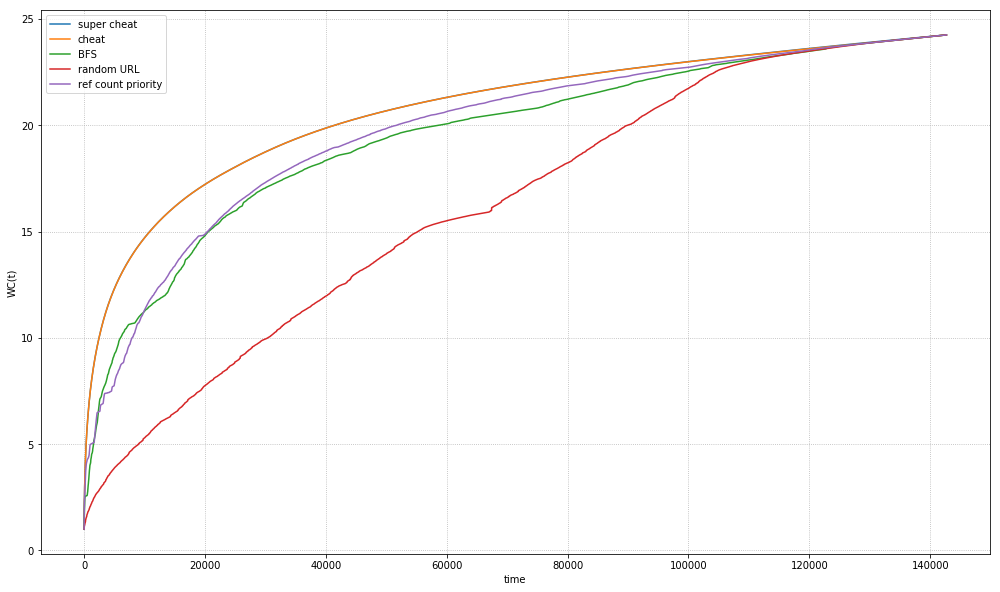

In [103]:
plt.figure(figsize=(17, 10))
plt.plot(np.arange(len(WC_1))+1, WC_1, label='super cheat')
plt.plot(np.arange(len(WC_2))+1, WC_2, label='cheat')
plt.plot(np.arange(len(WC_3))+1, WC_3, label='BFS')
plt.plot(np.arange(len(WC_4))+1, WC_4, label='random URL')
plt.plot(np.arange(len(WC_5))+1, WC_5, label='ref count priority')
plt.legend()
plt.grid(ls=':')
plt.xlabel('time')
plt.ylabel('WC(t)')
plt.show()

In [92]:
len(WC_1), len(WC_2), len(WC_3), len(WC_4), len(WC_5)

(142683, 142683, 142683, 142683, 142683)

Как видно при приоретизации по PageRank получается неотличимый результат от сверхчитерной стратегии

Ожидаемо при приоретизации по количеству ссылок результат лучше чем при BFS